# Adversarial Training for VGG-inspired Networks
## We perform AT on the same architecture changing only activation functions:
* ReLU
* ELU
* Swish
* Random init KAF
* Elu init KAF
* Swish init KAF
* Free dictionary,kb KAF

In [20]:
# If run on Colab: Find out GPU allocated (P100s, T4 reccommended)
import tensorflow as tf
tf.keras.mixed_precision.experimental.set_policy('mixed_float16')

In [2]:
# Install art if absent
!pip install adversarial-robustness-toolbox

     |████████████████████████████████| 655kB 11.1MB/s 
     |████████████████████████████████| 6.8MB 45.3MB/s 
     |████████████████████████████████| 20.8MB 1.4MB/s 
     |████████████████████████████████| 235kB 57.4MB/s 
     |████████████████████████████████| 747kB 51.8MB/s 
  Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1


In [3]:
import numpy as np
import tensorflow as tf

In [4]:
import matplotlib.pyplot as plt
import fbfadvtrain
import activationsf
import tensorflow_addons as tfa

In [5]:
from activationsf import Kaf
from lr_finder import LRFinder

from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Add, Input, ZeroPadding2D, GlobalAveragePooling2D, Dense, Flatten, MaxPooling2D, Dropout
from tensorflow.keras.regularizers import l2 
from tensorflow.keras import Model
from tensorflow import math

regularizer = l2(0.0005)

In [6]:
from tensorflow.keras import layers 
from tensorflow.keras import initializers 
from tensorflow.keras import regularizers 
from tensorflow.keras import losses, optimizers, metrics
from tensorflow.keras import callbacks 
from tensorflow.keras.models import Sequential

In [7]:
from tensorflow.keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

170500096/170498071 [==============================] - 13s 0us/step


In [8]:
# Use tf.data to improve performances
train = tf.data.Dataset.from_tensor_slices((x_train, y_train))
test = tf.data.Dataset.from_tensor_slices((x_test, y_test))

# Data augmentation 
def normalize(img, label):
  img = tf.cast(img, tf.float32)
  return img/255.0, label

# Create generator
AUTOTUNE = tf.data.experimental.AUTOTUNE
train = (
    train
    .shuffle(1000)
    .map(normalize, num_parallel_calls=AUTOTUNE)
    .batch(128)
    .prefetch(AUTOTUNE)
)
test = (
    test
    .shuffle(1000)
    .map(normalize, num_parallel_calls=AUTOTUNE)
    .batch(128)
    .prefetch(AUTOTUNE)
)

In [9]:
def vgg_block(x, filters, activation, kaf=False, ridge=None, moving = False): 

  x = Conv2D(filters, kernel_size=(3, 3),  padding='same', kernel_regularizer = regularizer, kernel_initializer='he_uniform')(x)
  x = BatchNormalization()(x)
  if kaf is not False:
    x = Kaf(D = 20, conv = True, moving = moving, ridge=ridge) (x)
  else:
    x = Activation(activation)(x)

  x = Conv2D(filters, kernel_size=(3, 3),  padding='same', kernel_regularizer = regularizer, kernel_initializer='he_uniform')(x)
  x = BatchNormalization()(x)
  if kaf is not False:
    x = Kaf(D = 20, conv = True, moving = moving, ridge=ridge) (x)
  else:
    x = Activation(activation)(x)
  
  return x

In [10]:
def rob_vgg(act = None, is_kaf = False, ridge=None, moving=False):

  input = Input(shape=(32,32,3)) # padded cifar10 images size

  # BLock1
  x = vgg_block(input, 32, act, is_kaf, ridge, moving)
  x = layers.MaxPooling2D(pool_size=(2,2)) (x)
  x = layers.Dropout(0.2, seed=42) (x)
  
  # Block2
  x = vgg_block(x, 64, act, is_kaf, ridge, moving)
  x = layers.MaxPooling2D(pool_size=(2,2)) (x)
  x = layers.Dropout(0.25, seed=42) (x)

  # Block3
  x = vgg_block(x, 128, act, is_kaf, ridge, moving)
  x = layers.MaxPooling2D(pool_size=(2,2)) (x)
  x = layers.Dropout(0.3, seed=42) (x)

  x = tf.keras.layers.Flatten() (x)
  x = layers.Dense(128, activation=None, kernel_regularizer=regularizers.l2(0.0012)) (x)
  if is_kaf is not False:
    x = Kaf(D = 20, conv = False, moving = moving, ridge=ridge) (x)
  else:
    x = Activation(act)(x)
  x = layers.Dropout(0.4, seed=42) (x)
  x = layers.Dense(10, activation='softmax', kernel_regularizer=regularizers.l2(0.0012)) (x)

  model = fbfadvtrain.FastBetterFreeTrainedModel(inputs=input, outputs=x, name='resnet') # Adv. Training 
  #model = Model(inputs=input, outputs=x, name='vgg') # Standard Training

  return model

### ReLU Case

In [ ]:
# Learning rate range test
# Code from: https://github.com/beringresearch/lrfinder

BATCH = 128
STEPS_PER_EPOCH = np.ceil(len(x_train) / BATCH)


rob_relu_vgg = rob_vgg(act = 'relu', is_kaf = False, ridge=None, moving=False)
rob_relu_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

lr_finder = LRFinder(rob_relu_vgg)
lr_finder.find(train, start_lr=1e-4, end_lr=3, epochs=5,
               steps_per_epoch=STEPS_PER_EPOCH)

Epoch 1/5
391/391 [==============================] - 18s 47ms/step - loss: 3.6071 - sparse_categorical_accuracy: 0.0529
Epoch 2/5
391/391 [==============================] - 19s 48ms/step - loss: 2.8861 - sparse_categorical_accuracy: 0.0992
Epoch 3/5
391/391 [==============================] - 19s 50ms/step - loss: 2.8003 - sparse_categorical_accuracy: 0.1419
Epoch 4/5
391/391 [==============================] - 19s 49ms/step - loss: 2.8041 - sparse_categorical_accuracy: 0.1163
Epoch 5/5
391/391 [==============================] - 19s 48ms/step - loss: 2.6905 - sparse_categorical_accuracy: 0.0980


In [12]:
def plot_loss(n_skip_beginning=10, n_skip_end=5, x_scale='log'):
    """
    Plots the loss.
    Parameters:
        n_skip_beginning - number of batches to skip on the left.
        n_skip_end - number of batches to skip on the right.
        """
    learning_rates = lr_finder.get_learning_rates()
    losses = lr_finder.get_losses()

    f, ax = plt.subplots()
    ax.set_ylabel("loss")
    ax.set_xlabel("learning rate (log scale)")
    ax.plot(learning_rates[n_skip_beginning:-n_skip_end],
            losses[n_skip_beginning:-n_skip_end])
    ax.set_xscale(x_scale)
    return(ax)

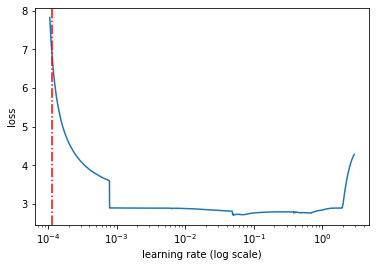

In [ ]:
axs = plot_loss()
axs.axvline(x=lr_finder.get_best_lr(sma=20), c='r', linestyle='-.')

In [ ]:
epochs = 60
step_size = np.ceil((len(x_train) / 128) * (epochs/2))

oclr = tfa.optimizers.TriangularCyclicalLearningRate(initial_learning_rate = 0.0001, maximal_learning_rate = 0.08, step_size = step_size)

rob_relu_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = oclr),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )
history_relu = rob_relu_vgg.fit(x = train, epochs = epochs, batch_size = 128, validation_data = test)

Epoch 1/60
391/391 [==============================] - 19s 49ms/step - loss: 3.2865 - sparse_categorical_accuracy: 0.0770 - val_loss: 2.8808 - val_sparse_categorical_accuracy: 0.0992
Epoch 2/60
391/391 [==============================] - 19s 48ms/step - loss: 2.8740 - sparse_categorical_accuracy: 0.1069 - val_loss: 2.8096 - val_sparse_categorical_accuracy: 0.1508
Epoch 3/60
391/391 [==============================] - 19s 49ms/step - loss: 2.7986 - sparse_categorical_accuracy: 0.1404 - val_loss: 2.5973 - val_sparse_categorical_accuracy: 0.2601
Epoch 4/60
391/391 [==============================] - 19s 49ms/step - loss: 2.6760 - sparse_categorical_accuracy: 0.1744 - val_loss: 2.5132 - val_sparse_categorical_accuracy: 0.3076
Epoch 5/60
391/391 [==============================] - 19s 49ms/step - loss: 2.6123 - sparse_categorical_accuracy: 0.1944 - val_loss: 2.4381 - val_sparse_categorical_accuracy: 0.2780
Epoch 6/60
391/391 [==============================] - 19s 49ms/step - loss: 2.5589 - spars

In [13]:
# plot diagnostic learning curves
def summarize_diagnostics(history, fine_tuning=False):
	
	if fine_tuning :
		color_train = 'green'
		color_validation = 'red'
	else :
		color_train = 'blue'
		color_validation = 'orange'

	# plot loss
	plt.subplot(211)
	plt.title('Cross Entropy Loss')
	plt.plot(history.history['loss'], color=color_train, label='train')
	plt.plot(history.history['val_loss'], color=color_validation, label='test')
	# plot accuracy
	plt.subplot(212)
	plt.title('Classification Accuracy')
	plt.plot(history.history['sparse_categorical_accuracy'], color=color_train, label='train')
	plt.plot(history.history['val_sparse_categorical_accuracy'], color=color_validation, label='test')
	plt.show()
	plt.close()

In [ ]:
summarize_diagnostics(history_relu)

### Elu Case


In [21]:
BATCH = 128
STEPS_PER_EPOCH = np.ceil(len(x_train) / BATCH)


rob_elu_vgg = rob_vgg(act = 'elu', is_kaf = False, ridge=None, moving=False)
rob_elu_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

lr_finder = LRFinder(rob_elu_vgg)
lr_finder.find(train, start_lr=1e-4, end_lr=2, epochs=7,
               steps_per_epoch=STEPS_PER_EPOCH)

Epoch 1/7
391/391 [==============================] - 9s 23ms/step - loss: 7.0450 - sparse_categorical_accuracy: 8.0000e-04
Epoch 2/7
391/391 [==============================] - 9s 23ms/step - loss: 3.3435 - sparse_categorical_accuracy: 0.1483
Epoch 3/7
391/391 [==============================] - 9s 23ms/step - loss: 3.0697 - sparse_categorical_accuracy: 0.2027
Epoch 4/7
391/391 [==============================] - 9s 23ms/step - loss: 2.7755 - sparse_categorical_accuracy: 0.2621
Epoch 5/7
391/391 [==============================] - 9s 23ms/step - loss: 2.4983 - sparse_categorical_accuracy: 0.3022
Epoch 6/7
391/391 [==============================] - 9s 23ms/step - loss: 2.5296 - sparse_categorical_accuracy: 0.2575
Epoch 7/7
391/391 [==============================] - 9s 23ms/step - loss: nan - sparse_categorical_accuracy: 0.2130


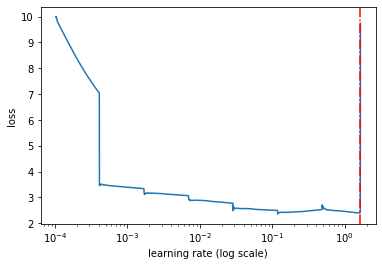

In [22]:
axs = plot_loss()
axs.axvline(x=lr_finder.get_best_lr(sma=20), c='r', linestyle='-.')

In [23]:
epochs = 60
step_size = np.ceil((len(x_train) / 128) * (epochs/2))

oclr = tfa.optimizers.TriangularCyclicalLearningRate(initial_learning_rate = 0.0001, maximal_learning_rate = 0.1, step_size = step_size)

rob_elu_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = oclr),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )
history_elu = rob_elu_vgg.fit(x = train, epochs = epochs, batch_size = 128, validation_data = test)

Epoch 1/60
391/391 [==============================] - 9s 24ms/step - loss: 5.0156 - sparse_categorical_accuracy: 0.0237 - val_loss: 2.8710 - val_sparse_categorical_accuracy: 0.2561
Epoch 2/60
391/391 [==============================] - 9s 23ms/step - loss: 3.1434 - sparse_categorical_accuracy: 0.1657 - val_loss: 2.6170 - val_sparse_categorical_accuracy: 0.3248
Epoch 3/60
391/391 [==============================] - 9s 24ms/step - loss: 2.8861 - sparse_categorical_accuracy: 0.2208 - val_loss: 2.4391 - val_sparse_categorical_accuracy: 0.3858
Epoch 4/60
391/391 [==============================] - 9s 24ms/step - loss: 2.6800 - sparse_categorical_accuracy: 0.2651 - val_loss: 2.3355 - val_sparse_categorical_accuracy: 0.4159
Epoch 5/60
391/391 [==============================] - 9s 24ms/step - loss: 2.5384 - sparse_categorical_accuracy: 0.2945 - val_loss: 2.2460 - val_sparse_categorical_accuracy: 0.4441
Epoch 6/60
391/391 [==============================] - 9s 24ms/step - loss: 2.4506 - sparse_cate

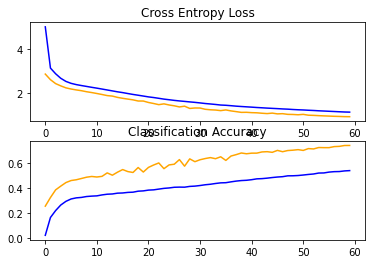

In [24]:
summarize_diagnostics(history_elu)

In [25]:
rob_elu_vgg.save('./rob_elu_vgg')
!zip -r rob_elu_vgg.zip ./rob_elu_vgg
from google.colab import files
files.download('./rob_elu_vgg.zip')

INFO:tensorflow:Assets written to: ./rob_elu_vgg/assets
  adding: rob_elu_vgg/ (stored 0%)
  adding: rob_elu_vgg/variables/ (stored 0%)
  adding: rob_elu_vgg/variables/variables.index (deflated 67%)
  adding: rob_elu_vgg/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: rob_elu_vgg/assets/ (stored 0%)
  adding: rob_elu_vgg/saved_model.pb (deflated 91%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Swish Case

In [ ]:
BATCH = 128
STEPS_PER_EPOCH = np.ceil(len(x_train) / BATCH)


rob_swish_vgg = rob_vgg(act = 'swish', is_kaf = False, ridge=None, moving=False)
rob_swish_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

lr_finder = LRFinder(rob_swish_vgg)
lr_finder.find(train, start_lr=1e-4, end_lr=2, epochs=7,
               steps_per_epoch=STEPS_PER_EPOCH)

Epoch 1/7
391/391 [==============================] - 10s 26ms/step - loss: 5.9372 - sparse_categorical_accuracy: 5.6000e-04
Epoch 2/7
391/391 [==============================] - 10s 26ms/step - loss: 3.1190 - sparse_categorical_accuracy: 0.1091
Epoch 3/7
391/391 [==============================] - 10s 26ms/step - loss: 2.9780 - sparse_categorical_accuracy: 0.1616
Epoch 4/7
391/391 [==============================] - 10s 27ms/step - loss: 2.7199 - sparse_categorical_accuracy: 0.2446
Epoch 5/7
391/391 [==============================] - 10s 27ms/step - loss: 2.4962 - sparse_categorical_accuracy: 0.3041
Epoch 6/7
391/391 [==============================] - 10s 26ms/step - loss: 2.3921 - sparse_categorical_accuracy: 0.2962
Epoch 7/7
391/391 [==============================] - 10s 26ms/step - loss: 2.3123 - sparse_categorical_accuracy: 0.2674


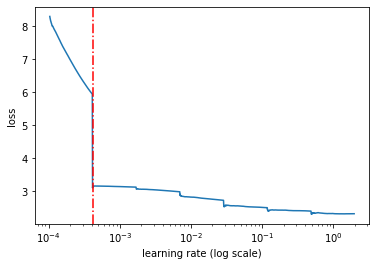

In [ ]:
axs = plot_loss()
axs.axvline(x=lr_finder.get_best_lr(sma=20), c='r', linestyle='-.')

In [ ]:
epochs = 60
step_size = np.ceil((len(x_train) / 128) * (epochs/2))

oclr = tfa.optimizers.TriangularCyclicalLearningRate(initial_learning_rate = 0.0001, maximal_learning_rate = 0.3, step_size = step_size)

rob_swish_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = oclr),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )
history_swish = rob_swish_vgg.fit(x = train, epochs = epochs, batch_size = 128, validation_data = test)

Epoch 1/60
391/391 [==============================] - 11s 27ms/step - loss: 3.9308 - sparse_categorical_accuracy: 0.0089 - val_loss: 3.0285 - val_sparse_categorical_accuracy: 0.1630
Epoch 2/60
391/391 [==============================] - 11s 27ms/step - loss: 3.0044 - sparse_categorical_accuracy: 0.1513 - val_loss: 2.9110 - val_sparse_categorical_accuracy: 0.2243
Epoch 3/60
391/391 [==============================] - 11s 27ms/step - loss: 2.8368 - sparse_categorical_accuracy: 0.2221 - val_loss: 2.6492 - val_sparse_categorical_accuracy: 0.3353
Epoch 4/60
391/391 [==============================] - 11s 27ms/step - loss: 2.6750 - sparse_categorical_accuracy: 0.2629 - val_loss: 2.4673 - val_sparse_categorical_accuracy: 0.3803
Epoch 5/60
391/391 [==============================] - 11s 27ms/step - loss: 2.5493 - sparse_categorical_accuracy: 0.2846 - val_loss: 2.3353 - val_sparse_categorical_accuracy: 0.4206
Epoch 6/60
391/391 [==============================] - 11s 27ms/step - loss: 2.4614 - spars

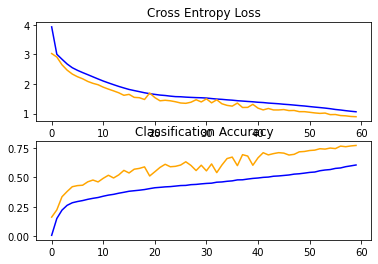

In [ ]:
summarize_diagnostics(history_swish)

In [ ]:
rob_swish_vgg.save('./rob_swish_vgg')
!zip -r rob_swish_vgg.zip ./rob_swish_vgg
from google.colab import files
files.download('./rob_swish_vgg.zip')

INFO:tensorflow:Assets written to: ./rob_swish_vgg/assets
  adding: rob_swish_vgg/ (stored 0%)
  adding: rob_swish_vgg/variables/ (stored 0%)
  adding: rob_swish_vgg/variables/variables.index (deflated 67%)
  adding: rob_swish_vgg/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: rob_swish_vgg/assets/ (stored 0%)
  adding: rob_swish_vgg/saved_model.pb (deflated 91%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Kaf Case

In [11]:
BATCH = 128
STEPS_PER_EPOCH = np.ceil(len(x_train) / BATCH)


rob_kaf_vgg = rob_vgg(act = None, is_kaf = True, ridge=None, moving=False)
rob_kaf_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

lr_finder = LRFinder(rob_kaf_vgg)
lr_finder.find(train, start_lr=1e-4, end_lr=2, epochs=7,
               steps_per_epoch=STEPS_PER_EPOCH)

Epoch 1/7
391/391 [==============================] - 76s 194ms/step - loss: 3.0742 - sparse_categorical_accuracy: 0.0797
Epoch 2/7
391/391 [==============================] - 77s 196ms/step - loss: 3.0660 - sparse_categorical_accuracy: 0.1010
Epoch 3/7
391/391 [==============================] - 77s 196ms/step - loss: 3.0630 - sparse_categorical_accuracy: 0.1006
Epoch 4/7
391/391 [==============================] - 77s 197ms/step - loss: 3.0541 - sparse_categorical_accuracy: 0.1006
Epoch 5/7
391/391 [==============================] - 77s 197ms/step - loss: 3.0235 - sparse_categorical_accuracy: 0.1011
Epoch 6/7
391/391 [==============================] - 77s 197ms/step - loss: 2.7779 - sparse_categorical_accuracy: 0.1610
Epoch 7/7
391/391 [==============================] - 77s 196ms/step - loss: 2.2694 - sparse_categorical_accuracy: 0.2564


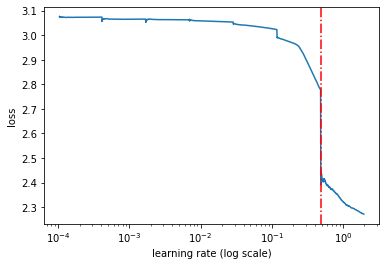

In [15]:
axs = plot_loss()
axs.axvline(x=lr_finder.get_best_lr(sma=20), c='r', linestyle='-.')

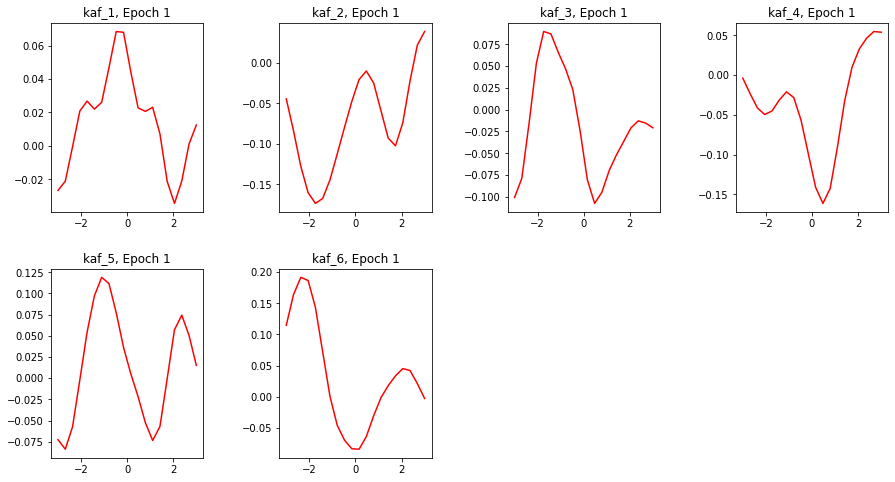

Epoch 1/60
391/391 [==============================] - 79s 202ms/step - loss: 3.0584 - sparse_categorical_accuracy: 0.0879 - val_loss: 3.0378 - val_sparse_categorical_accuracy: 0.1058


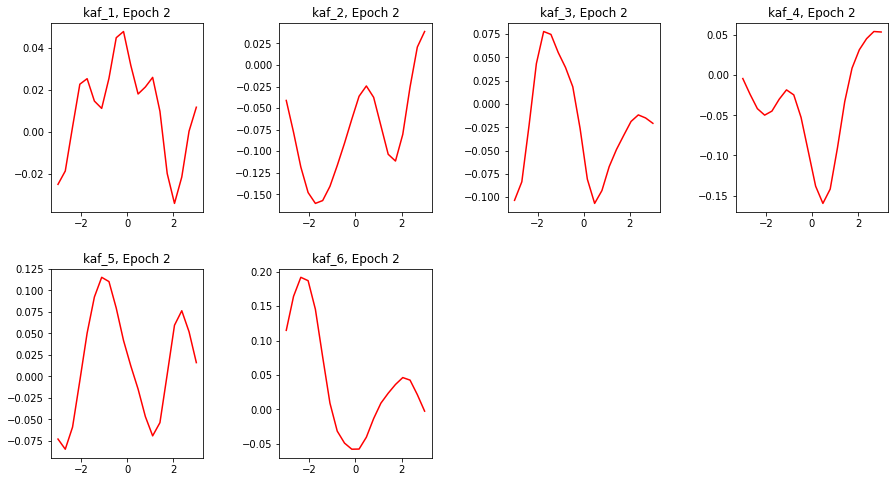

Epoch 2/60
391/391 [==============================] - 79s 202ms/step - loss: 3.0156 - sparse_categorical_accuracy: 0.0995 - val_loss: 2.9863 - val_sparse_categorical_accuracy: 0.1002


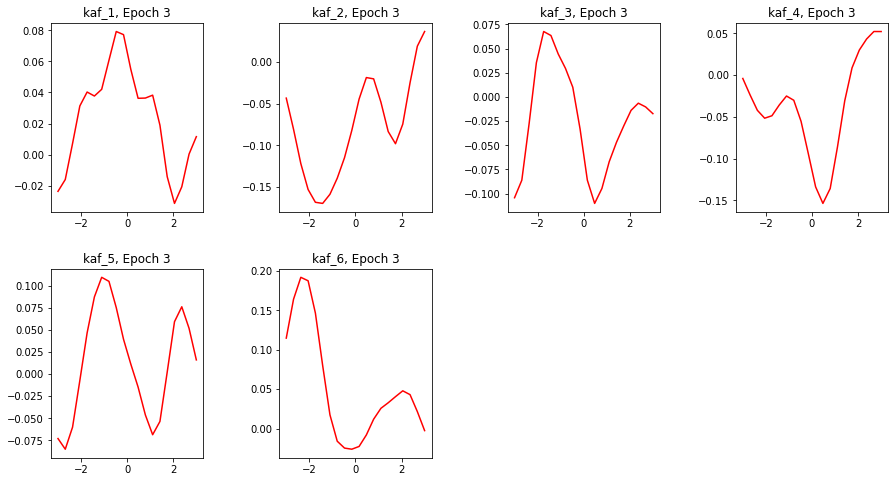

Epoch 3/60
391/391 [==============================] - 79s 202ms/step - loss: 2.9526 - sparse_categorical_accuracy: 0.1000 - val_loss: 2.9146 - val_sparse_categorical_accuracy: 0.1000


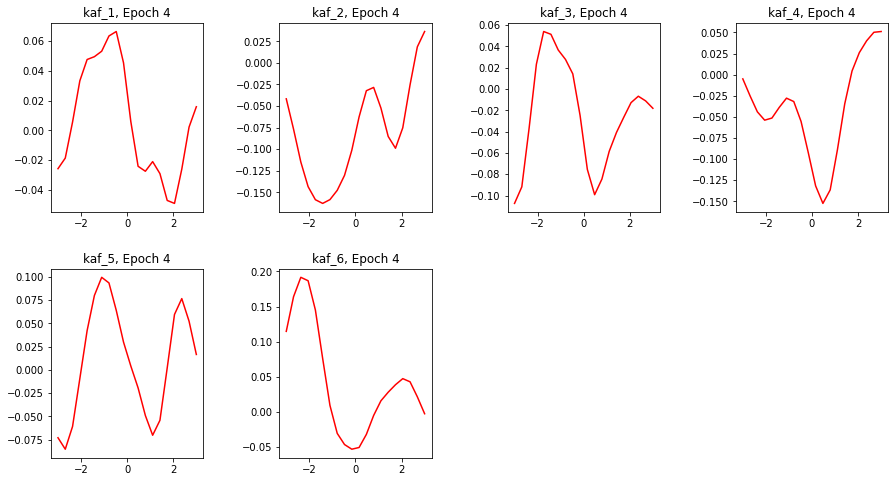

Epoch 4/60
391/391 [==============================] - 79s 202ms/step - loss: 2.8287 - sparse_categorical_accuracy: 0.1298 - val_loss: 2.5624 - val_sparse_categorical_accuracy: 0.2310


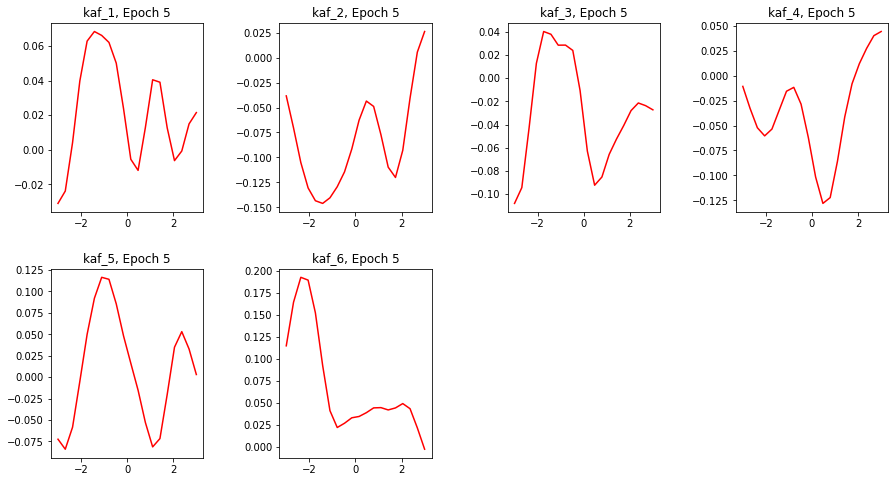

Epoch 5/60
391/391 [==============================] - 79s 202ms/step - loss: 2.4022 - sparse_categorical_accuracy: 0.2495 - val_loss: 2.2320 - val_sparse_categorical_accuracy: 0.3485


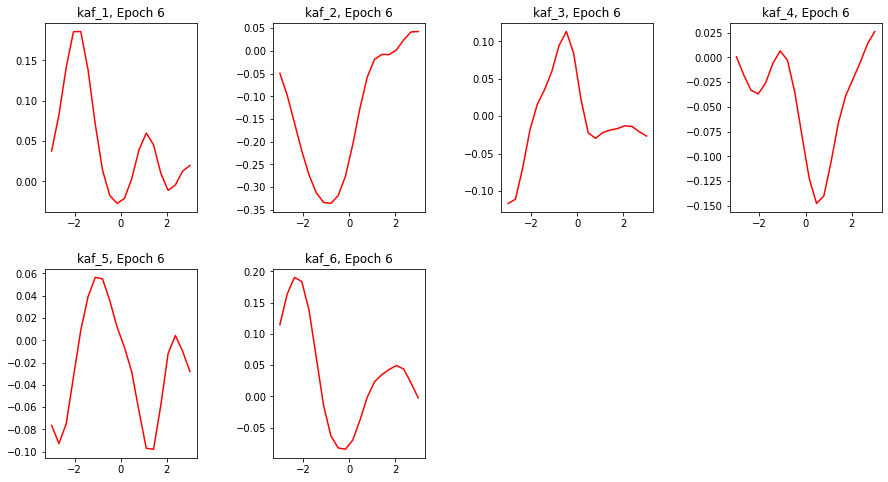

Epoch 6/60
391/391 [==============================] - 79s 202ms/step - loss: 2.1580 - sparse_categorical_accuracy: 0.3090 - val_loss: 2.0903 - val_sparse_categorical_accuracy: 0.3792


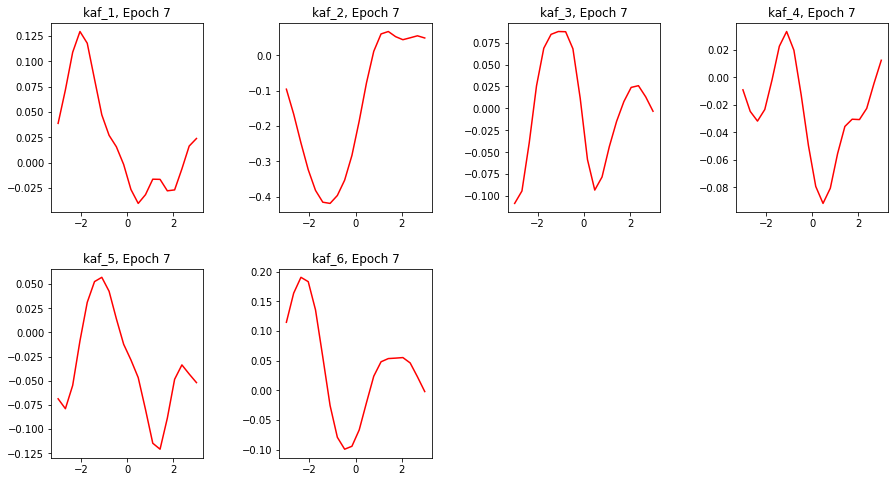

Epoch 7/60
391/391 [==============================] - 79s 202ms/step - loss: 2.0088 - sparse_categorical_accuracy: 0.3345 - val_loss: 1.7754 - val_sparse_categorical_accuracy: 0.4802


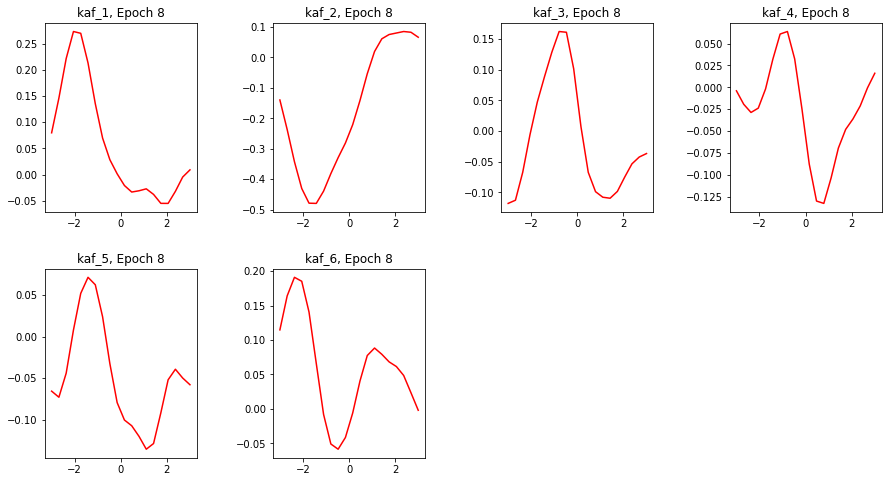

Epoch 8/60
391/391 [==============================] - 79s 202ms/step - loss: 1.8927 - sparse_categorical_accuracy: 0.3519 - val_loss: 1.6889 - val_sparse_categorical_accuracy: 0.5113


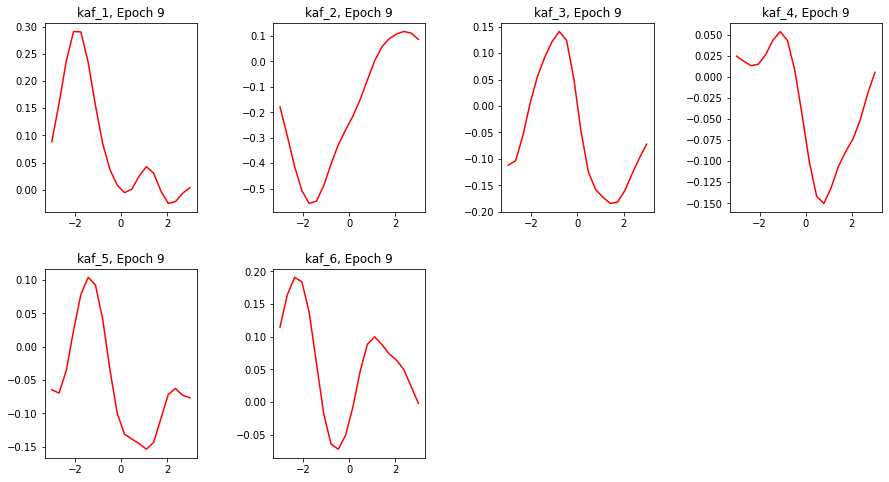

Epoch 9/60
391/391 [==============================] - 79s 202ms/step - loss: 1.8028 - sparse_categorical_accuracy: 0.3649 - val_loss: 1.6485 - val_sparse_categorical_accuracy: 0.4847


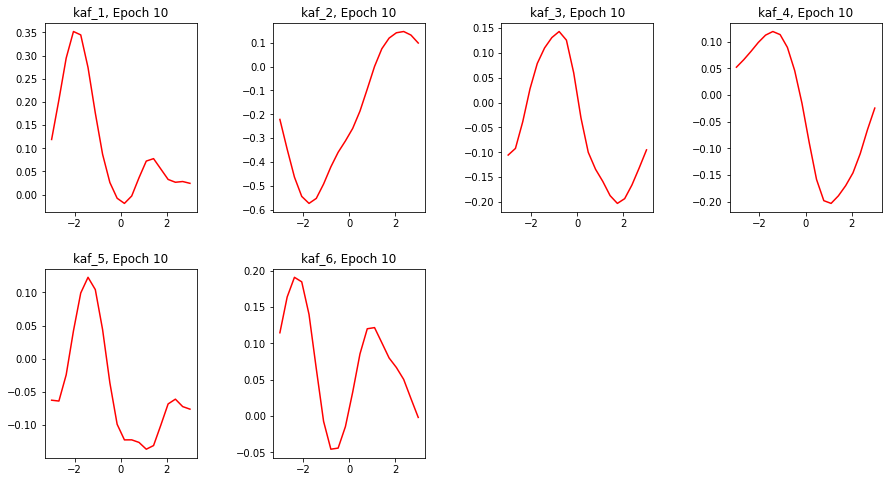

Epoch 10/60
391/391 [==============================] - 79s 202ms/step - loss: 1.7311 - sparse_categorical_accuracy: 0.3723 - val_loss: 1.5025 - val_sparse_categorical_accuracy: 0.5358


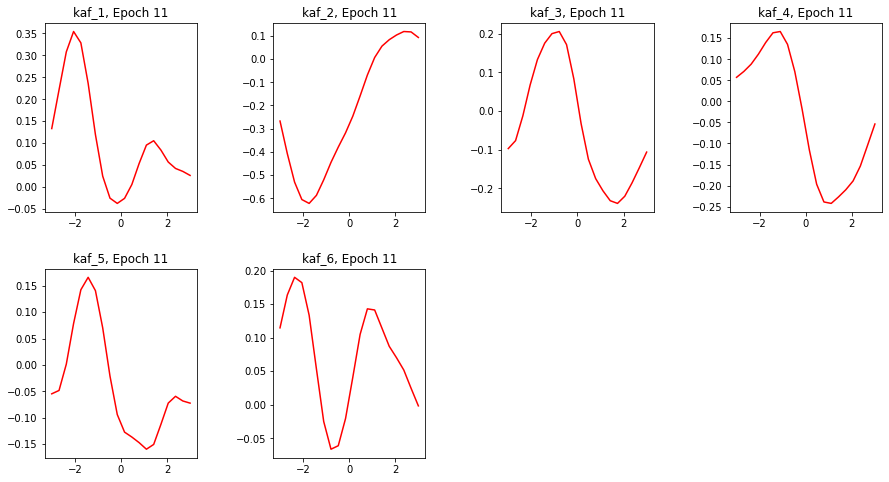

Epoch 11/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6784 - sparse_categorical_accuracy: 0.3844 - val_loss: 1.4889 - val_sparse_categorical_accuracy: 0.5372


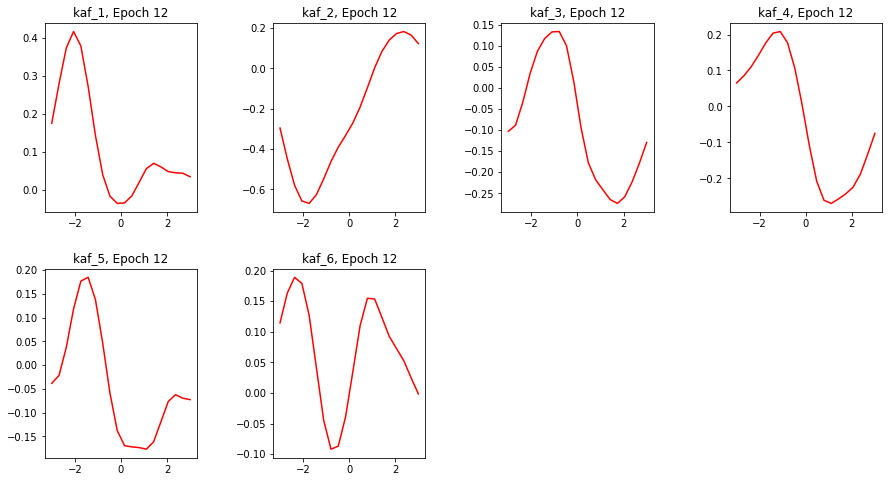

Epoch 12/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6351 - sparse_categorical_accuracy: 0.3896 - val_loss: 1.5000 - val_sparse_categorical_accuracy: 0.5345


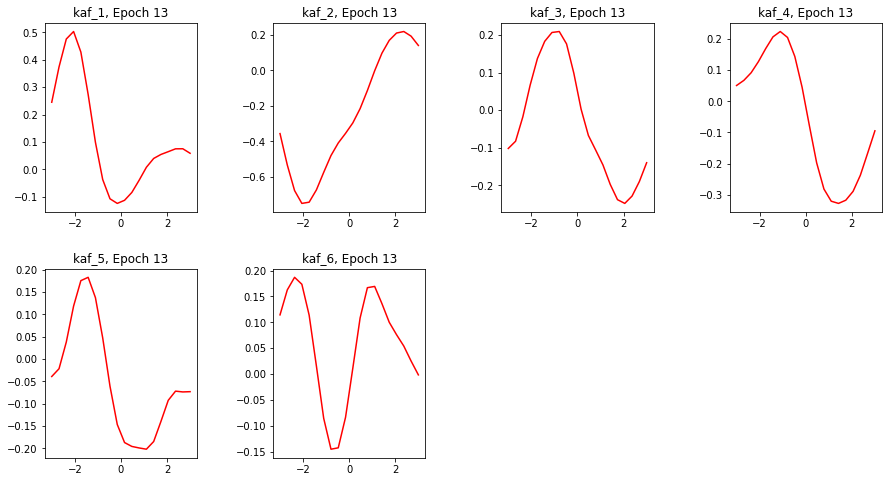

Epoch 13/60
391/391 [==============================] - 80s 204ms/step - loss: 1.6072 - sparse_categorical_accuracy: 0.3952 - val_loss: 1.4050 - val_sparse_categorical_accuracy: 0.5636


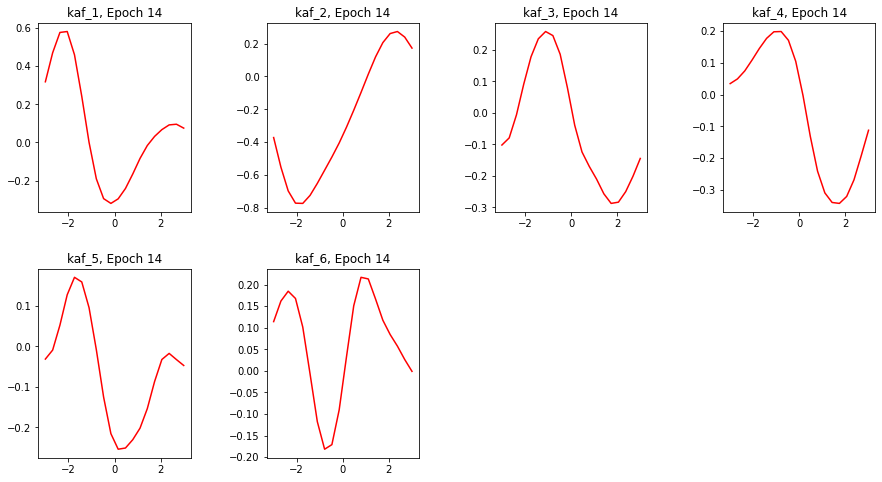

Epoch 14/60
391/391 [==============================] - 80s 204ms/step - loss: 1.5845 - sparse_categorical_accuracy: 0.4026 - val_loss: 1.3661 - val_sparse_categorical_accuracy: 0.5902


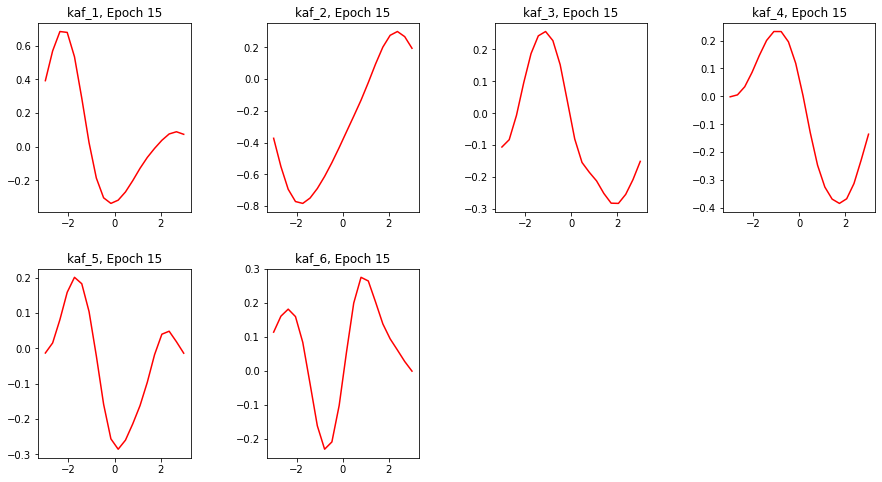

Epoch 15/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5664 - sparse_categorical_accuracy: 0.4110 - val_loss: 1.4529 - val_sparse_categorical_accuracy: 0.5514


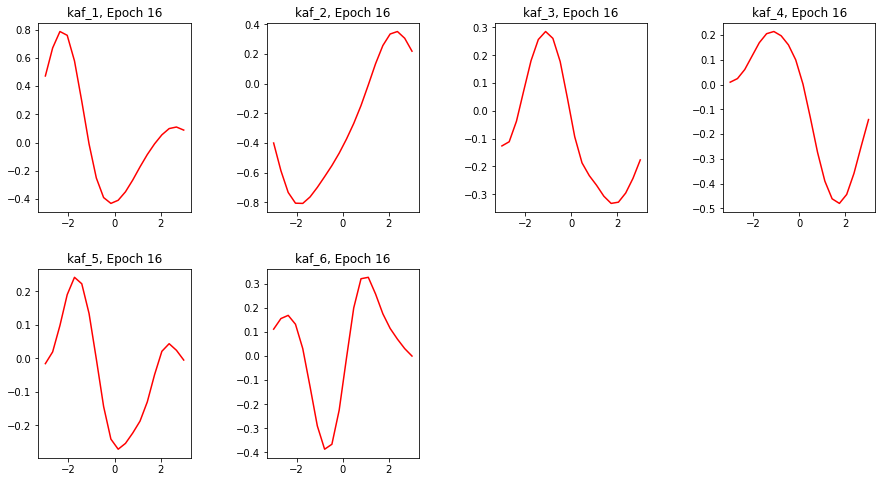

Epoch 16/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5586 - sparse_categorical_accuracy: 0.4148 - val_loss: 1.4251 - val_sparse_categorical_accuracy: 0.5661


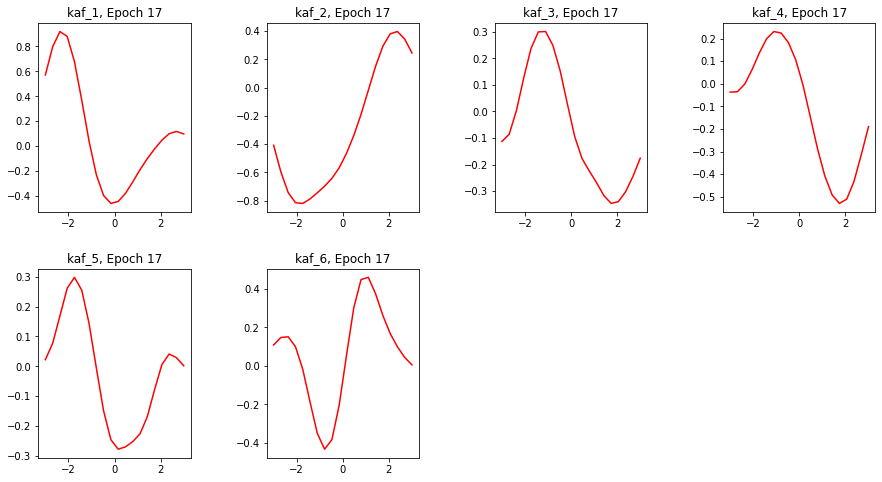

Epoch 17/60
391/391 [==============================] - 80s 204ms/step - loss: 1.5513 - sparse_categorical_accuracy: 0.4176 - val_loss: 1.4904 - val_sparse_categorical_accuracy: 0.5638


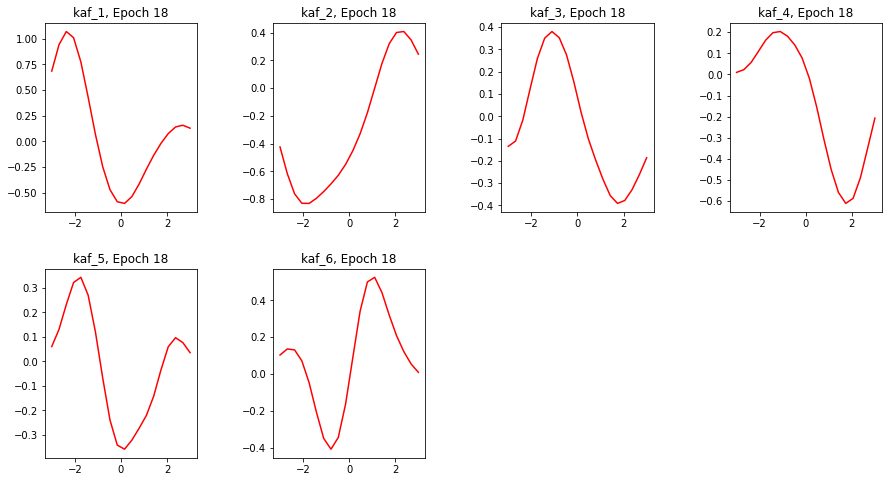

Epoch 18/60
391/391 [==============================] - 80s 204ms/step - loss: 1.5529 - sparse_categorical_accuracy: 0.4209 - val_loss: 1.6103 - val_sparse_categorical_accuracy: 0.4659


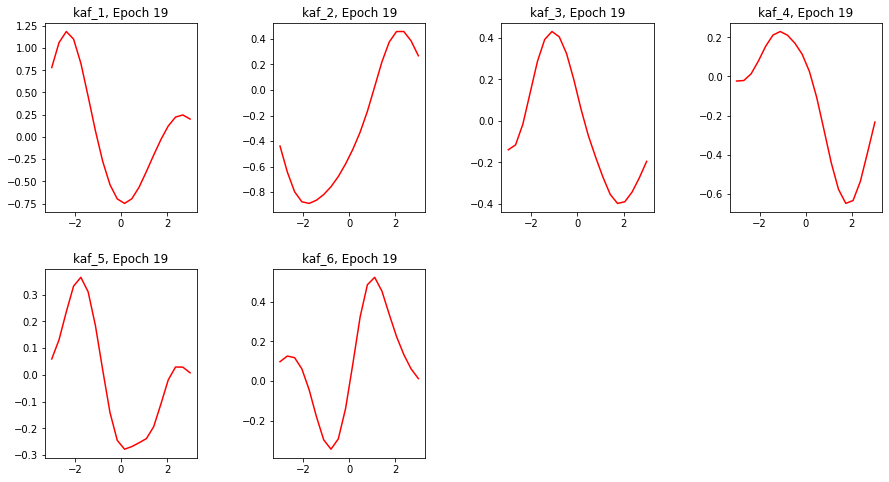

Epoch 19/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5510 - sparse_categorical_accuracy: 0.4240 - val_loss: 1.4543 - val_sparse_categorical_accuracy: 0.6035


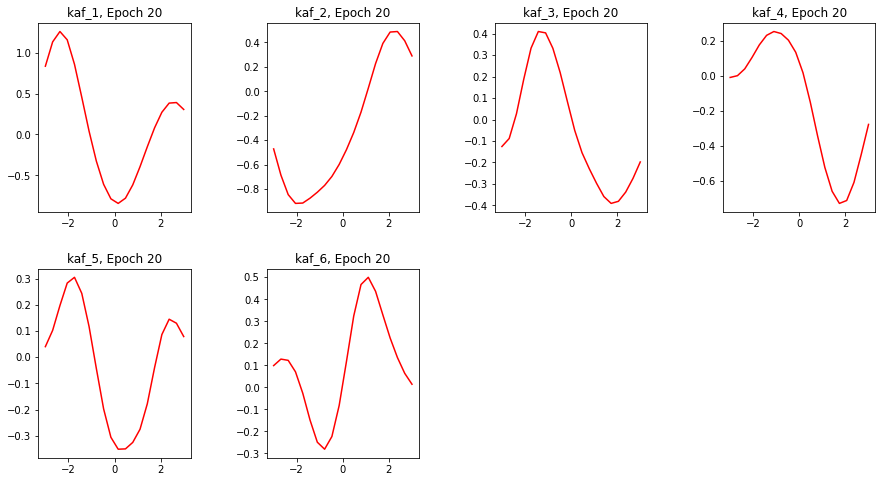

Epoch 20/60
391/391 [==============================] - 80s 204ms/step - loss: 1.5485 - sparse_categorical_accuracy: 0.4271 - val_loss: 1.4137 - val_sparse_categorical_accuracy: 0.5597


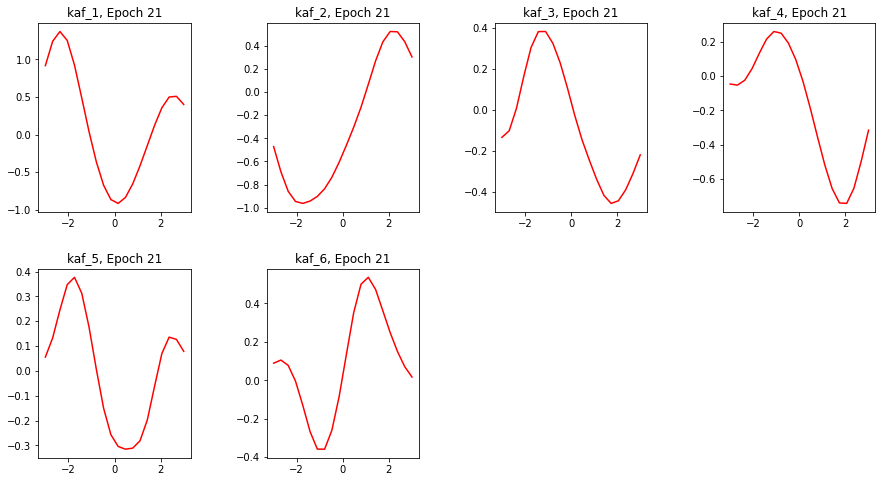

Epoch 21/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5565 - sparse_categorical_accuracy: 0.4281 - val_loss: 1.4155 - val_sparse_categorical_accuracy: 0.5737


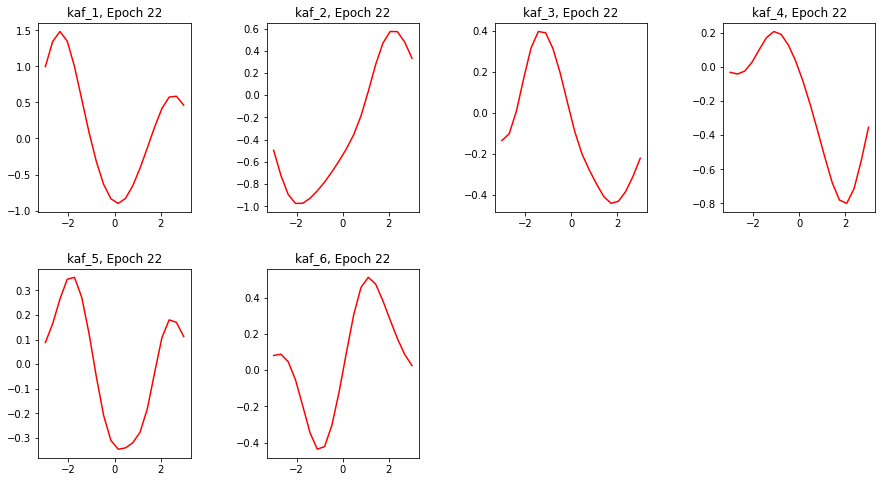

Epoch 22/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5627 - sparse_categorical_accuracy: 0.4277 - val_loss: 1.4986 - val_sparse_categorical_accuracy: 0.5416


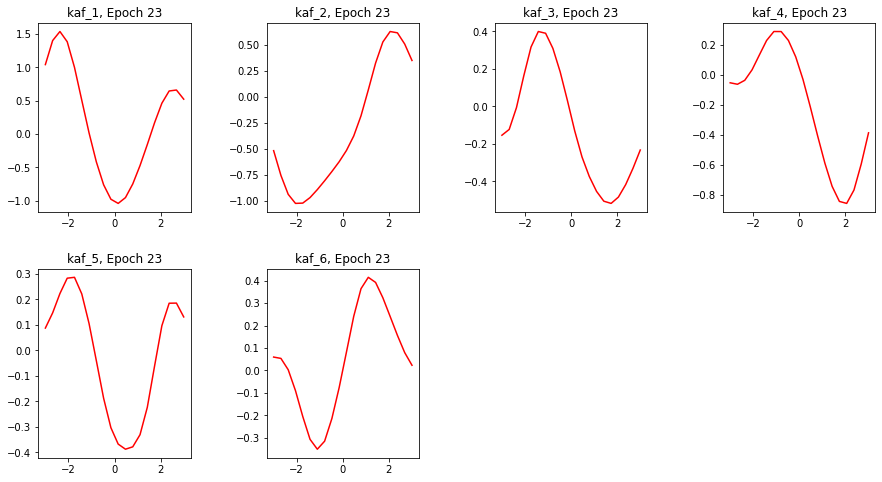

Epoch 23/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5702 - sparse_categorical_accuracy: 0.4307 - val_loss: 1.4759 - val_sparse_categorical_accuracy: 0.5889


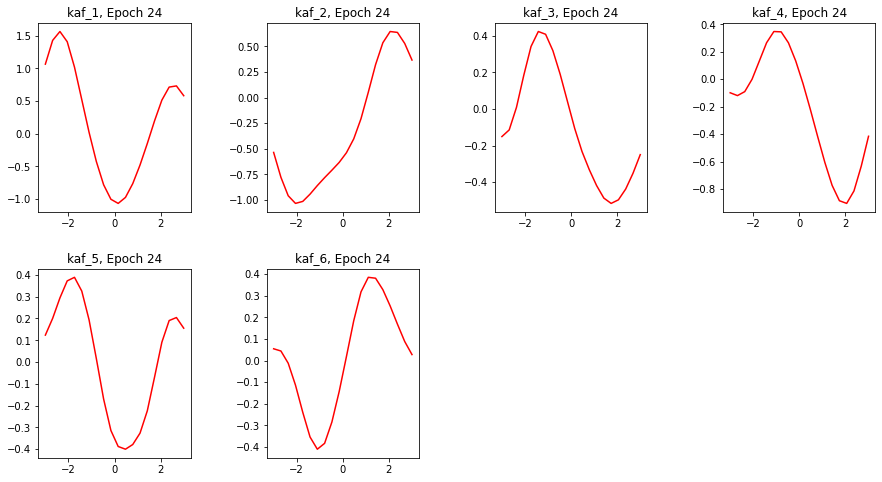

Epoch 24/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5722 - sparse_categorical_accuracy: 0.4308 - val_loss: 1.5743 - val_sparse_categorical_accuracy: 0.5135


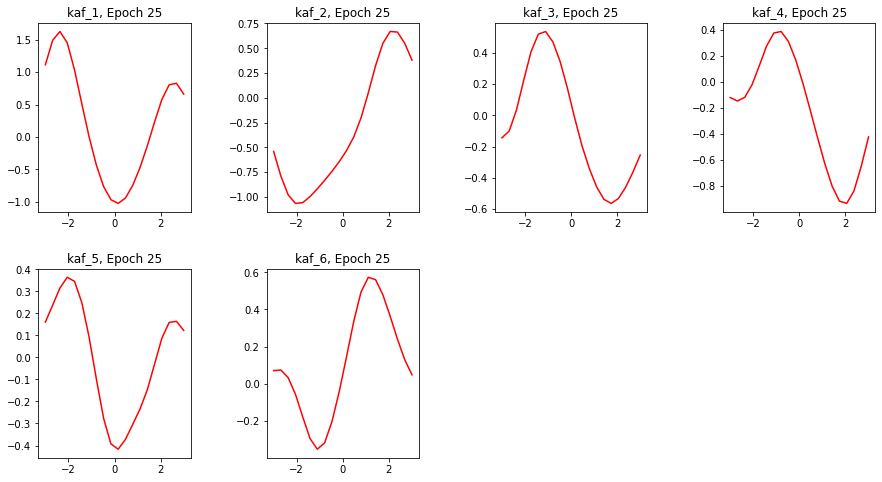

Epoch 25/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5794 - sparse_categorical_accuracy: 0.4290 - val_loss: 1.4638 - val_sparse_categorical_accuracy: 0.5763


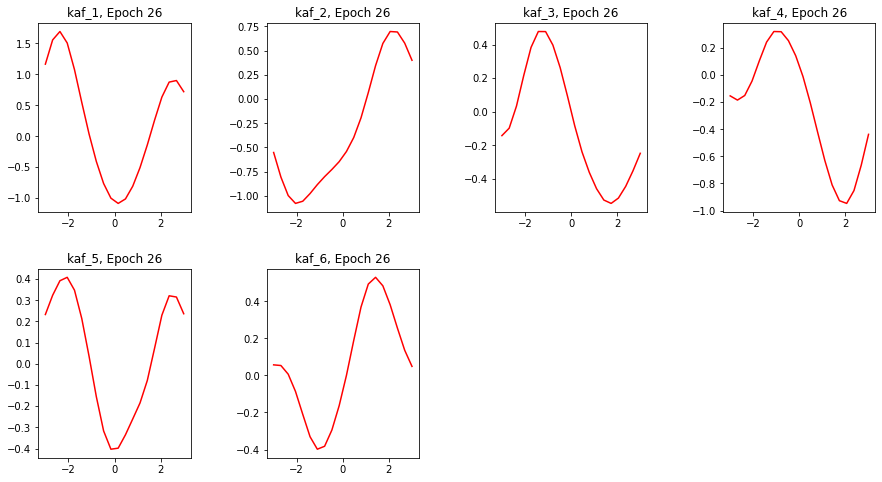

Epoch 26/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5861 - sparse_categorical_accuracy: 0.4287 - val_loss: 1.5999 - val_sparse_categorical_accuracy: 0.5147


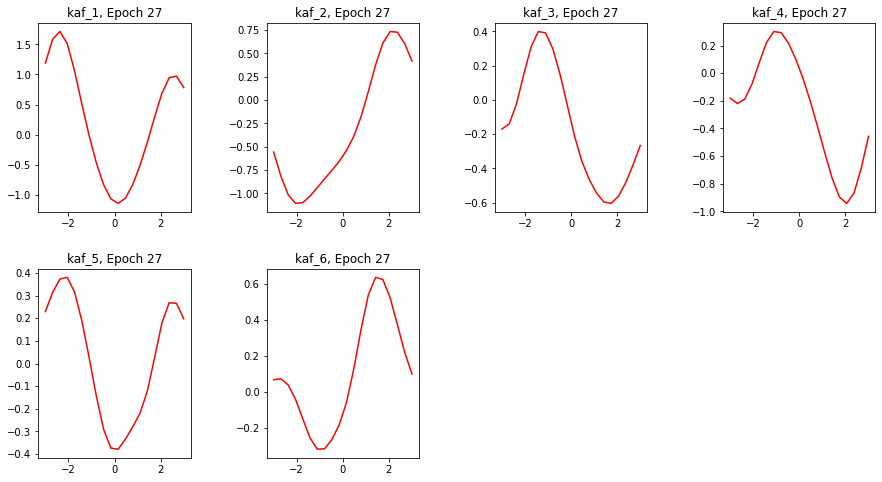

Epoch 27/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5966 - sparse_categorical_accuracy: 0.4253 - val_loss: 1.4217 - val_sparse_categorical_accuracy: 0.6041


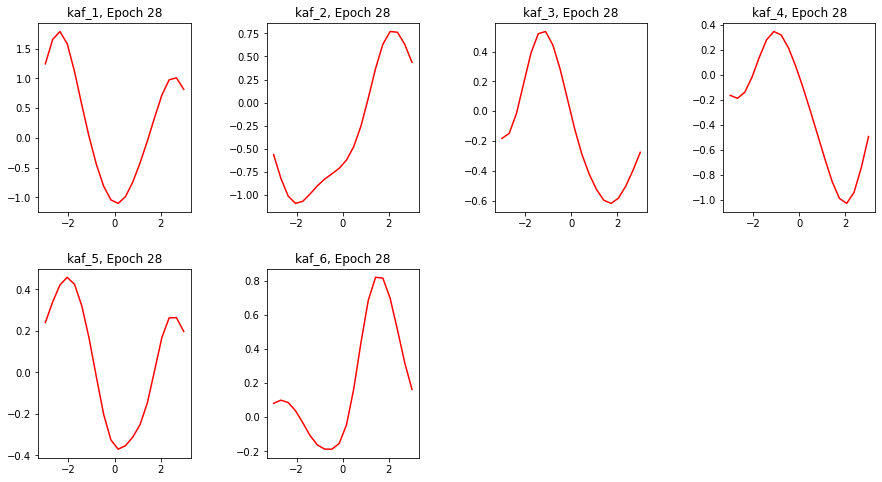

Epoch 28/60
391/391 [==============================] - 79s 203ms/step - loss: 1.6006 - sparse_categorical_accuracy: 0.4256 - val_loss: 1.5133 - val_sparse_categorical_accuracy: 0.5691


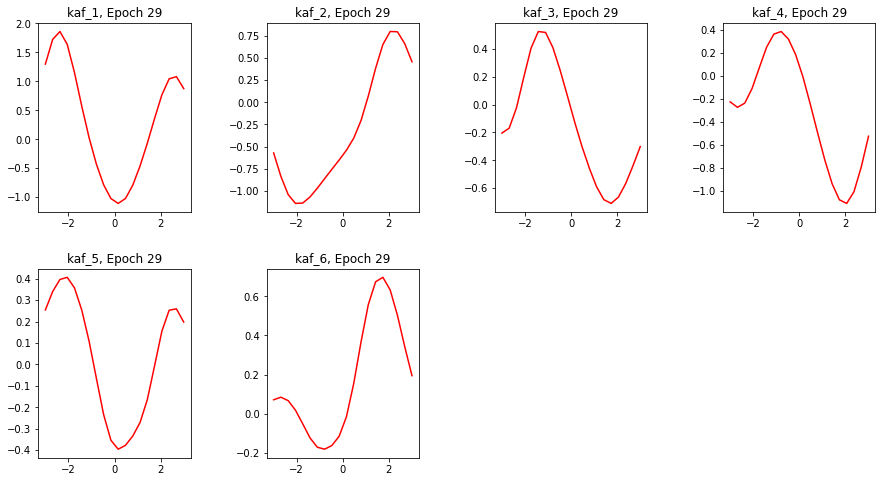

Epoch 29/60
391/391 [==============================] - 79s 203ms/step - loss: 1.6040 - sparse_categorical_accuracy: 0.4261 - val_loss: 1.6165 - val_sparse_categorical_accuracy: 0.5144


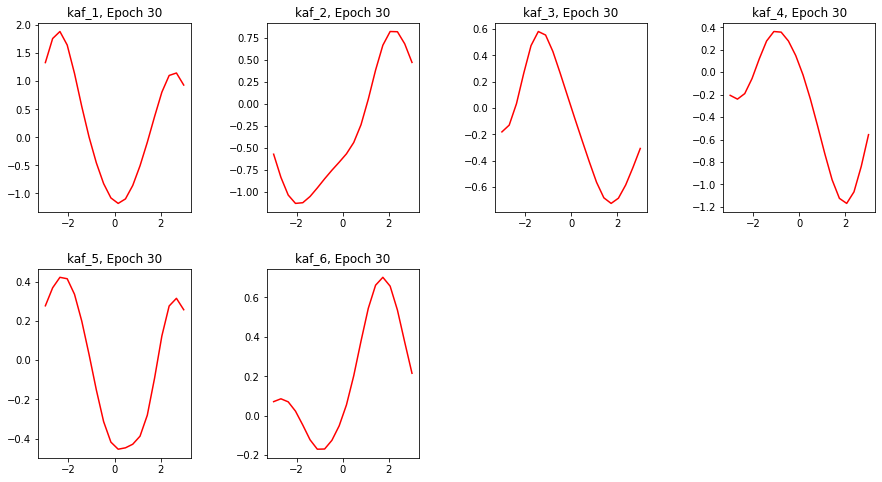

Epoch 30/60
391/391 [==============================] - 79s 203ms/step - loss: 1.6102 - sparse_categorical_accuracy: 0.4263 - val_loss: 1.7030 - val_sparse_categorical_accuracy: 0.4839


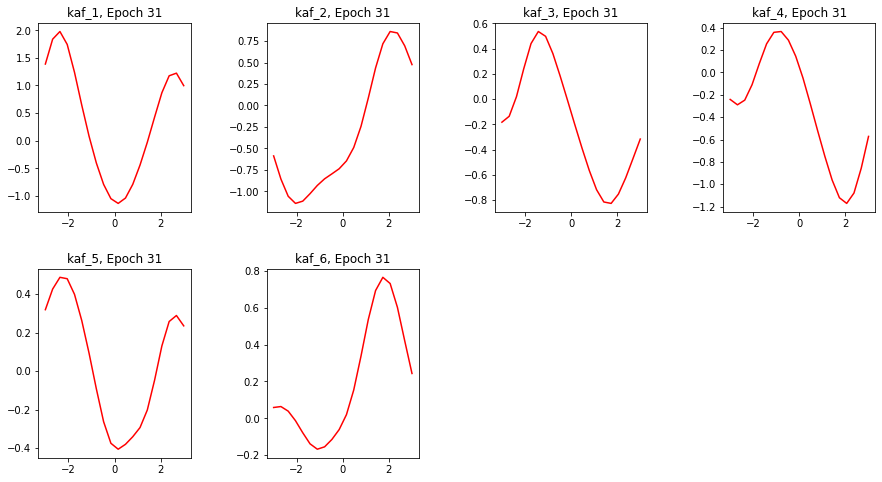

Epoch 31/60
391/391 [==============================] - 79s 203ms/step - loss: 1.6033 - sparse_categorical_accuracy: 0.4284 - val_loss: 1.6040 - val_sparse_categorical_accuracy: 0.4829


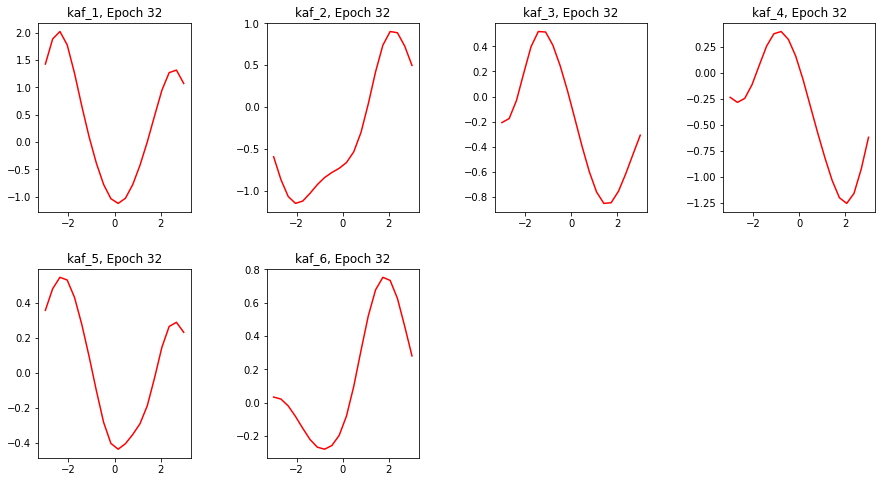

Epoch 32/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5917 - sparse_categorical_accuracy: 0.4291 - val_loss: 1.4724 - val_sparse_categorical_accuracy: 0.5890


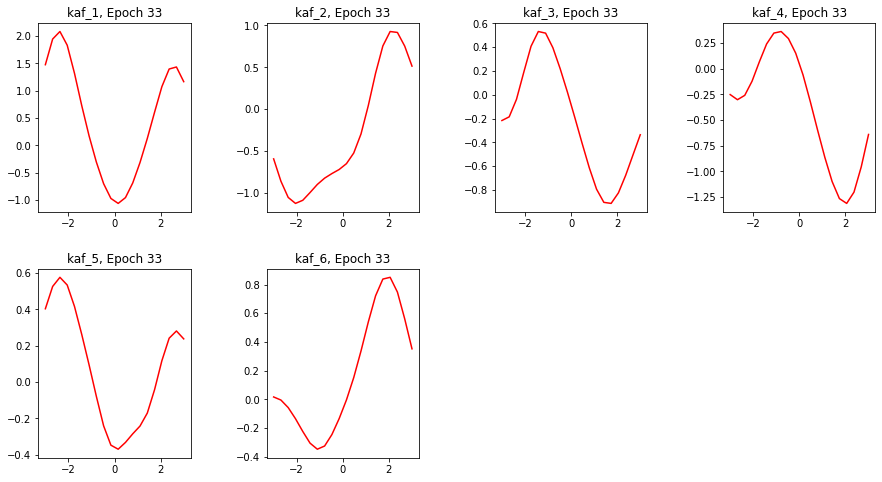

Epoch 33/60
391/391 [==============================] - 80s 203ms/step - loss: 1.5731 - sparse_categorical_accuracy: 0.4393 - val_loss: 1.7384 - val_sparse_categorical_accuracy: 0.4292


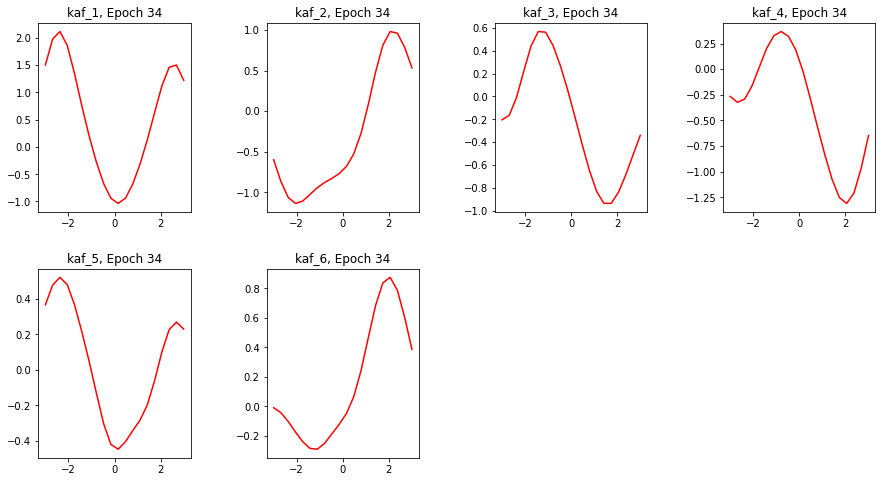

Epoch 34/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5571 - sparse_categorical_accuracy: 0.4416 - val_loss: 1.5991 - val_sparse_categorical_accuracy: 0.4991


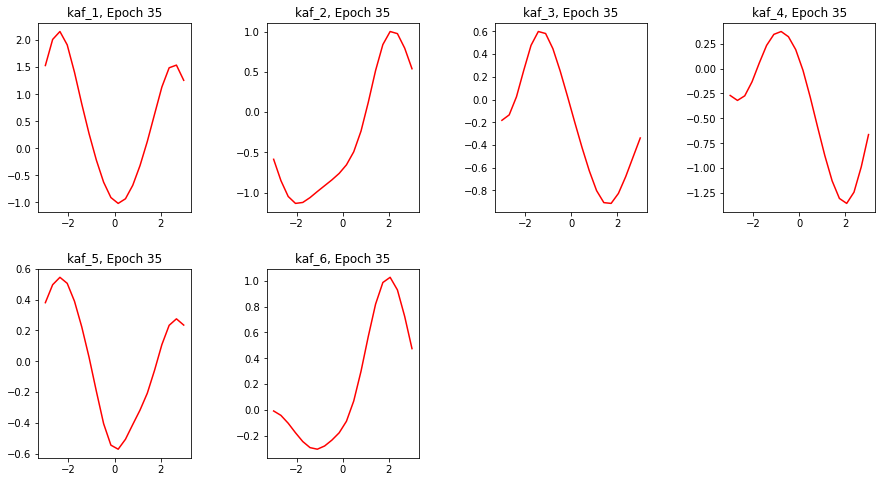

Epoch 35/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5424 - sparse_categorical_accuracy: 0.4443 - val_loss: 1.4829 - val_sparse_categorical_accuracy: 0.5622


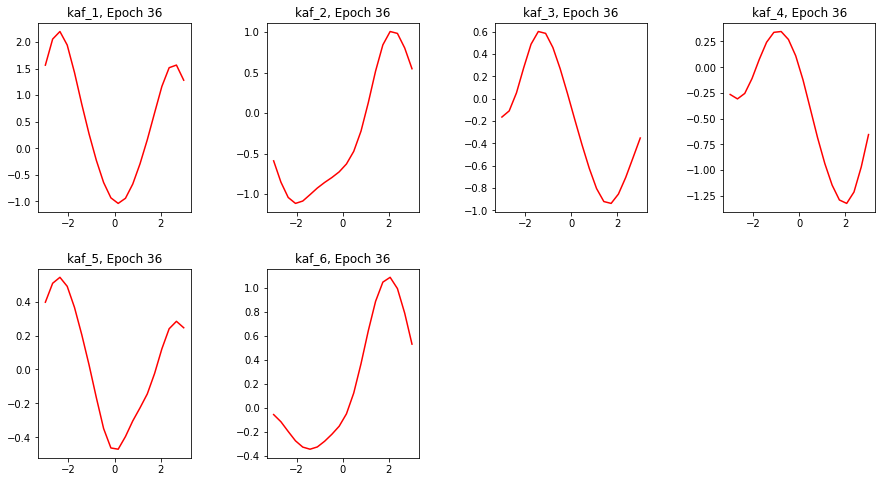

Epoch 36/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5235 - sparse_categorical_accuracy: 0.4510 - val_loss: 1.4934 - val_sparse_categorical_accuracy: 0.5789


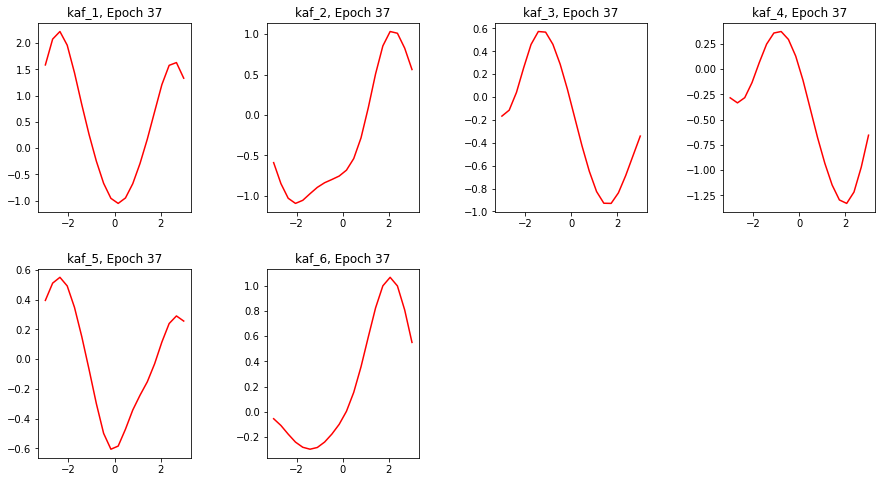

Epoch 37/60
391/391 [==============================] - 79s 203ms/step - loss: 1.5139 - sparse_categorical_accuracy: 0.4540 - val_loss: 1.5473 - val_sparse_categorical_accuracy: 0.5739


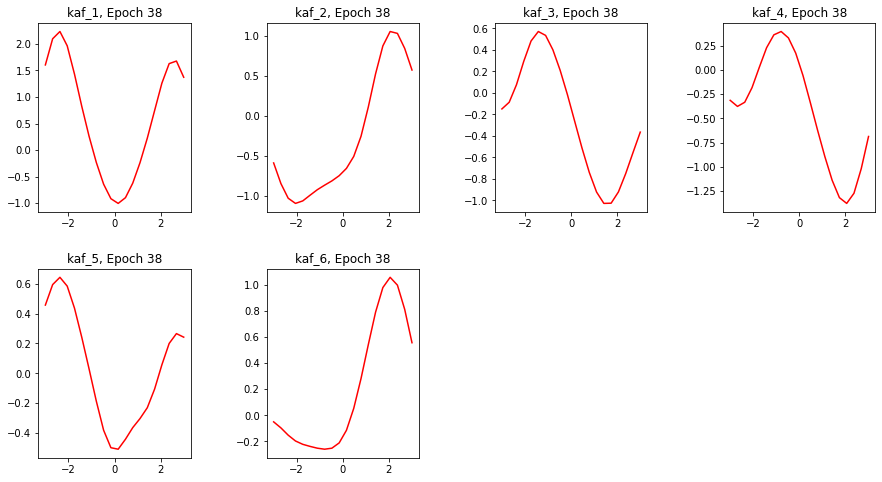

Epoch 38/60
391/391 [==============================] - 79s 203ms/step - loss: 1.4979 - sparse_categorical_accuracy: 0.4615 - val_loss: 1.6218 - val_sparse_categorical_accuracy: 0.5317


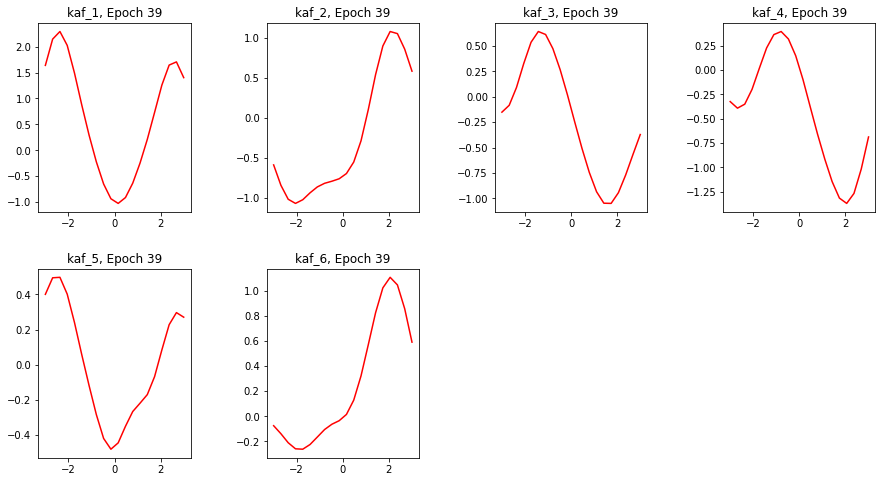

Epoch 39/60
391/391 [==============================] - 79s 203ms/step - loss: 1.4855 - sparse_categorical_accuracy: 0.4654 - val_loss: 1.3177 - val_sparse_categorical_accuracy: 0.6275


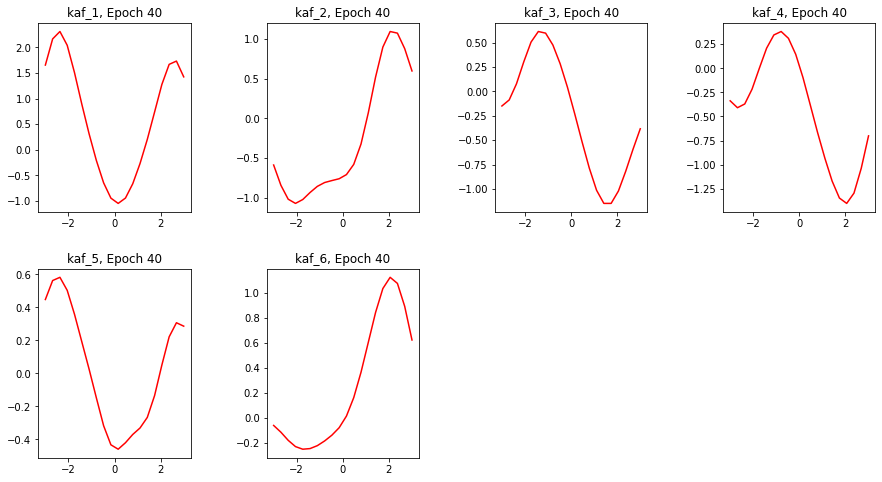

Epoch 40/60
391/391 [==============================] - 79s 203ms/step - loss: 1.4667 - sparse_categorical_accuracy: 0.4697 - val_loss: 1.3331 - val_sparse_categorical_accuracy: 0.6294


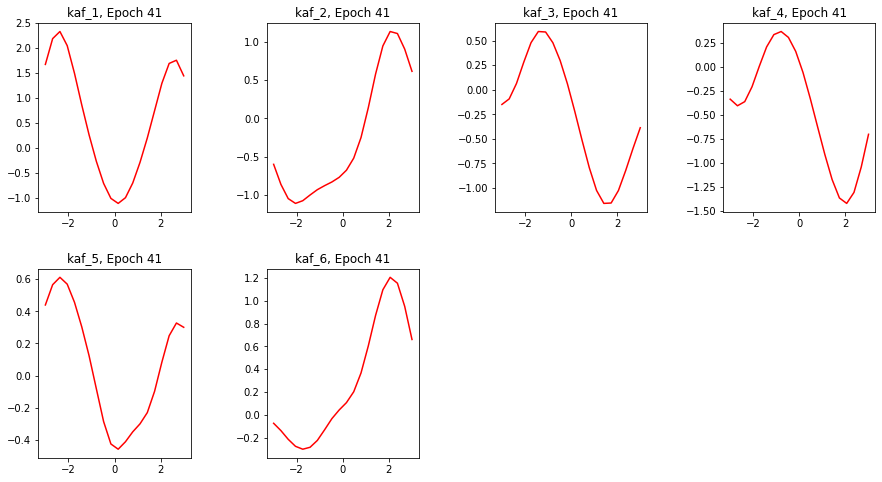

Epoch 41/60
391/391 [==============================] - 79s 203ms/step - loss: 1.4479 - sparse_categorical_accuracy: 0.4758 - val_loss: 1.3419 - val_sparse_categorical_accuracy: 0.6212


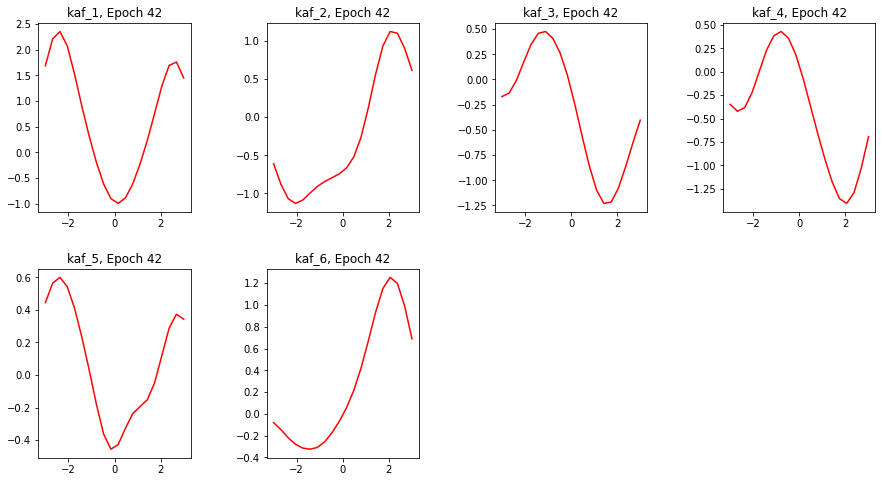

Epoch 42/60
391/391 [==============================] - 79s 203ms/step - loss: 1.4323 - sparse_categorical_accuracy: 0.4824 - val_loss: 1.2783 - val_sparse_categorical_accuracy: 0.6466


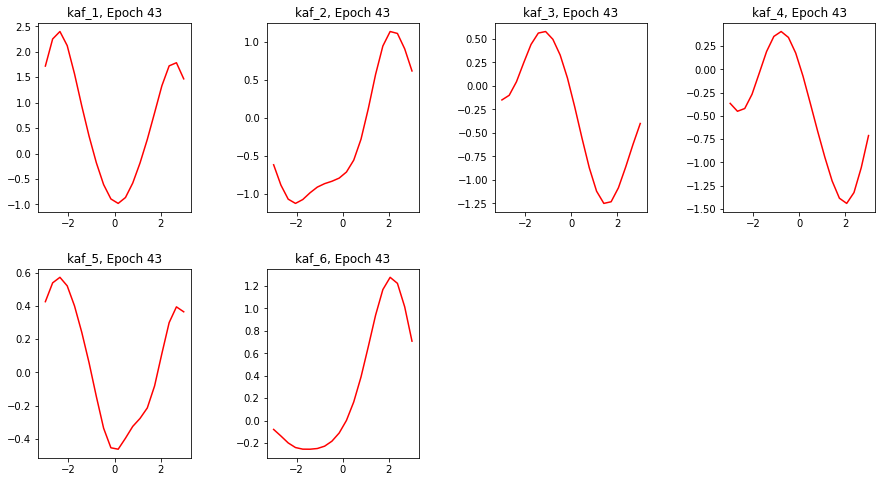

Epoch 43/60
391/391 [==============================] - 79s 203ms/step - loss: 1.4128 - sparse_categorical_accuracy: 0.4870 - val_loss: 1.4752 - val_sparse_categorical_accuracy: 0.5674


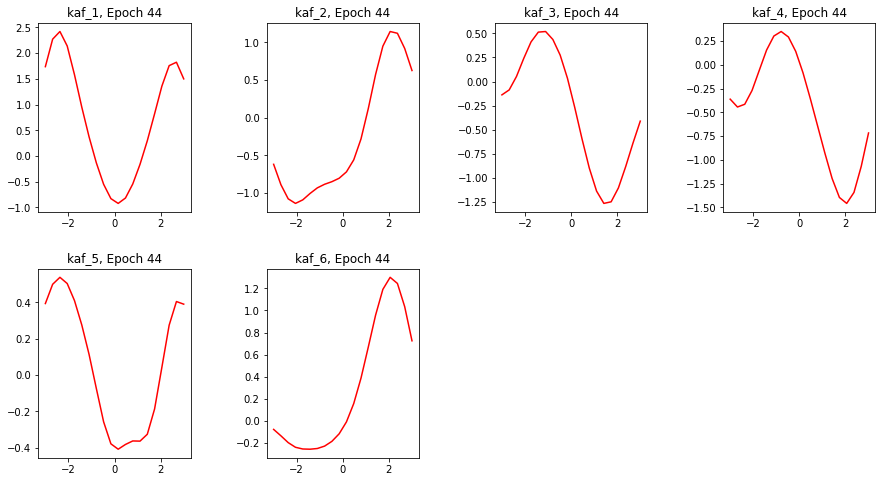

Epoch 44/60
391/391 [==============================] - 79s 203ms/step - loss: 1.3978 - sparse_categorical_accuracy: 0.4906 - val_loss: 1.2929 - val_sparse_categorical_accuracy: 0.6503


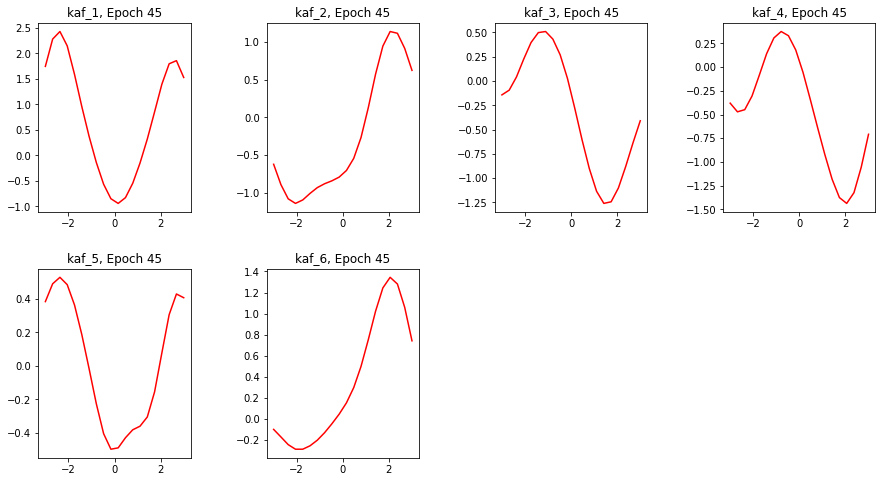

Epoch 45/60
391/391 [==============================] - 79s 203ms/step - loss: 1.3807 - sparse_categorical_accuracy: 0.4972 - val_loss: 1.2649 - val_sparse_categorical_accuracy: 0.6437


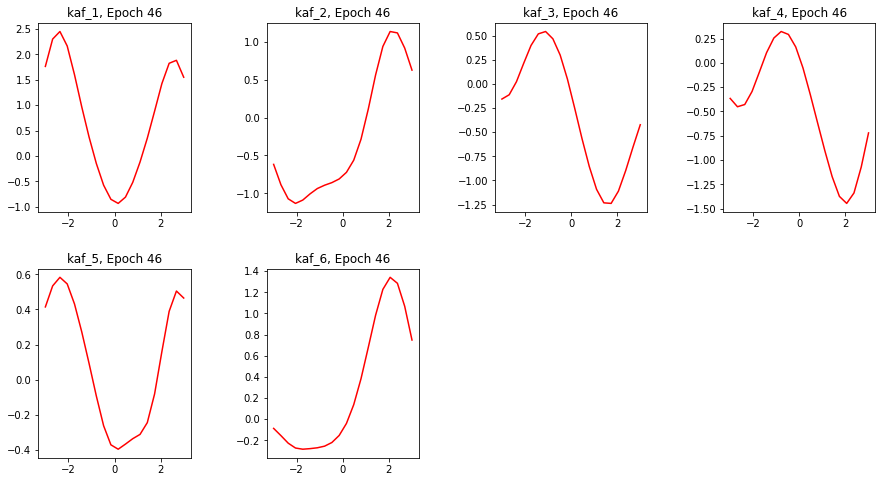

Epoch 46/60
391/391 [==============================] - 79s 203ms/step - loss: 1.3647 - sparse_categorical_accuracy: 0.5018 - val_loss: 1.2571 - val_sparse_categorical_accuracy: 0.6328


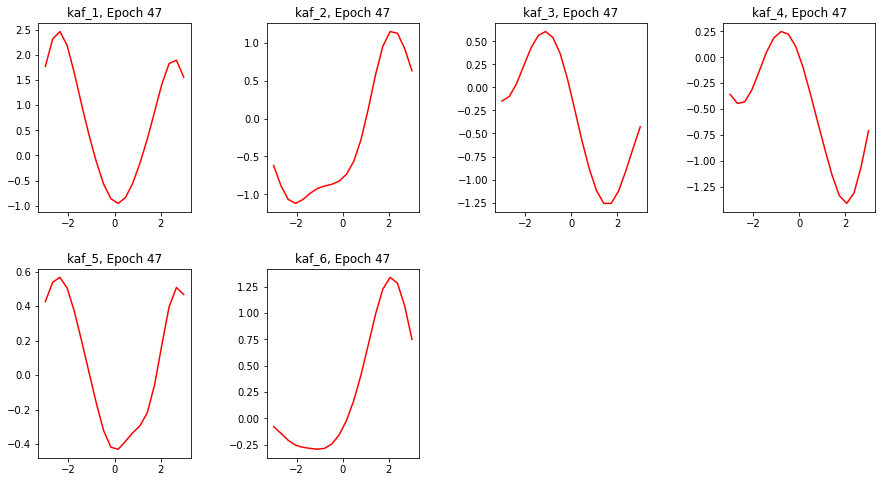

Epoch 47/60
391/391 [==============================] - 80s 203ms/step - loss: 1.3437 - sparse_categorical_accuracy: 0.5075 - val_loss: 1.2705 - val_sparse_categorical_accuracy: 0.6427


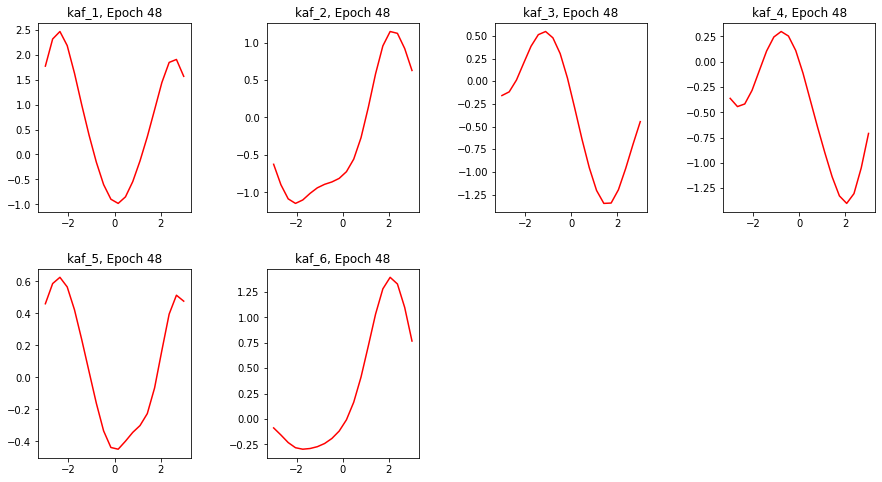

Epoch 48/60
391/391 [==============================] - 79s 203ms/step - loss: 1.3173 - sparse_categorical_accuracy: 0.5140 - val_loss: 1.2452 - val_sparse_categorical_accuracy: 0.6577


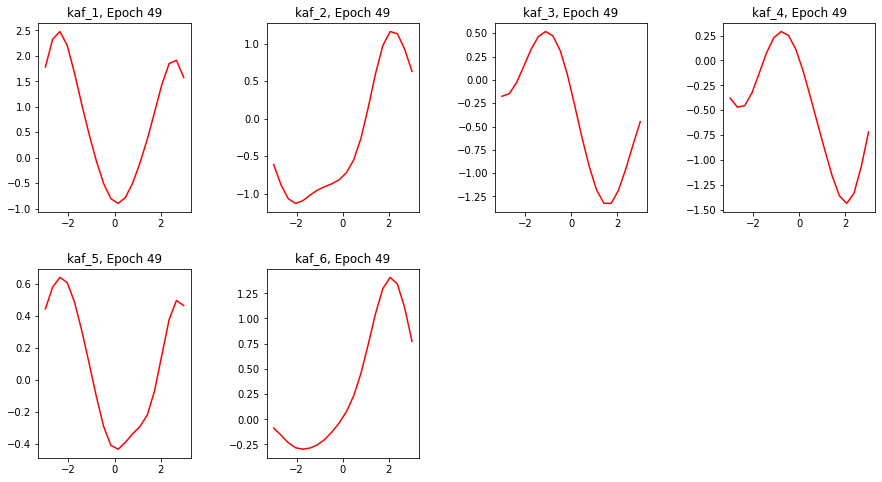

Epoch 49/60
391/391 [==============================] - 79s 203ms/step - loss: 1.3020 - sparse_categorical_accuracy: 0.5204 - val_loss: 1.2035 - val_sparse_categorical_accuracy: 0.6637


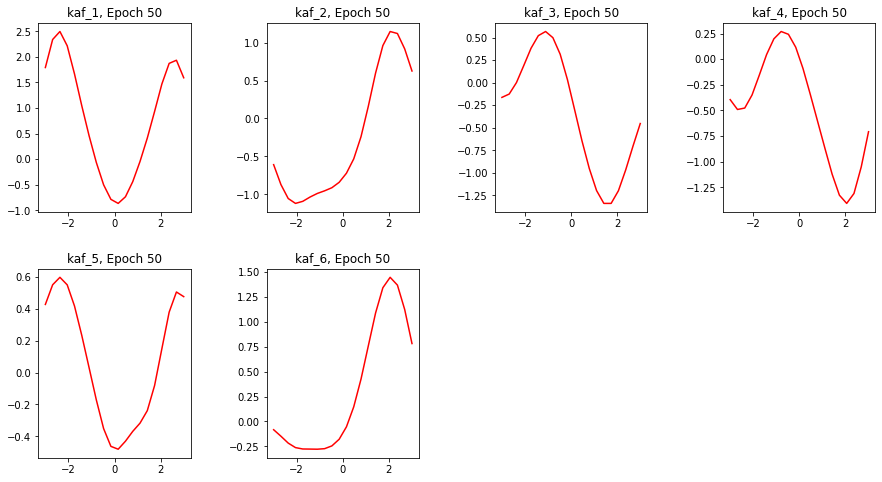

Epoch 50/60
391/391 [==============================] - 79s 203ms/step - loss: 1.2764 - sparse_categorical_accuracy: 0.5276 - val_loss: 1.1622 - val_sparse_categorical_accuracy: 0.6982


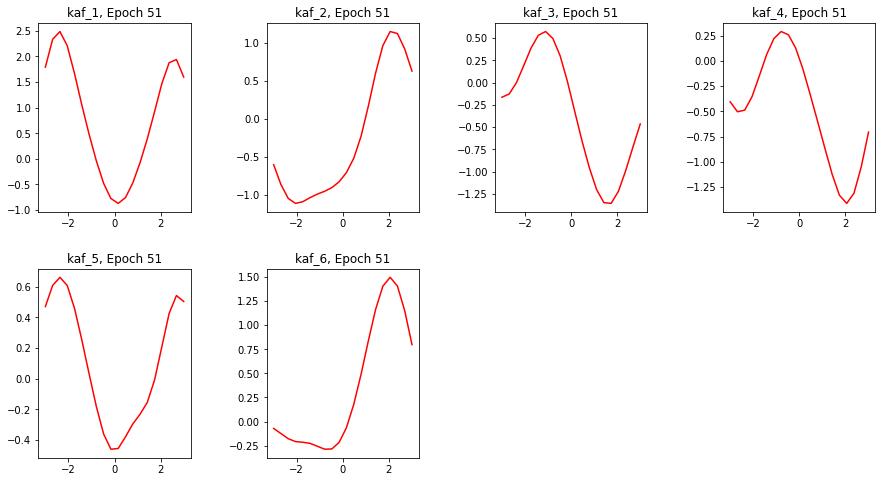

Epoch 51/60
391/391 [==============================] - 79s 203ms/step - loss: 1.2521 - sparse_categorical_accuracy: 0.5360 - val_loss: 1.1760 - val_sparse_categorical_accuracy: 0.6773


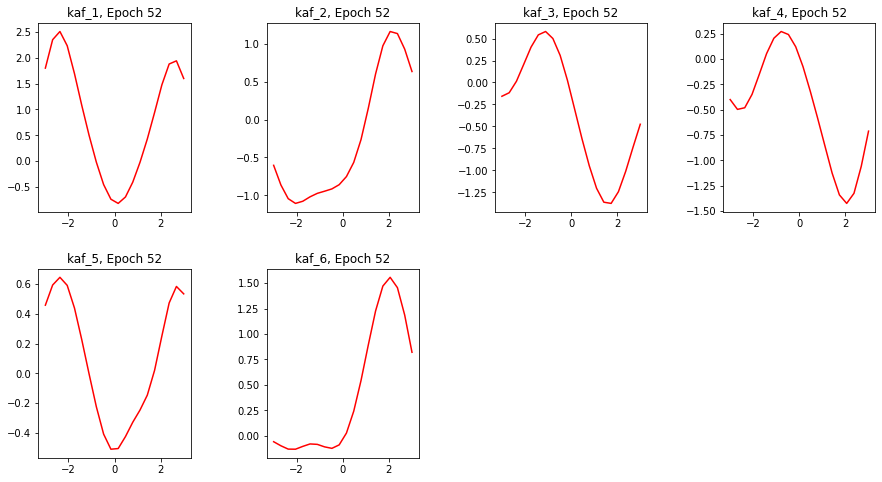

Epoch 52/60
391/391 [==============================] - 79s 203ms/step - loss: 1.2260 - sparse_categorical_accuracy: 0.5431 - val_loss: 1.0889 - val_sparse_categorical_accuracy: 0.7079


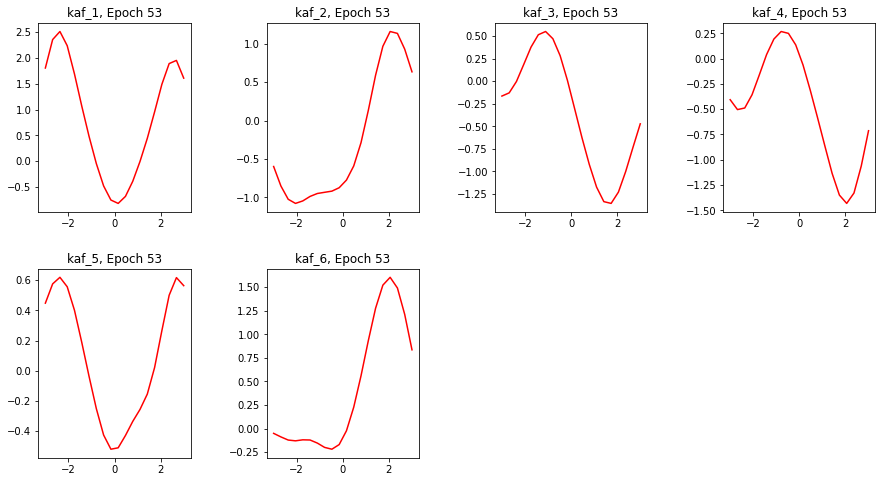

Epoch 53/60
391/391 [==============================] - 79s 203ms/step - loss: 1.1951 - sparse_categorical_accuracy: 0.5559 - val_loss: 1.0765 - val_sparse_categorical_accuracy: 0.7183


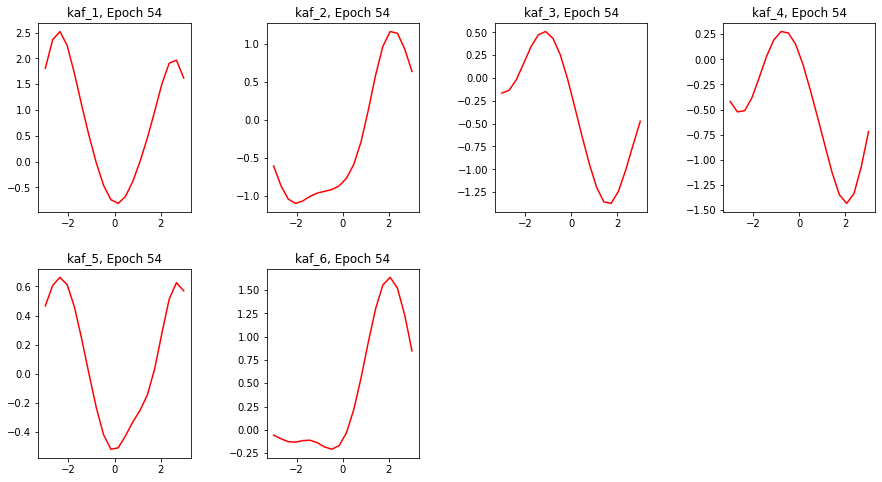

Epoch 54/60
391/391 [==============================] - 79s 203ms/step - loss: 1.1666 - sparse_categorical_accuracy: 0.5645 - val_loss: 1.2842 - val_sparse_categorical_accuracy: 0.6507


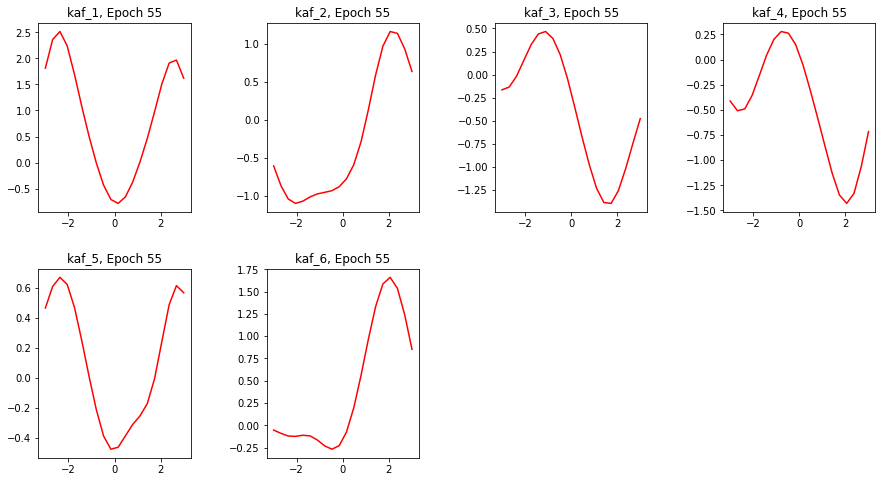

Epoch 55/60
391/391 [==============================] - 79s 203ms/step - loss: 1.1328 - sparse_categorical_accuracy: 0.5765 - val_loss: 1.0428 - val_sparse_categorical_accuracy: 0.7283


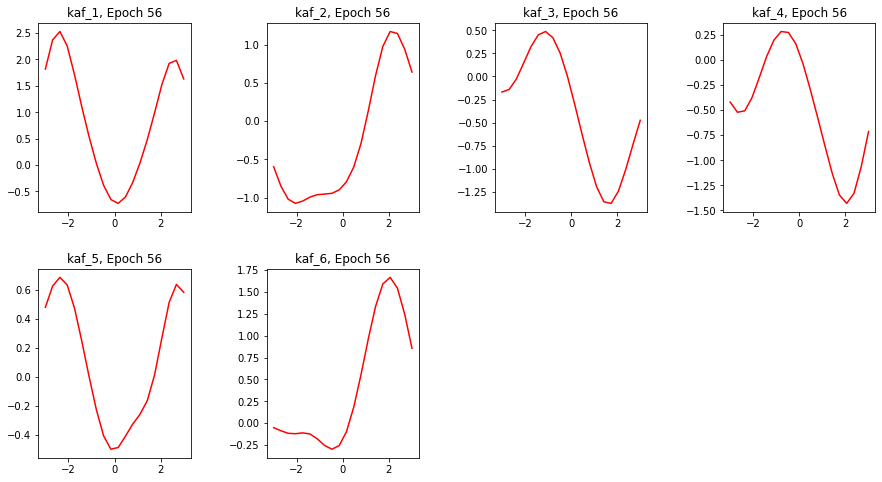

Epoch 56/60
391/391 [==============================] - 79s 203ms/step - loss: 1.0912 - sparse_categorical_accuracy: 0.5901 - val_loss: 1.0018 - val_sparse_categorical_accuracy: 0.7266


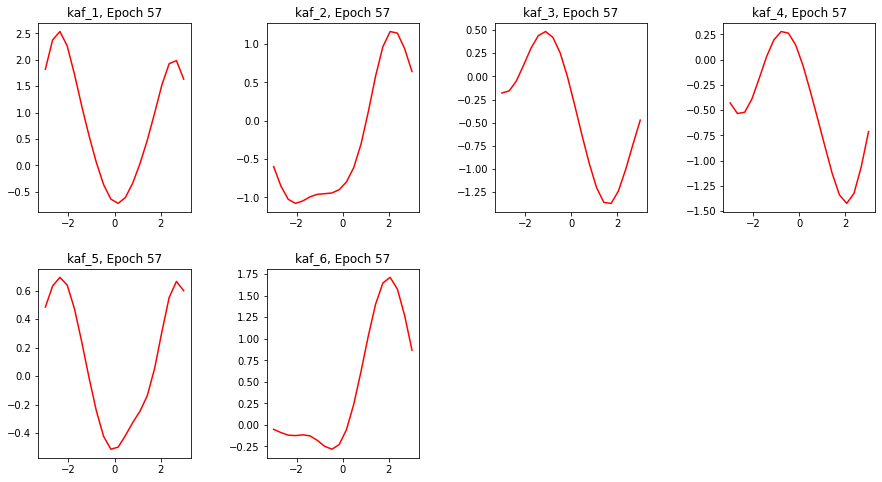

Epoch 57/60
391/391 [==============================] - 80s 204ms/step - loss: 1.0492 - sparse_categorical_accuracy: 0.6047 - val_loss: 0.9737 - val_sparse_categorical_accuracy: 0.7529


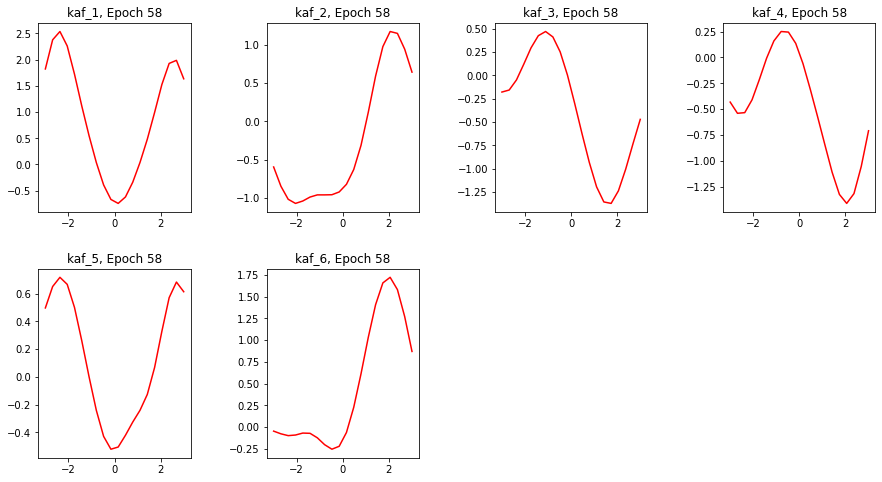

Epoch 58/60
391/391 [==============================] - 80s 204ms/step - loss: 0.9997 - sparse_categorical_accuracy: 0.6200 - val_loss: 0.9230 - val_sparse_categorical_accuracy: 0.7603


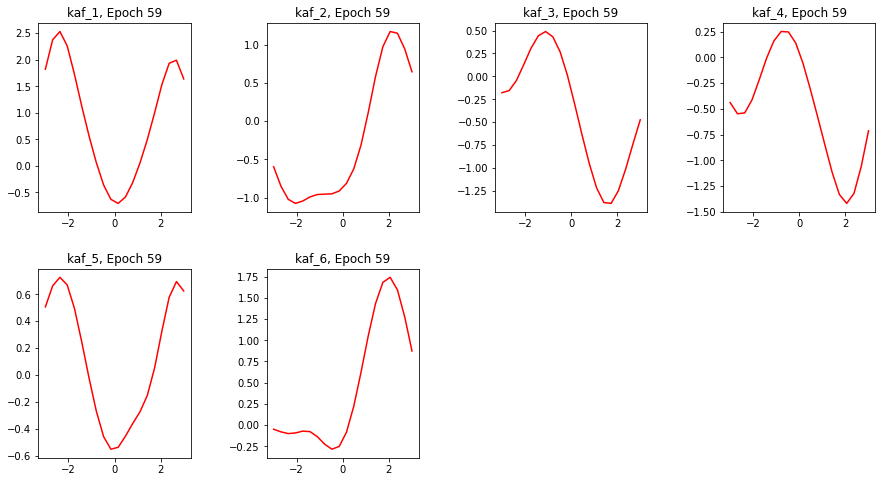

Epoch 59/60
391/391 [==============================] - 80s 204ms/step - loss: 0.9507 - sparse_categorical_accuracy: 0.6412 - val_loss: 0.9001 - val_sparse_categorical_accuracy: 0.7709


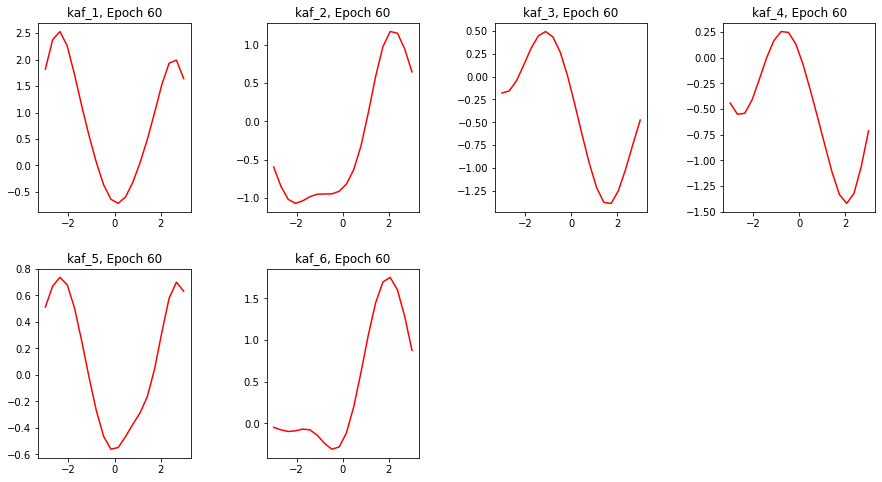

Epoch 60/60
391/391 [==============================] - 80s 204ms/step - loss: 0.9025 - sparse_categorical_accuracy: 0.6593 - val_loss: 0.8680 - val_sparse_categorical_accuracy: 0.7793


In [16]:
epochs = 60
step_size = np.ceil((len(x_train) / 128) * (epochs/2))

oclr = tfa.optimizers.TriangularCyclicalLearningRate(initial_learning_rate = 0.01, maximal_learning_rate = 1, step_size = step_size)

rob_kaf_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = oclr),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )
history_kaf = rob_kaf_vgg.fit(x = train, epochs = epochs, batch_size = 128, validation_data = test, callbacks=[activationsf.plot_kafs_epoch_wise(6)])

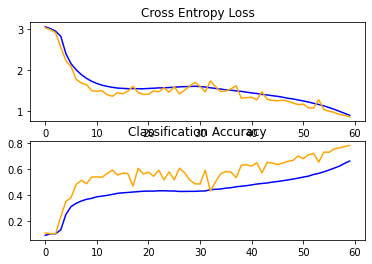

In [17]:
summarize_diagnostics(history_kaf)

In [19]:
rob_kaf_vgg.save('./rob_kaf_vgg')
!zip -r rob_kaf_vgg.zip ./rob_kaf_vgg
from google.colab import files
files.download('./rob_kaf_vgg.zip')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ./rob_kaf_vgg/assets
  adding: rob_kaf_vgg/ (stored 0%)
  adding: rob_kaf_vgg/variables/ (stored 0%)
  adding: rob_kaf_vgg/variables/variables.index (deflated 69%)
  adding: rob_kaf_vgg/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: rob_kaf_vgg/assets/ (stored 0%)
  adding: rob_kaf_vgg/saved_model.pb (deflated 90%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### KAF Elu Case

Epoch 1/7
391/391 [==============================] - 76s 195ms/step - loss: 6.6748 - sparse_categorical_accuracy: 4.6000e-04
Epoch 2/7
391/391 [==============================] - 78s 199ms/step - loss: 3.5255 - sparse_categorical_accuracy: 0.1360
Epoch 3/7
391/391 [==============================] - 78s 200ms/step - loss: 2.9853 - sparse_categorical_accuracy: 0.2055
Epoch 4/7
391/391 [==============================] - 78s 199ms/step - loss: 2.6539 - sparse_categorical_accuracy: 0.2832
Epoch 5/7
391/391 [==============================] - 78s 199ms/step - loss: 2.4613 - sparse_categorical_accuracy: 0.3188
Epoch 6/7
391/391 [==============================] - 78s 199ms/step - loss: 2.4469 - sparse_categorical_accuracy: 0.2878
Epoch 7/7
391/391 [==============================] - 78s 199ms/step - loss: 2.5866 - sparse_categorical_accuracy: 0.1953


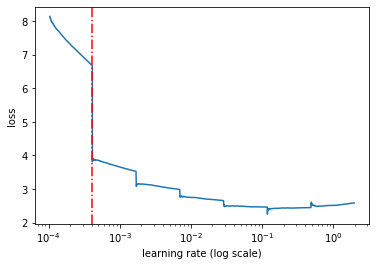

In [ ]:
BATCH = 128
STEPS_PER_EPOCH = np.ceil(len(x_train) / BATCH)

elu = tf.keras.activations.elu
rob_kafelu_vgg = rob_vgg(act = None , is_kaf = True, ridge=elu, moving=False)
rob_kafelu_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

lr_finder = LRFinder(rob_kafelu_vgg)
lr_finder.find(train, start_lr=1e-4, end_lr=2, epochs=7,
               steps_per_epoch=STEPS_PER_EPOCH)

axs = plot_loss()
axs.axvline(x=lr_finder.get_best_lr(sma=20), c='r', linestyle='-.')

In [ ]:
rob_kafelu_vgg.summary()

Model: "resnet"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
batch_normalization_1 (Batch (None, 32, 32, 32)        128       
_________________________________________________________________
kaf_1 (Kaf)                  (None, 32, 32, 32)        660       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
batch_normalization_2 (Batch (None, 32, 32, 32)        128       
_________________________________________________________________
kaf_2 (Kaf)                  (None, 32, 32, 32)        660  

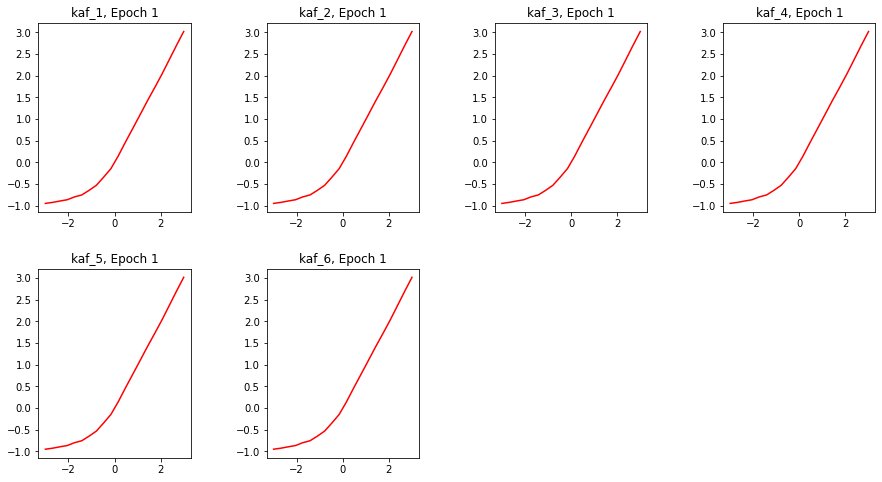

Epoch 1/60
391/391 [==============================] - 81s 207ms/step - loss: 5.0582 - sparse_categorical_accuracy: 0.0019 - val_loss: 3.1160 - val_sparse_categorical_accuracy: 0.1177


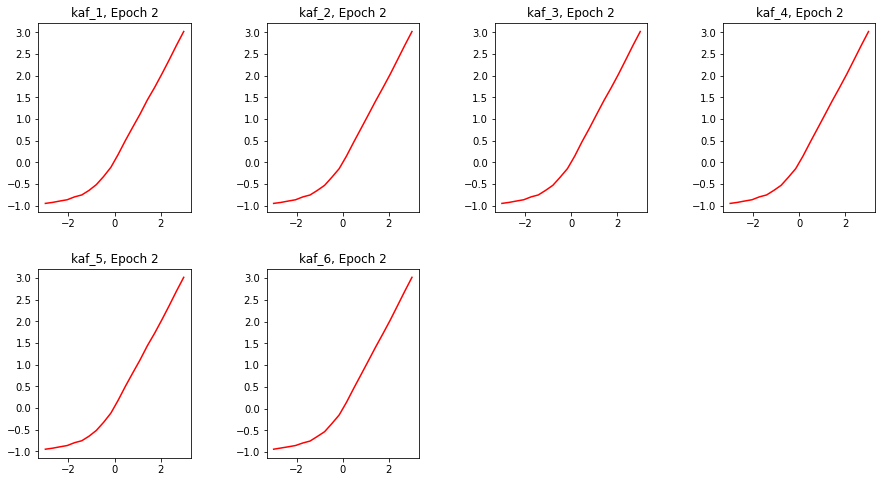

Epoch 2/60
391/391 [==============================] - 81s 206ms/step - loss: 2.9928 - sparse_categorical_accuracy: 0.1534 - val_loss: 2.8680 - val_sparse_categorical_accuracy: 0.2302


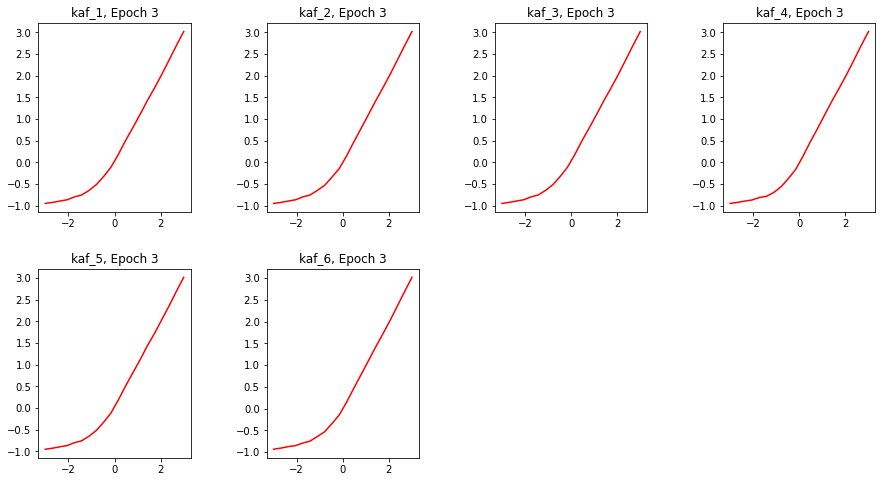

Epoch 3/60
391/391 [==============================] - 81s 206ms/step - loss: 2.7497 - sparse_categorical_accuracy: 0.2472 - val_loss: 2.6537 - val_sparse_categorical_accuracy: 0.3045


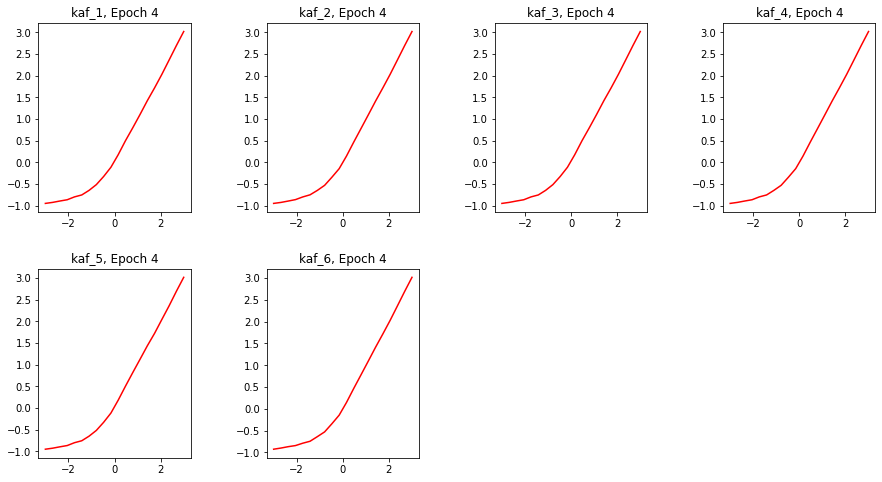

Epoch 4/60
391/391 [==============================] - 81s 206ms/step - loss: 2.6026 - sparse_categorical_accuracy: 0.2905 - val_loss: 2.4698 - val_sparse_categorical_accuracy: 0.3557


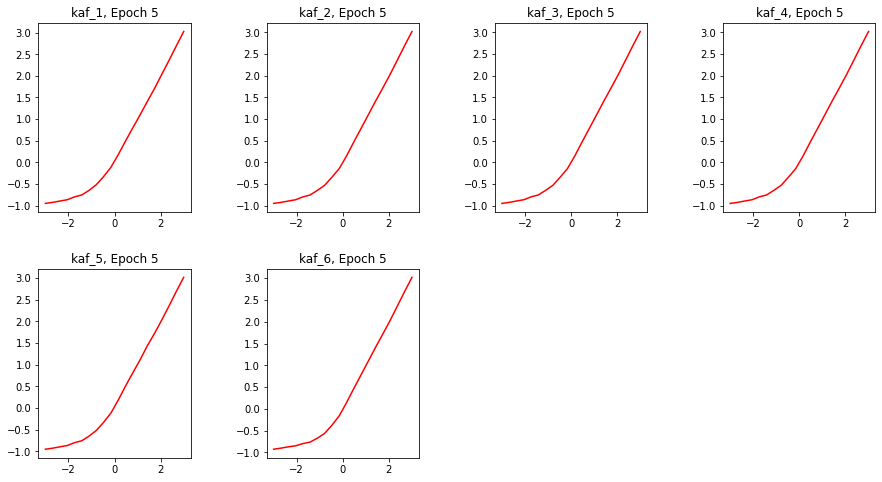

Epoch 5/60
391/391 [==============================] - 81s 206ms/step - loss: 2.5064 - sparse_categorical_accuracy: 0.3159 - val_loss: 2.3273 - val_sparse_categorical_accuracy: 0.3975


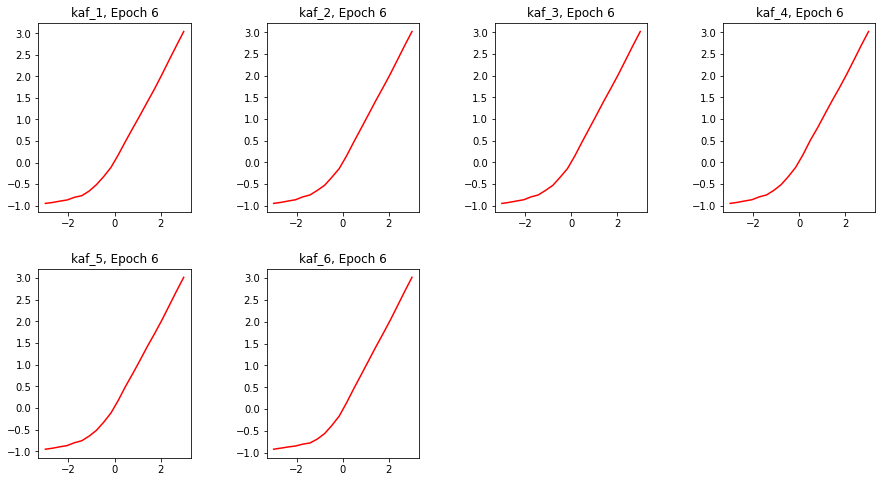

Epoch 6/60
391/391 [==============================] - 81s 206ms/step - loss: 2.4372 - sparse_categorical_accuracy: 0.3356 - val_loss: 2.2483 - val_sparse_categorical_accuracy: 0.4319


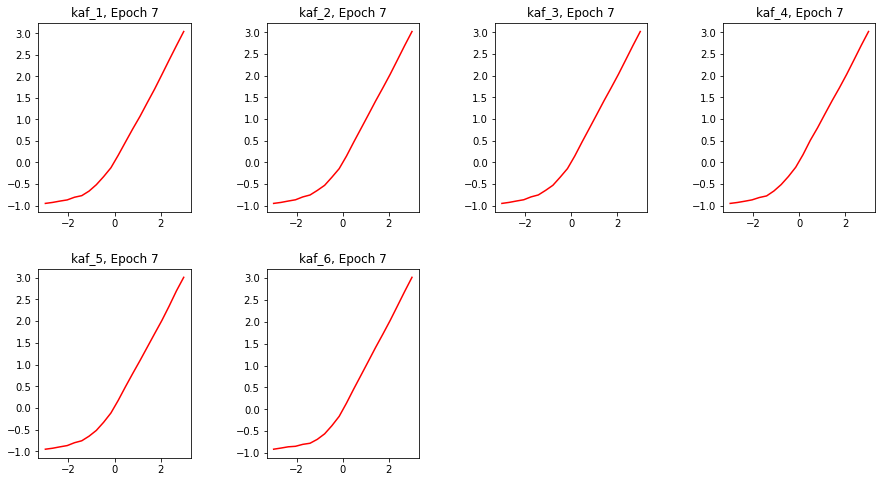

Epoch 7/60
391/391 [==============================] - 80s 206ms/step - loss: 2.3779 - sparse_categorical_accuracy: 0.3446 - val_loss: 2.1627 - val_sparse_categorical_accuracy: 0.4612


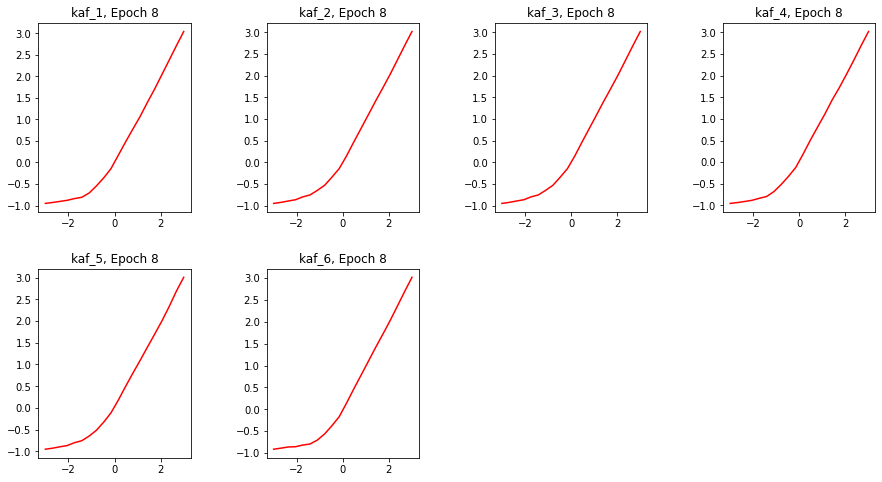

Epoch 8/60
391/391 [==============================] - 81s 206ms/step - loss: 2.3355 - sparse_categorical_accuracy: 0.3520 - val_loss: 2.1537 - val_sparse_categorical_accuracy: 0.4593


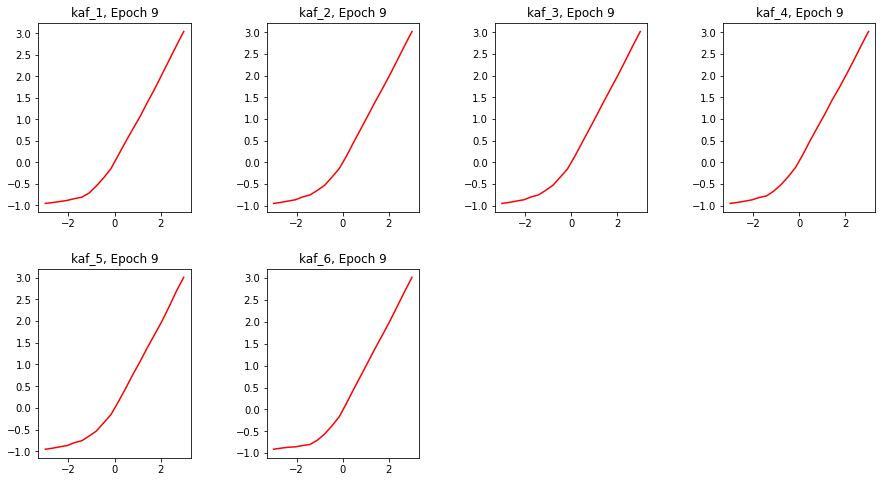

Epoch 9/60
391/391 [==============================] - 81s 206ms/step - loss: 2.2926 - sparse_categorical_accuracy: 0.3540 - val_loss: 2.0419 - val_sparse_categorical_accuracy: 0.4904


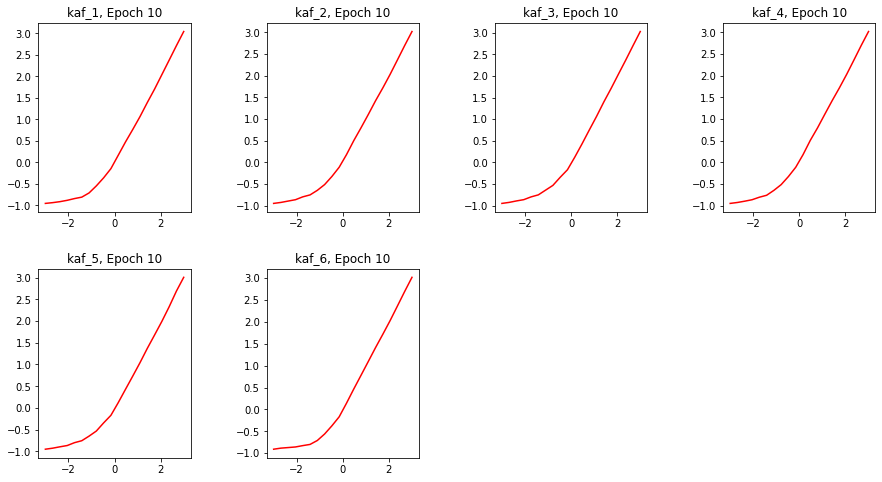

Epoch 10/60
391/391 [==============================] - 80s 206ms/step - loss: 2.2531 - sparse_categorical_accuracy: 0.3582 - val_loss: 2.0009 - val_sparse_categorical_accuracy: 0.5003


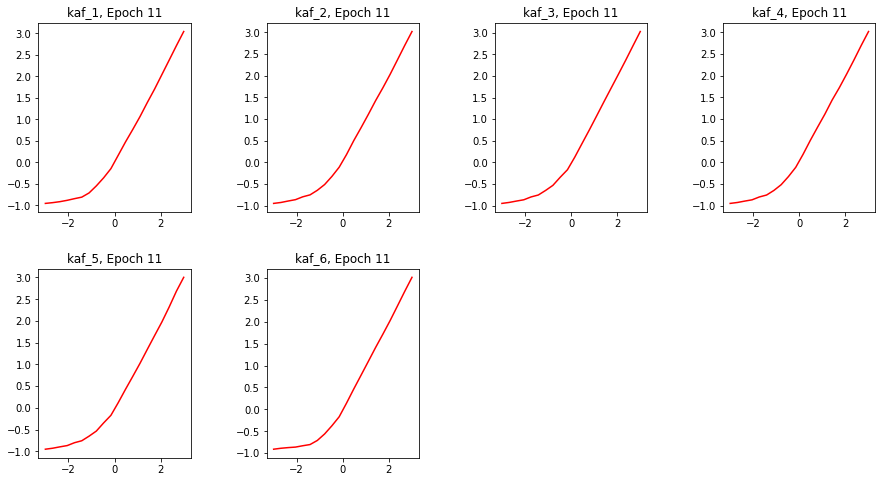

Epoch 11/60
391/391 [==============================] - 81s 206ms/step - loss: 2.2076 - sparse_categorical_accuracy: 0.3653 - val_loss: 1.9479 - val_sparse_categorical_accuracy: 0.5142


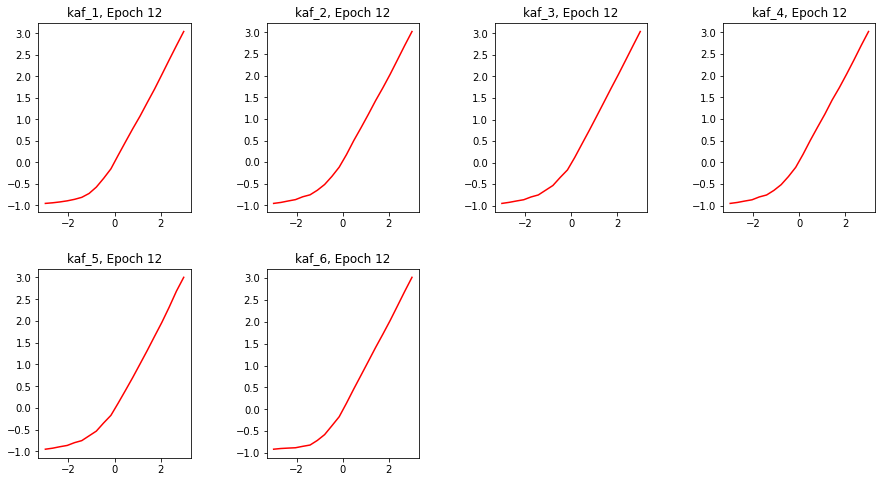

Epoch 12/60
391/391 [==============================] - 81s 206ms/step - loss: 2.1683 - sparse_categorical_accuracy: 0.3681 - val_loss: 1.9243 - val_sparse_categorical_accuracy: 0.5175


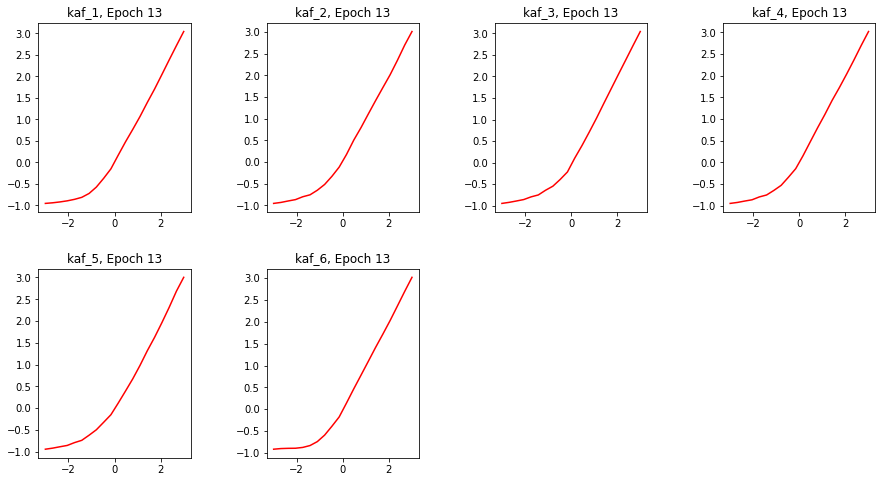

Epoch 13/60
391/391 [==============================] - 81s 207ms/step - loss: 2.1244 - sparse_categorical_accuracy: 0.3748 - val_loss: 1.8706 - val_sparse_categorical_accuracy: 0.5211


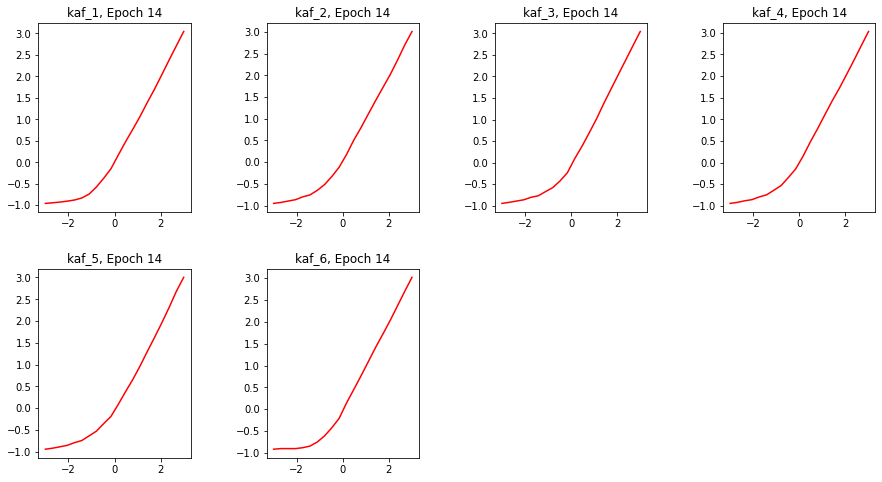

Epoch 14/60
391/391 [==============================] - 81s 206ms/step - loss: 2.0859 - sparse_categorical_accuracy: 0.3766 - val_loss: 1.8750 - val_sparse_categorical_accuracy: 0.4989


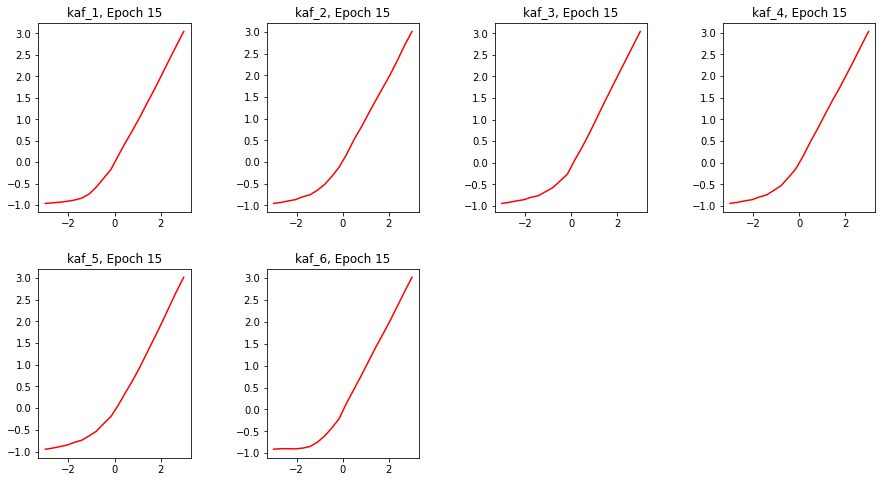

Epoch 15/60
391/391 [==============================] - 81s 207ms/step - loss: 2.0439 - sparse_categorical_accuracy: 0.3831 - val_loss: 1.7829 - val_sparse_categorical_accuracy: 0.5420


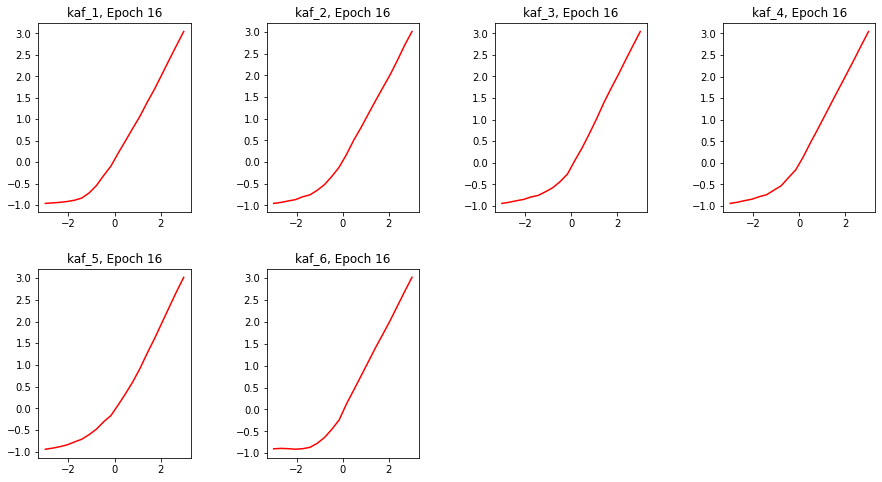

Epoch 16/60
391/391 [==============================] - 81s 206ms/step - loss: 2.0075 - sparse_categorical_accuracy: 0.3849 - val_loss: 1.7462 - val_sparse_categorical_accuracy: 0.5457


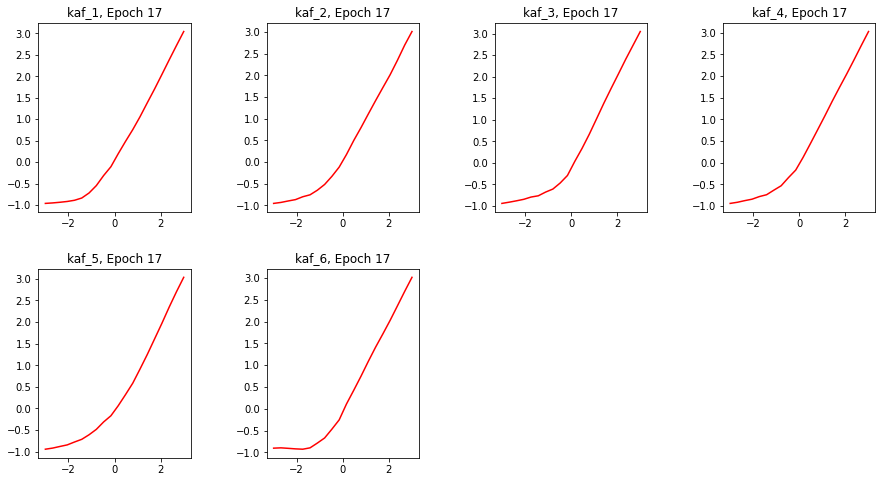

Epoch 17/60
391/391 [==============================] - 80s 206ms/step - loss: 1.9659 - sparse_categorical_accuracy: 0.3906 - val_loss: 1.7342 - val_sparse_categorical_accuracy: 0.5687


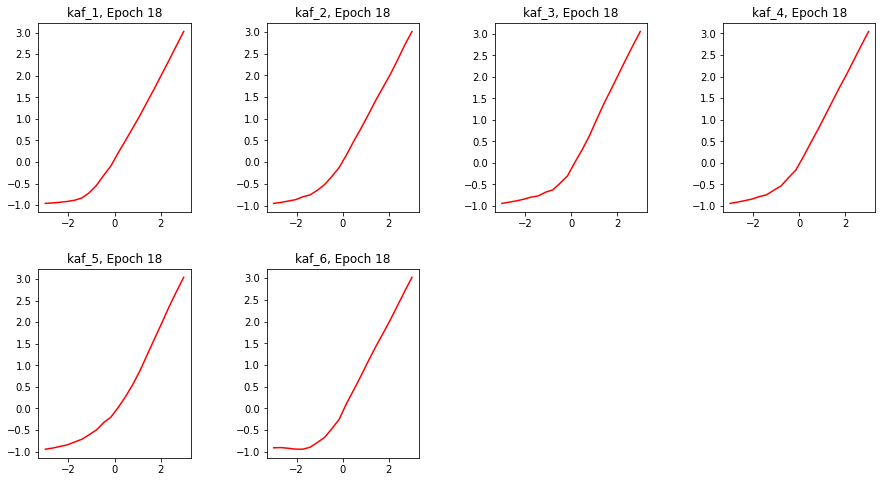

Epoch 18/60
391/391 [==============================] - 81s 206ms/step - loss: 1.9272 - sparse_categorical_accuracy: 0.3948 - val_loss: 1.6737 - val_sparse_categorical_accuracy: 0.5655


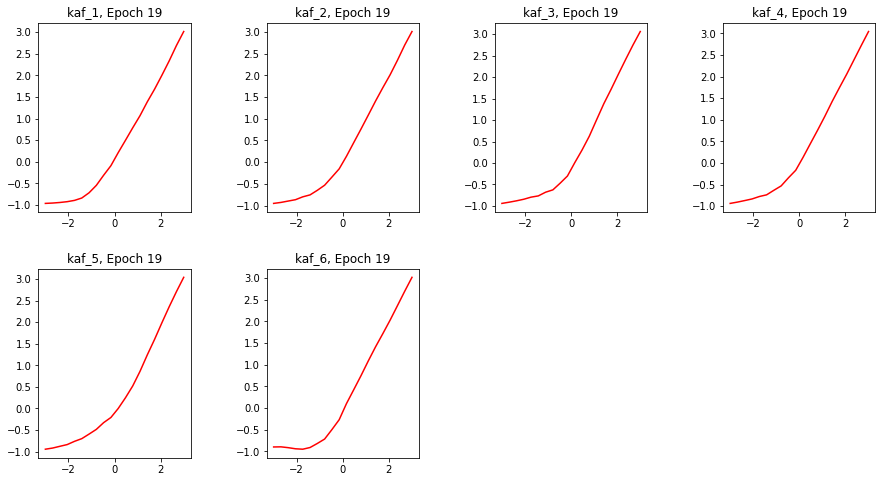

Epoch 19/60
391/391 [==============================] - 81s 206ms/step - loss: 1.8921 - sparse_categorical_accuracy: 0.3971 - val_loss: 1.6441 - val_sparse_categorical_accuracy: 0.5803


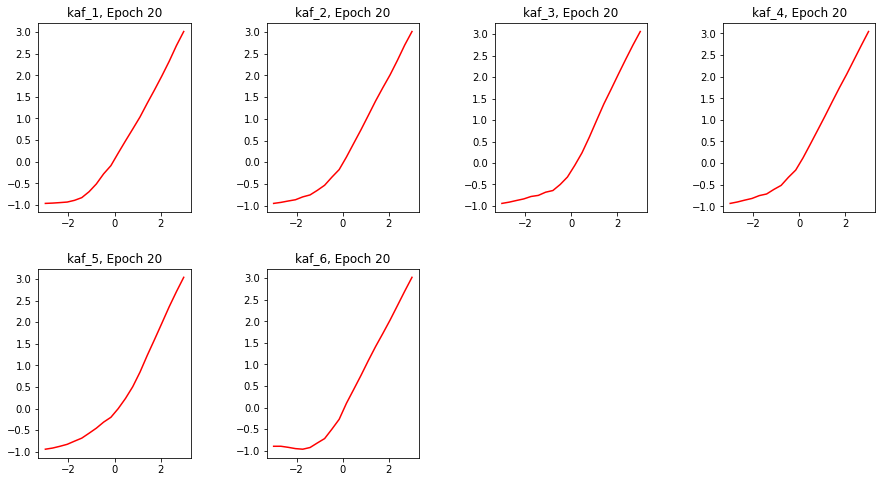

Epoch 20/60
391/391 [==============================] - 81s 206ms/step - loss: 1.8550 - sparse_categorical_accuracy: 0.4037 - val_loss: 1.6208 - val_sparse_categorical_accuracy: 0.5646


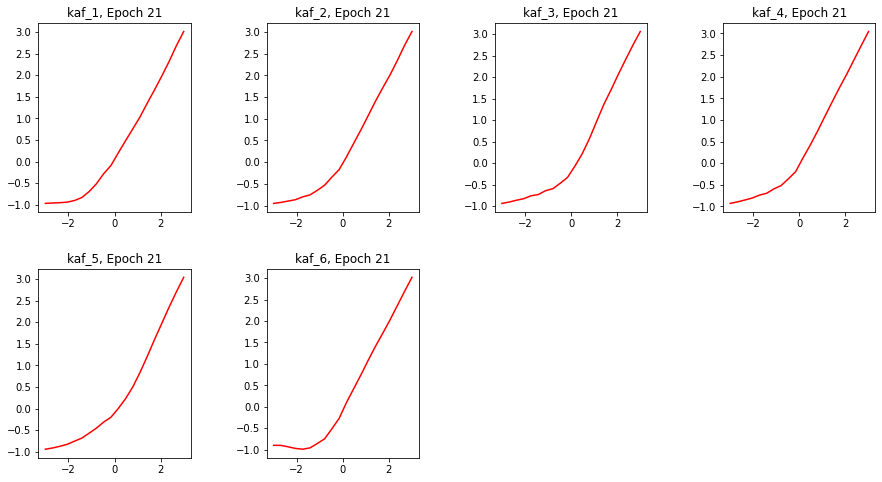

Epoch 21/60
391/391 [==============================] - 81s 206ms/step - loss: 1.8223 - sparse_categorical_accuracy: 0.4047 - val_loss: 1.5909 - val_sparse_categorical_accuracy: 0.5645


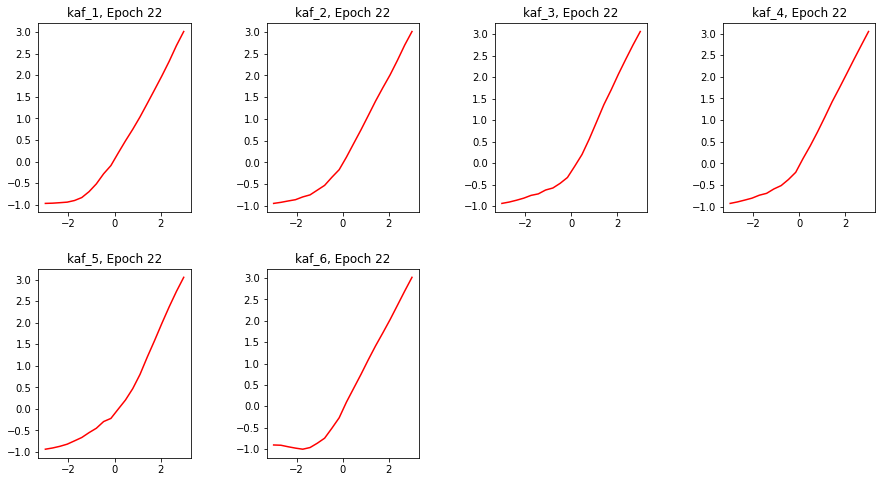

Epoch 22/60
391/391 [==============================] - 81s 206ms/step - loss: 1.7885 - sparse_categorical_accuracy: 0.4089 - val_loss: 1.5337 - val_sparse_categorical_accuracy: 0.5920


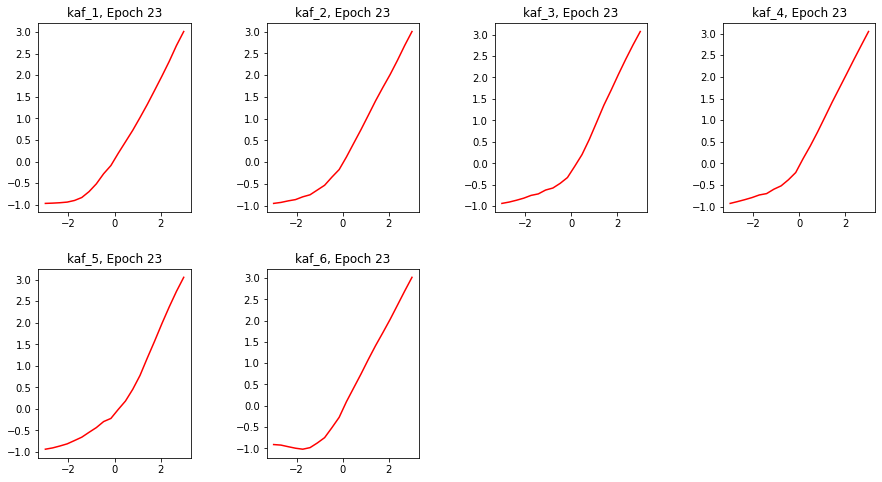

Epoch 23/60
391/391 [==============================] - 81s 206ms/step - loss: 1.7526 - sparse_categorical_accuracy: 0.4150 - val_loss: 1.5098 - val_sparse_categorical_accuracy: 0.5878


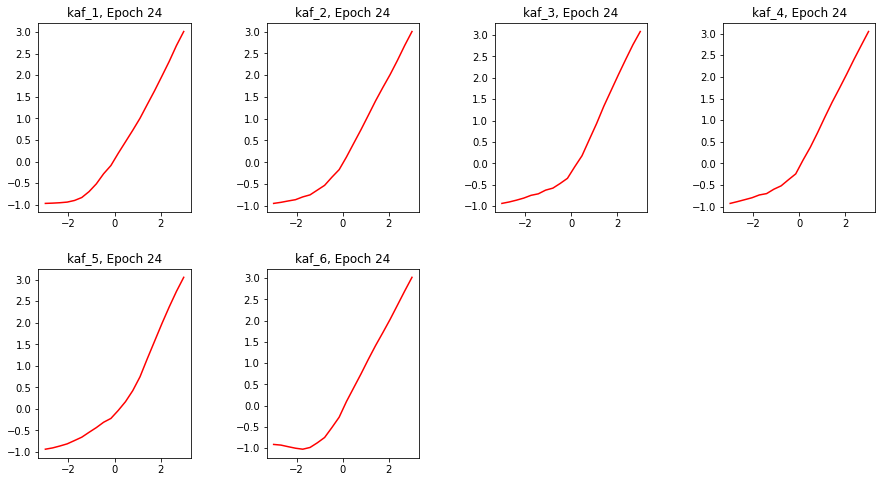

Epoch 24/60
391/391 [==============================] - 80s 206ms/step - loss: 1.7241 - sparse_categorical_accuracy: 0.4170 - val_loss: 1.4737 - val_sparse_categorical_accuracy: 0.6093


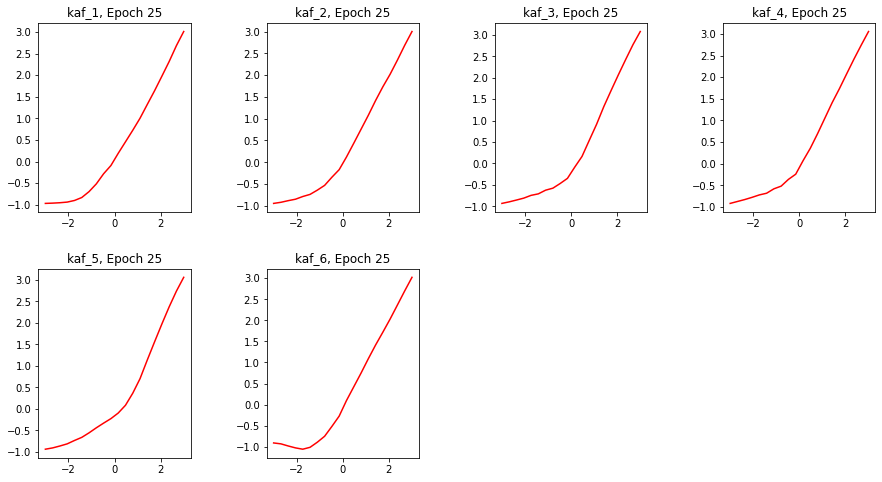

Epoch 25/60
391/391 [==============================] - 81s 206ms/step - loss: 1.6941 - sparse_categorical_accuracy: 0.4231 - val_loss: 1.4207 - val_sparse_categorical_accuracy: 0.6245


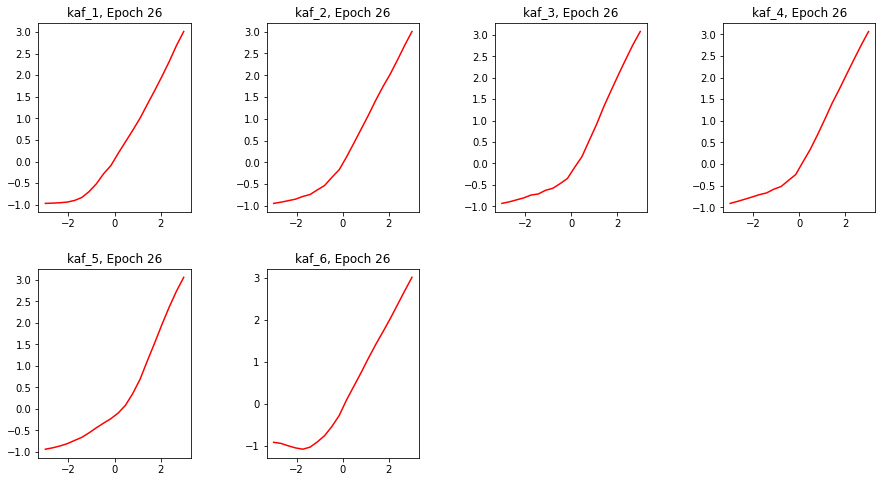

Epoch 26/60
391/391 [==============================] - 80s 206ms/step - loss: 1.6628 - sparse_categorical_accuracy: 0.4256 - val_loss: 1.4548 - val_sparse_categorical_accuracy: 0.6015


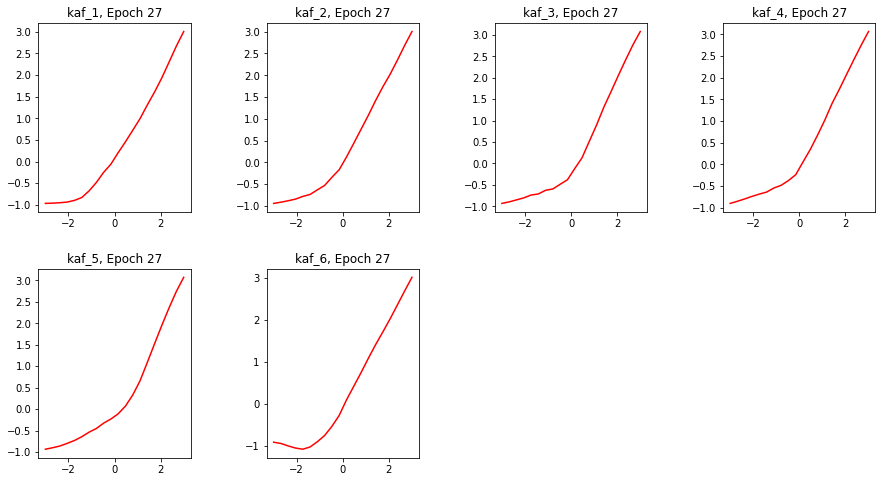

Epoch 27/60
391/391 [==============================] - 80s 206ms/step - loss: 1.6406 - sparse_categorical_accuracy: 0.4298 - val_loss: 1.4221 - val_sparse_categorical_accuracy: 0.5981


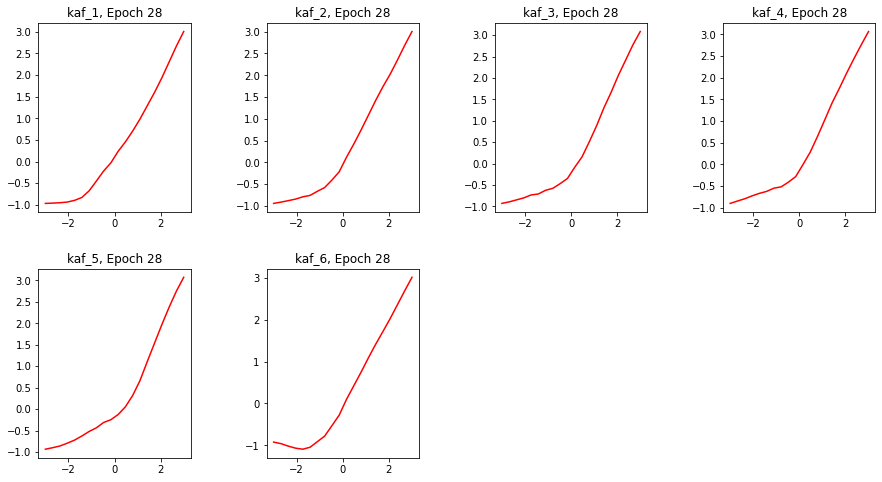

Epoch 28/60
391/391 [==============================] - 80s 205ms/step - loss: 1.6148 - sparse_categorical_accuracy: 0.4344 - val_loss: 1.3654 - val_sparse_categorical_accuracy: 0.6369


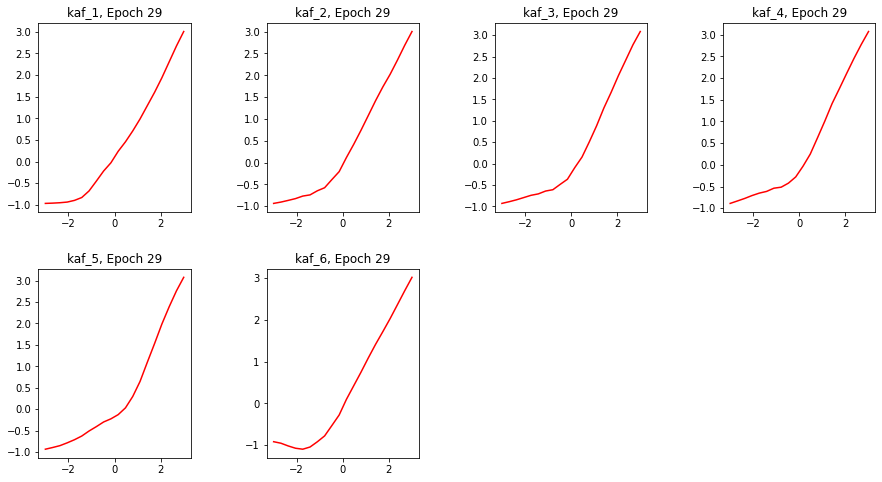

Epoch 29/60
391/391 [==============================] - 80s 206ms/step - loss: 1.5893 - sparse_categorical_accuracy: 0.4409 - val_loss: 1.3728 - val_sparse_categorical_accuracy: 0.6236


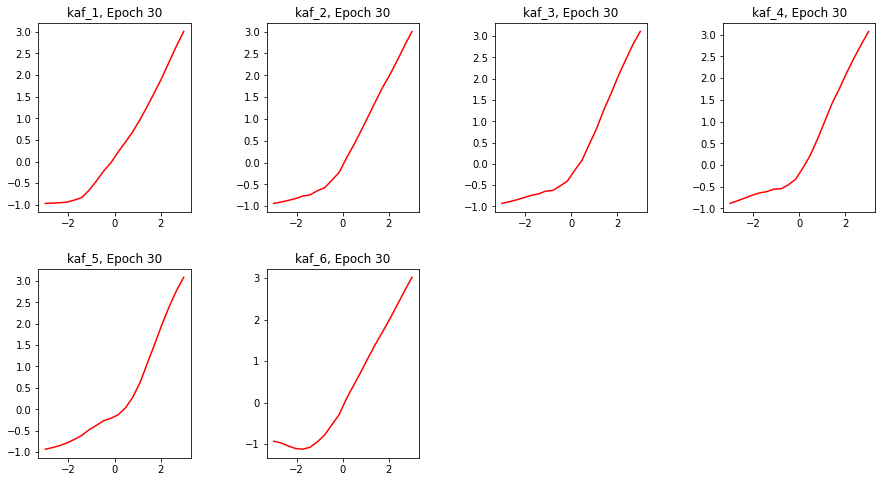

Epoch 30/60
391/391 [==============================] - 80s 205ms/step - loss: 1.5689 - sparse_categorical_accuracy: 0.4434 - val_loss: 1.3474 - val_sparse_categorical_accuracy: 0.6439


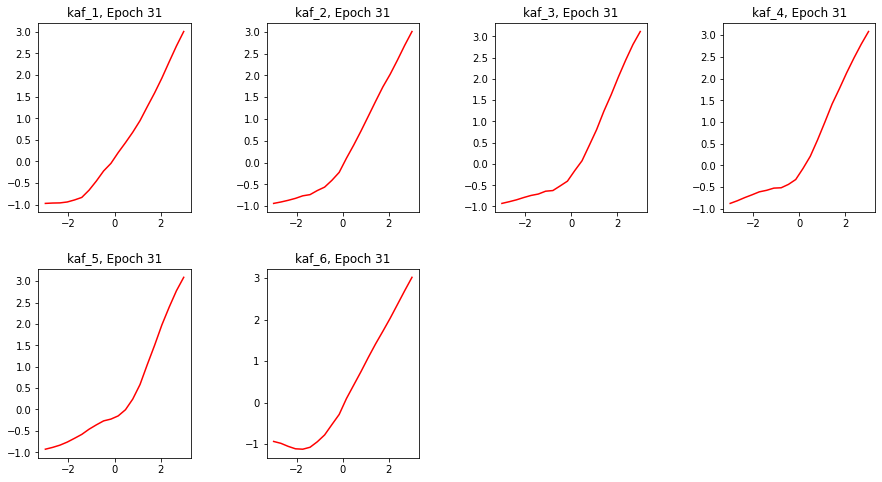

Epoch 31/60
391/391 [==============================] - 80s 205ms/step - loss: 1.5417 - sparse_categorical_accuracy: 0.4480 - val_loss: 1.3399 - val_sparse_categorical_accuracy: 0.6289


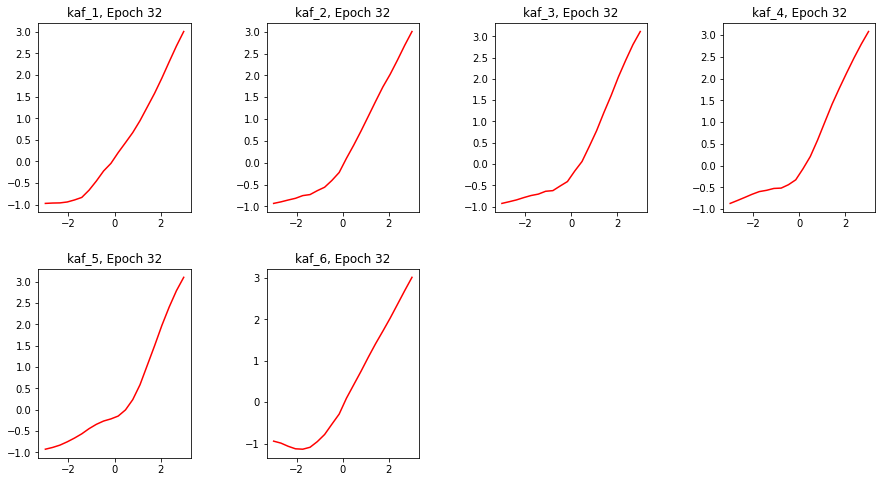

Epoch 32/60
391/391 [==============================] - 80s 205ms/step - loss: 1.5177 - sparse_categorical_accuracy: 0.4535 - val_loss: 1.2939 - val_sparse_categorical_accuracy: 0.6462


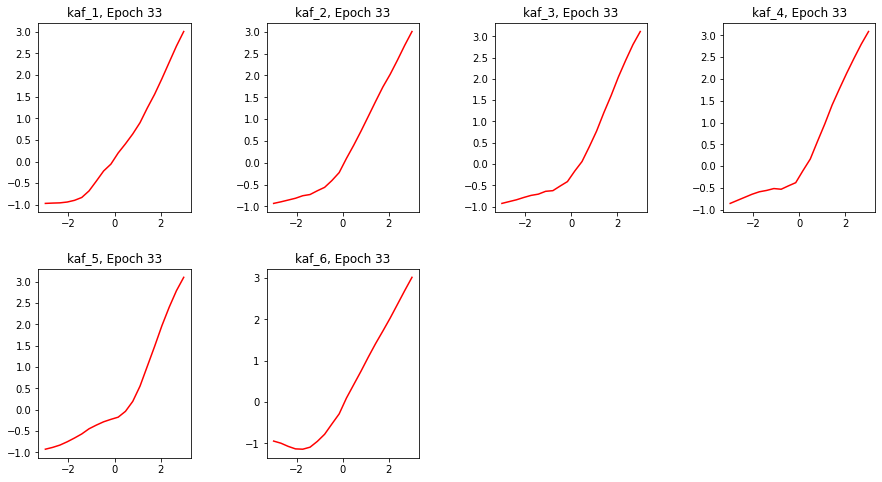

Epoch 33/60
391/391 [==============================] - 80s 205ms/step - loss: 1.4921 - sparse_categorical_accuracy: 0.4602 - val_loss: 1.2928 - val_sparse_categorical_accuracy: 0.6259


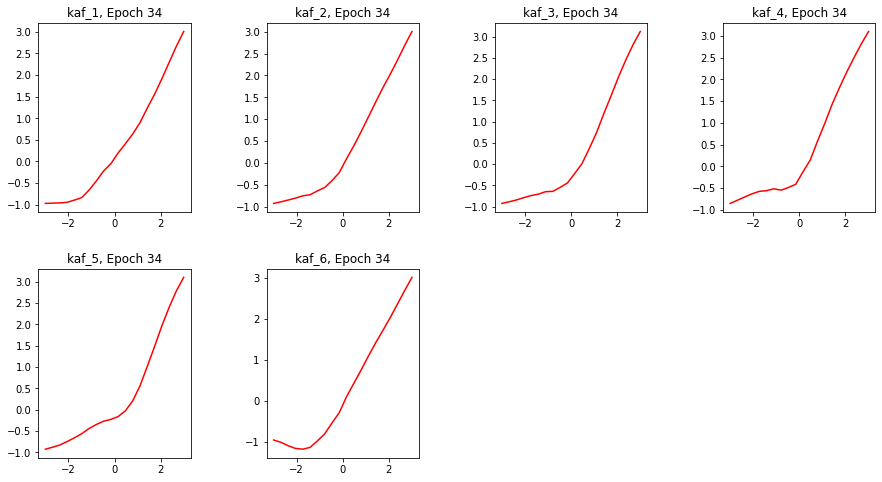

Epoch 34/60
391/391 [==============================] - 80s 205ms/step - loss: 1.4694 - sparse_categorical_accuracy: 0.4680 - val_loss: 1.2380 - val_sparse_categorical_accuracy: 0.6606


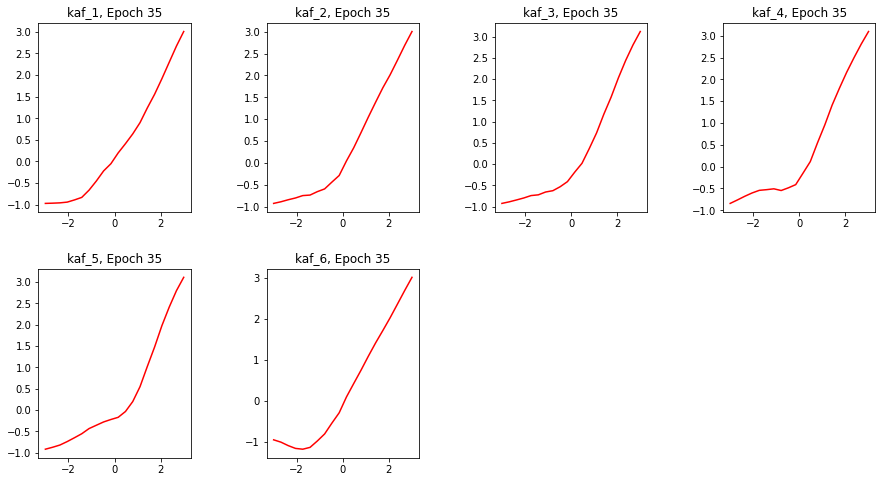

Epoch 35/60
391/391 [==============================] - 80s 205ms/step - loss: 1.4458 - sparse_categorical_accuracy: 0.4710 - val_loss: 1.2258 - val_sparse_categorical_accuracy: 0.6398


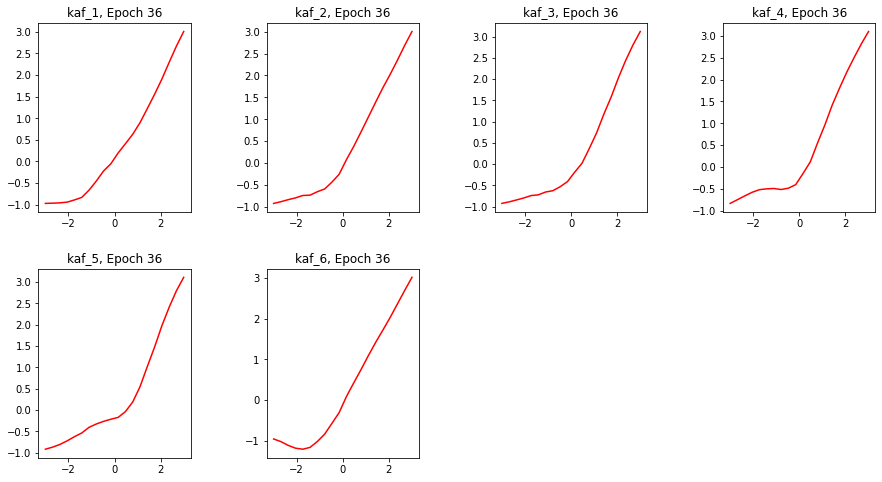

Epoch 36/60
391/391 [==============================] - 80s 205ms/step - loss: 1.4244 - sparse_categorical_accuracy: 0.4816 - val_loss: 1.2120 - val_sparse_categorical_accuracy: 0.6678


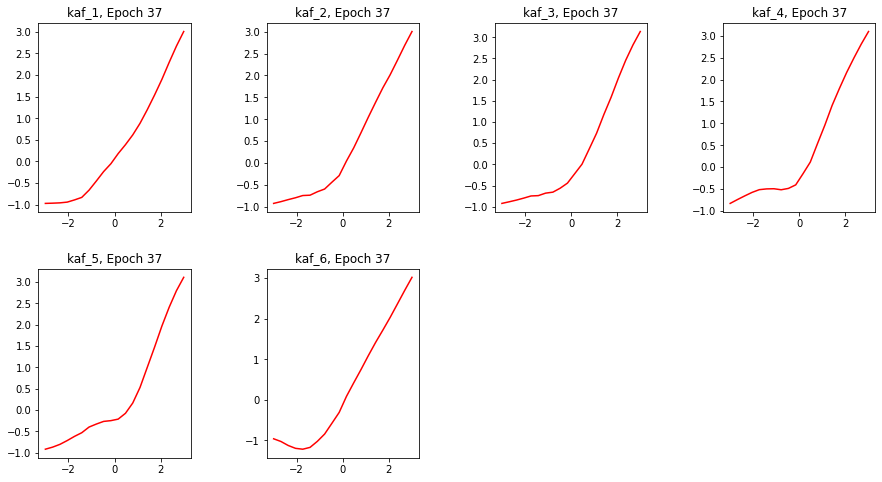

Epoch 37/60
391/391 [==============================] - 80s 205ms/step - loss: 1.4028 - sparse_categorical_accuracy: 0.4844 - val_loss: 1.1656 - val_sparse_categorical_accuracy: 0.6761


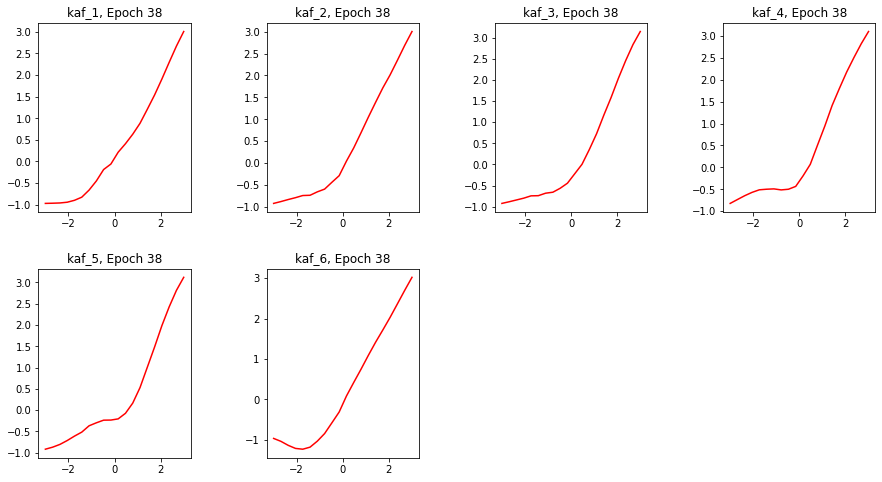

Epoch 38/60
391/391 [==============================] - 80s 205ms/step - loss: 1.3828 - sparse_categorical_accuracy: 0.4899 - val_loss: 1.1325 - val_sparse_categorical_accuracy: 0.6916


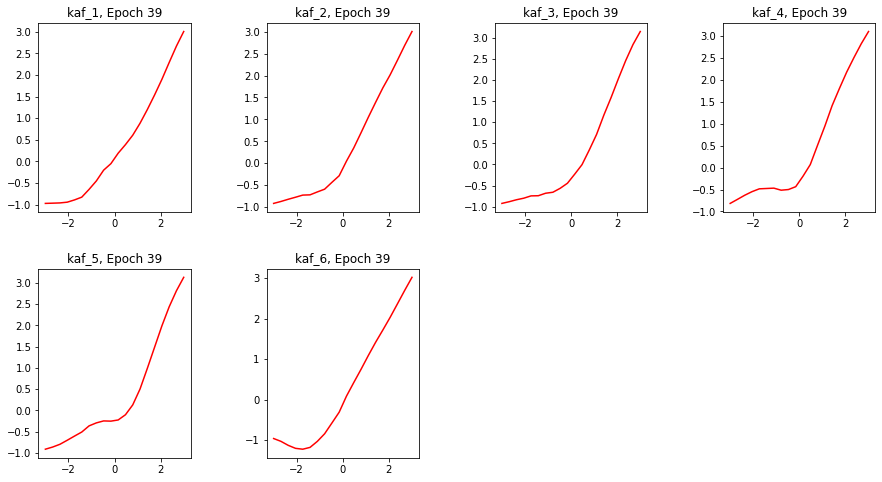

Epoch 39/60
391/391 [==============================] - 80s 205ms/step - loss: 1.3662 - sparse_categorical_accuracy: 0.4955 - val_loss: 1.1721 - val_sparse_categorical_accuracy: 0.6677


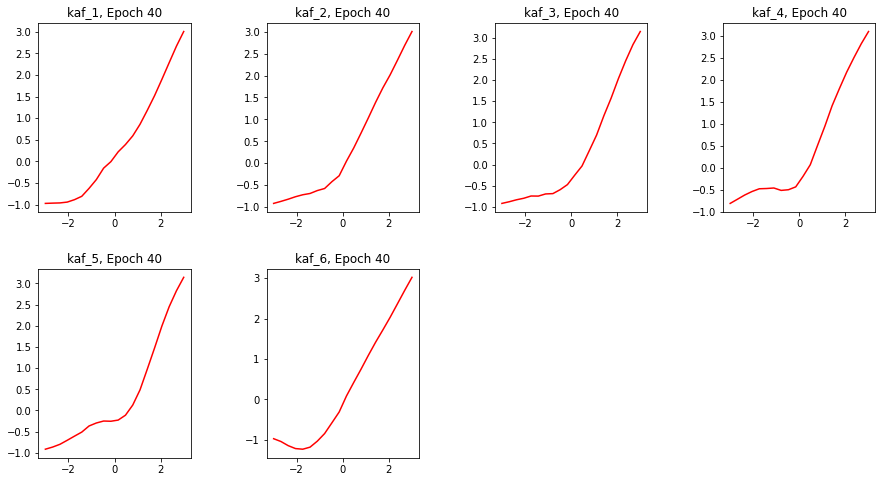

Epoch 40/60
391/391 [==============================] - 80s 205ms/step - loss: 1.3465 - sparse_categorical_accuracy: 0.4975 - val_loss: 1.1310 - val_sparse_categorical_accuracy: 0.6814


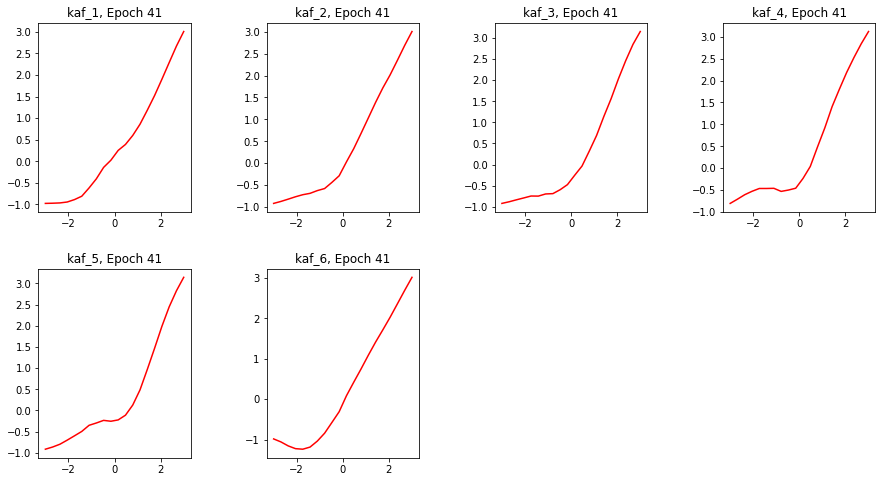

Epoch 41/60
391/391 [==============================] - 80s 205ms/step - loss: 1.3259 - sparse_categorical_accuracy: 0.5044 - val_loss: 1.1092 - val_sparse_categorical_accuracy: 0.6975


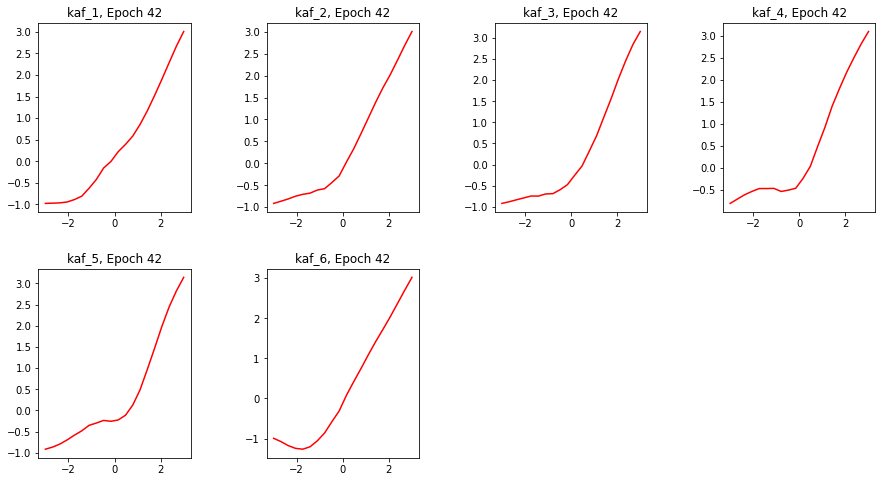

Epoch 42/60
391/391 [==============================] - 80s 205ms/step - loss: 1.3080 - sparse_categorical_accuracy: 0.5131 - val_loss: 1.1016 - val_sparse_categorical_accuracy: 0.6984


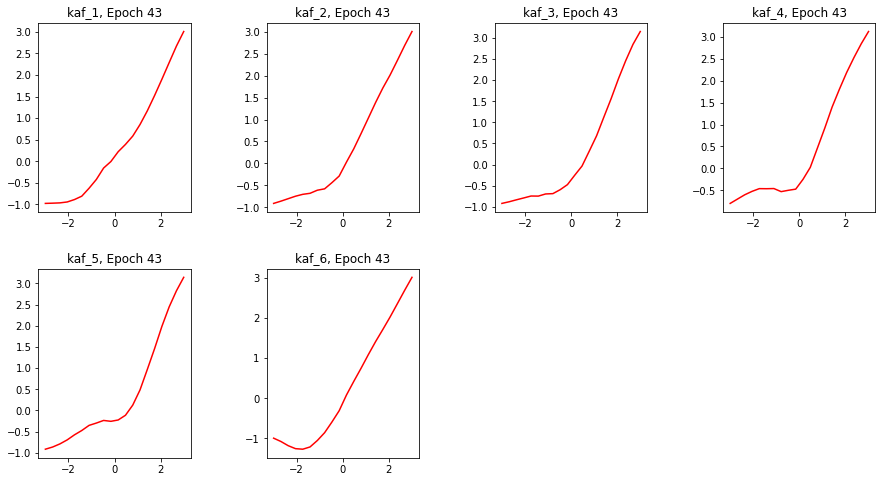

Epoch 43/60
391/391 [==============================] - 80s 205ms/step - loss: 1.2936 - sparse_categorical_accuracy: 0.5154 - val_loss: 1.0932 - val_sparse_categorical_accuracy: 0.7046


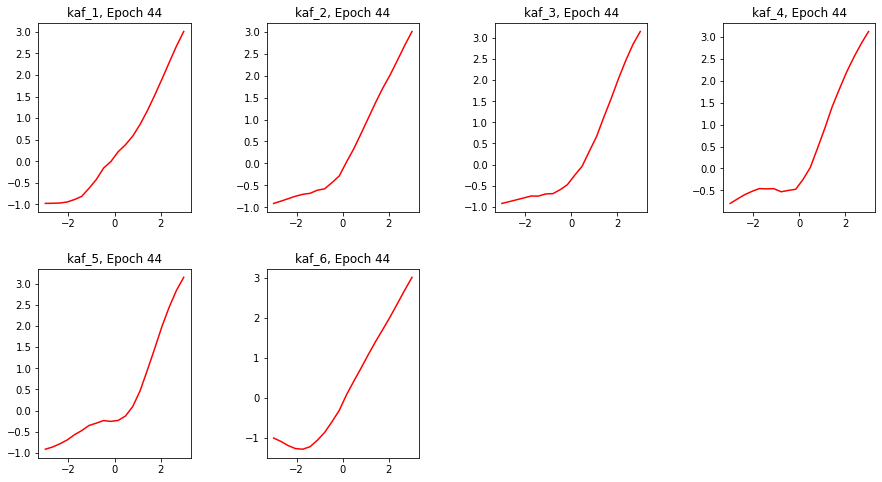

Epoch 44/60
391/391 [==============================] - 80s 205ms/step - loss: 1.2746 - sparse_categorical_accuracy: 0.5210 - val_loss: 1.0696 - val_sparse_categorical_accuracy: 0.6983


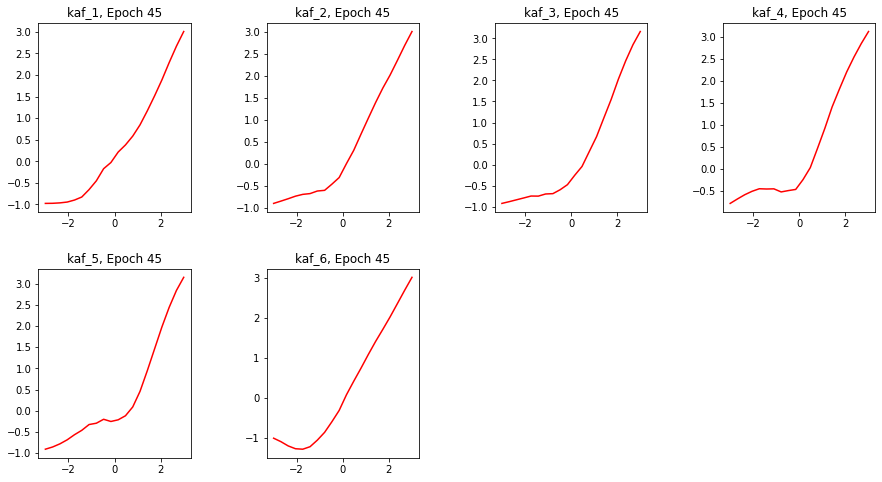

Epoch 45/60
391/391 [==============================] - 80s 205ms/step - loss: 1.2581 - sparse_categorical_accuracy: 0.5260 - val_loss: 1.0776 - val_sparse_categorical_accuracy: 0.7016


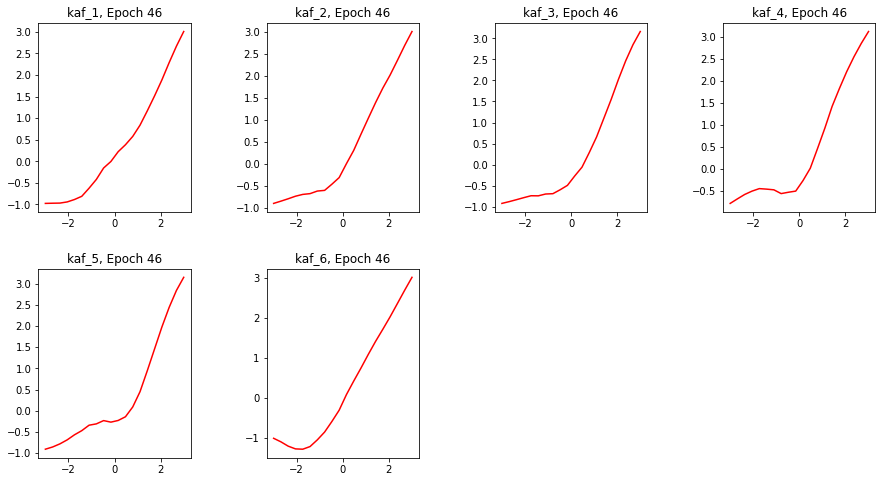

Epoch 46/60
391/391 [==============================] - 80s 205ms/step - loss: 1.2414 - sparse_categorical_accuracy: 0.5301 - val_loss: 1.0491 - val_sparse_categorical_accuracy: 0.7059


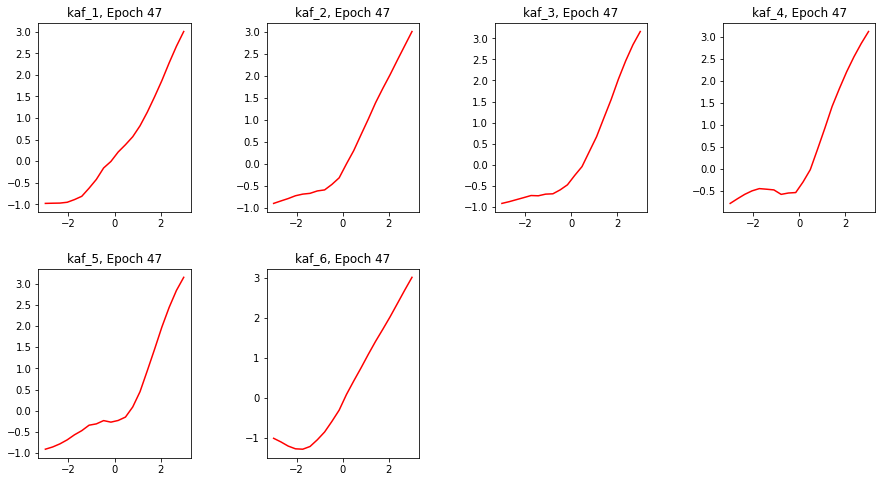

Epoch 47/60
391/391 [==============================] - 80s 205ms/step - loss: 1.2248 - sparse_categorical_accuracy: 0.5374 - val_loss: 1.0439 - val_sparse_categorical_accuracy: 0.7141


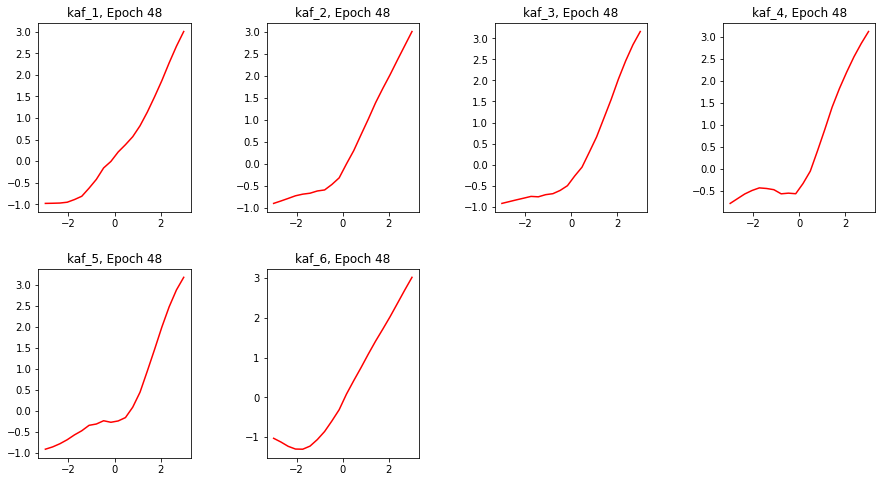

Epoch 48/60
391/391 [==============================] - 80s 205ms/step - loss: 1.2092 - sparse_categorical_accuracy: 0.5409 - val_loss: 1.0149 - val_sparse_categorical_accuracy: 0.7250


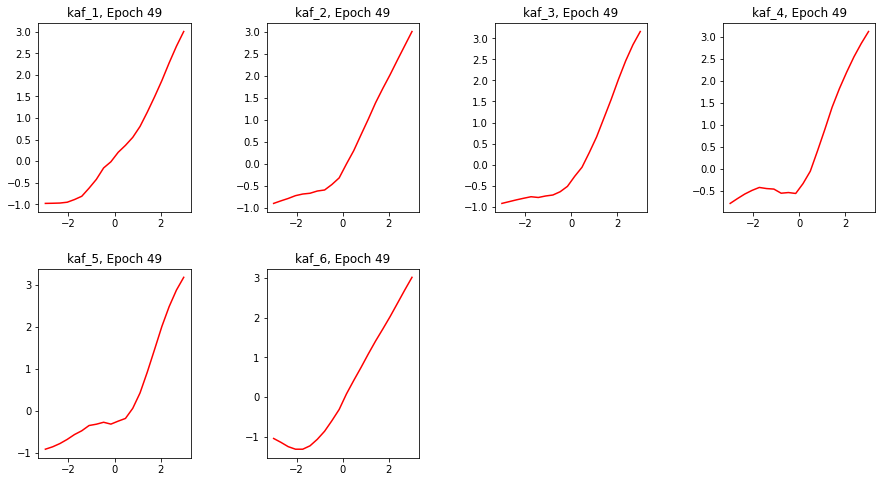

Epoch 49/60
391/391 [==============================] - 80s 205ms/step - loss: 1.1956 - sparse_categorical_accuracy: 0.5434 - val_loss: 1.0017 - val_sparse_categorical_accuracy: 0.7237


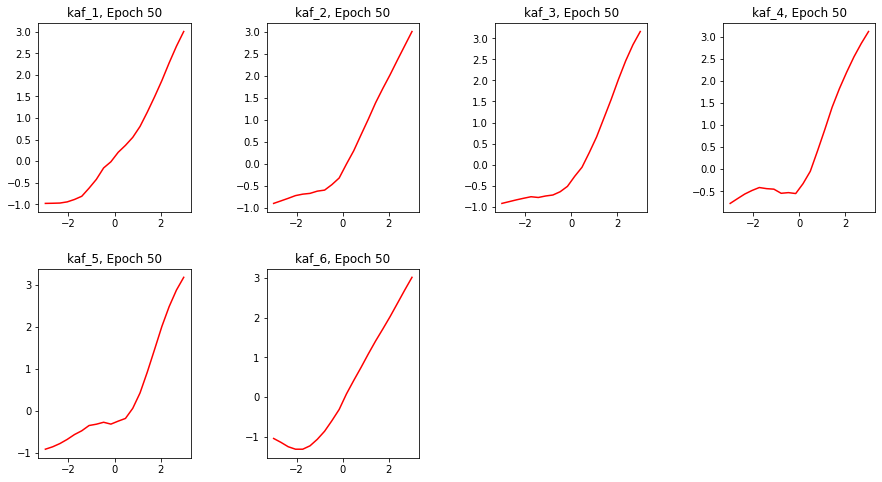

Epoch 50/60
391/391 [==============================] - 80s 205ms/step - loss: 1.1751 - sparse_categorical_accuracy: 0.5518 - val_loss: 0.9862 - val_sparse_categorical_accuracy: 0.7271


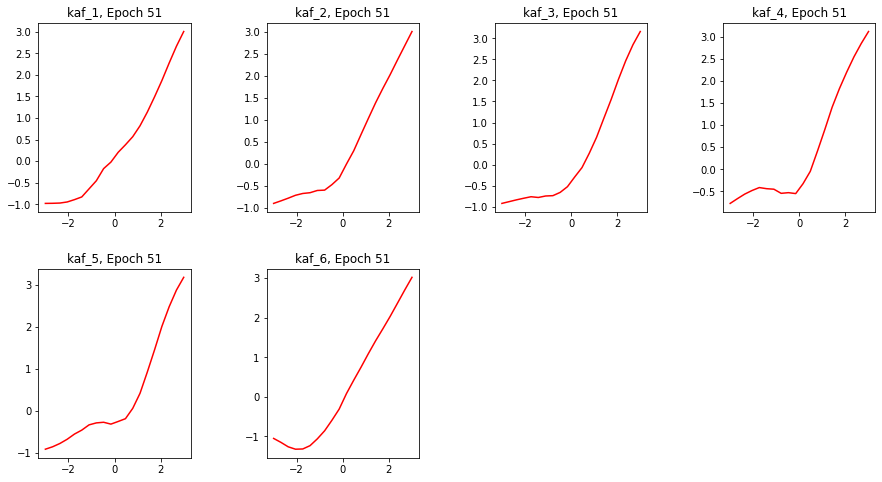

Epoch 51/60
391/391 [==============================] - 80s 205ms/step - loss: 1.1626 - sparse_categorical_accuracy: 0.5544 - val_loss: 0.9967 - val_sparse_categorical_accuracy: 0.7246


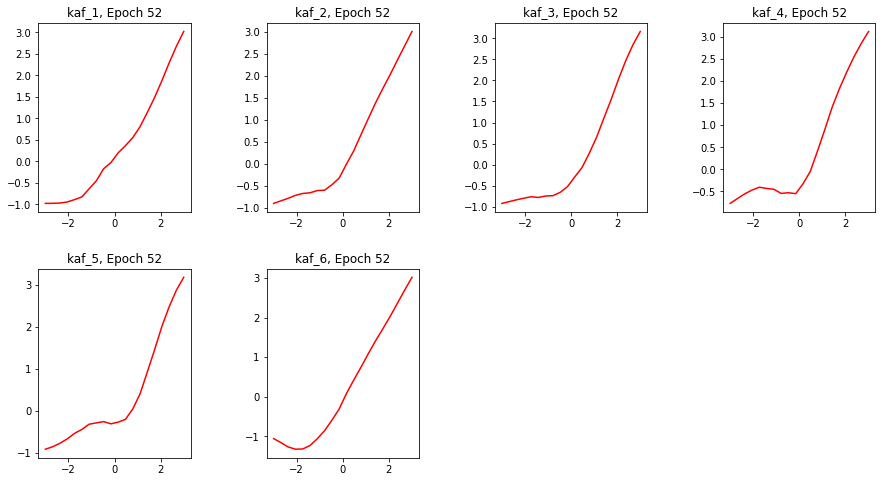

Epoch 52/60
391/391 [==============================] - 80s 205ms/step - loss: 1.1482 - sparse_categorical_accuracy: 0.5609 - val_loss: 0.9829 - val_sparse_categorical_accuracy: 0.7375


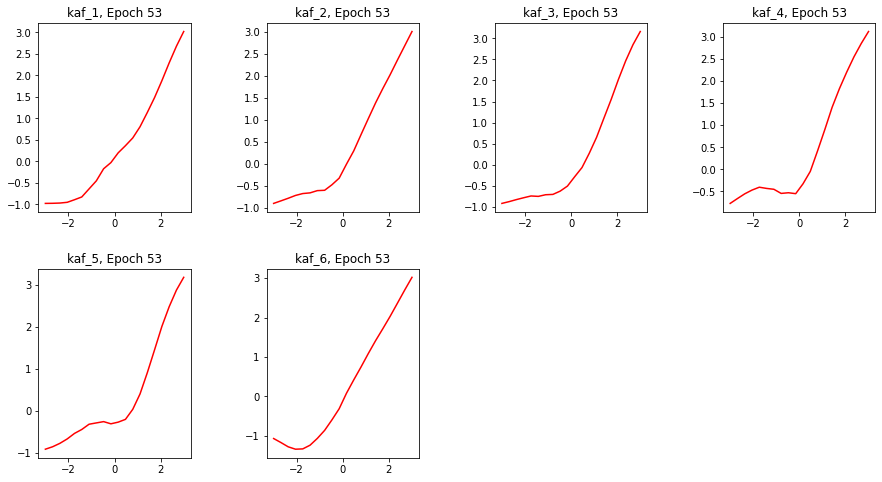

Epoch 53/60
391/391 [==============================] - 80s 205ms/step - loss: 1.1307 - sparse_categorical_accuracy: 0.5658 - val_loss: 0.9684 - val_sparse_categorical_accuracy: 0.7287


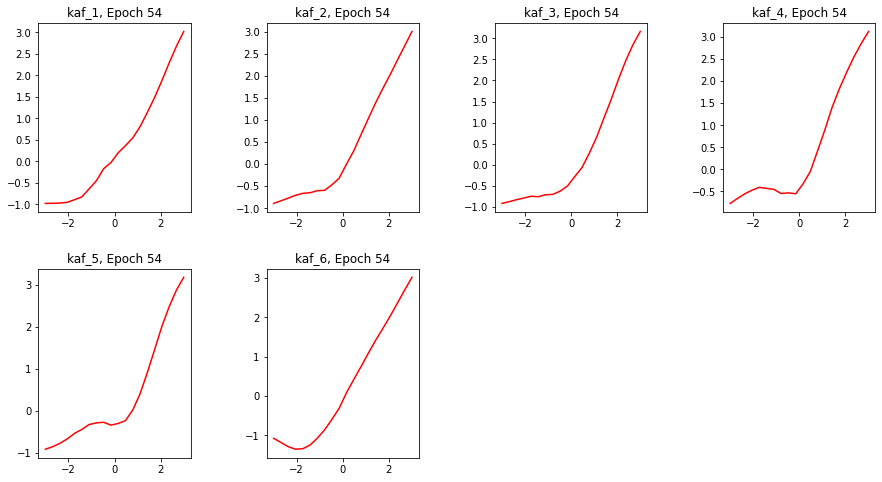

Epoch 54/60
391/391 [==============================] - 80s 205ms/step - loss: 1.1120 - sparse_categorical_accuracy: 0.5737 - val_loss: 0.9764 - val_sparse_categorical_accuracy: 0.7363


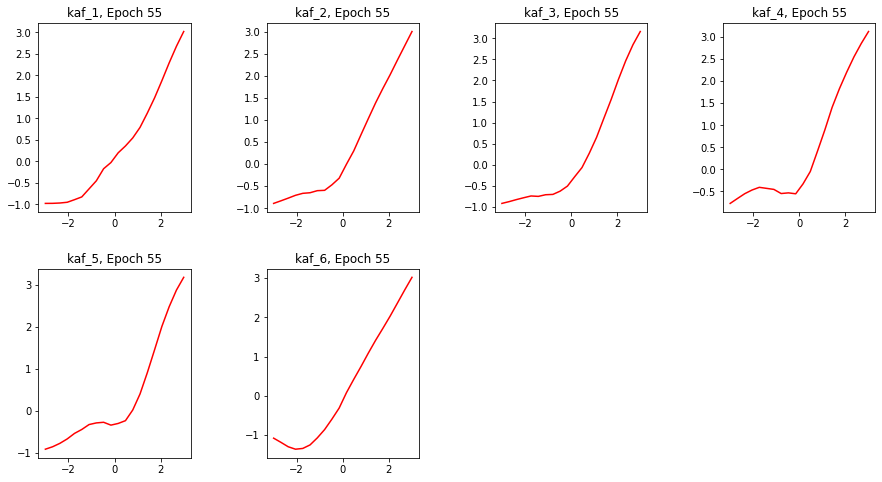

Epoch 55/60
391/391 [==============================] - 80s 206ms/step - loss: 1.1025 - sparse_categorical_accuracy: 0.5789 - val_loss: 0.9609 - val_sparse_categorical_accuracy: 0.7392


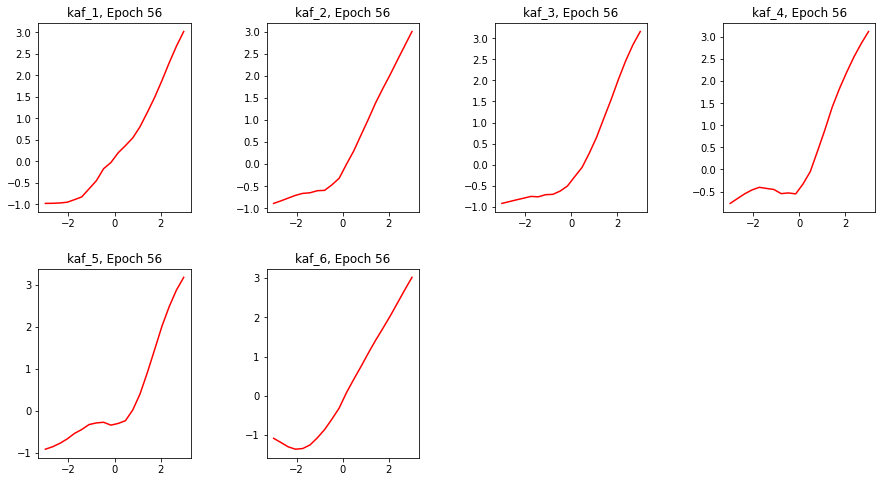

Epoch 56/60
391/391 [==============================] - 80s 206ms/step - loss: 1.0861 - sparse_categorical_accuracy: 0.5808 - val_loss: 0.9425 - val_sparse_categorical_accuracy: 0.7408


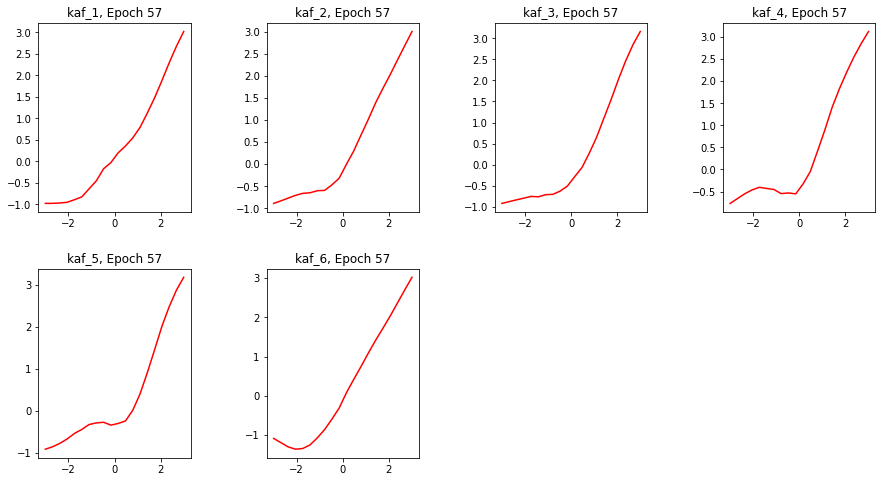

Epoch 57/60
391/391 [==============================] - 80s 206ms/step - loss: 1.0717 - sparse_categorical_accuracy: 0.5859 - val_loss: 0.9312 - val_sparse_categorical_accuracy: 0.7465


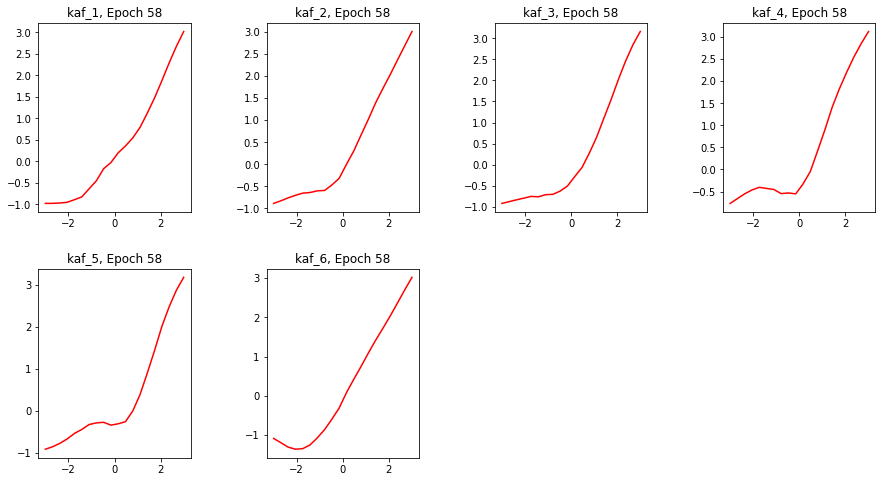

Epoch 58/60
391/391 [==============================] - 81s 206ms/step - loss: 1.0569 - sparse_categorical_accuracy: 0.5920 - val_loss: 0.9274 - val_sparse_categorical_accuracy: 0.7492


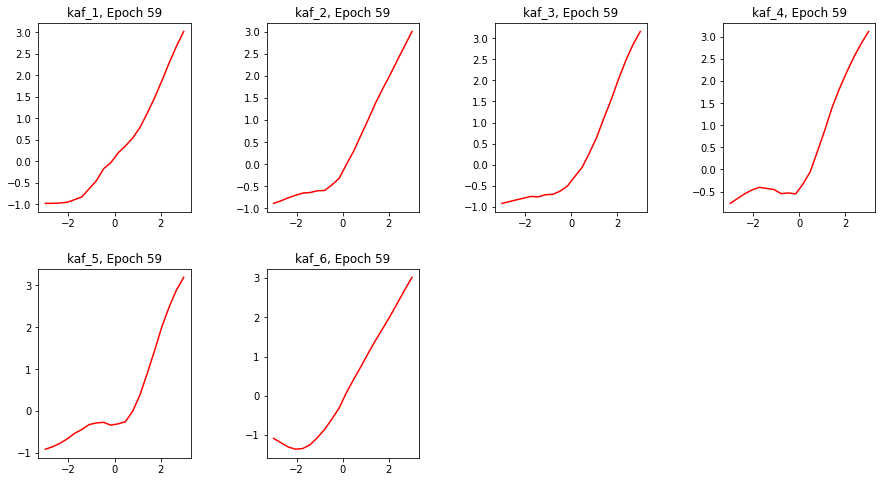

Epoch 59/60
391/391 [==============================] - 80s 206ms/step - loss: 1.0456 - sparse_categorical_accuracy: 0.5953 - val_loss: 0.9236 - val_sparse_categorical_accuracy: 0.7511


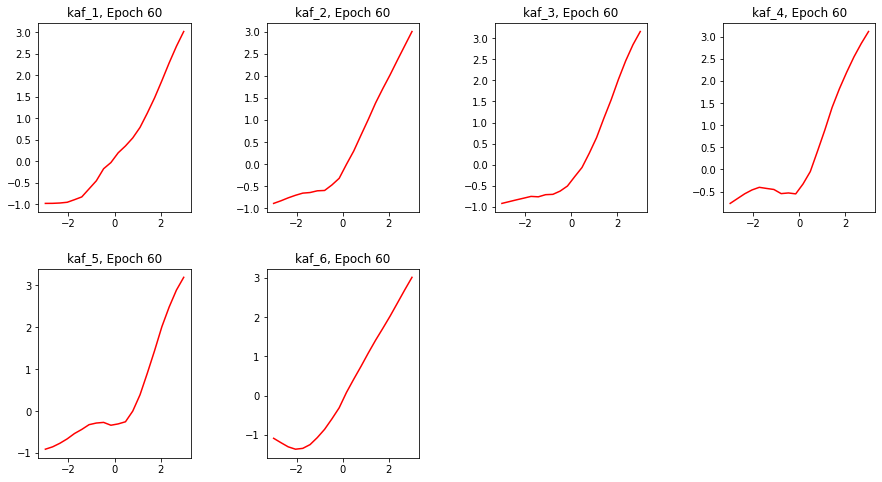

Epoch 60/60
391/391 [==============================] - 81s 206ms/step - loss: 1.0373 - sparse_categorical_accuracy: 0.6013 - val_loss: 0.9237 - val_sparse_categorical_accuracy: 0.7498


In [ ]:
epochs = 60
step_size = np.ceil((len(x_train) / 128) * (epochs/2))

oclr = tfa.optimizers.TriangularCyclicalLearningRate(initial_learning_rate = 0.0001, maximal_learning_rate = 0.1, step_size = step_size)

rob_kafelu_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = oclr),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )
history_kafelu = rob_kafelu_vgg.fit(x = train, epochs = epochs, batch_size = 128, validation_data = test, callbacks=[activationsf.plot_kafs_epoch_wise(6)])

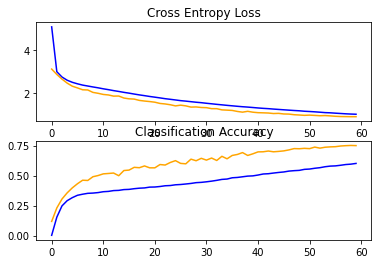

In [ ]:
summarize_diagnostics(history_kafelu)

In [ ]:
rob_kafelu_vgg.save('./rob_kafelu_vgg')
!zip -r rob_kafelu_vgg.zip ./rob_kafelu_vgg
from google.colab import files
files.download('./rob_kafelu_vgg.zip')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ./rob_kafelu_vgg/assets
  adding: rob_kafelu_vgg/ (stored 0%)
  adding: rob_kafelu_vgg/variables/ (stored 0%)
  adding: rob_kafelu_vgg/variables/variables.index (deflated 69%)
  adding: rob_kafelu_vgg/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: rob_kafelu_vgg/assets/ (stored 0%)
  adding: rob_kafelu_vgg/saved_model.pb (deflated 90%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Swish Kaf Case

In [ ]:
BATCH = 128
STEPS_PER_EPOCH = np.ceil(len(x_train) / BATCH)

swish = tf.keras.activations.swish
rob_kafswish_vgg = rob_vgg(act = None , is_kaf = True, ridge=swish, moving=False)
rob_kafswish_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

lr_finder = LRFinder(rob_kafswish_vgg)
lr_finder.find(train, start_lr=1e-4, end_lr=2, epochs=7,
               steps_per_epoch=STEPS_PER_EPOCH)

Epoch 1/7
391/391 [==============================] - 76s 194ms/step - loss: 5.3988 - sparse_categorical_accuracy: 2.4000e-04
Epoch 2/7
391/391 [==============================] - 76s 195ms/step - loss: 3.4331 - sparse_categorical_accuracy: 0.1133
Epoch 3/7
391/391 [==============================] - 76s 195ms/step - loss: 2.9995 - sparse_categorical_accuracy: 0.1797
Epoch 4/7
391/391 [==============================] - 76s 196ms/step - loss: 2.6900 - sparse_categorical_accuracy: 0.2623
Epoch 5/7
391/391 [==============================] - 76s 196ms/step - loss: 2.4782 - sparse_categorical_accuracy: 0.3149
Epoch 6/7
391/391 [==============================] - 77s 196ms/step - loss: 2.3582 - sparse_categorical_accuracy: 0.3121
Epoch 7/7
391/391 [==============================] - 76s 195ms/step - loss: 2.3468 - sparse_categorical_accuracy: 0.2634


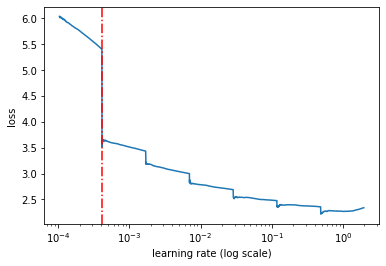

In [ ]:
axs = plot_loss()
axs.axvline(x=lr_finder.get_best_lr(sma=20), c='r', linestyle='-.')

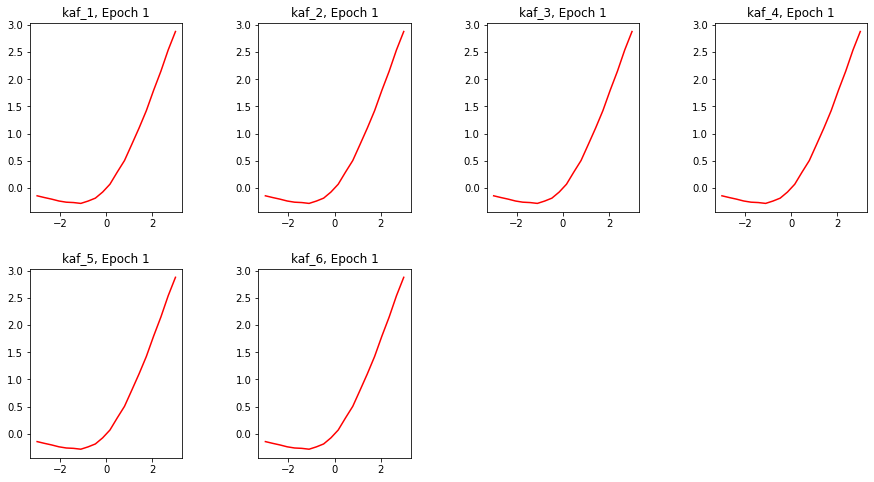

Epoch 1/60
391/391 [==============================] - 79s 201ms/step - loss: 3.6249 - sparse_categorical_accuracy: 0.0118 - val_loss: 3.0333 - val_sparse_categorical_accuracy: 0.1064


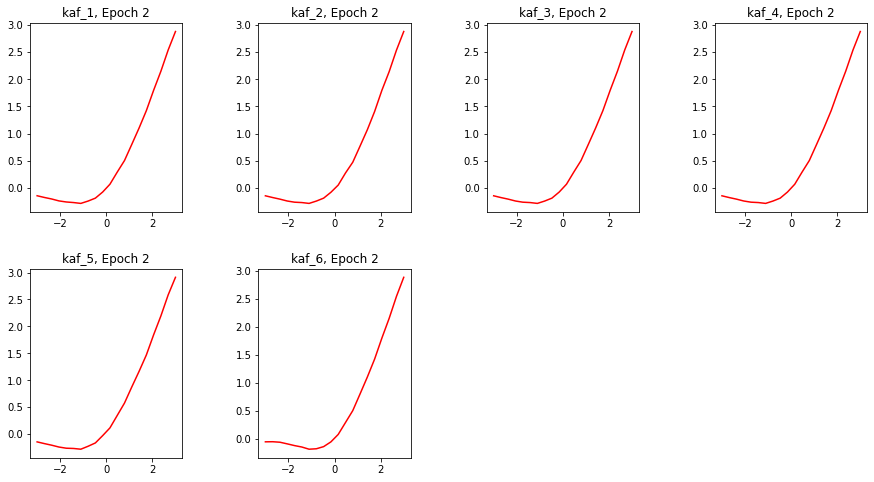

Epoch 2/60
391/391 [==============================] - 79s 202ms/step - loss: 2.8709 - sparse_categorical_accuracy: 0.1950 - val_loss: 2.6109 - val_sparse_categorical_accuracy: 0.3046


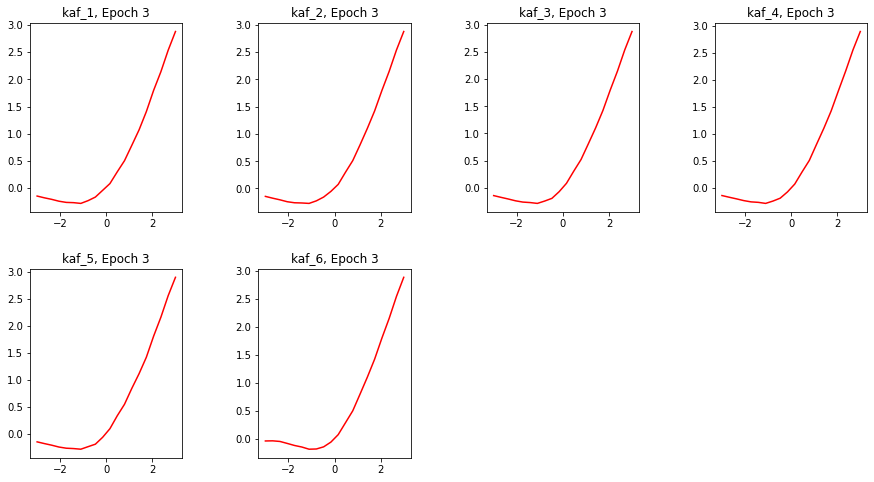

Epoch 3/60
391/391 [==============================] - 79s 202ms/step - loss: 2.5406 - sparse_categorical_accuracy: 0.2894 - val_loss: 2.2572 - val_sparse_categorical_accuracy: 0.4225


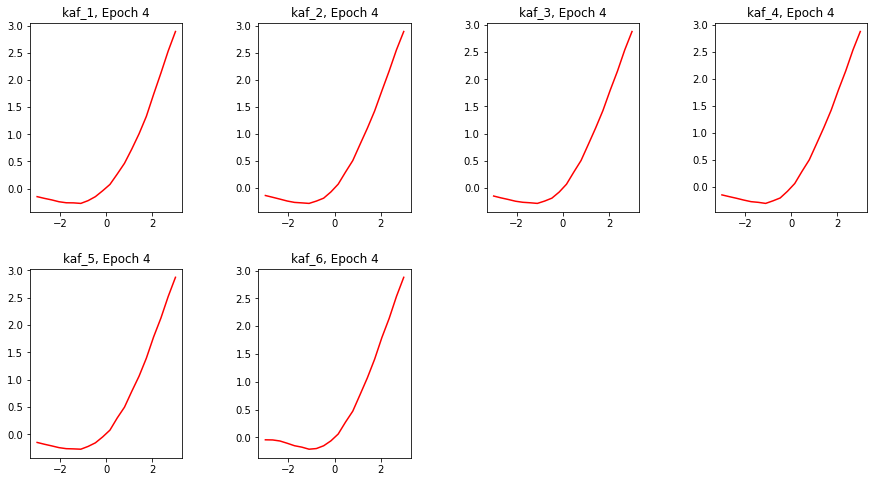

Epoch 4/60
391/391 [==============================] - 79s 202ms/step - loss: 2.3658 - sparse_categorical_accuracy: 0.3235 - val_loss: 2.1116 - val_sparse_categorical_accuracy: 0.4417


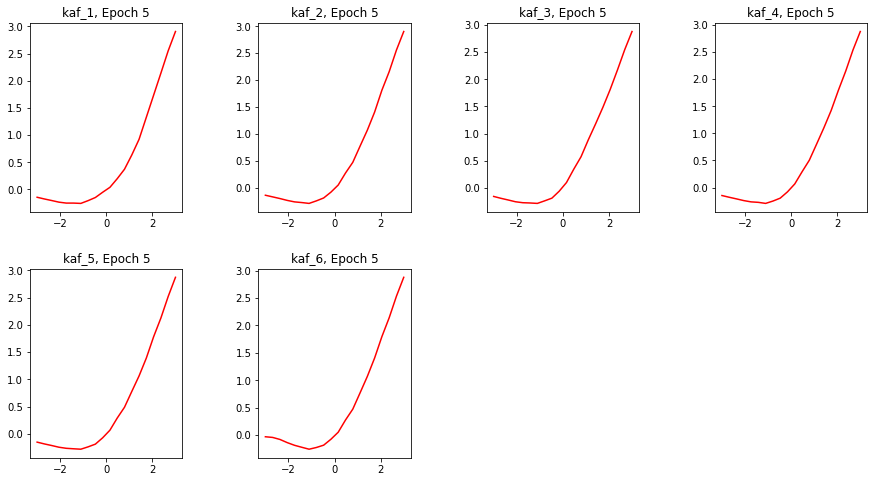

Epoch 5/60
391/391 [==============================] - 79s 202ms/step - loss: 2.2363 - sparse_categorical_accuracy: 0.3404 - val_loss: 1.9699 - val_sparse_categorical_accuracy: 0.4922


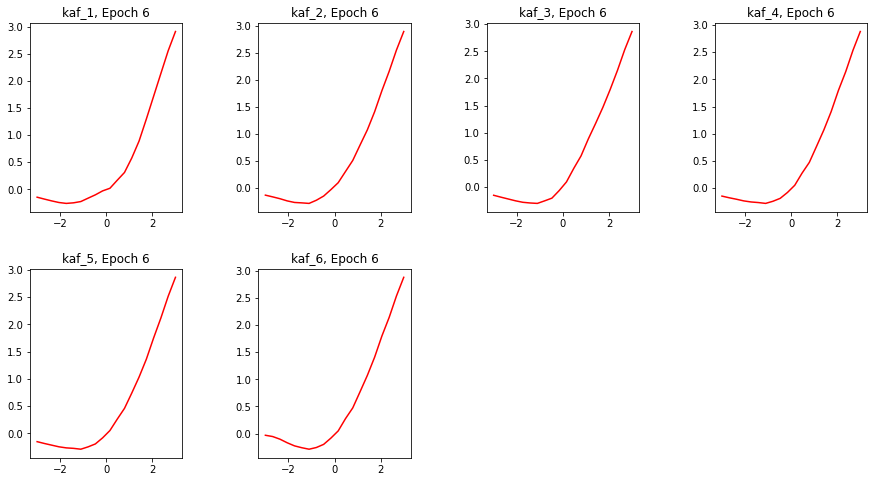

Epoch 6/60
391/391 [==============================] - 79s 202ms/step - loss: 2.1201 - sparse_categorical_accuracy: 0.3522 - val_loss: 1.8728 - val_sparse_categorical_accuracy: 0.5084


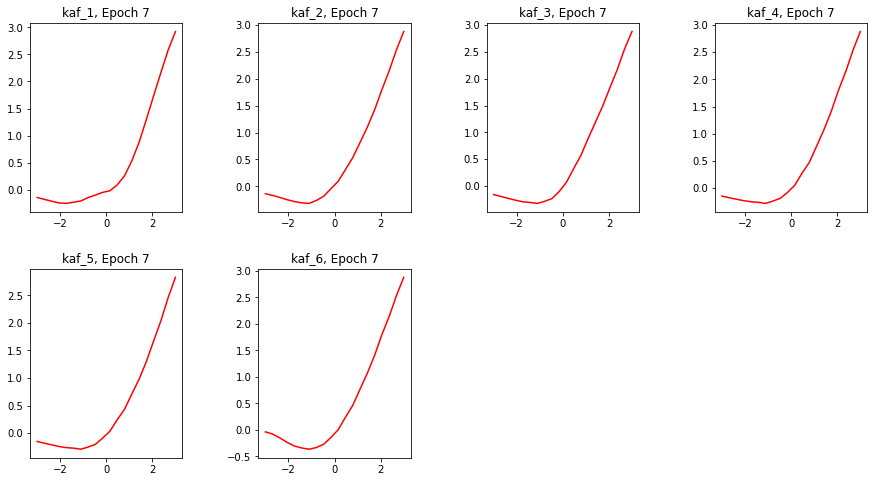

Epoch 7/60
391/391 [==============================] - 79s 202ms/step - loss: 2.0128 - sparse_categorical_accuracy: 0.3641 - val_loss: 1.7821 - val_sparse_categorical_accuracy: 0.5153


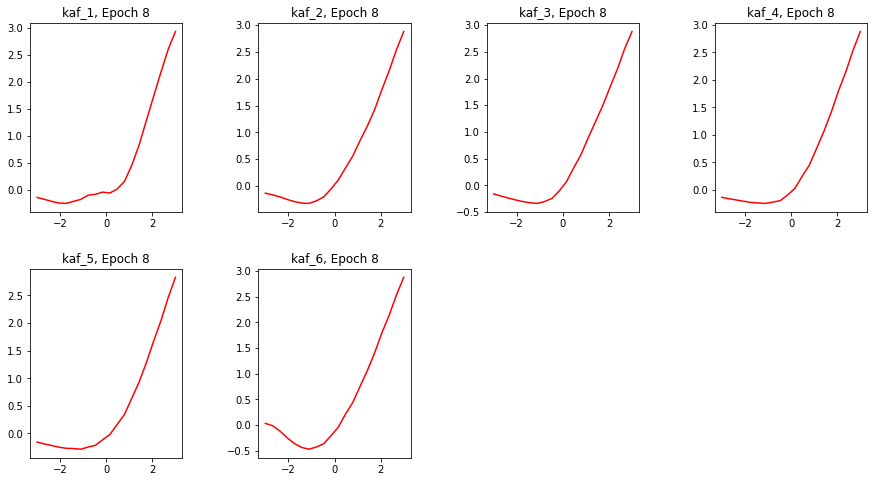

Epoch 8/60
391/391 [==============================] - 79s 202ms/step - loss: 1.9220 - sparse_categorical_accuracy: 0.3745 - val_loss: 1.7046 - val_sparse_categorical_accuracy: 0.5503


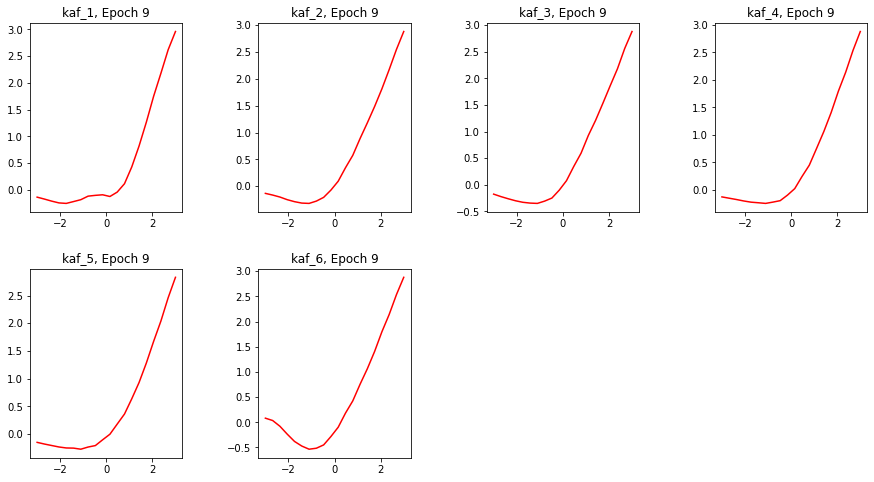

Epoch 9/60
391/391 [==============================] - 79s 202ms/step - loss: 1.8363 - sparse_categorical_accuracy: 0.3862 - val_loss: 1.6454 - val_sparse_categorical_accuracy: 0.5521


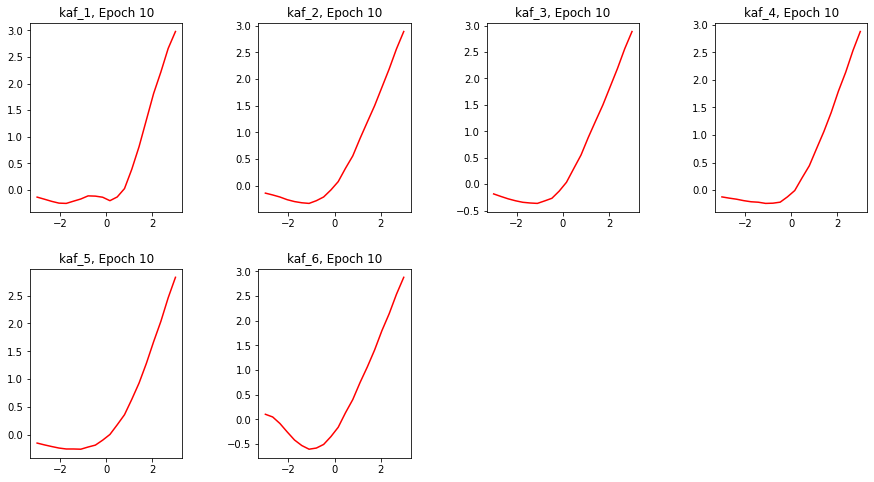

Epoch 10/60
391/391 [==============================] - 79s 203ms/step - loss: 1.7697 - sparse_categorical_accuracy: 0.3928 - val_loss: 1.5683 - val_sparse_categorical_accuracy: 0.5865


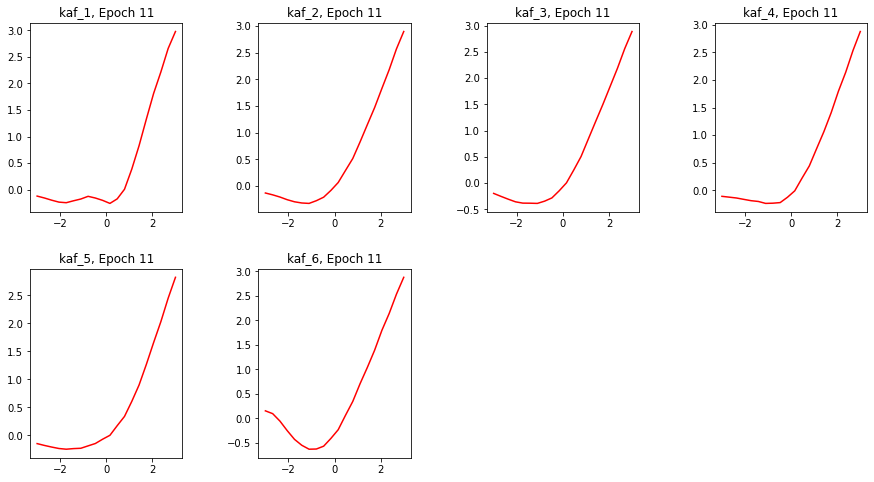

Epoch 11/60
391/391 [==============================] - 79s 202ms/step - loss: 1.7117 - sparse_categorical_accuracy: 0.4016 - val_loss: 1.5679 - val_sparse_categorical_accuracy: 0.5464


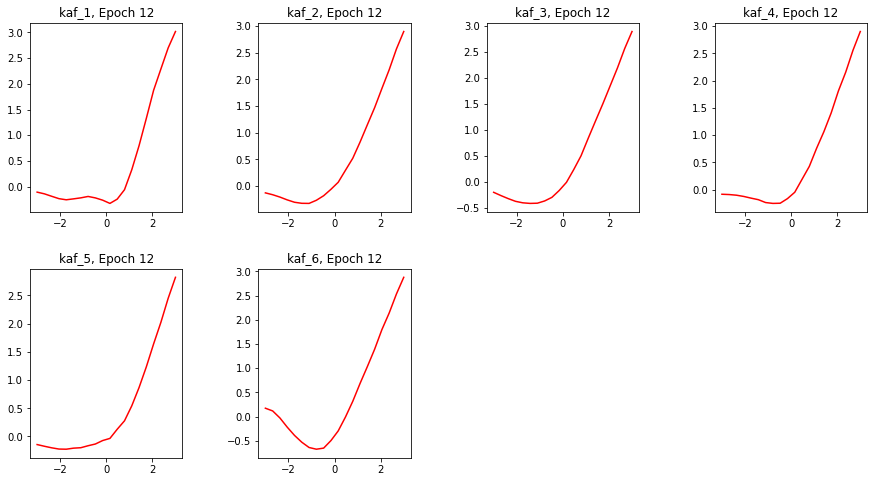

Epoch 12/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6679 - sparse_categorical_accuracy: 0.4077 - val_loss: 1.5013 - val_sparse_categorical_accuracy: 0.5355


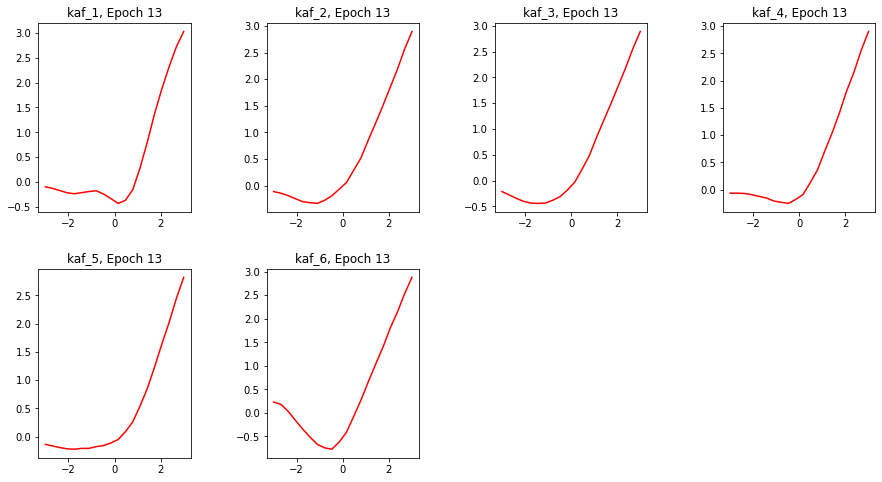

Epoch 13/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6347 - sparse_categorical_accuracy: 0.4099 - val_loss: 1.4383 - val_sparse_categorical_accuracy: 0.5858


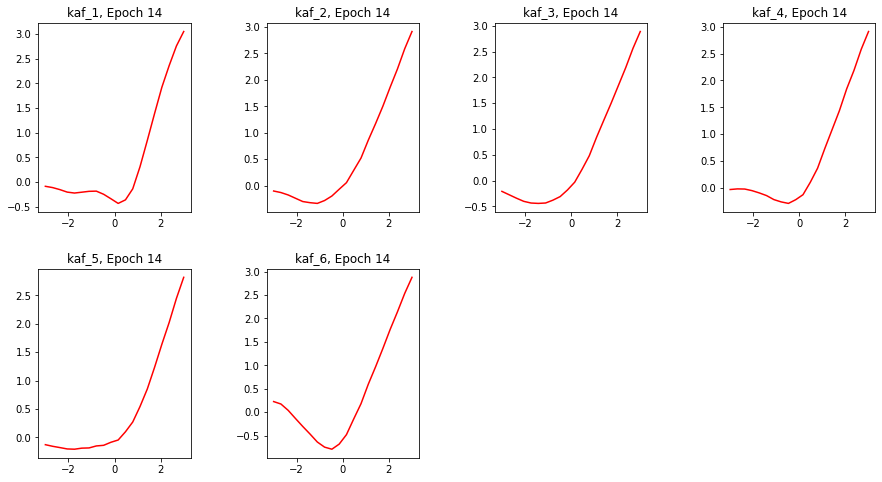

Epoch 14/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6068 - sparse_categorical_accuracy: 0.4216 - val_loss: 1.4717 - val_sparse_categorical_accuracy: 0.5748


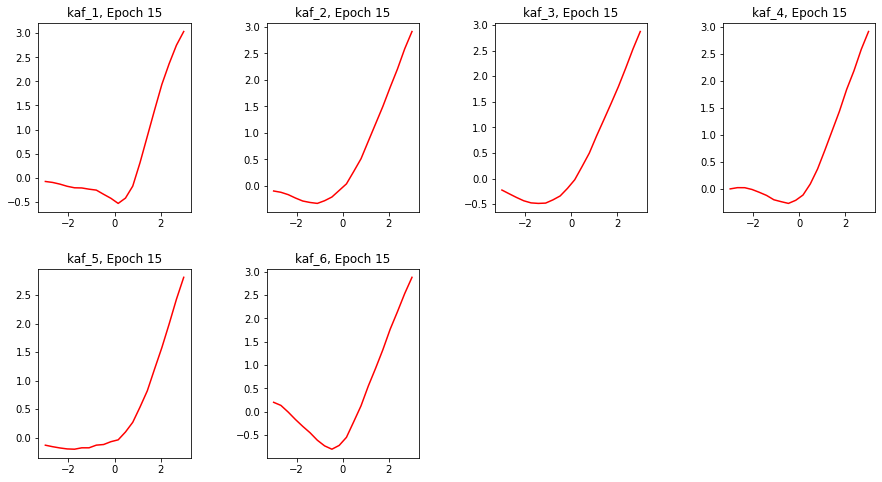

Epoch 15/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5834 - sparse_categorical_accuracy: 0.4260 - val_loss: 1.3657 - val_sparse_categorical_accuracy: 0.6019


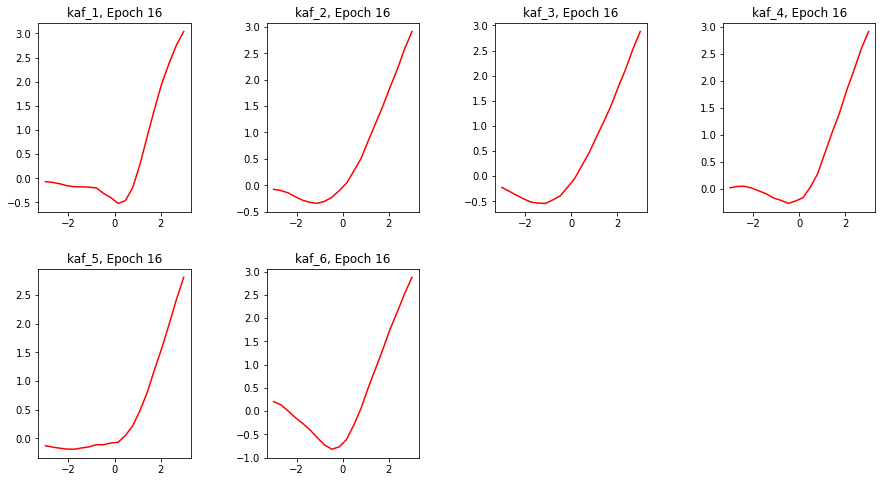

Epoch 16/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5672 - sparse_categorical_accuracy: 0.4306 - val_loss: 1.4805 - val_sparse_categorical_accuracy: 0.6122


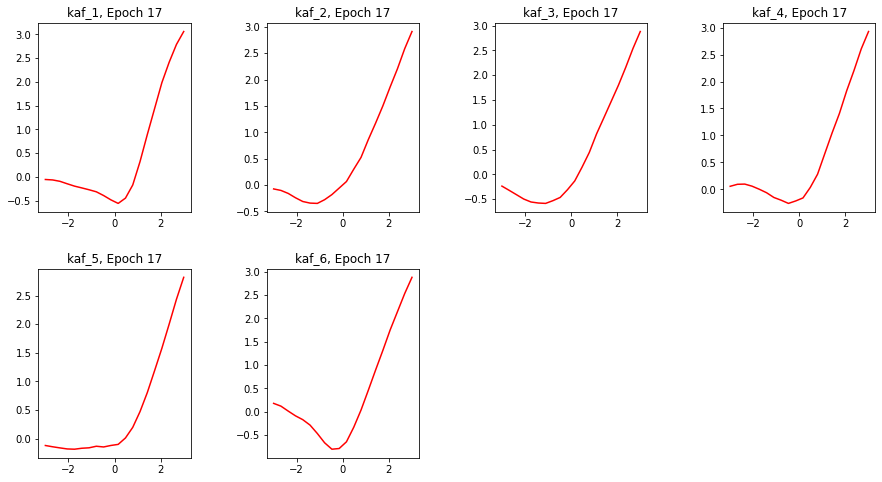

Epoch 17/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5574 - sparse_categorical_accuracy: 0.4392 - val_loss: 1.4026 - val_sparse_categorical_accuracy: 0.5979


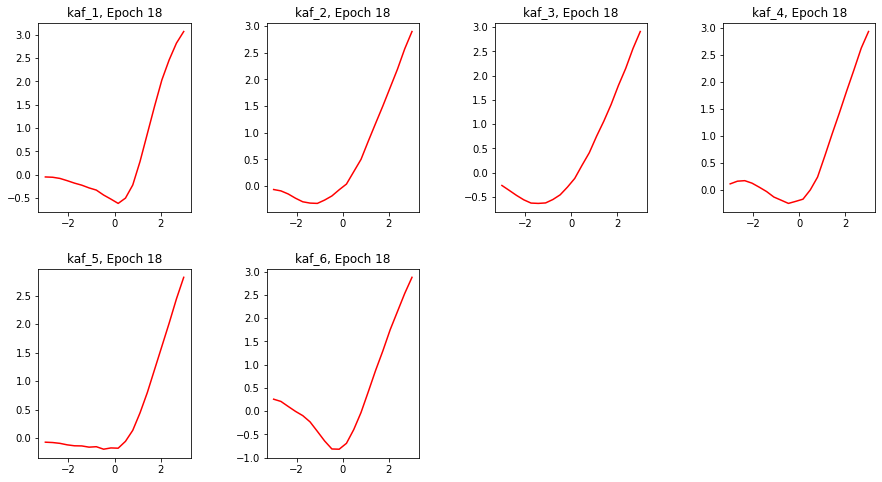

Epoch 18/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5540 - sparse_categorical_accuracy: 0.4390 - val_loss: 1.4193 - val_sparse_categorical_accuracy: 0.6144


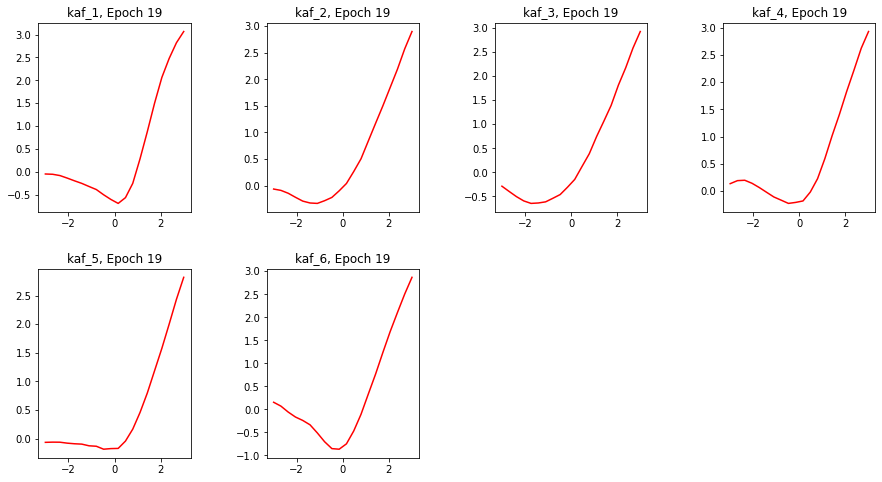

Epoch 19/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5514 - sparse_categorical_accuracy: 0.4437 - val_loss: 1.4886 - val_sparse_categorical_accuracy: 0.5836


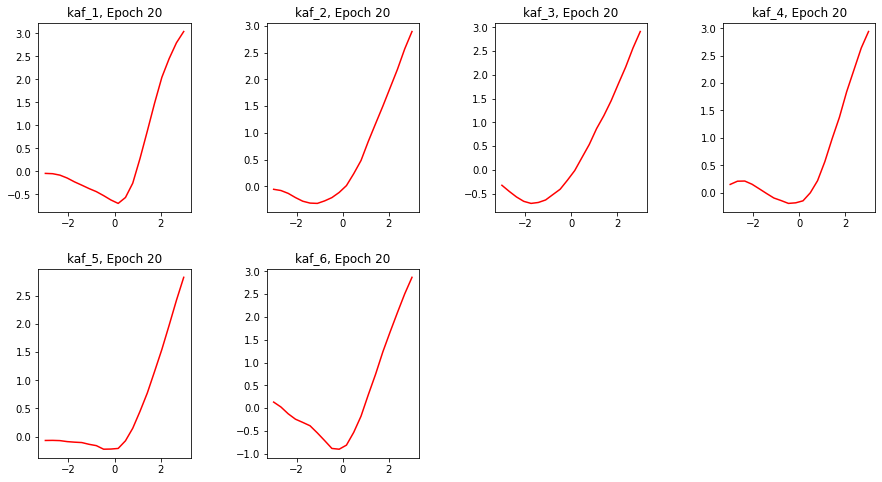

Epoch 20/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5571 - sparse_categorical_accuracy: 0.4463 - val_loss: 1.5196 - val_sparse_categorical_accuracy: 0.5369


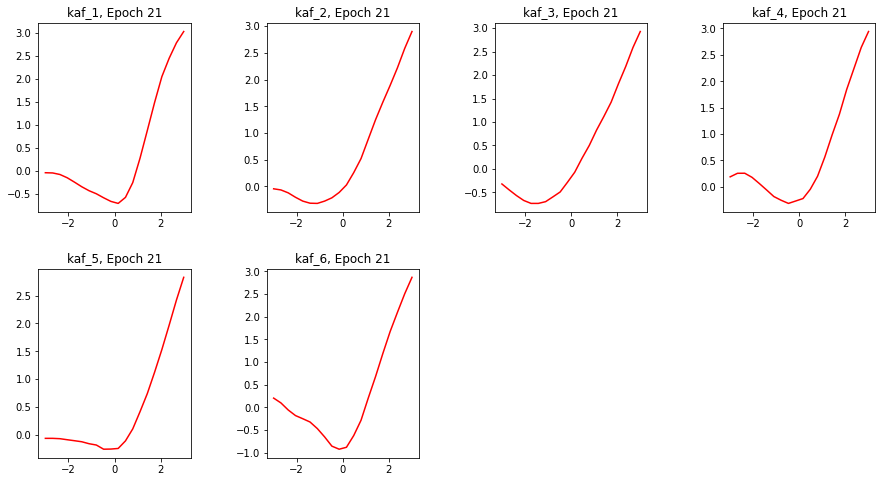

Epoch 21/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5625 - sparse_categorical_accuracy: 0.4454 - val_loss: 1.4421 - val_sparse_categorical_accuracy: 0.6232


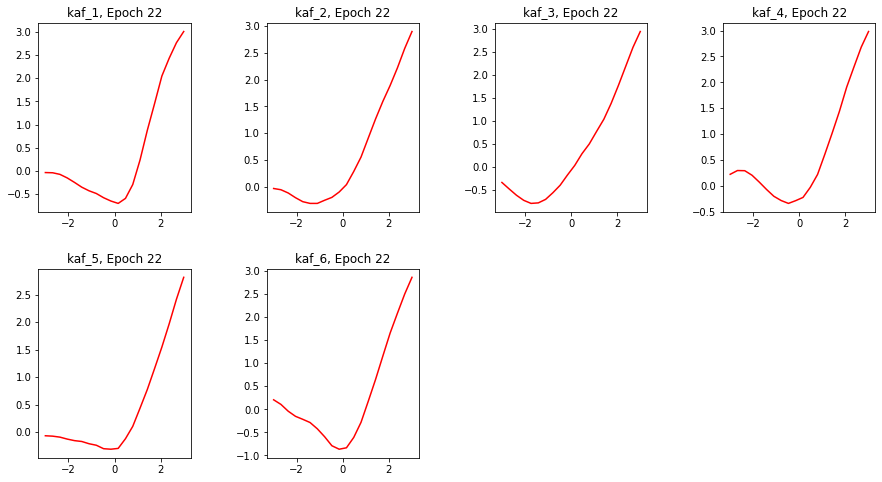

Epoch 22/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5722 - sparse_categorical_accuracy: 0.4448 - val_loss: 1.4365 - val_sparse_categorical_accuracy: 0.6023


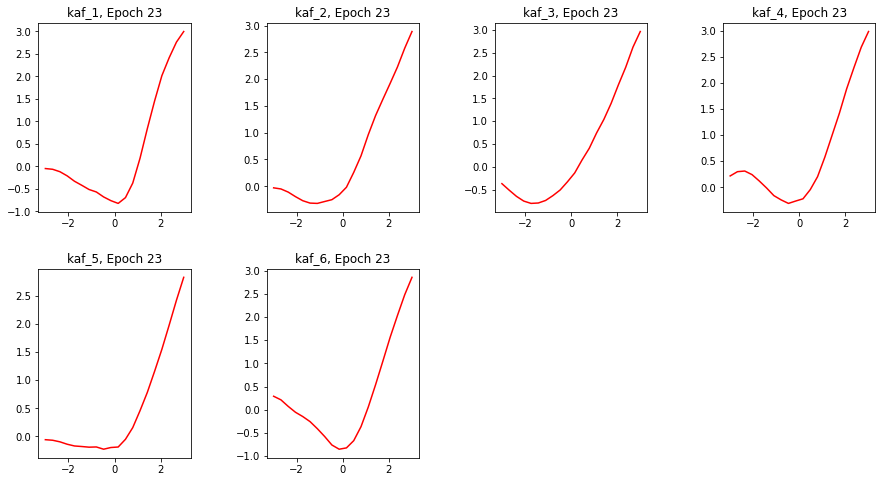

Epoch 23/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5690 - sparse_categorical_accuracy: 0.4484 - val_loss: 1.5624 - val_sparse_categorical_accuracy: 0.5450


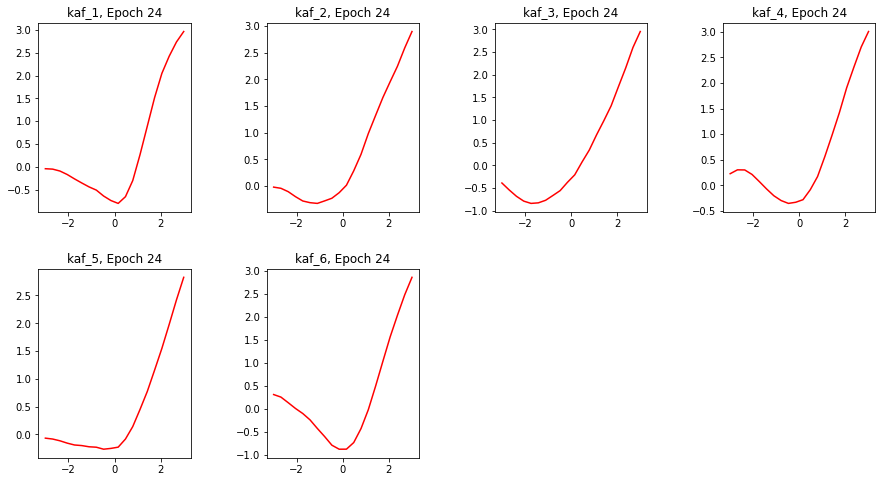

Epoch 24/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5901 - sparse_categorical_accuracy: 0.4477 - val_loss: 1.4726 - val_sparse_categorical_accuracy: 0.5946


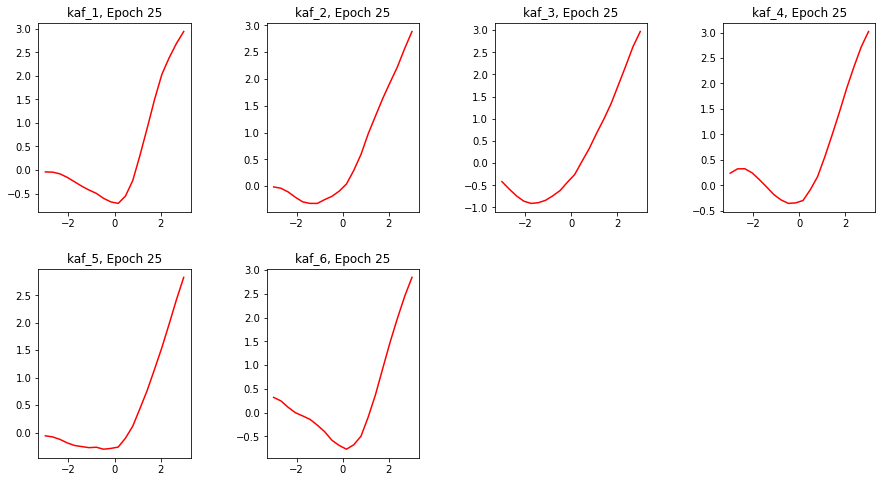

Epoch 25/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6023 - sparse_categorical_accuracy: 0.4451 - val_loss: 1.5681 - val_sparse_categorical_accuracy: 0.5412


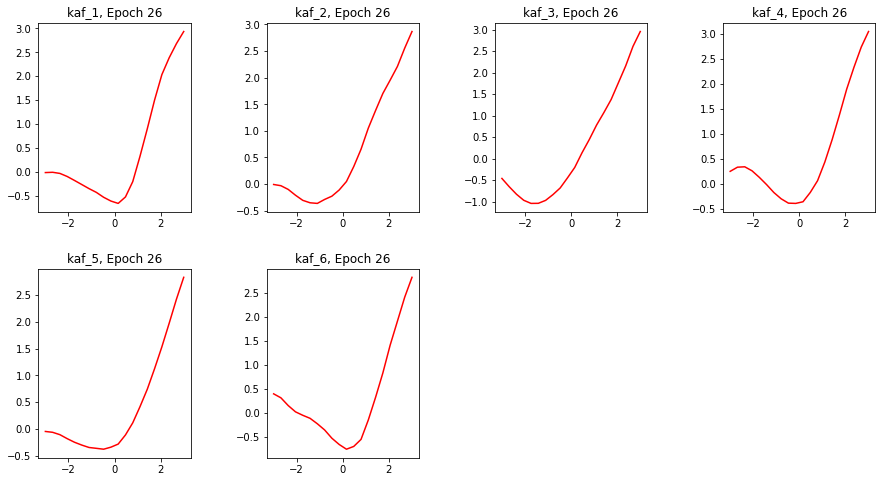

Epoch 26/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6047 - sparse_categorical_accuracy: 0.4481 - val_loss: 1.4048 - val_sparse_categorical_accuracy: 0.6207


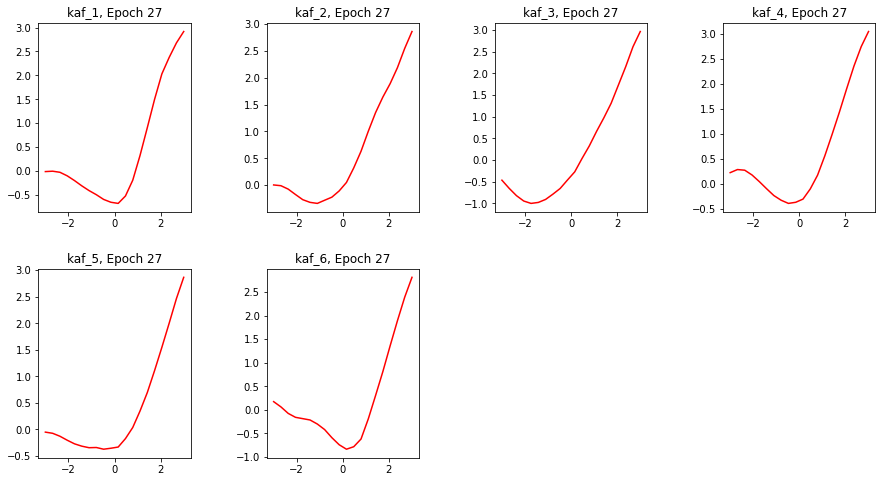

Epoch 27/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6139 - sparse_categorical_accuracy: 0.4475 - val_loss: 1.8404 - val_sparse_categorical_accuracy: 0.4722


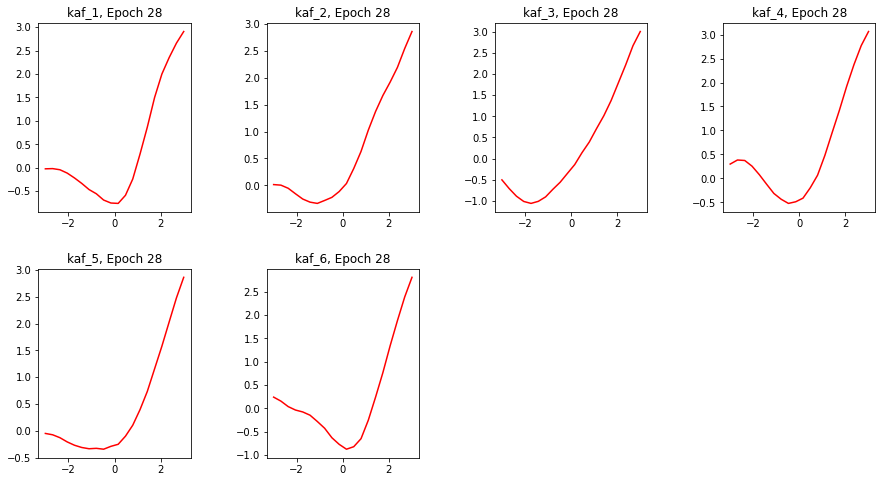

Epoch 28/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6245 - sparse_categorical_accuracy: 0.4453 - val_loss: 1.3489 - val_sparse_categorical_accuracy: 0.6337


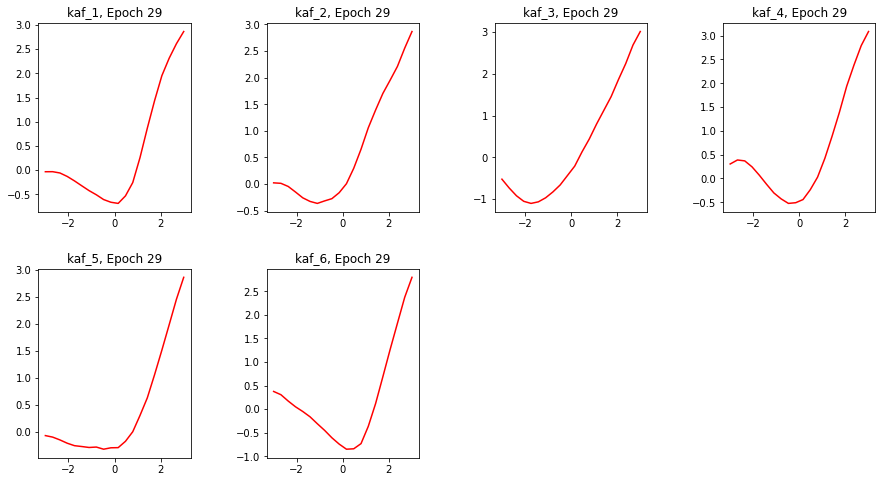

Epoch 29/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6323 - sparse_categorical_accuracy: 0.4469 - val_loss: 1.4608 - val_sparse_categorical_accuracy: 0.6084


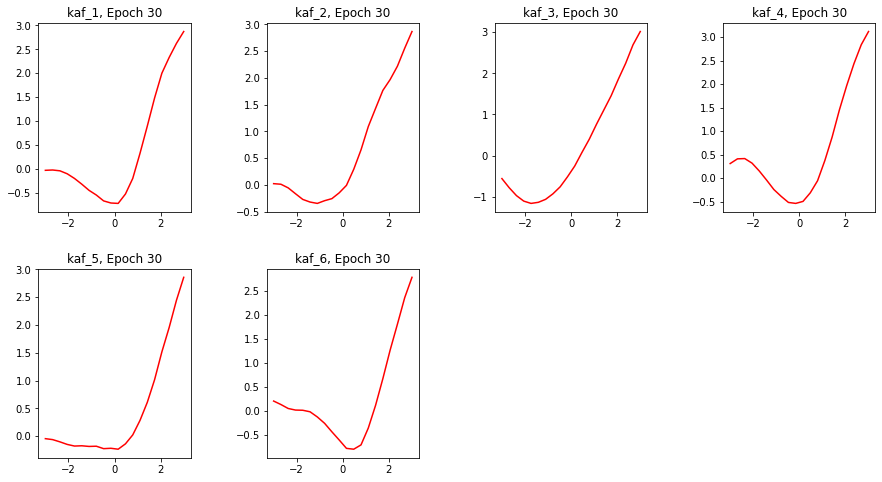

Epoch 30/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6489 - sparse_categorical_accuracy: 0.4454 - val_loss: 1.6913 - val_sparse_categorical_accuracy: 0.5009


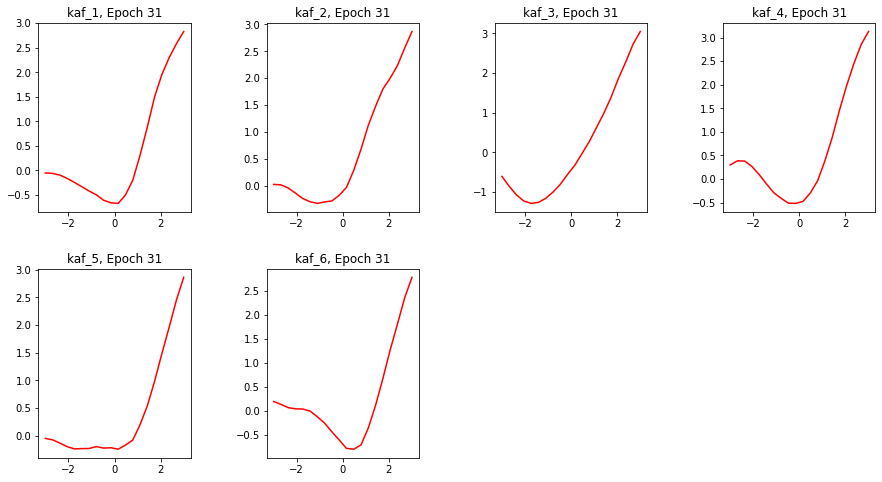

Epoch 31/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6488 - sparse_categorical_accuracy: 0.4470 - val_loss: 1.5022 - val_sparse_categorical_accuracy: 0.6251


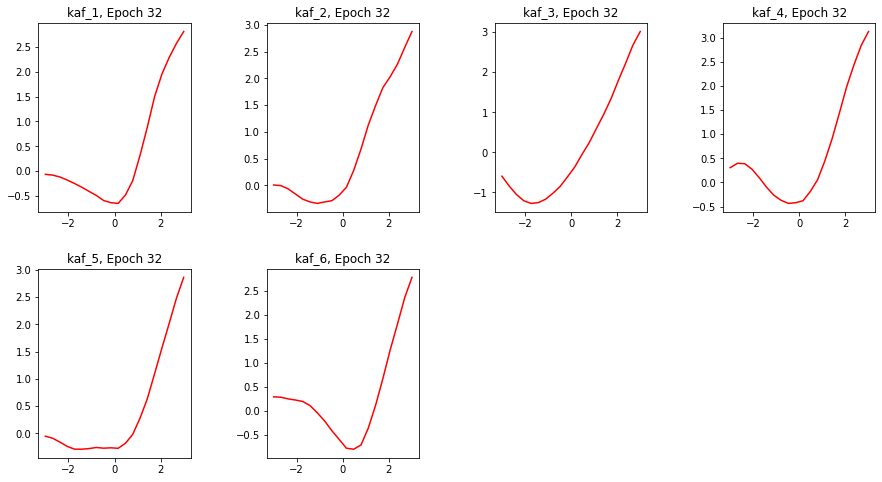

Epoch 32/60
391/391 [==============================] - 79s 202ms/step - loss: 1.6209 - sparse_categorical_accuracy: 0.4522 - val_loss: 1.4783 - val_sparse_categorical_accuracy: 0.5740


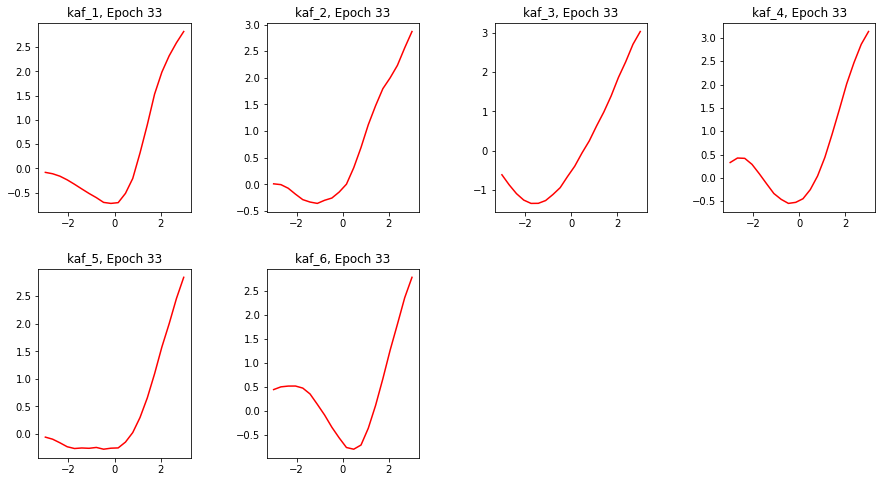

Epoch 33/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5988 - sparse_categorical_accuracy: 0.4574 - val_loss: 1.5872 - val_sparse_categorical_accuracy: 0.5356


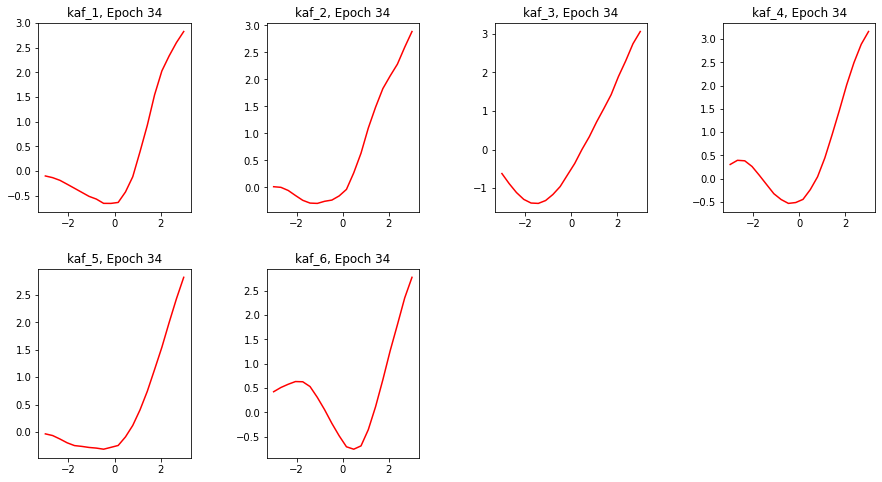

Epoch 34/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5651 - sparse_categorical_accuracy: 0.4648 - val_loss: 1.4753 - val_sparse_categorical_accuracy: 0.5892


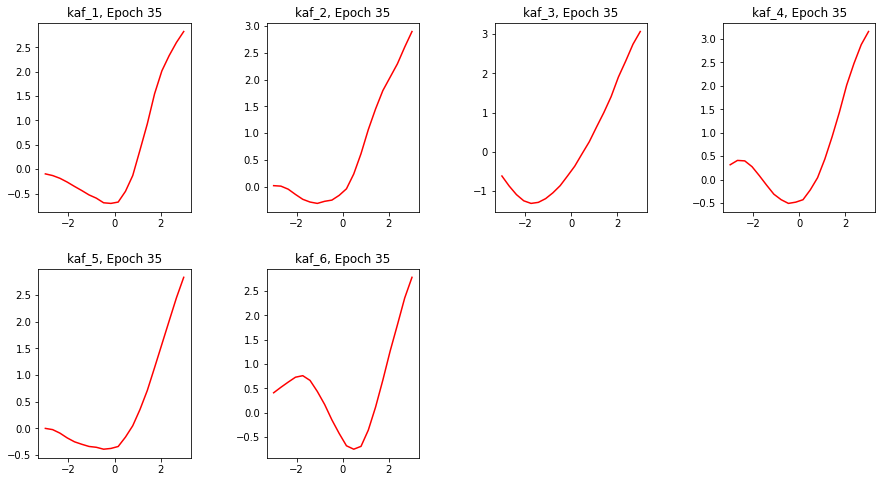

Epoch 35/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5523 - sparse_categorical_accuracy: 0.4652 - val_loss: 1.3925 - val_sparse_categorical_accuracy: 0.6307


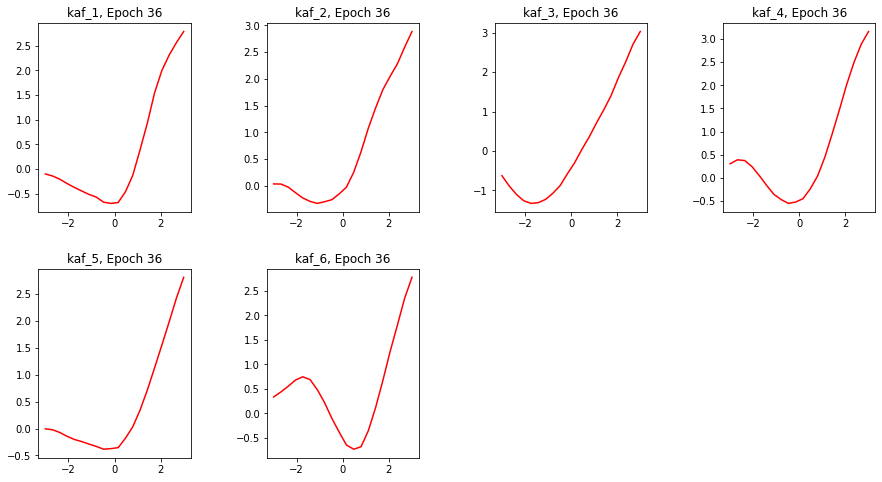

Epoch 36/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5376 - sparse_categorical_accuracy: 0.4720 - val_loss: 1.3688 - val_sparse_categorical_accuracy: 0.6358


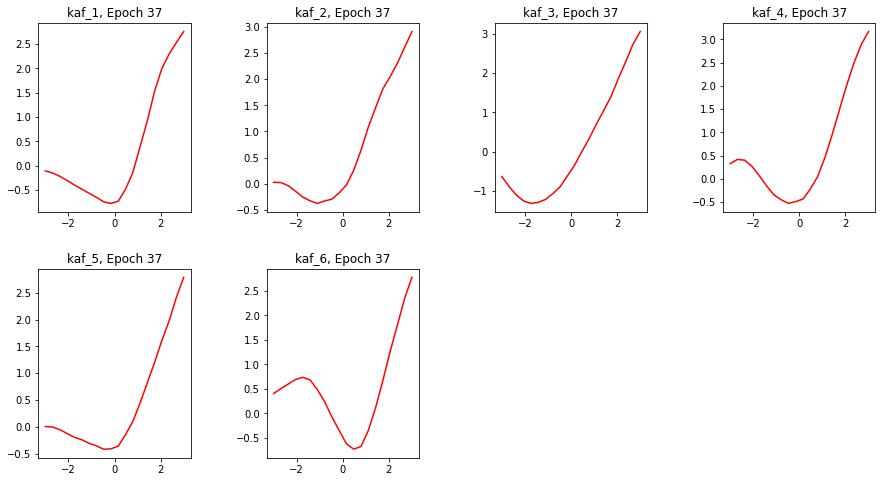

Epoch 37/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5107 - sparse_categorical_accuracy: 0.4751 - val_loss: 1.3746 - val_sparse_categorical_accuracy: 0.6324


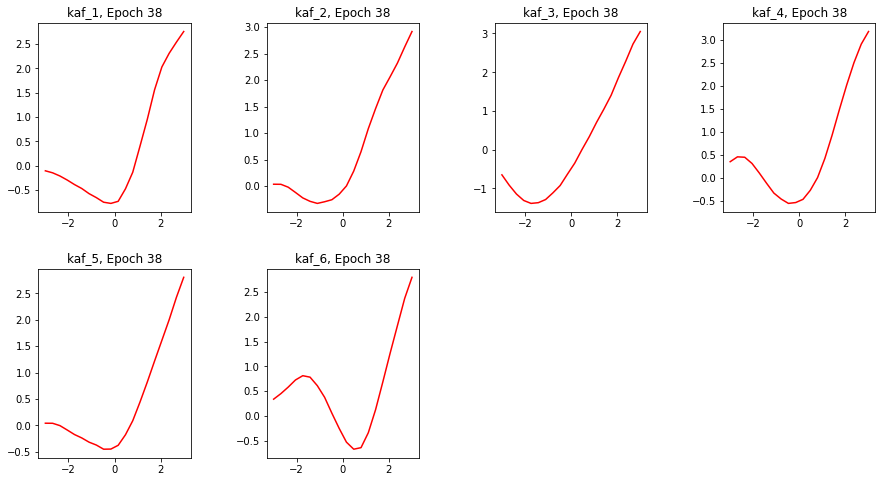

Epoch 38/60
391/391 [==============================] - 79s 202ms/step - loss: 1.5017 - sparse_categorical_accuracy: 0.4783 - val_loss: 1.3216 - val_sparse_categorical_accuracy: 0.6500


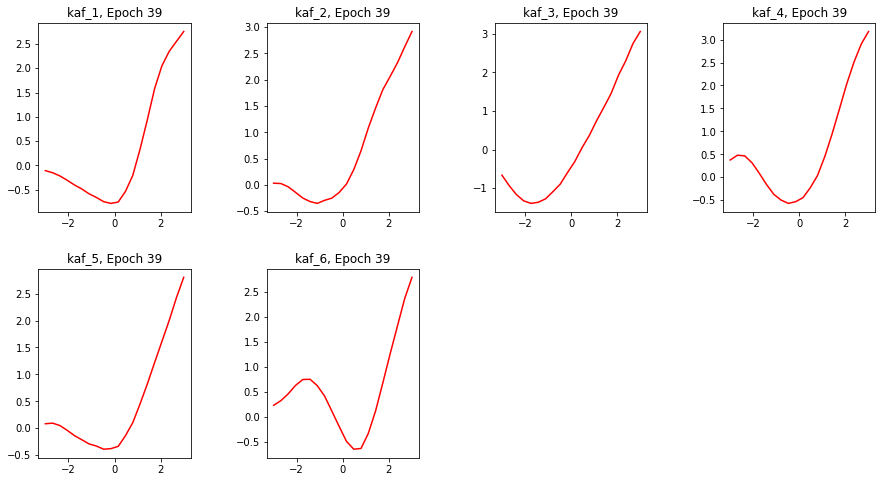

Epoch 39/60
391/391 [==============================] - 79s 202ms/step - loss: 1.4822 - sparse_categorical_accuracy: 0.4841 - val_loss: 1.3259 - val_sparse_categorical_accuracy: 0.6448


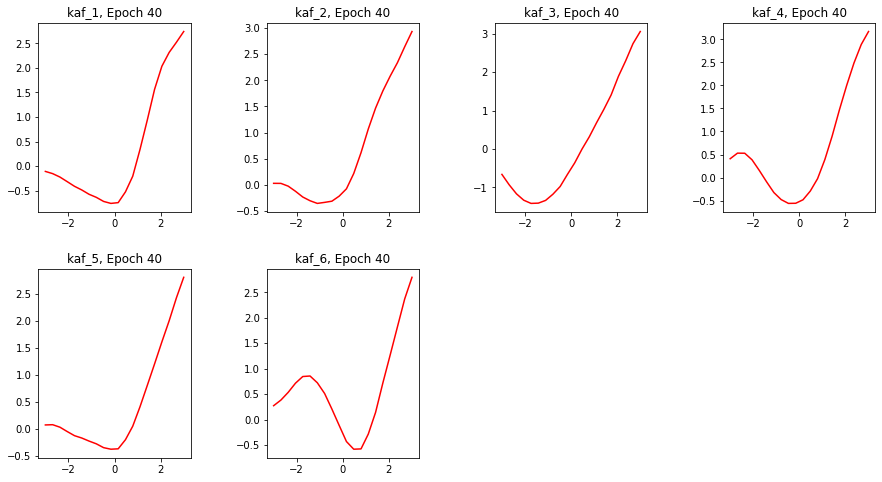

Epoch 40/60
391/391 [==============================] - 79s 202ms/step - loss: 1.4697 - sparse_categorical_accuracy: 0.4897 - val_loss: 1.2821 - val_sparse_categorical_accuracy: 0.6457


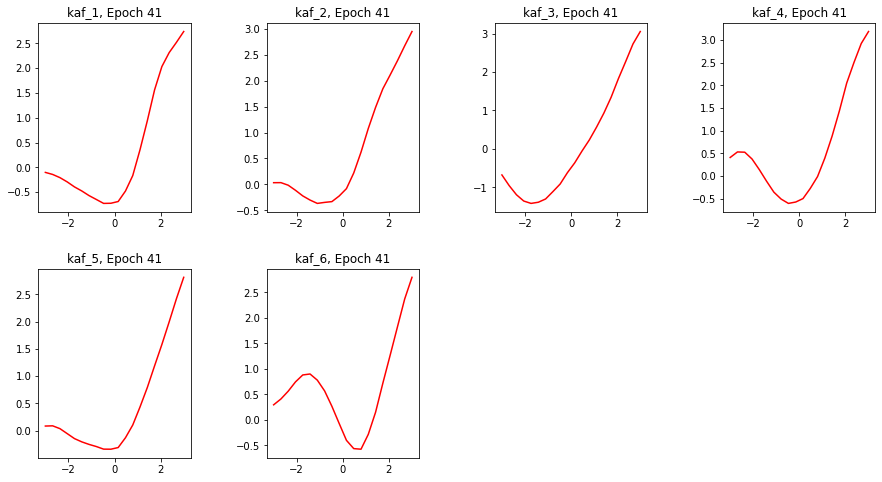

Epoch 41/60
391/391 [==============================] - 79s 202ms/step - loss: 1.4478 - sparse_categorical_accuracy: 0.4922 - val_loss: 1.2748 - val_sparse_categorical_accuracy: 0.6706


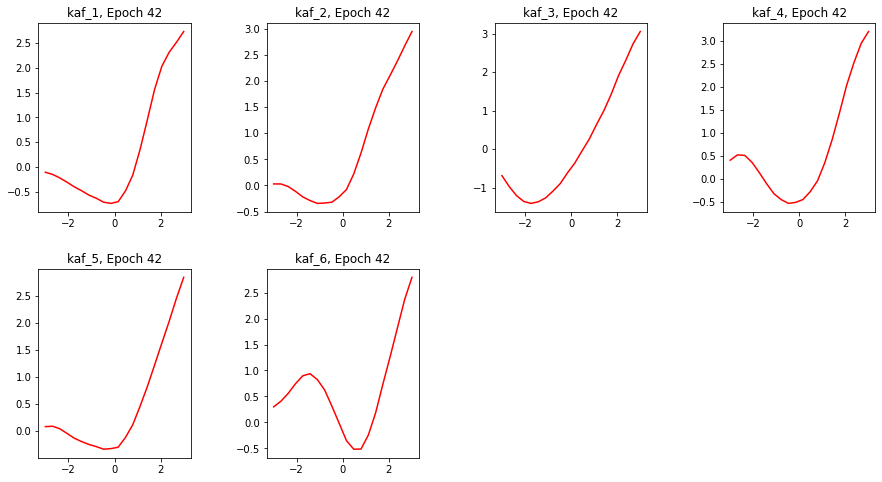

Epoch 42/60
391/391 [==============================] - 79s 202ms/step - loss: 1.4256 - sparse_categorical_accuracy: 0.5007 - val_loss: 1.2824 - val_sparse_categorical_accuracy: 0.6681


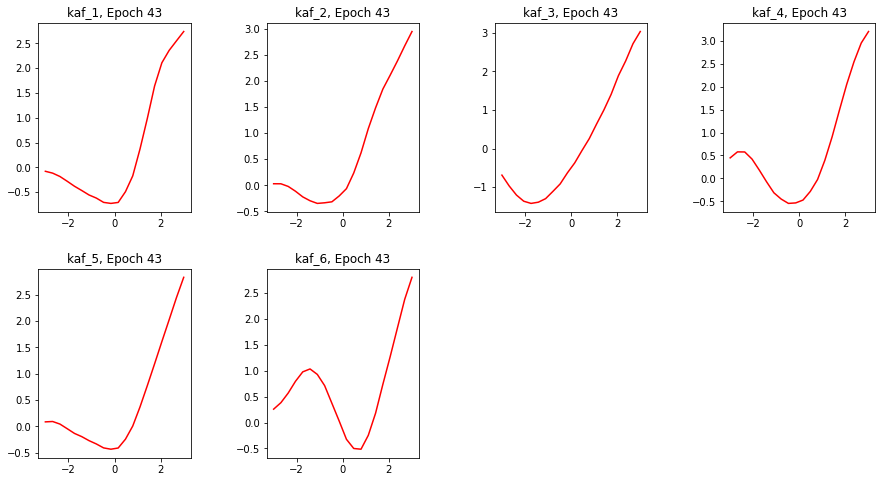

Epoch 43/60
391/391 [==============================] - 79s 202ms/step - loss: 1.4026 - sparse_categorical_accuracy: 0.5039 - val_loss: 1.1903 - val_sparse_categorical_accuracy: 0.6847


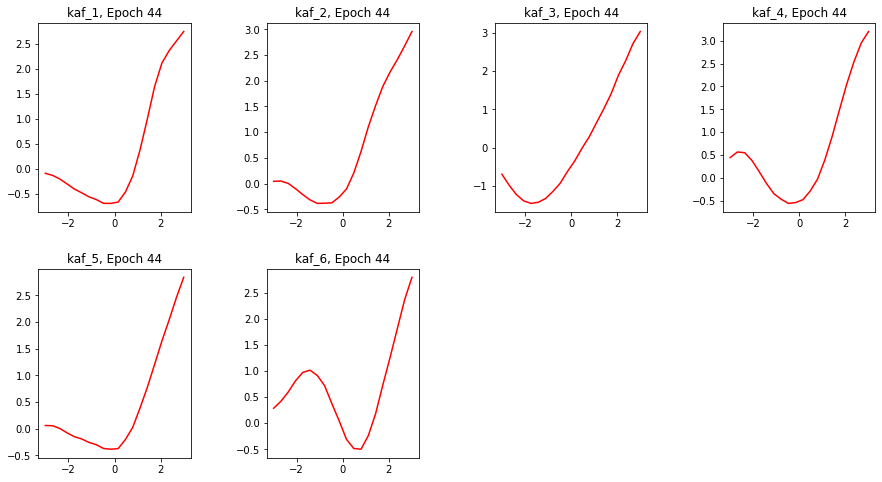

Epoch 44/60
391/391 [==============================] - 79s 202ms/step - loss: 1.3864 - sparse_categorical_accuracy: 0.5074 - val_loss: 1.2043 - val_sparse_categorical_accuracy: 0.6938


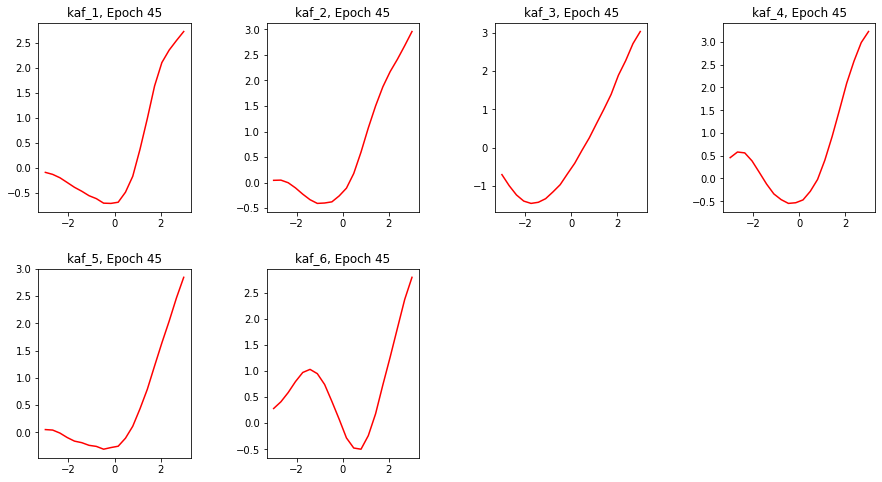

Epoch 45/60
391/391 [==============================] - 79s 202ms/step - loss: 1.3650 - sparse_categorical_accuracy: 0.5154 - val_loss: 1.1753 - val_sparse_categorical_accuracy: 0.7011


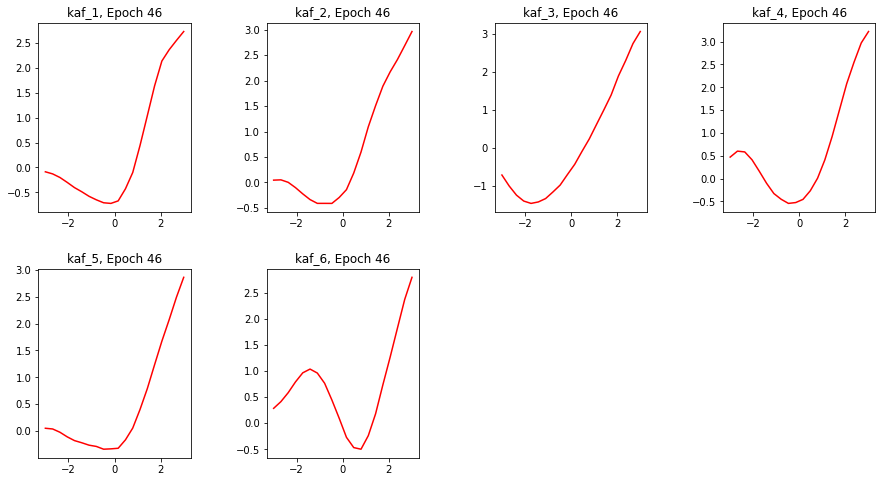

Epoch 46/60
391/391 [==============================] - 79s 202ms/step - loss: 1.3429 - sparse_categorical_accuracy: 0.5216 - val_loss: 1.1787 - val_sparse_categorical_accuracy: 0.6856


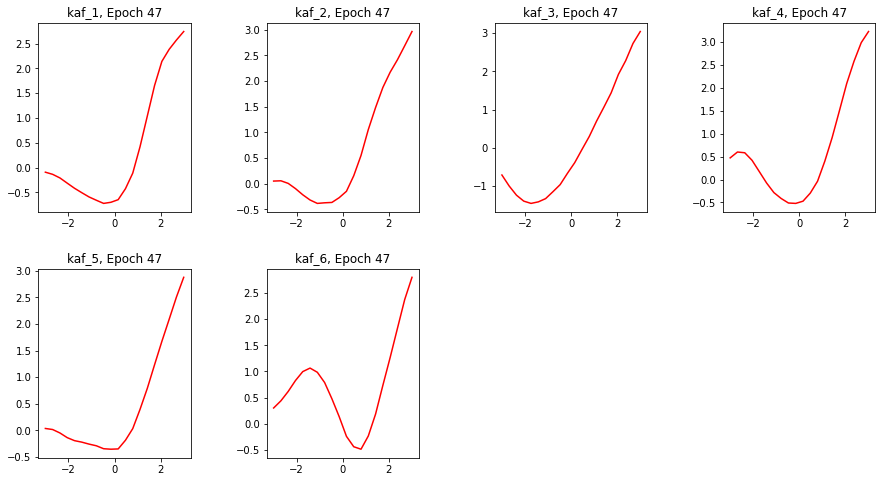

Epoch 47/60
391/391 [==============================] - 79s 202ms/step - loss: 1.3223 - sparse_categorical_accuracy: 0.5232 - val_loss: 1.1942 - val_sparse_categorical_accuracy: 0.7030


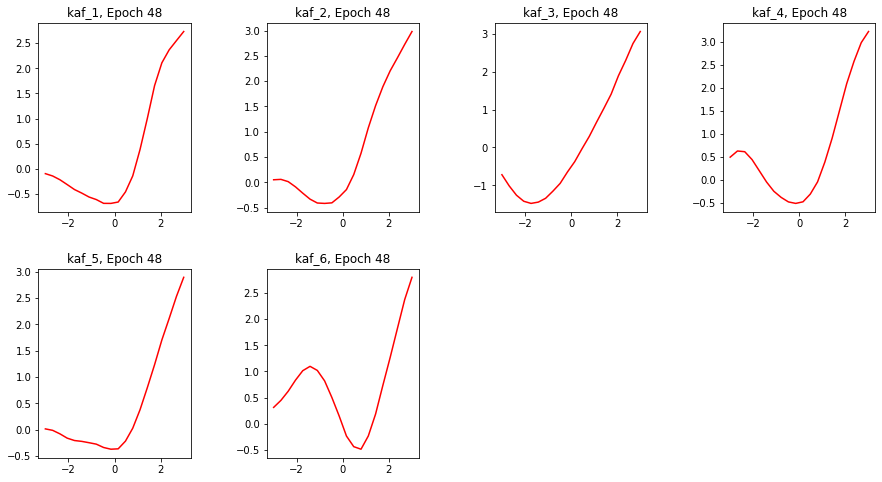

Epoch 48/60
391/391 [==============================] - 79s 202ms/step - loss: 1.2967 - sparse_categorical_accuracy: 0.5325 - val_loss: 1.3264 - val_sparse_categorical_accuracy: 0.6000


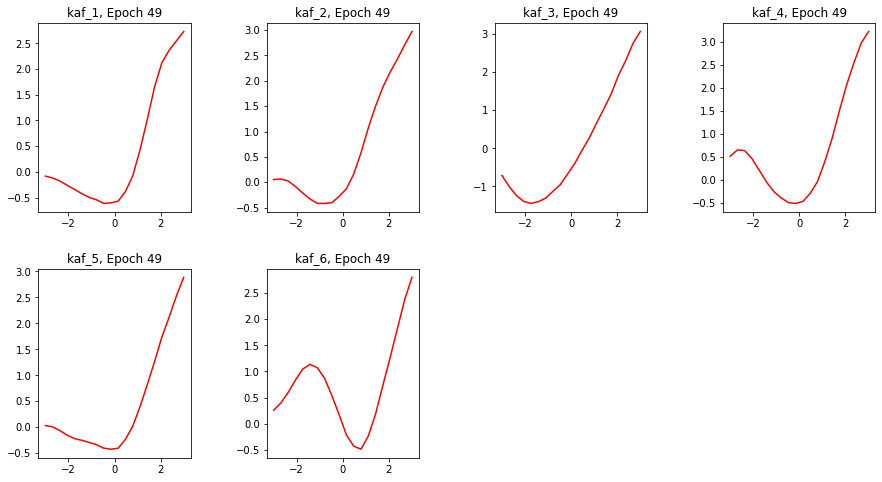

Epoch 49/60
391/391 [==============================] - 79s 202ms/step - loss: 1.2741 - sparse_categorical_accuracy: 0.5405 - val_loss: 1.1060 - val_sparse_categorical_accuracy: 0.7380


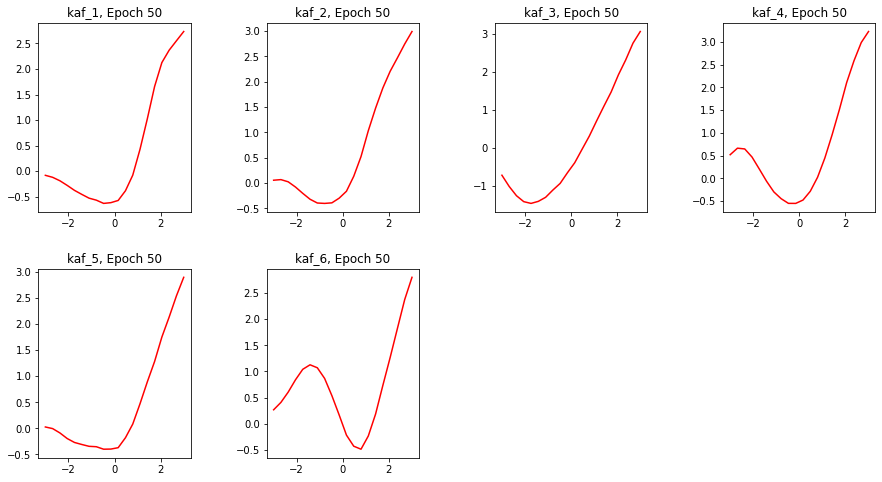

Epoch 50/60
391/391 [==============================] - 79s 202ms/step - loss: 1.2505 - sparse_categorical_accuracy: 0.5458 - val_loss: 1.1182 - val_sparse_categorical_accuracy: 0.7172


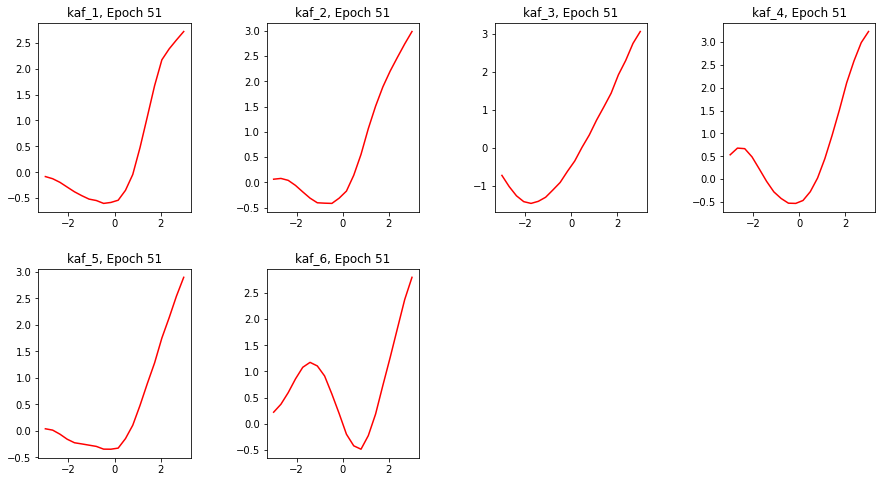

Epoch 51/60
391/391 [==============================] - 79s 202ms/step - loss: 1.2212 - sparse_categorical_accuracy: 0.5560 - val_loss: 1.1173 - val_sparse_categorical_accuracy: 0.7185


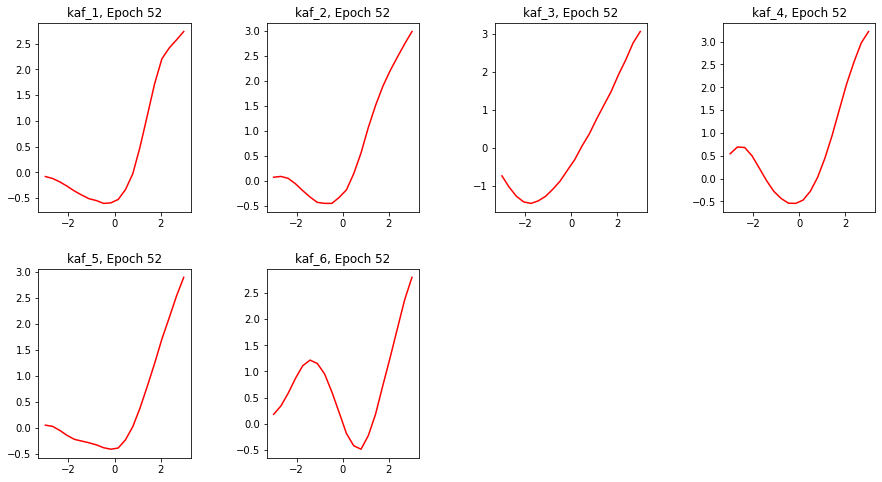

Epoch 52/60
391/391 [==============================] - 79s 202ms/step - loss: 1.1911 - sparse_categorical_accuracy: 0.5650 - val_loss: 1.1462 - val_sparse_categorical_accuracy: 0.6960


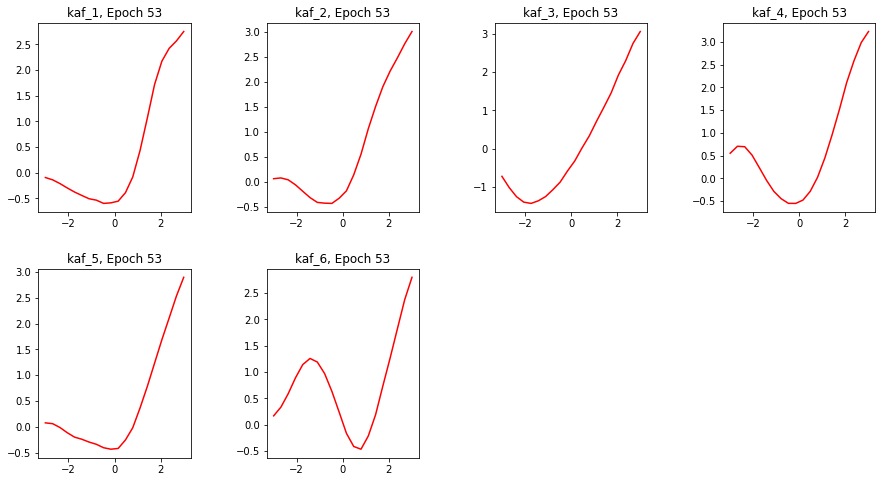

Epoch 53/60
391/391 [==============================] - 79s 202ms/step - loss: 1.1571 - sparse_categorical_accuracy: 0.5753 - val_loss: 1.0257 - val_sparse_categorical_accuracy: 0.7452


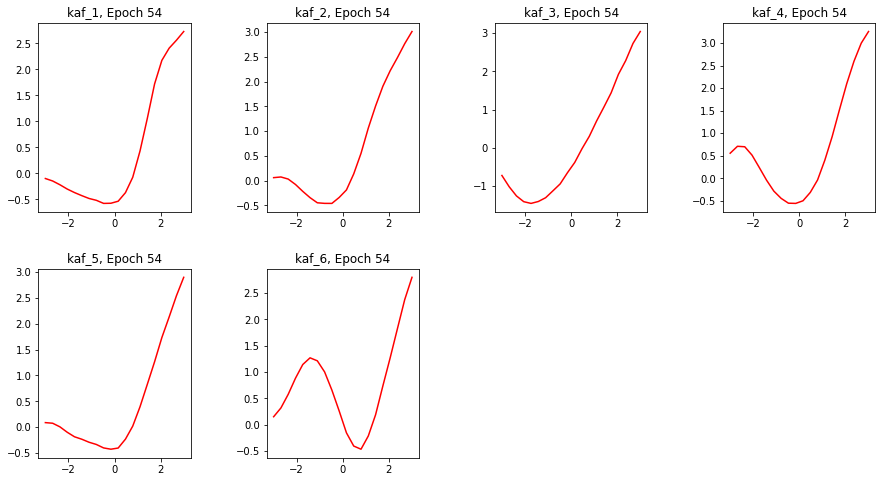

Epoch 54/60
391/391 [==============================] - 79s 202ms/step - loss: 1.1212 - sparse_categorical_accuracy: 0.5864 - val_loss: 0.9794 - val_sparse_categorical_accuracy: 0.7544


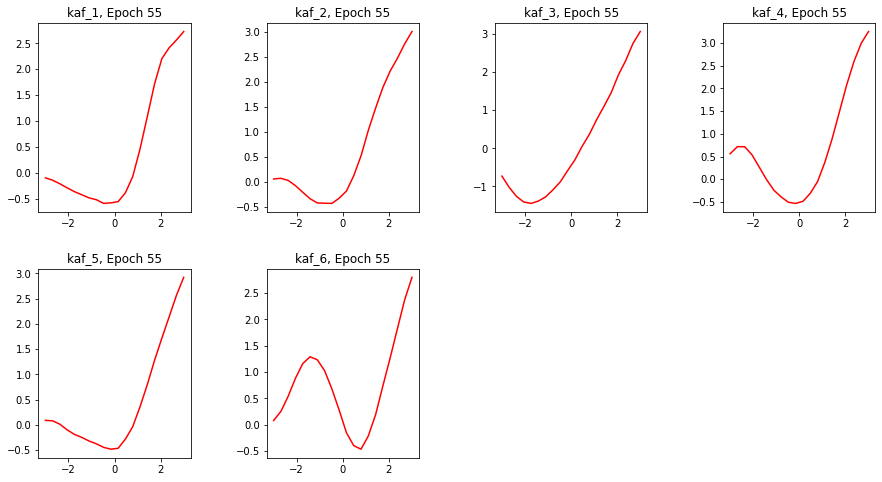

Epoch 55/60
391/391 [==============================] - 79s 202ms/step - loss: 1.0864 - sparse_categorical_accuracy: 0.6003 - val_loss: 0.9709 - val_sparse_categorical_accuracy: 0.7620


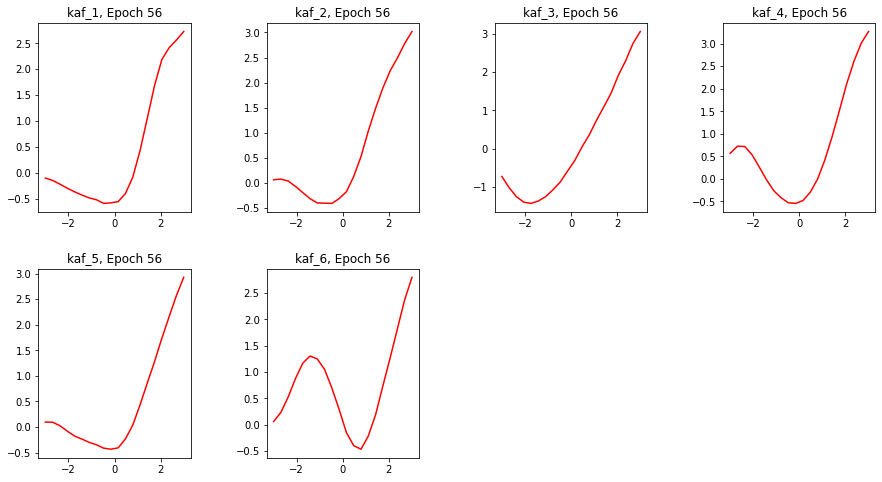

Epoch 56/60
391/391 [==============================] - 79s 202ms/step - loss: 1.0390 - sparse_categorical_accuracy: 0.6152 - val_loss: 0.9523 - val_sparse_categorical_accuracy: 0.7590


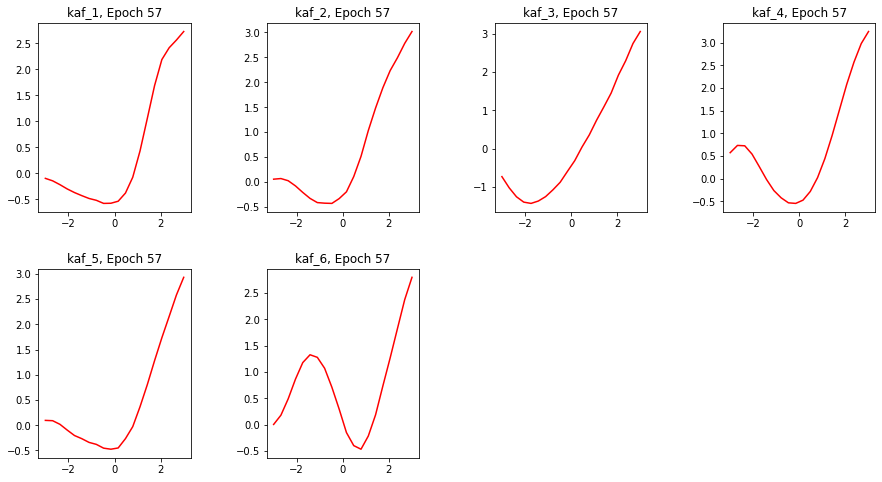

Epoch 57/60
391/391 [==============================] - 79s 203ms/step - loss: 0.9959 - sparse_categorical_accuracy: 0.6286 - val_loss: 0.9172 - val_sparse_categorical_accuracy: 0.7660


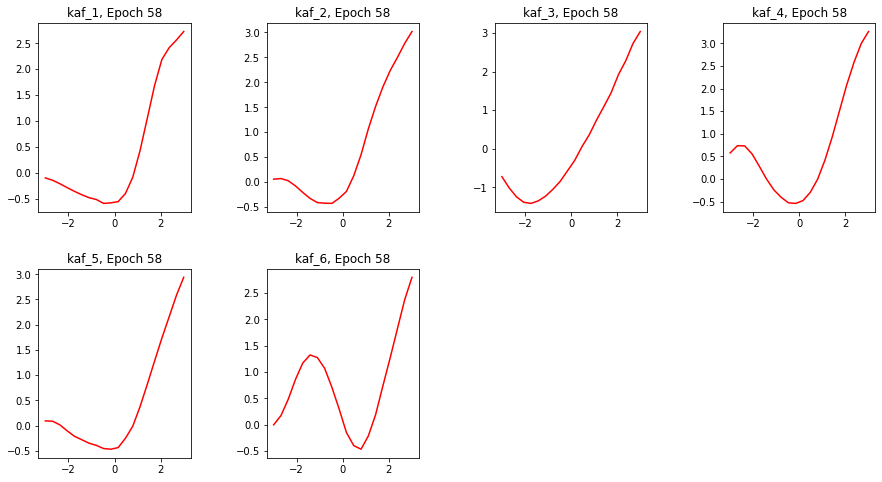

Epoch 58/60
391/391 [==============================] - 79s 202ms/step - loss: 0.9481 - sparse_categorical_accuracy: 0.6477 - val_loss: 0.8906 - val_sparse_categorical_accuracy: 0.7750


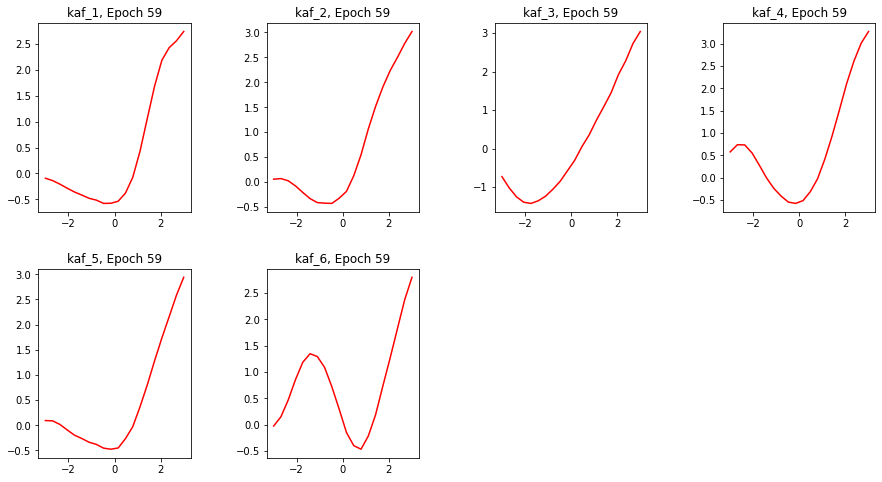

Epoch 59/60
391/391 [==============================] - 79s 202ms/step - loss: 0.9037 - sparse_categorical_accuracy: 0.6628 - val_loss: 0.8589 - val_sparse_categorical_accuracy: 0.7832


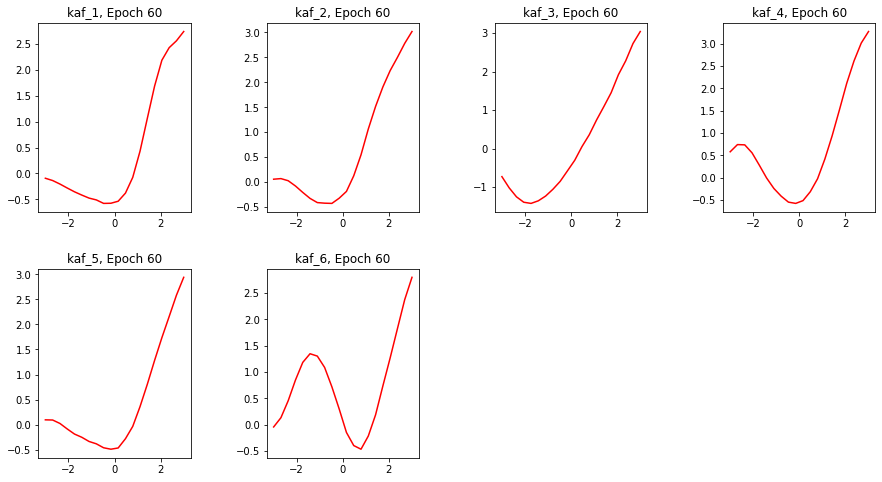

Epoch 60/60
391/391 [==============================] - 79s 202ms/step - loss: 0.8616 - sparse_categorical_accuracy: 0.6810 - val_loss: 0.8458 - val_sparse_categorical_accuracy: 0.7886


In [ ]:
epochs = 60
step_size = np.ceil((len(x_train) / 128) * (epochs/2))

oclr = tfa.optimizers.TriangularCyclicalLearningRate(initial_learning_rate = 0.0001, maximal_learning_rate = 0.8, step_size = step_size)

rob_kafswish_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = oclr),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )
history_kafswish = rob_kafswish_vgg.fit(x = train, epochs = epochs, batch_size = 128, validation_data = test, callbacks=[activationsf.plot_kafs_epoch_wise(6)])

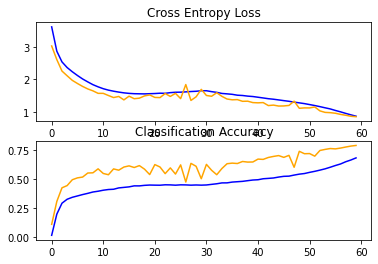

In [ ]:
summarize_diagnostics(history_kafswish)

In [ ]:
rob_kafswish_vgg.save('./rob_kafswish_vgg')
!zip -r rob_kafswish_vgg.zip ./rob_kafswish_vgg
from google.colab import files
files.download('./rob_kafswish_vgg.zip')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ./rob_kafswish_vgg/assets
  adding: rob_kafswish_vgg/ (stored 0%)
  adding: rob_kafswish_vgg/variables/ (stored 0%)
  adding: rob_kafswish_vgg/variables/variables.index (deflated 69%)
  adding: rob_kafswish_vgg/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: rob_kafswish_vgg/assets/ (stored 0%)
  adding: rob_kafswish_vgg/saved_model.pb (deflated 90%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Free Dictionary Case


In [ ]:
BATCH = 128
STEPS_PER_EPOCH = np.ceil(len(x_train) / BATCH)

rob_freekaf_vgg = rob_vgg(act = None , is_kaf = True, ridge=None, moving=True)
rob_freekaf_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

lr_finder = LRFinder(rob_freekaf_vgg)
lr_finder.find(train, start_lr=1e-4, end_lr=2, epochs=7,
               steps_per_epoch=STEPS_PER_EPOCH)


Epoch 1/7
391/391 [==============================] - 86s 221ms/step - loss: 3.0758 - sparse_categorical_accuracy: 0.0952
Epoch 2/7
391/391 [==============================] - 86s 221ms/step - loss: 3.0713 - sparse_categorical_accuracy: 0.0992
Epoch 3/7
391/391 [==============================] - 86s 220ms/step - loss: 3.0655 - sparse_categorical_accuracy: 0.1001
Epoch 4/7
391/391 [==============================] - 86s 220ms/step - loss: 3.0551 - sparse_categorical_accuracy: 0.1019
Epoch 5/7
391/391 [==============================] - 86s 220ms/step - loss: 3.0240 - sparse_categorical_accuracy: 0.1004
Epoch 6/7
391/391 [==============================] - 86s 220ms/step - loss: 2.7709 - sparse_categorical_accuracy: 0.1620
Epoch 7/7
391/391 [==============================] - 86s 220ms/step - loss: 2.2662 - sparse_categorical_accuracy: 0.2596


NameError: ignored

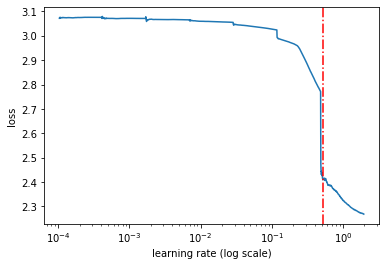

In [ ]:
axs = plot_loss()
axs.axvline(x=lr_finder.get_best_lr(sma=20), c='r', linestyle='-.')

[[-3 -2.68421054 -2.36842108 ... 2.36842108 2.68421054 3]]
1.67129624
[[-3 -2.68421054 -2.36842108 ... 2.36842108 2.68421054 3]]
1.67129624
[[-3 -2.68421054 -2.36842108 ... 2.36842108 2.68421054 3]]
1.67129624
[[-3 -2.68421054 -2.36842108 ... 2.36842108 2.68421054 3]]
1.67129624
[[-3 -2.68421054 -2.36842108 ... 2.36842108 2.68421054 3]]
1.67129624
[[-3 -2.68421054 -2.36842108 ... 2.36842108 2.68421054 3]]
1.67129624


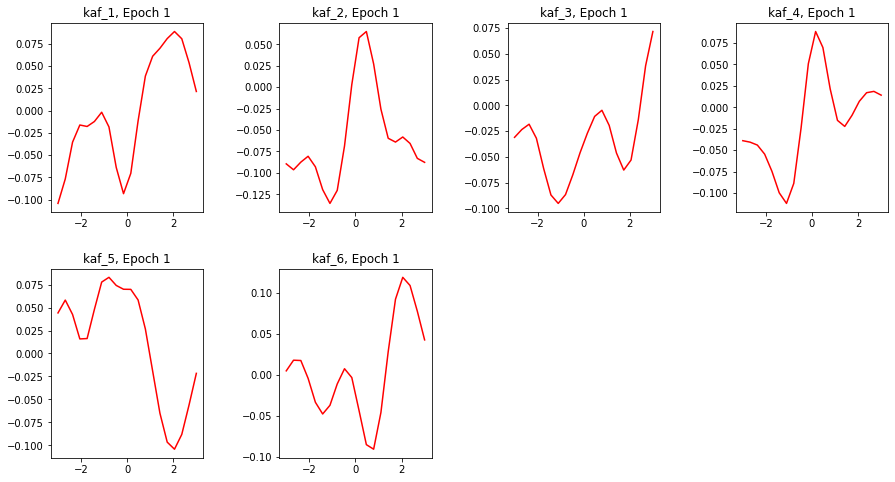

Epoch 1/60
391/391 [==============================] - 89s 228ms/step - loss: 3.0532 - sparse_categorical_accuracy: 0.0946 - val_loss: 3.0227 - val_sparse_categorical_accuracy: 0.1000
[[-3.00039983 -2.6843636 -2.36827087 ... 2.36879468 2.684268 2.99992394]]
1.67167687
[[-2.99997449 -2.68420553 -2.36844039 ... 2.36823153 2.68419433 3]]
1.67142749
[[-3.0000174 -2.68420768 -2.36841965 ... 2.36839962 2.68417597 2.99993086]]
1.67126656
[[-2.99998 -2.68421984 -2.36843538 ... 2.36843157 2.68421125 3.00000048]]
1.67137349
[[-3.00000238 -2.68421865 -2.36843252 ... 2.36842108 2.68421054 3]]
1.67127323
[[-3 -2.68421054 -2.36842108 ... 2.36842108 2.68421054 3]]
1.67101562


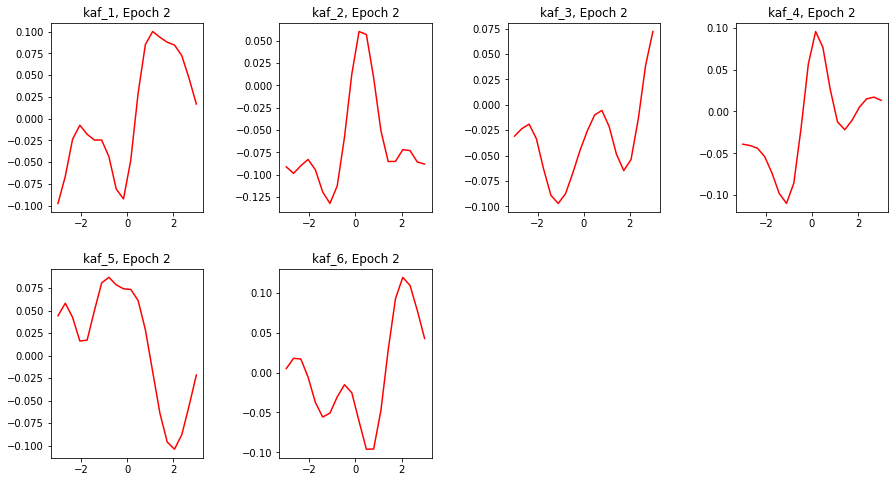

Epoch 2/60
391/391 [==============================] - 89s 227ms/step - loss: 2.9837 - sparse_categorical_accuracy: 0.0967 - val_loss: 2.9344 - val_sparse_categorical_accuracy: 0.1000
[[-3.00072908 -2.68453646 -2.36793256 ... 2.36912489 2.68431115 2.99979568]]
1.67208183
[[-3.00006366 -2.68420219 -2.36849499 ... 2.36827779 2.68422246 3.00018287]]
1.67155111
[[-3.000067 -2.68421364 -2.36842132 ... 2.36833239 2.68420863 2.99995351]]
1.67135262
[[-2.99997377 -2.68422866 -2.36841655 ... 2.36842513 2.68420959 3.00000048]]
1.67129278
[[-2.99999571 -2.68423605 -2.3684206 ... 2.36842108 2.68420982 3.00000024]]
1.67132974
[[-3 -2.68421054 -2.3684175 ... 2.36842012 2.68421054 3]]
1.67102838


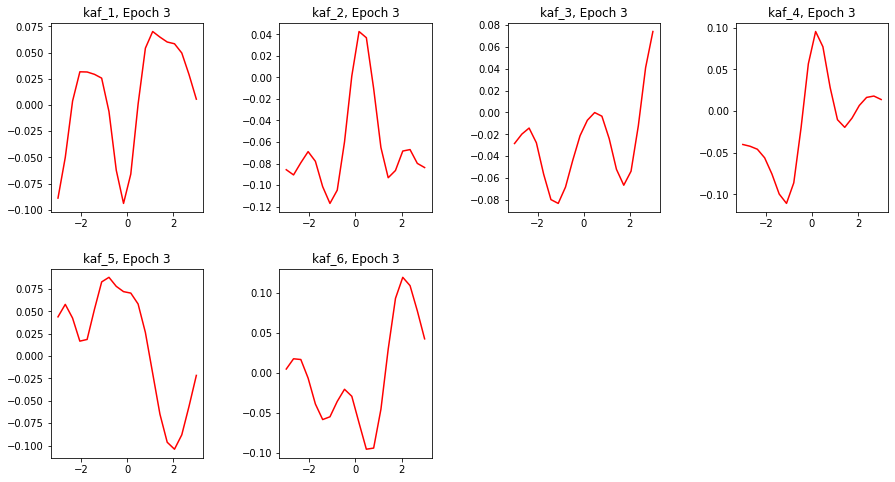

Epoch 3/60
391/391 [==============================] - 89s 227ms/step - loss: 2.8496 - sparse_categorical_accuracy: 0.1161 - val_loss: 2.5500 - val_sparse_categorical_accuracy: 0.2282
[[-3.00018311 -2.68441057 -2.36809325 ... 2.36774 2.68421268 3.00007725]]
1.66937399
[[-3.00039077 -2.68398476 -2.36912799 ... 2.36822605 2.68425822 3.00054502]]
1.67132652
[[-3.00001979 -2.68421435 -2.36841798 ... 2.36816692 2.68411374 2.99967408]]
1.67146742
[[-2.99990821 -2.68426585 -2.36839318 ... 2.36840224 2.68421745 3.00000119]]
1.67119038
[[-2.99998832 -2.6841495 -2.36808467 ... 2.36842346 2.68421793 2.99999595]]
1.67151773
[[-3 -2.68421054 -2.3684175 ... 2.36841869 2.68421054 3]]
1.67191565


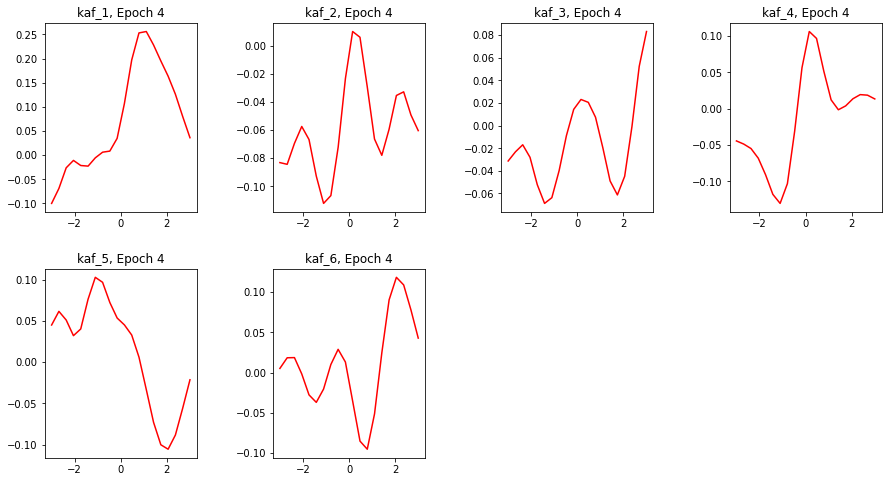

Epoch 4/60
391/391 [==============================] - 89s 227ms/step - loss: 2.3384 - sparse_categorical_accuracy: 0.2661 - val_loss: 2.0589 - val_sparse_categorical_accuracy: 0.3993
[[-2.99918652 -2.6841414 -2.36821628 ... 2.36225295 2.68272734 3.00067472]]
1.66200829
[[-3.00056243 -2.68359327 -2.37061357 ... 2.36865616 2.68426228 3.00051475]]
1.67141807
[[-2.9997468 -2.68420792 -2.36838531 ... 2.36776924 2.6844635 3.00019693]]
1.67119992
[[-2.99911475 -2.68450522 -2.36877012 ... 2.36782575 2.68399334 2.99992347]]
1.66918862
[[-3.00024056 -2.68373466 -2.36800671 ... 2.36848068 2.68432808 3.00001121]]
1.67127478
[[-3 -2.68421054 -2.36839461 ... 2.36844587 2.68420959 3]]
1.67653191


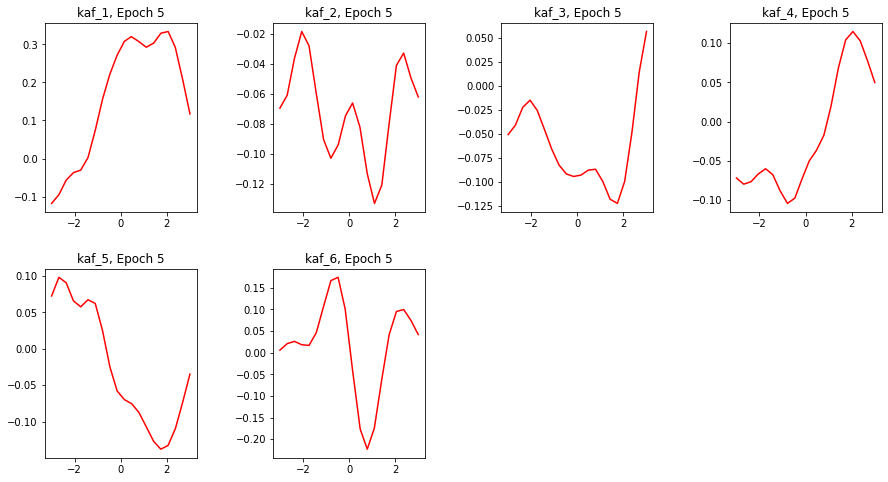

Epoch 5/60
391/391 [==============================] - 89s 227ms/step - loss: 2.0820 - sparse_categorical_accuracy: 0.3131 - val_loss: 1.9626 - val_sparse_categorical_accuracy: 0.4225
[[-2.99935389 -2.68433332 -2.3680892 ... 2.359056 2.68151402 3.00076342]]
1.65573645
[[-2.99932122 -2.68429136 -2.36804771 ... 2.36935806 2.68430495 3.00095892]]
1.67007113
[[-2.99956656 -2.68414474 -2.36856771 ... 2.36787367 2.68501067 3.00132084]]
1.67087293
[[-2.99892211 -2.68480539 -2.36819792 ... 2.3673 2.68350554 2.99969077]]
1.66873574
[[-3.00063 -2.67862153 -2.36466241 ... 2.36857057 2.68419957 3.0001533]]
1.66928875
[[-3 -2.68421078 -2.36833739 ... 2.36851764 2.68420362 3]]
1.6834178


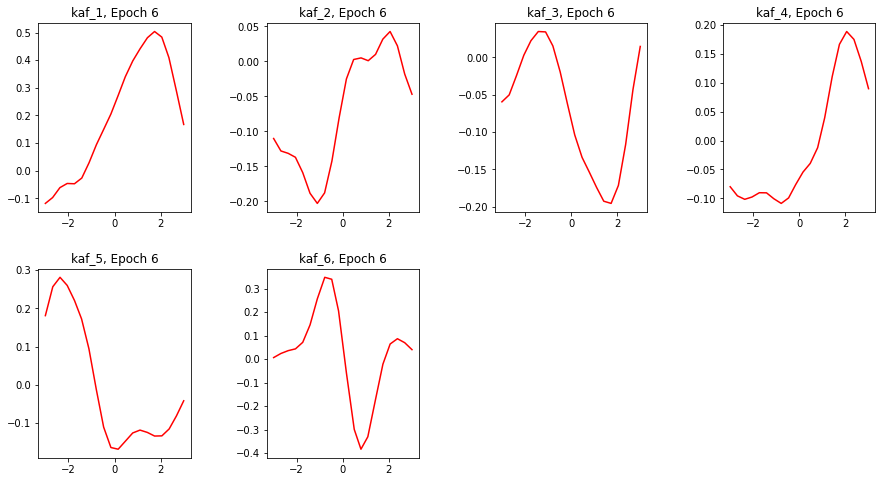

Epoch 6/60
391/391 [==============================] - 89s 227ms/step - loss: 1.9255 - sparse_categorical_accuracy: 0.3346 - val_loss: 1.6692 - val_sparse_categorical_accuracy: 0.5001
[[-2.99981308 -2.68439913 -2.36843228 ... 2.36034608 2.68172526 3.00083804]]
1.65229499
[[-2.99817204 -2.68464351 -2.36541104 ... 2.36962914 2.68427181 3.00154209]]
1.66870284
[[-2.99992681 -2.68448663 -2.36891603 ... 2.36693954 2.68539977 3.00163198]]
1.67170691
[[-2.99753761 -2.68554735 -2.36655951 ... 2.36497855 2.68258977 2.99940538]]
1.66761625
[[-2.99988532 -2.67254066 -2.36456513 ... 2.36925769 2.68497729 3.00020814]]
1.66826224
[[-3.00000405 -2.68420339 -2.36811304 ... 2.36868477 2.68419433 3]]
1.68638587


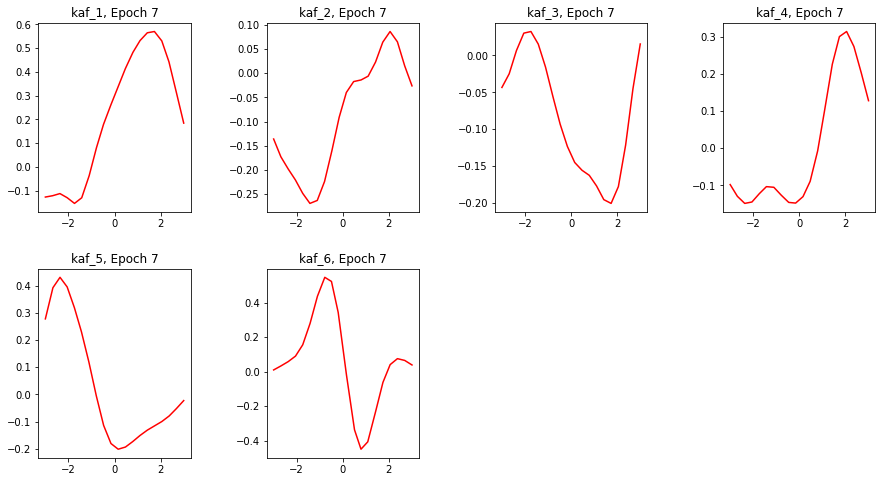

Epoch 7/60
391/391 [==============================] - 89s 227ms/step - loss: 1.8190 - sparse_categorical_accuracy: 0.3479 - val_loss: 1.6204 - val_sparse_categorical_accuracy: 0.5052
[[-2.99999452 -2.68456721 -2.36850142 ... 2.36013055 2.6804502 3.0007813]]
1.64731896
[[-2.9972477 -2.68472528 -2.36533618 ... 2.36973357 2.68420506 3.00216079]]
1.66644311
[[-3.00001669 -2.68473649 -2.36913323 ... 2.36722493 2.6851306 3.00116301]]
1.67070496
[[-2.99774909 -2.6855495 -2.36708117 ... 2.36373258 2.68180943 2.99913406]]
1.66684115
[[-2.99889112 -2.67277741 -2.37173271 ... 2.36937571 2.68482041 2.99920177]]
1.66980958
[[-3.00001168 -2.68419 -2.3677702 ... 2.36881018 2.68419266 3.00000167]]
1.68366635


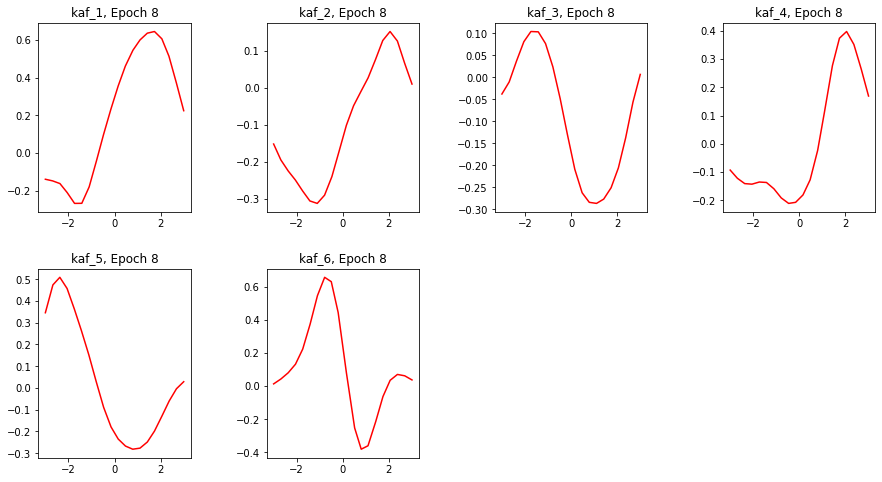

Epoch 8/60
391/391 [==============================] - 89s 227ms/step - loss: 1.7432 - sparse_categorical_accuracy: 0.3598 - val_loss: 1.6515 - val_sparse_categorical_accuracy: 0.4976
[[-2.99959898 -2.68443203 -2.36851144 ... 2.36175656 2.6811347 3.00116897]]
1.64581275
[[-2.99649048 -2.68475771 -2.36668038 ... 2.36932397 2.68348 3.00297976]]
1.66330874
[[-3.00024772 -2.68497682 -2.36927342 ... 2.36759067 2.68532634 3.00153923]]
1.67107
[[-2.99763203 -2.68558812 -2.36664605 ... 2.3663094 2.68223596 2.99876714]]
1.66555846
[[-2.99700451 -2.67458105 -2.38426709 ... 2.36993408 2.68497491 2.99928427]]
1.67748201
[[-3.00003242 -2.68415689 -2.36720037 ... 2.36909699 2.68421745 3.00000143]]
1.68234408


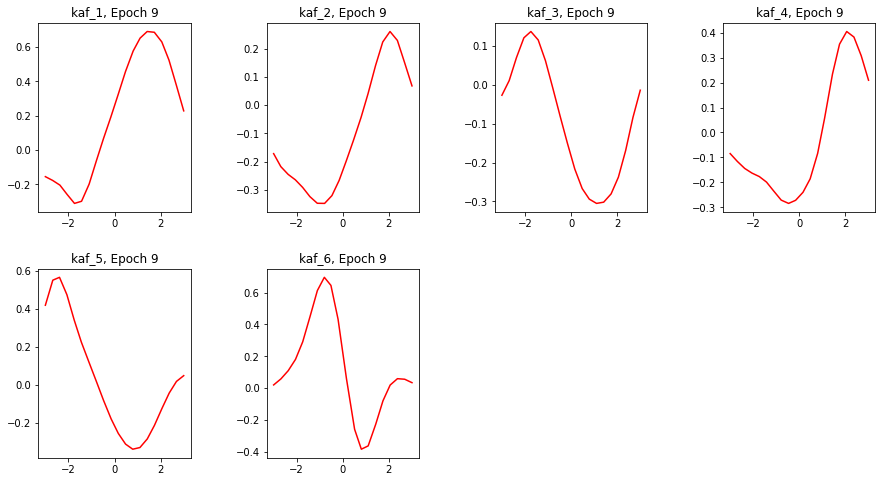

Epoch 9/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6958 - sparse_categorical_accuracy: 0.3702 - val_loss: 1.4999 - val_sparse_categorical_accuracy: 0.5508
[[-3.0010097 -2.68531966 -2.36858916 ... 2.3626678 2.68183899 3.00161362]]
1.64089549
[[-2.9954226 -2.68463421 -2.36611295 ... 2.3691957 2.68275571 3.00352955]]
1.66010809
[[-3.00010538 -2.68500233 -2.36946321 ... 2.36402798 2.68605089 3.00224686]]
1.67045748
[[-2.99806499 -2.6854322 -2.36685133 ... 2.36643744 2.68235016 2.99870157]]
1.66418672
[[-2.99551082 -2.6715405 -2.38345385 ... 2.37203979 2.68600941 2.99808335]]
1.68550181
[[-3.00003982 -2.68413639 -2.36676097 ... 2.36943412 2.68425608 2.99999642]]
1.68122315


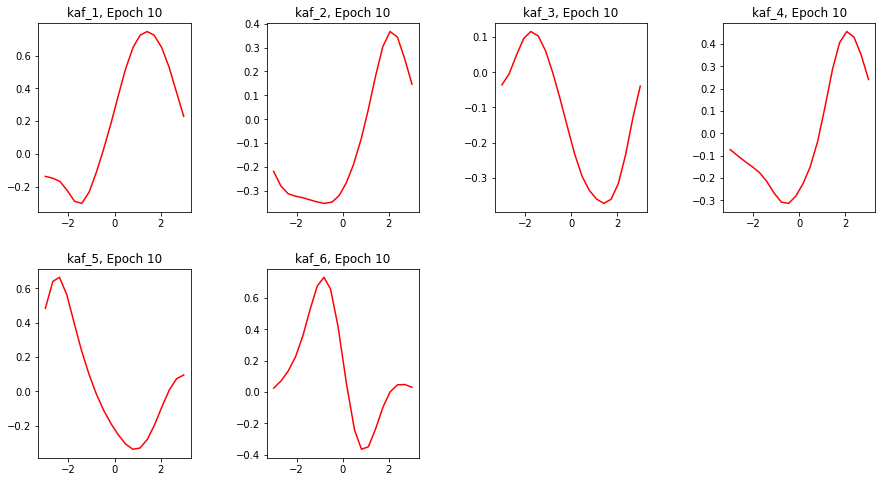

Epoch 10/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6633 - sparse_categorical_accuracy: 0.3759 - val_loss: 1.6143 - val_sparse_categorical_accuracy: 0.4879
[[-3.00163579 -2.68608546 -2.36812043 ... 2.36487627 2.68346047 3.00213313]]
1.63976419
[[-2.99388051 -2.68416858 -2.36391497 ... 2.36934376 2.681283 3.00339723]]
1.65970278
[[-3.00030518 -2.6853106 -2.36954522 ... 2.36254501 2.68616128 3.00226569]]
1.66968799
[[-2.99907136 -2.6853447 -2.36667538 ... 2.36749697 2.68215585 2.99809408]]
1.66176033
[[-2.99472308 -2.68260479 -2.4044292 ... 2.37548518 2.68756437 2.99741292]]
1.70386028
[[-3.00007081 -2.68409944 -2.36614037 ... 2.37049365 2.68448782 2.99996257]]
1.68351007


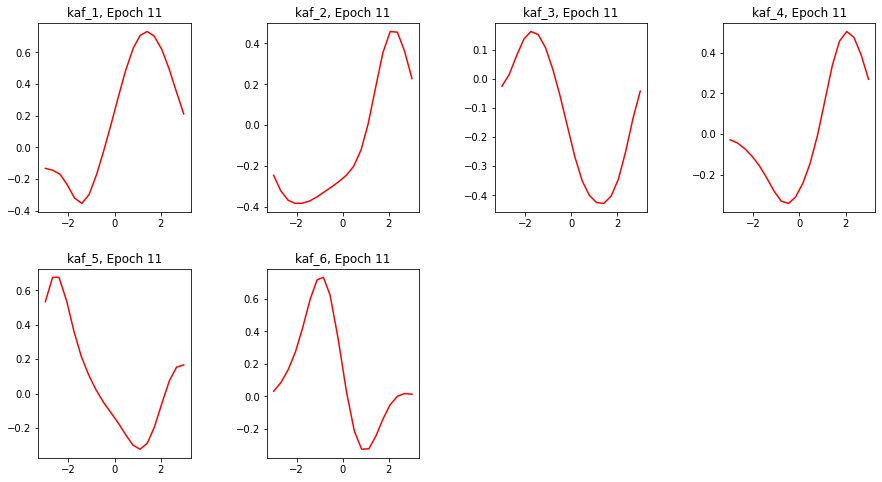

Epoch 11/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6539 - sparse_categorical_accuracy: 0.3820 - val_loss: 1.5736 - val_sparse_categorical_accuracy: 0.4882
[[-3.00214 -2.68664503 -2.36780024 ... 2.36349034 2.6835084 3.0025568]]
1.63213587
[[-2.99398136 -2.68414378 -2.36248112 ... 2.37167239 2.68062806 3.00263071]]
1.65450668
[[-3.00019574 -2.68524718 -2.36964893 ... 2.36218882 2.68639135 3.00265074]]
1.67065918
[[-2.99952435 -2.6853621 -2.36644459 ... 2.372334 2.6830852 2.99682641]]
1.66056824
[[-2.99600101 -2.69285 -2.41404986 ... 2.37665415 2.6887362 2.99748373]]
1.71682441
[[-3.00008965 -2.6840651 -2.36556292 ... 2.37119579 2.68455601 2.99997544]]
1.68997049


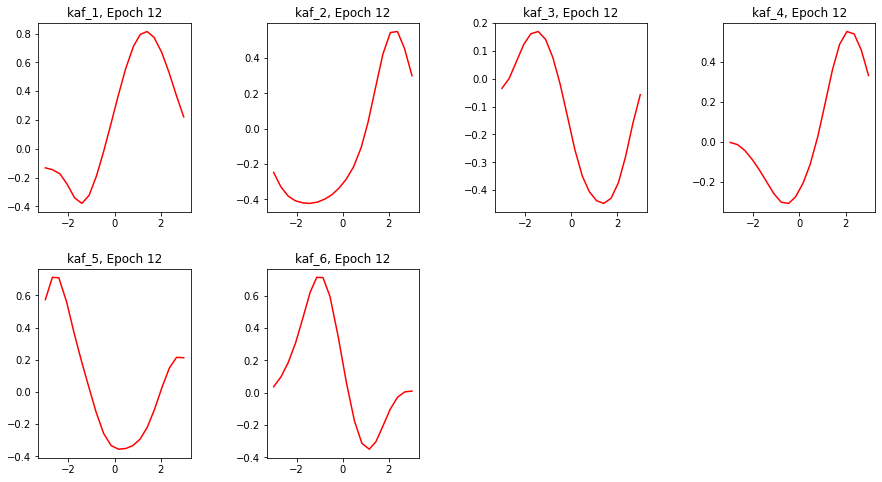

Epoch 12/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6443 - sparse_categorical_accuracy: 0.3872 - val_loss: 1.7089 - val_sparse_categorical_accuracy: 0.4494
[[-3.0028286 -2.68735766 -2.36722827 ... 2.36048889 2.68309665 3.00307846]]
1.6256752
[[-2.99310398 -2.68428874 -2.36388397 ... 2.37405109 2.67990637 3.00166893]]
1.65085709
[[-3.00013 -2.68527126 -2.36977291 ... 2.36191249 2.68654275 3.00307131]]
1.67107213
[[-2.99990892 -2.68488216 -2.36665201 ... 2.36812067 2.68188596 2.99705863]]
1.65862453
[[-2.98918343 -2.68871307 -2.41998959 ... 2.38018918 2.69261861 3.00181055]]
1.72572088
[[-3.00019121 -2.68390059 -2.36438584 ... 2.37234116 2.68483448 2.99982643]]
1.70393288


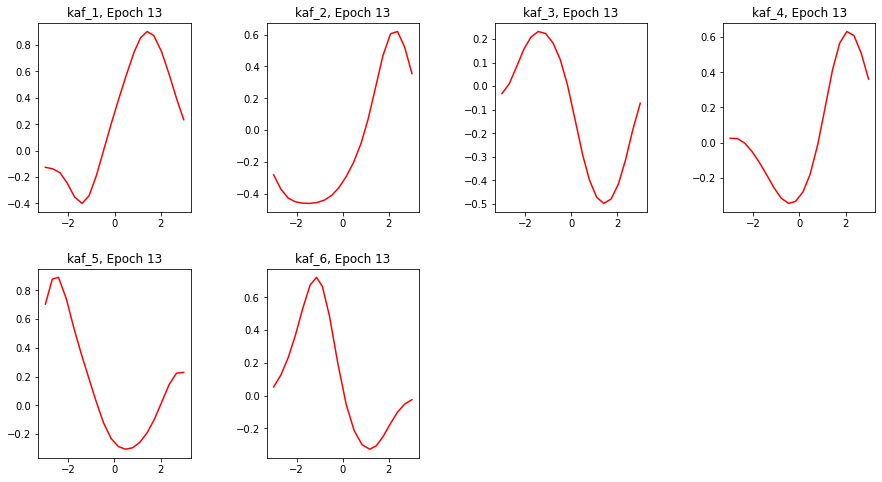

Epoch 13/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6492 - sparse_categorical_accuracy: 0.3911 - val_loss: 1.7996 - val_sparse_categorical_accuracy: 0.4208
[[-3.00245619 -2.68768597 -2.36704421 ... 2.3586638 2.68362355 3.00353837]]
1.61325371
[[-2.99166083 -2.68397331 -2.36660075 ... 2.37648654 2.68062043 3.0011611]]
1.6496886
[[-2.99980903 -2.68507767 -2.37006116 ... 2.36270452 2.68663597 3.00304103]]
1.66789973
[[-3.00023913 -2.68440604 -2.36683655 ... 2.37480974 2.68698716 2.9979558]]
1.65343451
[[-2.9848814 -2.69130087 -2.43455696 ... 2.38396859 2.69573355 3.00452685]]
1.74633515
[[-3.00026131 -2.68371606 -2.36308122 ... 2.3725493 2.68490291 2.99980021]]
1.70871603


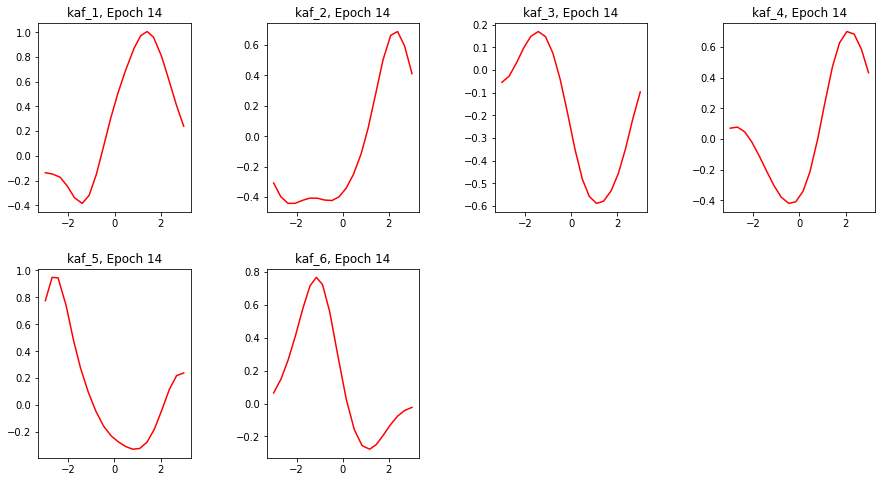

Epoch 14/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6470 - sparse_categorical_accuracy: 0.3926 - val_loss: 1.6012 - val_sparse_categorical_accuracy: 0.5204
[[-3.00193024 -2.68769884 -2.36721396 ... 2.36027741 2.68521905 3.00402474]]
1.61077666
[[-2.98863292 -2.68213654 -2.3627758 ... 2.37759972 2.67911124 2.99936986]]
1.63850832
[[-2.9998889 -2.6851902 -2.37049985 ... 2.36106062 2.68647647 3.00345254]]
1.66714156
[[-3.00027657 -2.68472075 -2.36705136 ... 2.38775897 2.68905377 2.99300385]]
1.65496767
[[-2.98675203 -2.70038581 -2.44504619 ... 2.38754582 2.69682264 3.00136042]]
1.76499927
[[-3.00038242 -2.68335557 -2.36096525 ... 2.37289715 2.6849966 2.99978685]]
1.72246802


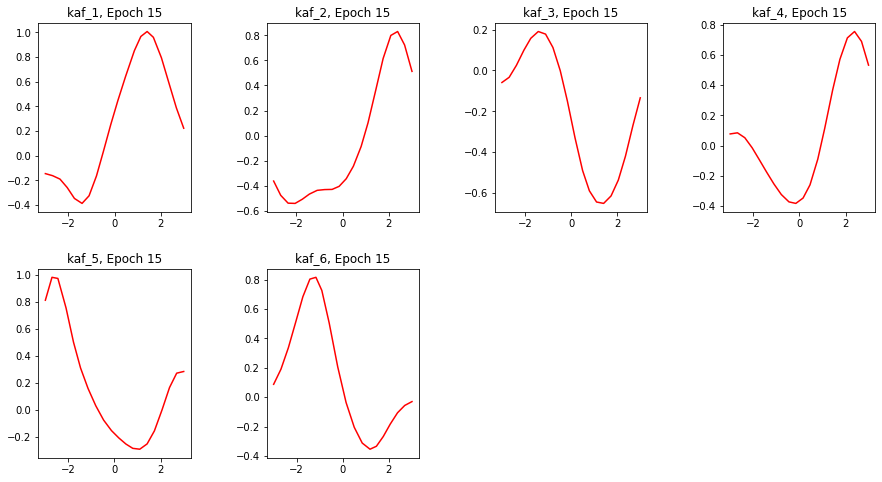

Epoch 15/60
391/391 [==============================] - 89s 226ms/step - loss: 1.6561 - sparse_categorical_accuracy: 0.3974 - val_loss: 1.7975 - val_sparse_categorical_accuracy: 0.4420
[[-3.00094867 -2.68738794 -2.36746168 ... 2.36450291 2.68758297 3.00455666]]
1.61087322
[[-2.98672867 -2.68061757 -2.35893416 ... 2.38105202 2.68050075 2.99803543]]
1.62989104
[[-2.99998236 -2.68536687 -2.37070608 ... 2.3643229 2.68667388 3.0037148]]
1.67095637
[[-3.00028968 -2.68445373 -2.36709332 ... 2.39388871 2.68873405 2.98811316]]
1.65209043
[[-2.98613882 -2.70749831 -2.45481205 ... 2.38922 2.69867563 3.00090027]]
1.77374089
[[-3.00057077 -2.68257499 -2.35780454 ... 2.37462425 2.68558717 2.99955702]]
1.73606491


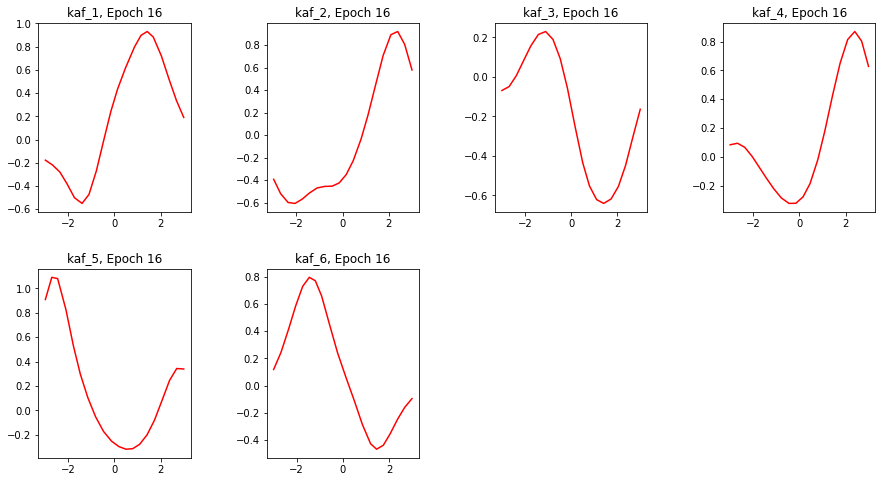

Epoch 16/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6652 - sparse_categorical_accuracy: 0.3957 - val_loss: 2.0502 - val_sparse_categorical_accuracy: 0.4044
[[-2.99989605 -2.68693972 -2.36790872 ... 2.36023712 2.68796301 3.00475407]]
1.5981468
[[-2.98408628 -2.67809486 -2.35236788 ... 2.38409615 2.68088365 2.99579215]]
1.621575
[[-3.00002337 -2.68552423 -2.37102365 ... 2.36384749 2.68622589 3.00377417]]
1.66711509
[[-3.00030351 -2.68354583 -2.36692929 ... 2.38931346 2.68313766 2.9831059]]
1.6451143
[[-2.96535301 -2.70175028 -2.47393799 ... 2.38829684 2.69885445 3.0028379]]
1.78024936
[[-3.00063705 -2.68226647 -2.35728478 ... 2.3785615 2.68547058 2.99799109]]
1.75036669


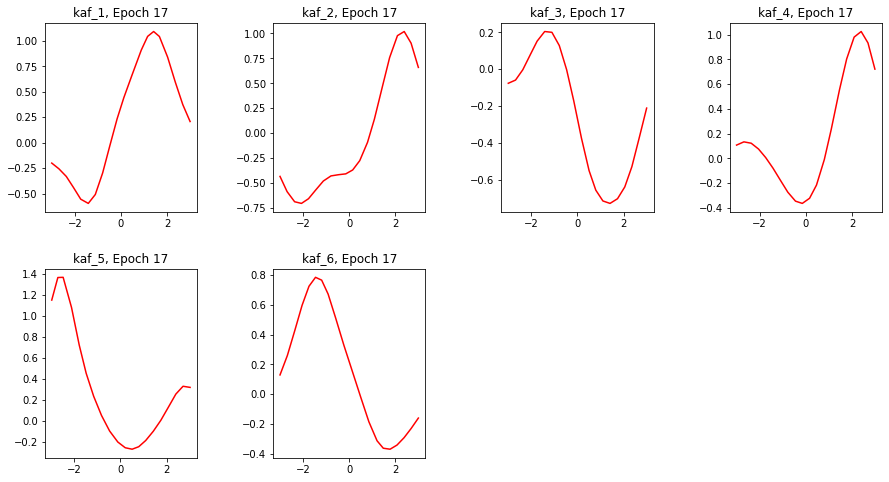

Epoch 17/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6705 - sparse_categorical_accuracy: 0.3952 - val_loss: 1.5757 - val_sparse_categorical_accuracy: 0.5561
[[-2.99913859 -2.68664694 -2.36785197 ... 2.36100984 2.68886256 3.00500369]]
1.58077872
[[-2.98054457 -2.67493463 -2.34533048 ... 2.38496017 2.67853308 2.99189734]]
1.60379636
[[-3.00032926 -2.68594813 -2.3713553 ... 2.36493731 2.68545747 3.00353646]]
1.66665339
[[-3.00024533 -2.6823957 -2.36696768 ... 2.39404511 2.67619586 2.97206426]]
1.6354636
[[-2.94155455 -2.69233871 -2.48823714 ... 2.39029527 2.70040154 3.00416017]]
1.77979052
[[-3.00065517 -2.68253422 -2.35996413 ... 2.38266373 2.68836546 2.99945474]]
1.77766597


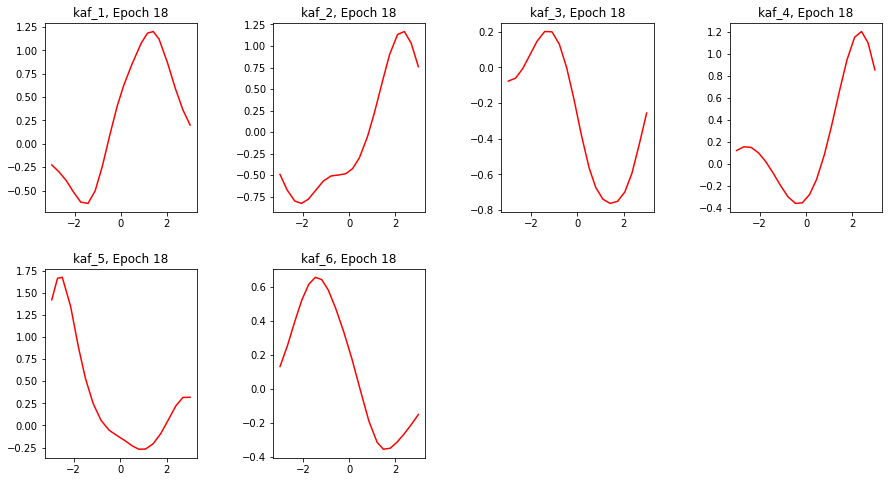

Epoch 18/60
391/391 [==============================] - 89s 226ms/step - loss: 1.6765 - sparse_categorical_accuracy: 0.3983 - val_loss: 1.6606 - val_sparse_categorical_accuracy: 0.4639
[[-2.99856734 -2.68656182 -2.36844683 ... 2.36125612 2.68959069 3.00515461]]
1.57616484
[[-2.97838187 -2.67282653 -2.34176707 ... 2.38503027 2.67529488 2.98760867]]
1.59508491
[[-3.00070596 -2.6865 -2.37249422 ... 2.366395 2.68466616 3.00309467]]
1.66857541
[[-3.00007176 -2.68098092 -2.36739135 ... 2.39684534 2.67587 2.96871305]]
1.63090432
[[-2.90954328 -2.6802094 -2.51046848 ... 2.39098763 2.70096 3.00347]]
1.78491259
[[-3.00056481 -2.68202758 -2.36039329 ... 2.38495 2.68729377 2.99726224]]
1.79722965


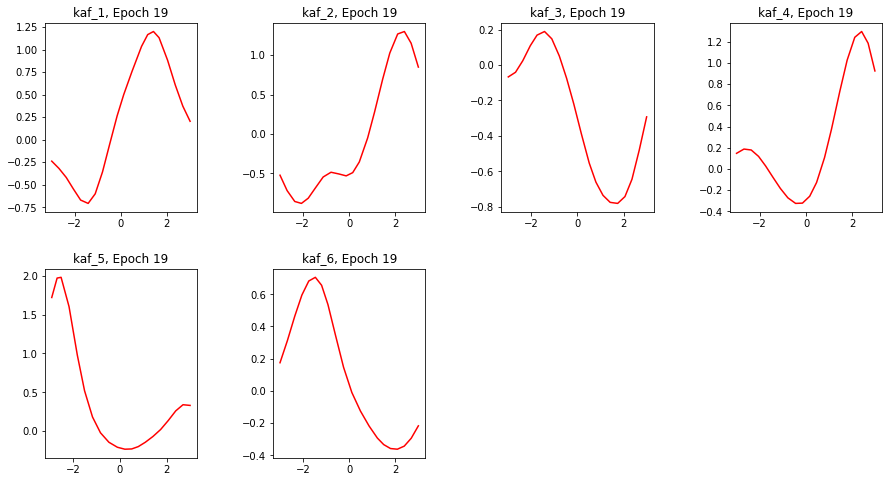

Epoch 19/60
391/391 [==============================] - 88s 226ms/step - loss: 1.6910 - sparse_categorical_accuracy: 0.3945 - val_loss: 1.6626 - val_sparse_categorical_accuracy: 0.5046
[[-2.99798083 -2.68623519 -2.36811 ... 2.36402965 2.69079399 3.00530267]]
1.57009459
[[-2.97667933 -2.67126846 -2.33830309 ... 2.3848803 2.67448211 2.98620439]]
1.59043443
[[-3.00106645 -2.68707156 -2.37337971 ... 2.36634874 2.68359494 3.00249887]]
1.66536
[[-2.99983931 -2.67889547 -2.3667531 ... 2.38914466 2.66595984 2.96008945]]
1.61940444
[[-2.8782649 -2.67143941 -2.52689862 ... 2.39036179 2.70059156 3.00443721]]
1.7707696
[[-3.00024319 -2.68136549 -2.36313438 ... 2.3805306 2.67994404 2.99194646]]
1.82438314


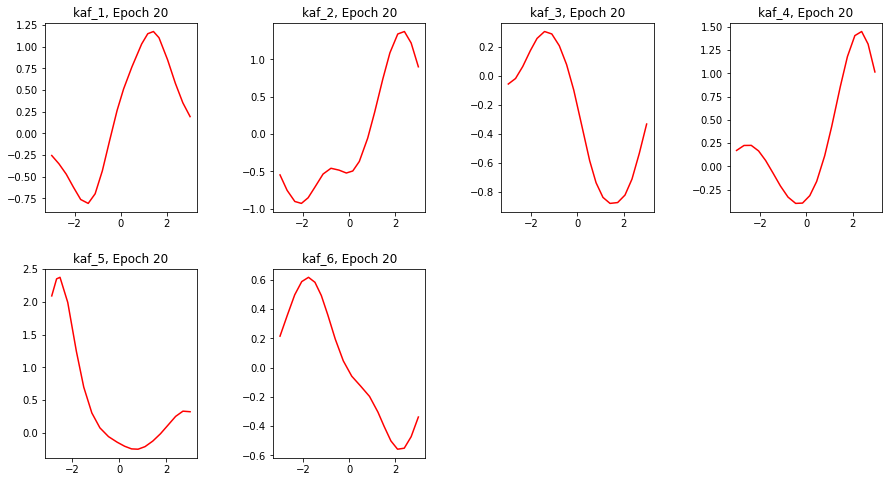

Epoch 20/60
391/391 [==============================] - 88s 226ms/step - loss: 1.7055 - sparse_categorical_accuracy: 0.3945 - val_loss: 1.7226 - val_sparse_categorical_accuracy: 0.4515
[[-2.99781346 -2.6860857 -2.36740327 ... 2.36577725 2.69177723 3.00550723]]
1.5595293
[[-2.97369337 -2.66772223 -2.33057904 ... 2.38904357 2.67387438 2.98131347]]
1.57477915
[[-3.00093842 -2.68716836 -2.37390518 ... 2.36928034 2.68471503 3.00252604]]
1.6588155
[[-2.99961305 -2.67611742 -2.36578226 ... 2.39360547 2.66305304 2.95175171]]
1.61288953
[[-2.8660984 -2.6797061 -2.5484 ... 2.38888741 2.6992557 3.00371289]]
1.76016831
[[-3.00012922 -2.68427 -2.37220168 ... 2.39128804 2.67739511 2.98552418]]
1.85281968


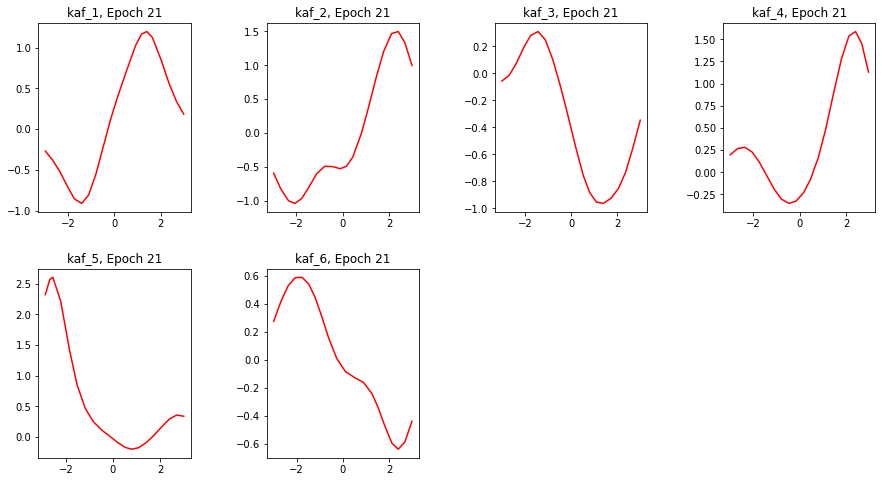

Epoch 21/60
391/391 [==============================] - 89s 227ms/step - loss: 1.7147 - sparse_categorical_accuracy: 0.3927 - val_loss: 1.7107 - val_sparse_categorical_accuracy: 0.4692
[[-2.99795389 -2.68656445 -2.36741328 ... 2.36531806 2.69286156 3.00564075]]
1.55662024
[[-2.97227311 -2.66654944 -2.32885695 ... 2.39398861 2.67684484 2.98000431]]
1.56751478
[[-3.00103712 -2.6874032 -2.37441158 ... 2.36919665 2.68288422 3.00159121]]
1.66249359
[[-2.99962234 -2.6760335 -2.36568356 ... 2.39864516 2.65959477 2.94375157]]
1.60676038
[[-2.84649968 -2.67693329 -2.56247592 ... 2.39180374 2.70216417 3.00685143]]
1.75856042
[[-2.99971247 -2.68759632 -2.38285565 ... 2.38938594 2.67921638 2.98713112]]
1.87803853


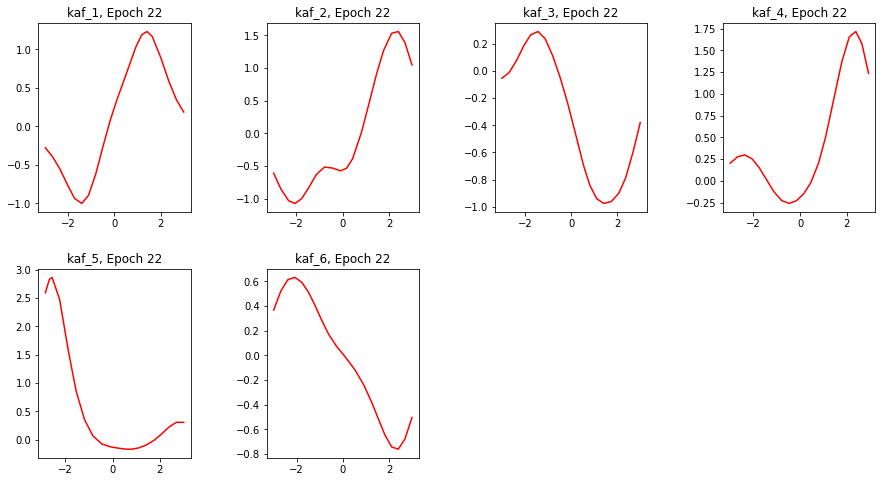

Epoch 22/60
391/391 [==============================] - 89s 226ms/step - loss: 1.7245 - sparse_categorical_accuracy: 0.3906 - val_loss: 1.6588 - val_sparse_categorical_accuracy: 0.5340
[[-2.99797678 -2.68632388 -2.36714101 ... 2.37031054 2.6941092 3.00569057]]
1.55331409
[[-2.9702847 -2.66363835 -2.32447433 ... 2.4020865 2.6805625 2.97690773]]
1.56505752
[[-3.00147343 -2.6880424 -2.37491679 ... 2.36762452 2.68266225 3.00157022]]
1.65899611
[[-2.99937057 -2.67436194 -2.36525059 ... 2.38533235 2.63972521 2.92695522]]
1.59178436
[[-2.84123158 -2.68235898 -2.5715785 ... 2.39173746 2.70251393 3.00818038]]
1.73686671
[[-3.00321913 -2.69697976 -2.3941617 ... 2.40372467 2.68210554 2.98428464]]
1.91789436


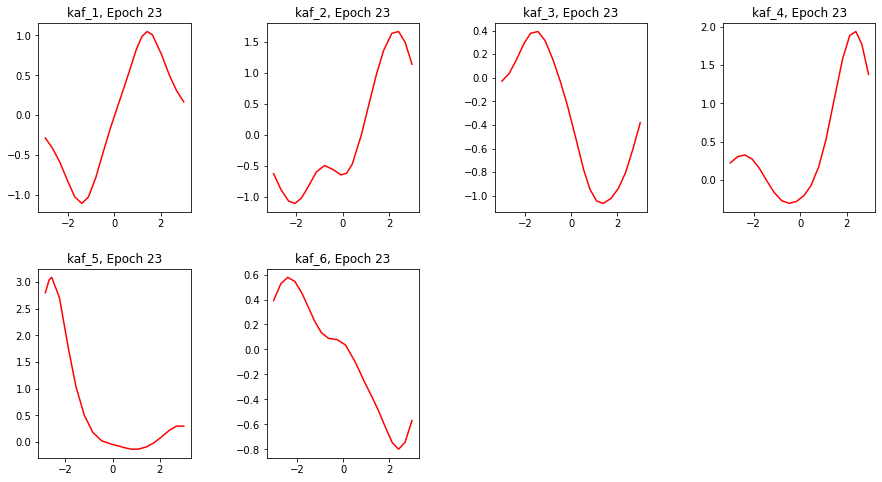

Epoch 23/60
391/391 [==============================] - 89s 226ms/step - loss: 1.7431 - sparse_categorical_accuracy: 0.3869 - val_loss: 1.9193 - val_sparse_categorical_accuracy: 0.4065
[[-2.99771976 -2.6863203 -2.36651063 ... 2.37126064 2.69502783 3.00572014]]
1.52955604
[[-2.96943116 -2.6627593 -2.32000899 ... 2.39957452 2.67341161 2.97081852]]
1.54262161
[[-3.00144053 -2.68799543 -2.37529 ... 2.36512923 2.68114519 3.00092483]]
1.65739346
[[-2.99913192 -2.6733849 -2.36565542 ... 2.39051461 2.63885021 2.92125559]]
1.58250797
[[-2.83133793 -2.69572902 -2.60093045 ... 2.3935771 2.7048862 3.01183438]]
1.72844052
[[-3.01236701 -2.71412826 -2.41496968 ... 2.42739844 2.71012044 3.00348949]]
1.96209586


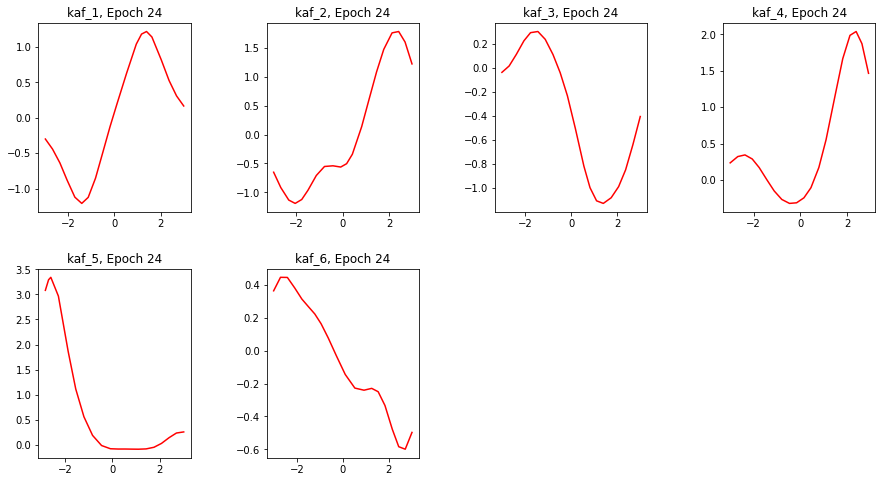

Epoch 24/60
391/391 [==============================] - 89s 227ms/step - loss: 1.7581 - sparse_categorical_accuracy: 0.3848 - val_loss: 1.6823 - val_sparse_categorical_accuracy: 0.5068
[[-2.99766946 -2.68657732 -2.36655354 ... 2.37273622 2.69615054 3.00575089]]
1.54131472
[[-2.96900439 -2.66341424 -2.32641459 ... 2.40450048 2.67650628 2.96996975]]
1.53138876
[[-3.00158143 -2.68838072 -2.37526178 ... 2.36431193 2.68008471 3.00044155]]
1.6544975
[[-2.99902964 -2.67186379 -2.36443019 ... 2.39328599 2.63148332 2.90933371]]
1.56799567
[[-2.81592584 -2.69594502 -2.61563683 ... 2.39387059 2.70530748 3.01324701]]
1.73200452
[[-3.00957108 -2.71026421 -2.41148162 ... 2.41460919 2.70632315 3.0110271]]
1.9865253


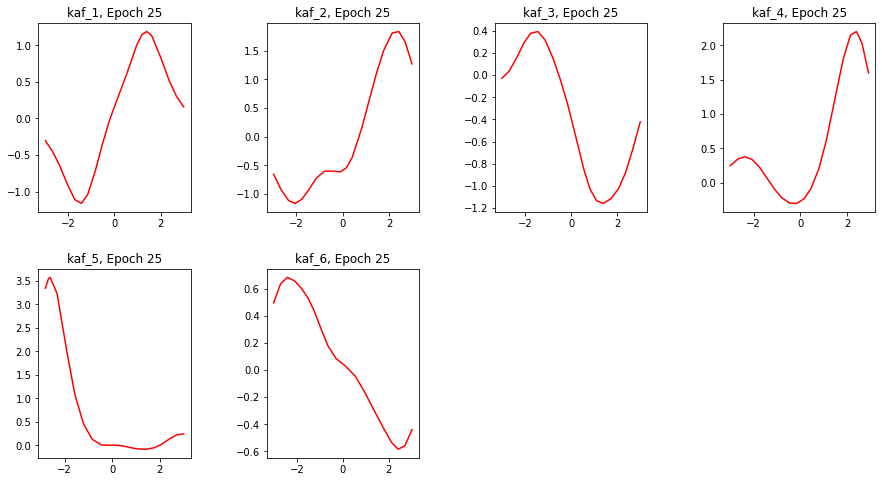

Epoch 25/60
391/391 [==============================] - 89s 227ms/step - loss: 1.7745 - sparse_categorical_accuracy: 0.3831 - val_loss: 1.8485 - val_sparse_categorical_accuracy: 0.4150
[[-2.99759 -2.68697476 -2.3678236 ... 2.37131071 2.69649673 3.00575542]]
1.52398098
[[-2.96879482 -2.66298103 -2.32240534 ... 2.40733647 2.67566514 2.96590352]]
1.51918
[[-3.00201416 -2.68880439 -2.3750093 ... 2.36207628 2.67874694 2.9999]]
1.65589321
[[-2.99905396 -2.67260456 -2.36531544 ... 2.38323379 2.61374068 2.8932898]]
1.55001426
[[-2.78782845 -2.68517303 -2.62182283 ... 2.39574528 2.70674515 3.01343155]]
1.72015667
[[-3.02125597 -2.7254138 -2.42414379 ... 2.43184185 2.71398139 3.01538658]]
2.04174042


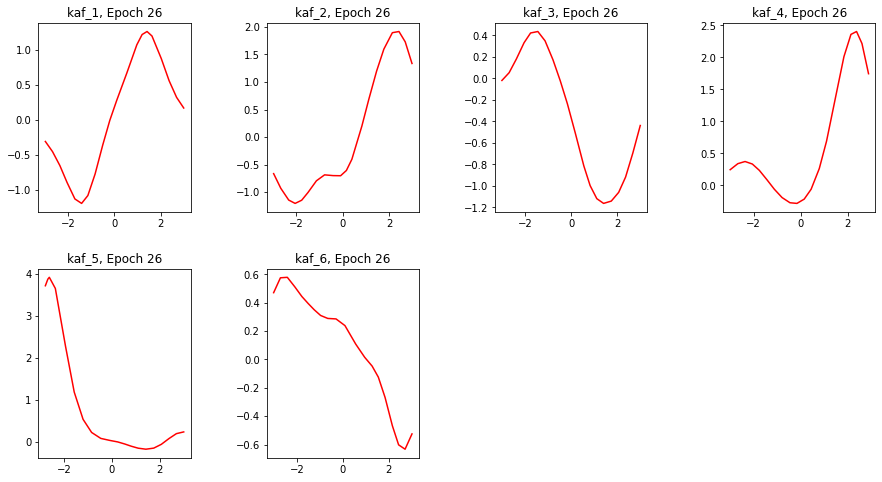

Epoch 26/60
391/391 [==============================] - 89s 227ms/step - loss: 1.7922 - sparse_categorical_accuracy: 0.3791 - val_loss: 1.7054 - val_sparse_categorical_accuracy: 0.4953
[[-2.99750328 -2.6874938 -2.36789513 ... 2.3730123 2.69732141 3.00574613]]
1.48375785
[[-2.96754503 -2.66023564 -2.31531405 ... 2.41158462 2.67595792 2.96174812]]
1.51071179
[[-3.00253224 -2.68936872 -2.37418485 ... 2.36180949 2.67797804 2.99956298]]
1.65596831
[[-2.99898267 -2.67161036 -2.36487651 ... 2.38610625 2.61580968 2.89225554]]
1.54643798
[[-2.80509639 -2.7170825 -2.65911412 ... 2.3964467 2.70747399 3.01388693]]
1.74077129
[[-3.0250504 -2.73200655 -2.43190956 ... 2.43582749 2.73291588 3.03415394]]
2.09334016


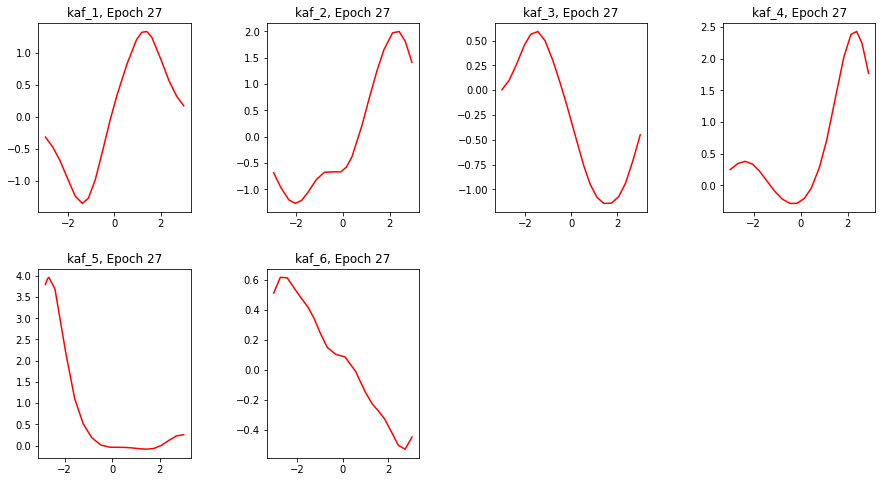

Epoch 27/60
391/391 [==============================] - 89s 227ms/step - loss: 1.8113 - sparse_categorical_accuracy: 0.3724 - val_loss: 1.8285 - val_sparse_categorical_accuracy: 0.4085
[[-2.99743748 -2.6886 -2.37059426 ... 2.37431884 2.6981349 3.00575566]]
1.47576869
[[-2.96809912 -2.6608088 -2.31501055 ... 2.42005825 2.67855167 2.95940351]]
1.4979589
[[-3.00356102 -2.68992877 -2.37105775 ... 2.36018586 2.67726326 2.99921775]]
1.65079021
[[-2.99841857 -2.6675179 -2.36179471 ... 2.38514042 2.60367179 2.87511373]]
1.52560866
[[-2.82064366 -2.73924947 -2.68065524 ... 2.39776397 2.71004868 3.02043676]]
1.71470189
[[-3.02769661 -2.74788189 -2.45103812 ... 2.43956065 2.74305058 3.04406095]]
2.13051677


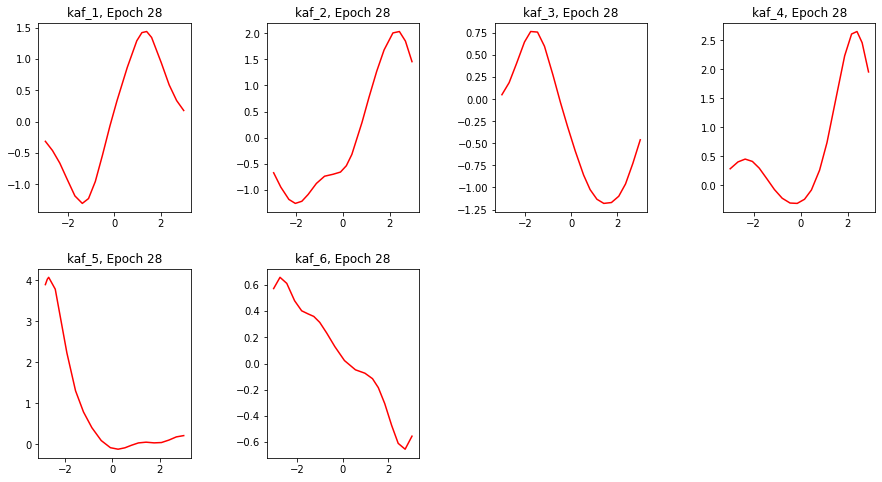

Epoch 28/60
391/391 [==============================] - 89s 227ms/step - loss: 1.8162 - sparse_categorical_accuracy: 0.3760 - val_loss: 1.8020 - val_sparse_categorical_accuracy: 0.4668
[[-2.99712539 -2.68781 -2.36884046 ... 2.38141847 2.69992495 3.00575924]]
1.47326219
[[-2.9662571 -2.65787601 -2.30745459 ... 2.42427754 2.67661333 2.95400119]]
1.5055604
[[-3.00383639 -2.68997025 -2.37005901 ... 2.35964322 2.67555213 2.99858475]]
1.65626812
[[-2.99805665 -2.66556168 -2.36129522 ... 2.37705374 2.59182787 2.86620474]]
1.52073824
[[-2.84128761 -2.76520658 -2.70607066 ... 2.39987302 2.71076202 3.02370453]]
1.73103595
[[-3.0341351 -2.76103735 -2.46755672 ... 2.43270612 2.77371025 3.10043621]]
2.18867564


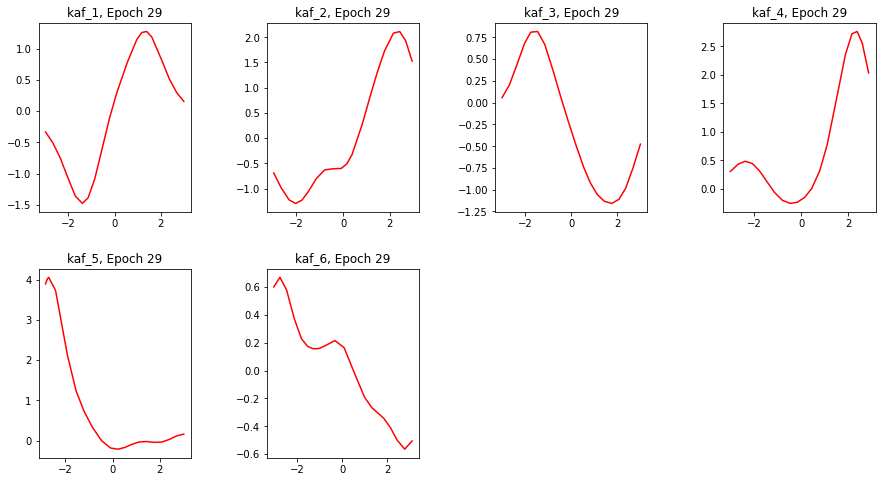

Epoch 29/60
391/391 [==============================] - 89s 227ms/step - loss: 1.8335 - sparse_categorical_accuracy: 0.3745 - val_loss: 1.8127 - val_sparse_categorical_accuracy: 0.4673
[[-2.99671769 -2.6875906 -2.36944962 ... 2.38575435 2.70133686 3.00575829]]
1.45651734
[[-2.96422672 -2.65411377 -2.30099463 ... 2.43289614 2.68059921 2.95176959]]
1.50601912
[[-3.00447917 -2.68970132 -2.36709785 ... 2.35546374 2.67478609 2.99858522]]
1.65163815
[[-2.99822426 -2.66738129 -2.36412621 ... 2.37036014 2.57680488 2.85049605]]
1.51631939
[[-2.84796619 -2.77656054 -2.71957517 ... 2.40026879 2.7110858 3.02795625]]
1.73469579
[[-3.05838847 -2.79269457 -2.48436499 ... 2.44642282 2.78746 3.10846138]]
2.23566222


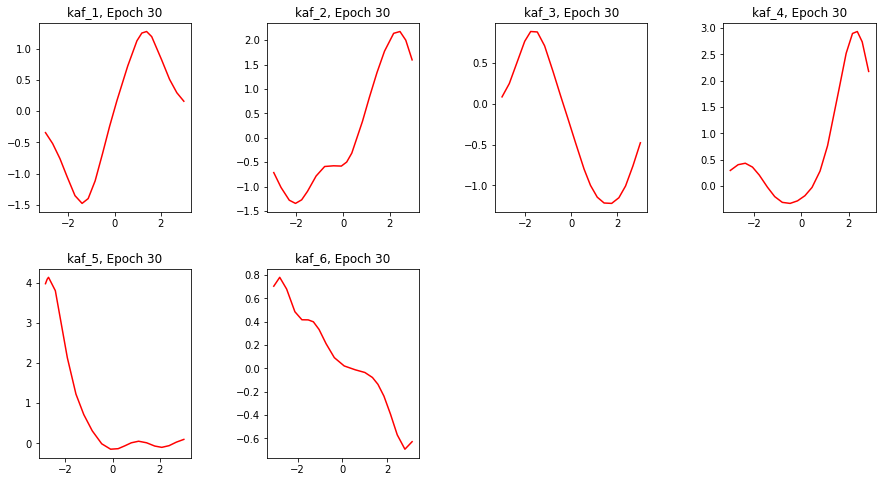

Epoch 30/60
391/391 [==============================] - 89s 228ms/step - loss: 1.8517 - sparse_categorical_accuracy: 0.3704 - val_loss: 1.8101 - val_sparse_categorical_accuracy: 0.4593
[[-2.99656558 -2.68751502 -2.36964726 ... 2.3888936 2.70256352 3.00575876]]
1.45290494
[[-2.96255422 -2.6519 -2.29651332 ... 2.44993615 2.68971157 2.94998932]]
1.49801493
[[-3.00474548 -2.68952 -2.36610532 ... 2.35092831 2.67353344 2.9983871]]
1.64296
[[-2.99764442 -2.66420388 -2.36177969 ... 2.36906767 2.57262325 2.84565401]]
1.51060915
[[-2.85320807 -2.78146768 -2.72347212 ... 2.40160275 2.71165586 3.02779102]]
1.72589564
[[-3.0484128 -2.78883147 -2.48370123 ... 2.47447085 2.81115055 3.10565567]]
2.26640201


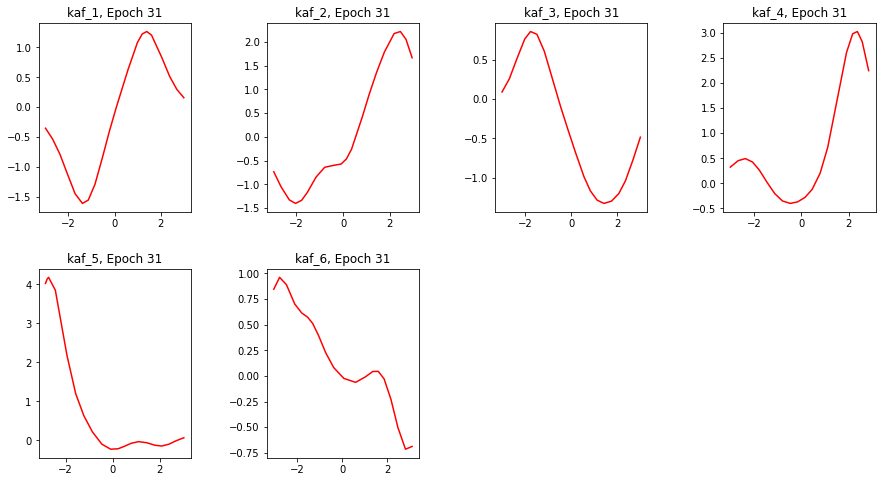

Epoch 31/60
391/391 [==============================] - 89s 227ms/step - loss: 1.8510 - sparse_categorical_accuracy: 0.3709 - val_loss: 1.7928 - val_sparse_categorical_accuracy: 0.4536
[[-2.9966464 -2.68761921 -2.37022424 ... 2.39165044 2.70360351 3.00575805]]
1.4441359
[[-2.95969319 -2.64778042 -2.28796387 ... 2.45384288 2.68216634 2.93865]]
1.47499084
[[-3.00508499 -2.68935943 -2.36564541 ... 2.35344863 2.67585349 2.99917245]]
1.645625
[[-2.99714684 -2.66242695 -2.36058855 ... 2.38059163 2.58415127 2.84917426]]
1.49746406
[[-2.85206437 -2.78552556 -2.73183155 ... 2.40197563 2.71201158 3.02618766]]
1.72948897
[[-3.07495975 -2.79880524 -2.49401522 ... 2.44082642 2.81212497 3.1675055]]
2.3189559


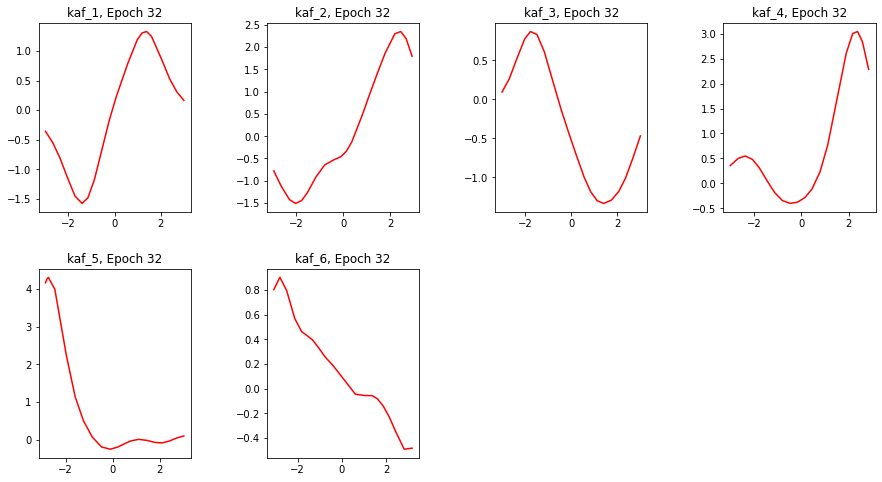

Epoch 32/60
391/391 [==============================] - 89s 227ms/step - loss: 1.8266 - sparse_categorical_accuracy: 0.3727 - val_loss: 1.8852 - val_sparse_categorical_accuracy: 0.4359
[[-2.99594235 -2.68699718 -2.37010145 ... 2.39287066 2.70459127 3.00575805]]
1.43618107
[[-2.95961547 -2.64856768 -2.29204249 ... 2.44074893 2.67207265 2.93216038]]
1.47545552
[[-3.00578046 -2.68869686 -2.362005 ... 2.35198164 2.67420936 2.99859428]]
1.64318347
[[-2.99631643 -2.66043925 -2.36163735 ... 2.38354135 2.5817771 2.8413105]]
1.4658767
[[-2.87170196 -2.81054354 -2.75685263 ... 2.40415168 2.71227837 3.02273202]]
1.71305501
[[-3.12715244 -2.80663896 -2.4811902 ... 2.4481566 2.81768227 3.185251]]
2.36557126


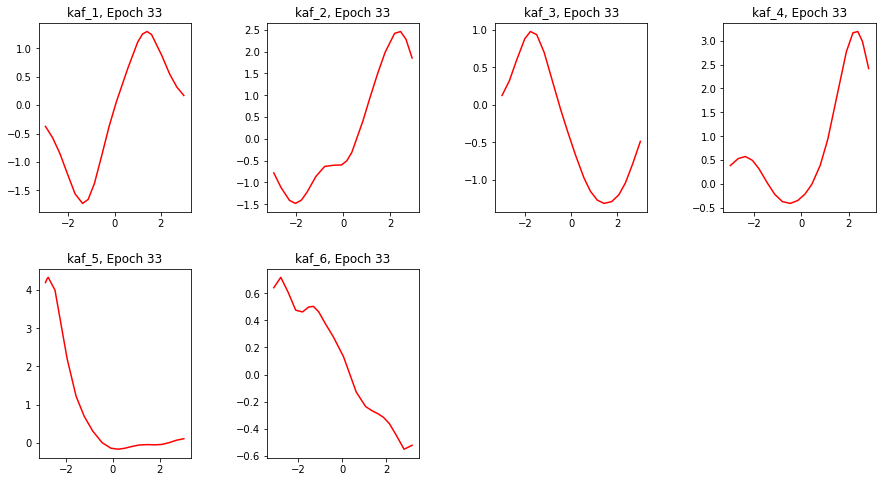

Epoch 33/60
391/391 [==============================] - 89s 227ms/step - loss: 1.8002 - sparse_categorical_accuracy: 0.3836 - val_loss: 1.7668 - val_sparse_categorical_accuracy: 0.4739
[[-2.99577761 -2.68671894 -2.37012601 ... 2.39662337 2.7055378 3.00575805]]
1.4229337
[[-2.9578402 -2.64597821 -2.28586578 ... 2.44520473 2.67505932 2.93256593]]
1.46238089
[[-3.00618553 -2.68806219 -2.35960221 ... 2.36024237 2.67549205 2.99836588]]
1.64026439
[[-2.99601 -2.65968204 -2.36173868 ... 2.37425423 2.57194 2.83245897]]
1.45139909
[[-2.87552094 -2.81926823 -2.76913452 ... 2.40554309 2.71307158 3.0223515]]
1.69292736
[[-3.1167984 -2.79871869 -2.47996521 ... 2.46048832 2.83930492 3.20215559]]
2.40478182


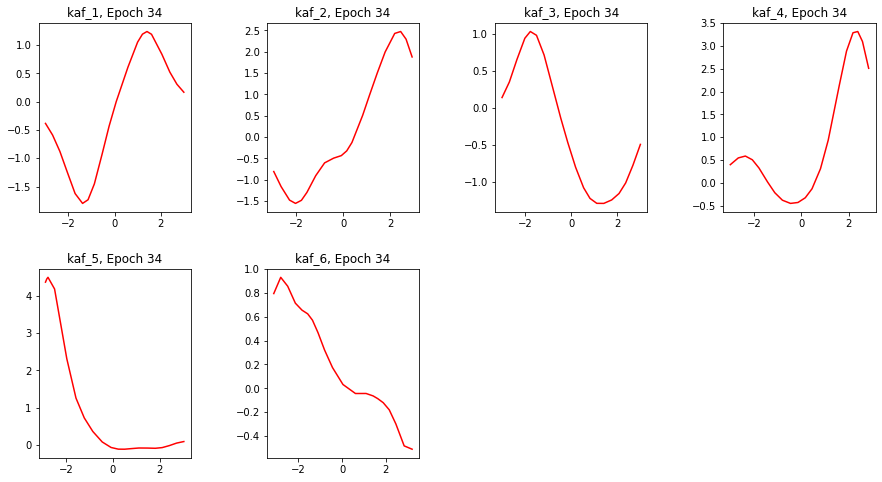

Epoch 34/60
391/391 [==============================] - 89s 227ms/step - loss: 1.7751 - sparse_categorical_accuracy: 0.3880 - val_loss: 1.5769 - val_sparse_categorical_accuracy: 0.5731
[[-2.99585319 -2.68654513 -2.37024832 ... 2.39833617 2.70667052 3.00575852]]
1.41257203
[[-2.95803213 -2.64715433 -2.29196262 ... 2.44514704 2.6718626 2.92733645]]
1.46071827
[[-3.00638938 -2.68798542 -2.35963607 ... 2.36152768 2.67679381 2.99885106]]
1.64657557
[[-2.99473286 -2.65582681 -2.36012 ... 2.37614226 2.56744051 2.82300758]]
1.43094242
[[-2.88043284 -2.82698917 -2.77768421 ... 2.40916228 2.71506143 3.02262735]]
1.67521417
[[-3.16035891 -2.82569766 -2.49259901 ... 2.45337987 2.826895 3.22872758]]
2.46300435


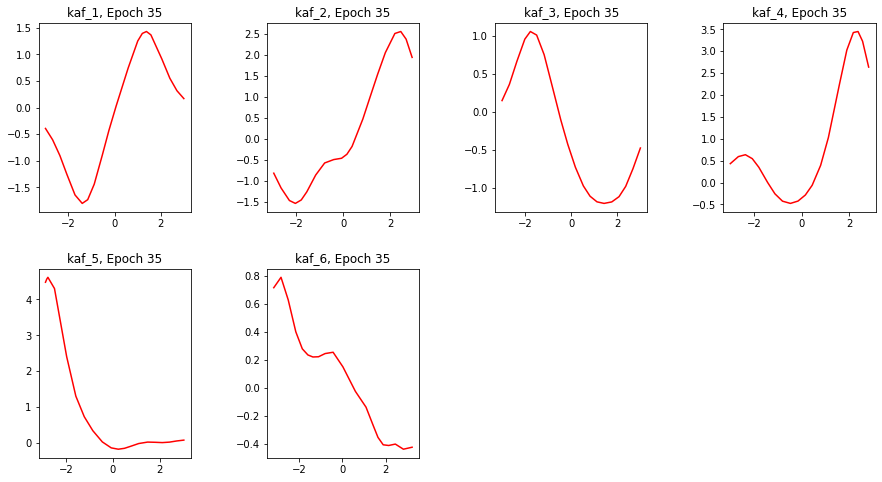

Epoch 35/60
391/391 [==============================] - 89s 227ms/step - loss: 1.7542 - sparse_categorical_accuracy: 0.3925 - val_loss: 1.6424 - val_sparse_categorical_accuracy: 0.5447
[[-2.9954679 -2.68615365 -2.37041593 ... 2.39882636 2.70771384 3.00575852]]
1.42024672
[[-2.95738482 -2.64699483 -2.29490972 ... 2.44826055 2.66878414 2.92064595]]
1.46061051
[[-3.00709 -2.68646884 -2.35382533 ... 2.35486245 2.67416215 2.99814677]]
1.64097571
[[-2.99438405 -2.65612221 -2.36164165 ... 2.37339401 2.55585575 2.80796385]]
1.42118454
[[-2.88199592 -2.82908058 -2.77952838 ... 2.41153598 2.71643806 3.02050424]]
1.64654982
[[-3.16979051 -2.83670044 -2.49316406 ... 2.4623208 2.83205938 3.21637821]]
2.49809146


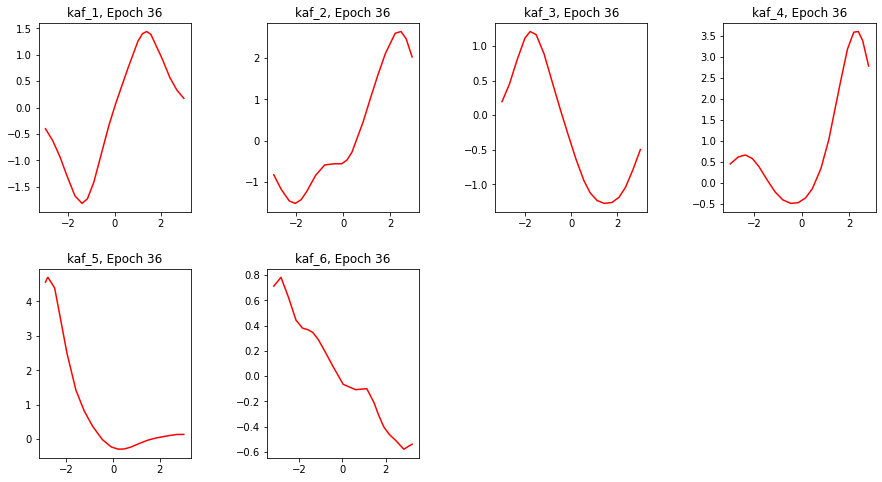

Epoch 36/60
391/391 [==============================] - 89s 227ms/step - loss: 1.7368 - sparse_categorical_accuracy: 0.3957 - val_loss: 1.8059 - val_sparse_categorical_accuracy: 0.4659
[[-2.99580026 -2.68681502 -2.37235069 ... 2.39943504 2.70802 3.00575805]]
1.41290545
[[-2.9571476 -2.64814425 -2.30172229 ... 2.4442451 2.66587853 2.9183054]]
1.44304538
[[-3.0071969 -2.68591261 -2.35256886 ... 2.35659313 2.67438626 2.99805117]]
1.64180493
[[-2.99357247 -2.65447354 -2.36115861 ... 2.36918569 2.54530144 2.79410672]]
1.4008764
[[-2.88356638 -2.83156061 -2.78251958 ... 2.41281104 2.71733117 3.02553272]]
1.63814306
[[-3.20618415 -2.85678959 -2.49215722 ... 2.46135139 2.83956552 3.2346282]]
2.53930354


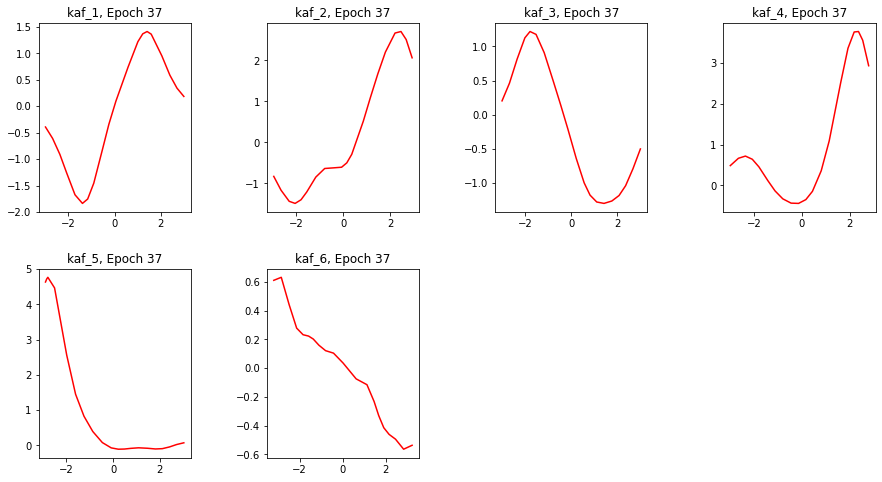

Epoch 37/60
391/391 [==============================] - 89s 226ms/step - loss: 1.7111 - sparse_categorical_accuracy: 0.4037 - val_loss: 1.6938 - val_sparse_categorical_accuracy: 0.5224
[[-2.99558091 -2.68681645 -2.37293935 ... 2.40019894 2.7085886 3.00575781]]
1.39317501
[[-2.95687842 -2.64778924 -2.30059147 ... 2.44915175 2.67194152 2.92181087]]
1.44911265
[[-3.00756454 -2.6845119 -2.34870887 ... 2.36097145 2.67566538 2.99826241]]
1.63442647
[[-2.99326015 -2.65329599 -2.36034751 ... 2.38641572 2.55806041 2.79760051]]
1.39261925
[[-2.88345122 -2.83269978 -2.78465796 ... 2.41500235 2.71804619 3.02577949]]
1.62557292
[[-3.21297312 -2.85695052 -2.48679161 ... 2.46718979 2.82978606 3.24192572]]
2.55297804


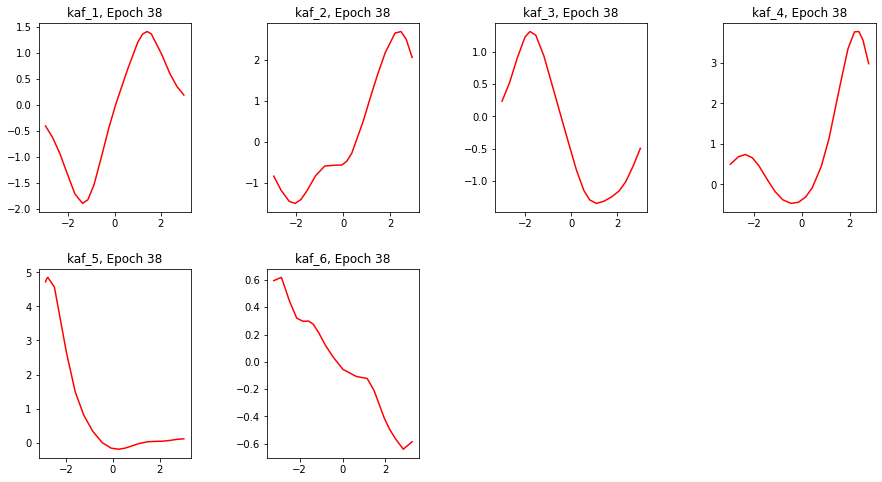

Epoch 38/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6912 - sparse_categorical_accuracy: 0.4084 - val_loss: 1.6241 - val_sparse_categorical_accuracy: 0.5082
[[-2.99571133 -2.68730927 -2.37454653 ... 2.4048686 2.70980835 3.00575805]]
1.37195265
[[-2.9573915 -2.64784813 -2.29684758 ... 2.45449042 2.67424774 2.91976452]]
1.44594395
[[-3.00776434 -2.6838572 -2.34808183 ... 2.36317182 2.67703462 2.99864554]]
1.63983166
[[-2.99235821 -2.65222263 -2.36205268 ... 2.39155483 2.56141853 2.79599905]]
1.38185298
[[-2.88594174 -2.83737683 -2.79062438 ... 2.41687036 2.71905231 3.02391171]]
1.60741615
[[-3.21092725 -2.85382938 -2.48320723 ... 2.46941733 2.83775115 3.26501894]]
2.57185888


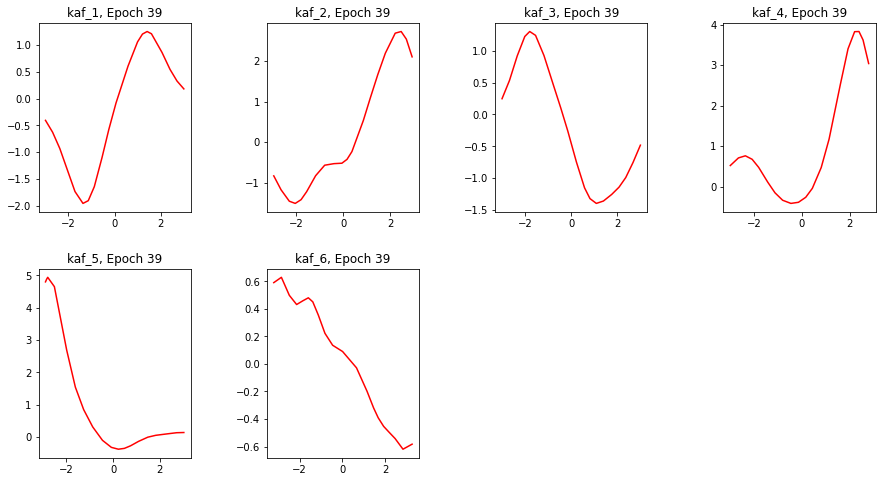

Epoch 39/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6694 - sparse_categorical_accuracy: 0.4133 - val_loss: 1.6198 - val_sparse_categorical_accuracy: 0.5174
[[-2.99564934 -2.68768406 -2.3749814 ... 2.40684748 2.71068478 3.005759]]
1.37602925
[[-2.95925736 -2.64946795 -2.29592872 ... 2.45351219 2.66912246 2.91323614]]
1.42964399
[[-3.00804043 -2.68232036 -2.34390044 ... 2.36482239 2.67682076 2.99833417]]
1.63778496
[[-2.99074888 -2.64837694 -2.36023474 ... 2.39033341 2.56239247 2.79716468]]
1.36311054
[[-2.89704394 -2.85179043 -2.80586624 ... 2.41888571 2.72029376 3.02802539]]
1.59875989
[[-3.23851871 -2.86861014 -2.48182559 ... 2.47334576 2.81639528 3.27341962]]
2.59676504


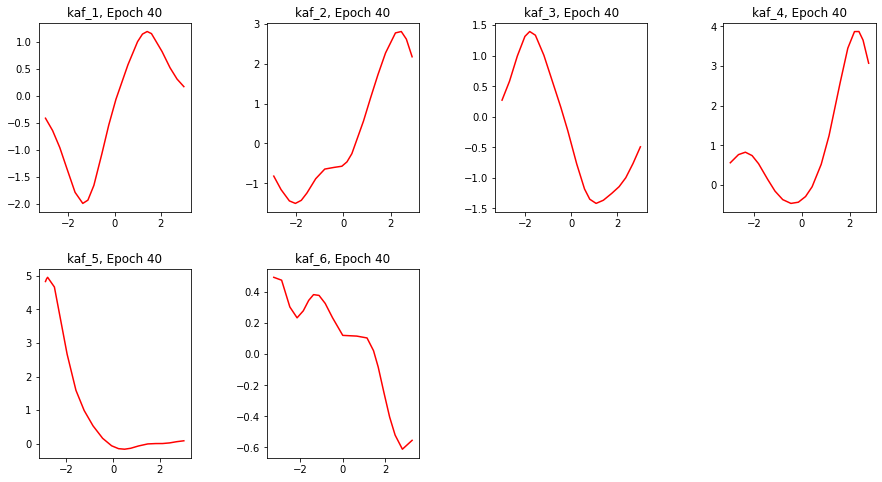

Epoch 40/60
391/391 [==============================] - 89s 228ms/step - loss: 1.6452 - sparse_categorical_accuracy: 0.4213 - val_loss: 1.4833 - val_sparse_categorical_accuracy: 0.5747
[[-2.99552894 -2.68768167 -2.37522626 ... 2.40789819 2.71110082 3.005759]]
1.36057663
[[-2.95932484 -2.64897156 -2.29322958 ... 2.46476412 2.67773485 2.91530108]]
1.43366921
[[-3.00810599 -2.68273807 -2.34618616 ... 2.36391068 2.67580819 2.99799514]]
1.64264381
[[-2.99003506 -2.64642119 -2.35886717 ... 2.40006375 2.56995296 2.79947448]]
1.34790671
[[-2.90051818 -2.85809875 -2.81426954 ... 2.42078972 2.72176123 3.02693248]]
1.59206986
[[-3.24324894 -2.87409902 -2.48338532 ... 2.4663198 2.80473232 3.28687406]]
2.61461234


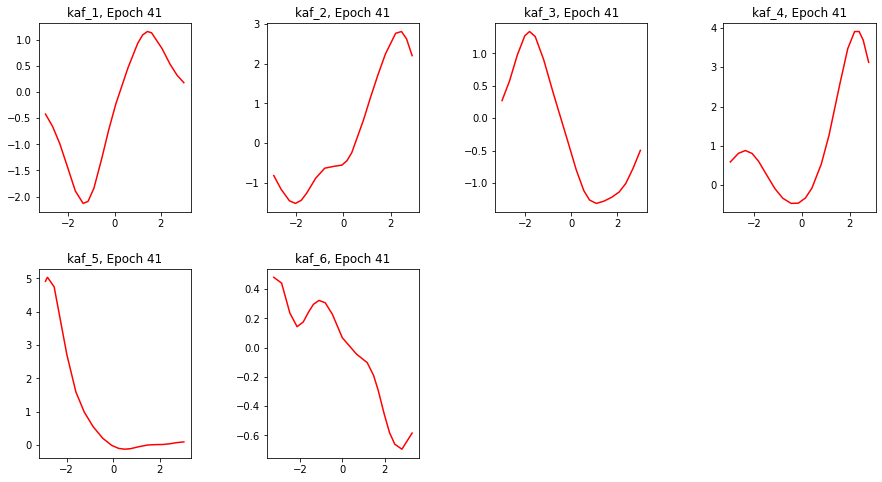

Epoch 41/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6269 - sparse_categorical_accuracy: 0.4239 - val_loss: 1.5488 - val_sparse_categorical_accuracy: 0.5482
[[-2.99564624 -2.68799734 -2.37572551 ... 2.40745664 2.7116127 3.00575948]]
1.35530853
[[-2.9587431 -2.64890146 -2.29472 ... 2.46759224 2.67937589 2.91420412]]
1.43069816
[[-3.00819302 -2.6818254 -2.34303927 ... 2.35811615 2.6740315 2.99770713]]
1.63483953
[[-2.99008369 -2.64714861 -2.35929918 ... 2.395468 2.56181145 2.79020548]]
1.33328164
[[-2.91100407 -2.87176394 -2.82920527 ... 2.42270231 2.72268605 3.02716422]]
1.59746337
[[-3.2329421 -2.86617398 -2.48453498 ... 2.47292757 2.82332516 3.3168695]]
2.62866044


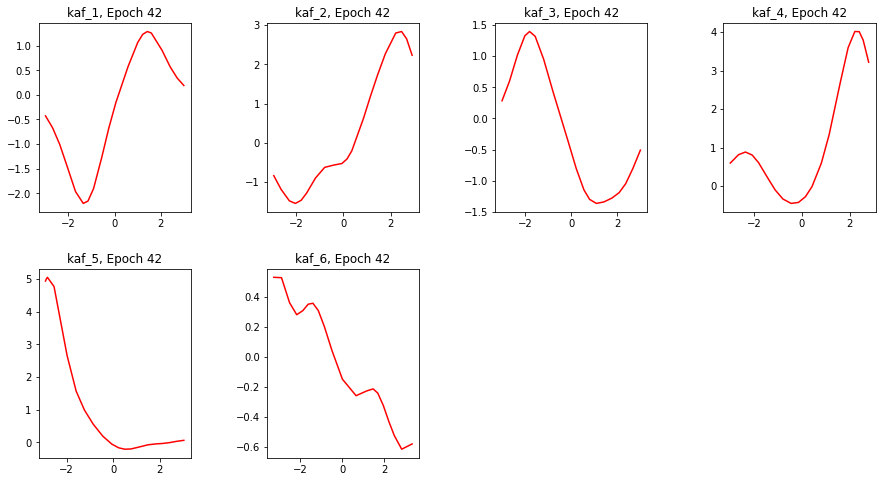

Epoch 42/60
391/391 [==============================] - 89s 227ms/step - loss: 1.6039 - sparse_categorical_accuracy: 0.4333 - val_loss: 1.4804 - val_sparse_categorical_accuracy: 0.5838
[[-2.99572277 -2.68834662 -2.376683 ... 2.40877986 2.71241879 3.00575972]]
1.36049581
[[-2.95919919 -2.64942384 -2.29495859 ... 2.47252607 2.6811049 2.9127]]
1.43651426
[[-3.00825381 -2.68094182 -2.34022284 ... 2.35281491 2.67170978 2.99705]]
1.62551558
[[-2.98916173 -2.64537191 -2.35919785 ... 2.39626694 2.55845928 2.78374767]]
1.3279866
[[-2.91426778 -2.87577152 -2.83308 ... 2.42485642 2.72435451 3.02468896]]
1.55387759
[[-3.23283911 -2.8652215 -2.48246908 ... 2.48522568 2.8340776 3.29987168]]
2.63607025


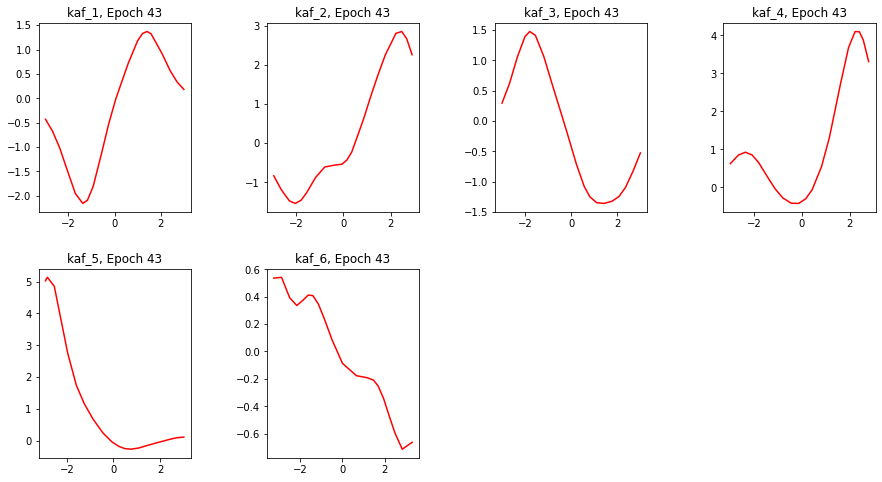

Epoch 43/60
391/391 [==============================] - 89s 227ms/step - loss: 1.5857 - sparse_categorical_accuracy: 0.4345 - val_loss: 1.4957 - val_sparse_categorical_accuracy: 0.5599
[[-2.99564505 -2.68849134 -2.37699056 ... 2.41061 2.71335459 3.00575972]]
1.35394704
[[-2.95837688 -2.6484611 -2.29375267 ... 2.46626115 2.67305923 2.90572596]]
1.42942405
[[-3.00840735 -2.67730141 -2.32831168 ... 2.35117221 2.67110229 2.99690413]]
1.62039506
[[-2.98861194 -2.64524364 -2.36060572 ... 2.39645576 2.56007624 2.7847929]]
1.31302154
[[-2.91141343 -2.87398863 -2.83288 ... 2.4271965 2.72606754 3.02389407]]
1.55290926
[[-3.22748137 -2.85952854 -2.47992826 ... 2.45555663 2.82592297 3.33044624]]
2.64494276


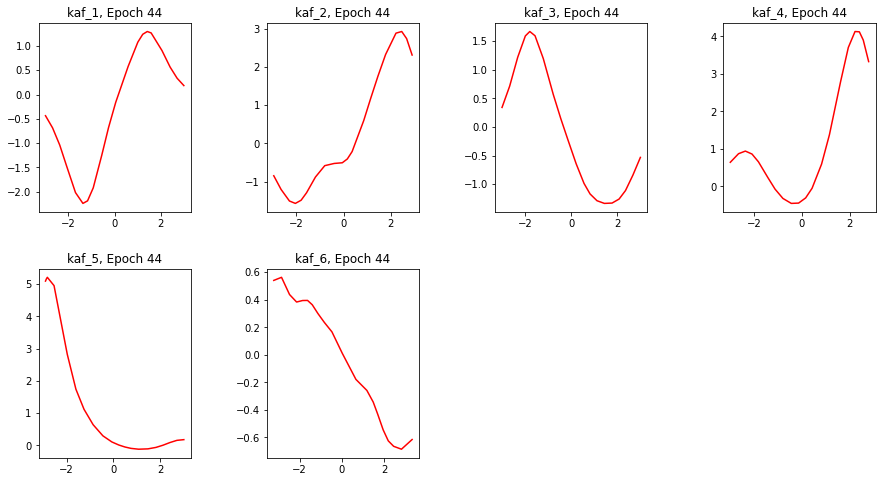

Epoch 44/60
391/391 [==============================] - 89s 227ms/step - loss: 1.5666 - sparse_categorical_accuracy: 0.4421 - val_loss: 1.5533 - val_sparse_categorical_accuracy: 0.5436
[[-2.99560475 -2.68873882 -2.37846279 ... 2.41375041 2.71455073 3.00575972]]
1.34513974
[[-2.95853329 -2.6488173 -2.29429221 ... 2.46600032 2.66898775 2.90077806]]
1.42105699
[[-3.00841045 -2.67730212 -2.33110094 ... 2.34932351 2.67047119 2.99672198]]
1.61693573
[[-2.98865199 -2.64583135 -2.36235309 ... 2.40263653 2.56902599 2.79159546]]
1.3056916
[[-2.92028713 -2.88468456 -2.84372854 ... 2.42894053 2.72735047 3.0236671]]
1.54902959
[[-3.23321176 -2.86234736 -2.47818208 ... 2.46559668 2.83315492 3.33403897]]
2.65887618


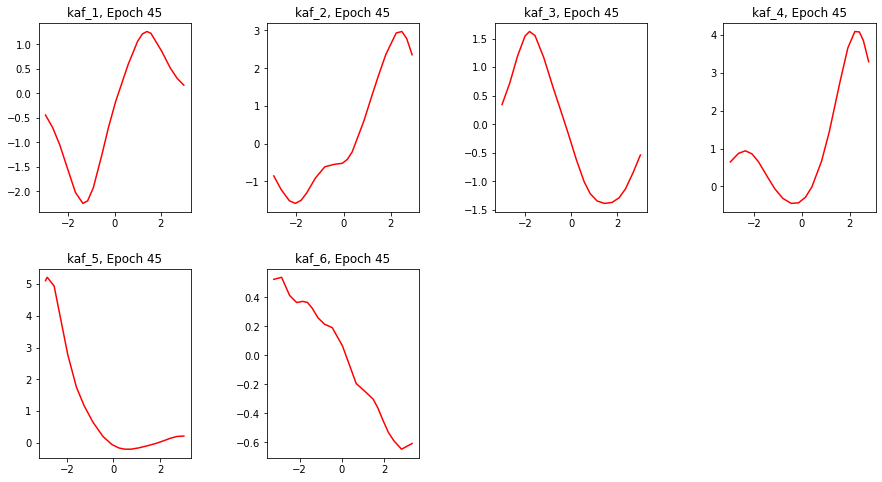

Epoch 45/60
391/391 [==============================] - 89s 227ms/step - loss: 1.5461 - sparse_categorical_accuracy: 0.4483 - val_loss: 1.3884 - val_sparse_categorical_accuracy: 0.6076
[[-2.99565935 -2.68914223 -2.37974906 ... 2.41333699 2.71500611 3.00575972]]
1.34825873
[[-2.95848823 -2.64885616 -2.29454494 ... 2.47174 2.67413664 2.90232921]]
1.42961276
[[-3.00844789 -2.67436934 -2.32362366 ... 2.35040712 2.67080212 2.99686813]]
1.61515236
[[-2.98879099 -2.64535713 -2.36116385 ... 2.41547751 2.58050942 2.79823637]]
1.31312275
[[-2.90764594 -2.87035179 -2.83000326 ... 2.43075657 2.73010516 3.03143573]]
1.53885436
[[-3.23172808 -2.86165452 -2.47760367 ... 2.46883225 2.82999825 3.32810402]]
2.66312814


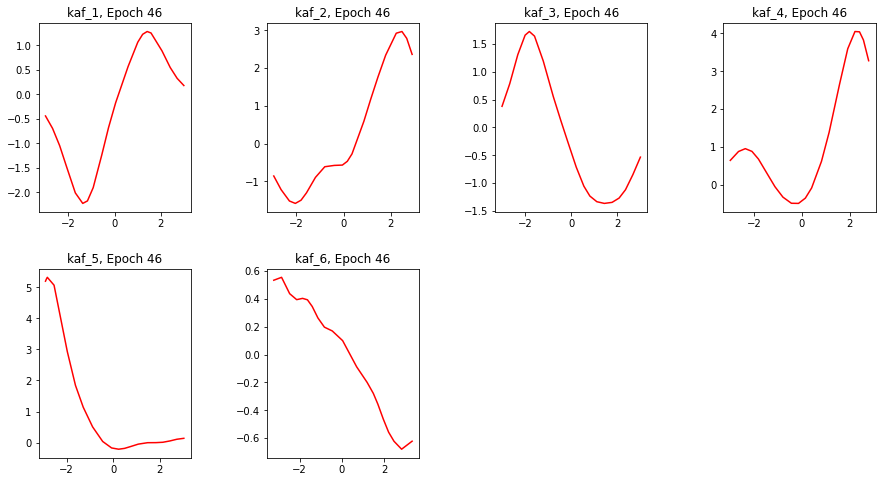

Epoch 46/60
391/391 [==============================] - 89s 227ms/step - loss: 1.5250 - sparse_categorical_accuracy: 0.4531 - val_loss: 1.4121 - val_sparse_categorical_accuracy: 0.5969
[[-2.99566054 -2.68921757 -2.38062358 ... 2.41512084 2.7160728 3.00575972]]
1.34776318
[[-2.95872951 -2.64934039 -2.29577947 ... 2.47150326 2.67459679 2.9023838]]
1.4284339
[[-3.00844812 -2.67400861 -2.32426238 ... 2.35010648 2.67087531 2.99691319]]
1.60653603
[[-2.98763609 -2.64322519 -2.36216497 ... 2.40616751 2.57222104 2.79210067]]
1.29857826
[[-2.90643907 -2.87141275 -2.83371544 ... 2.4321804 2.73170805 3.03537488]]
1.53964806
[[-3.233114 -2.86222553 -2.47577381 ... 2.47877264 2.822788 3.31233263]]
2.66680765


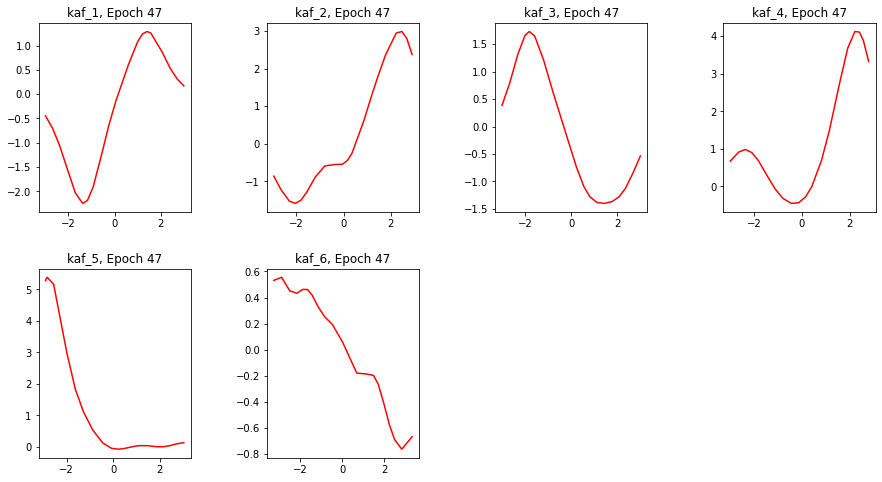

Epoch 47/60
391/391 [==============================] - 89s 227ms/step - loss: 1.5021 - sparse_categorical_accuracy: 0.4592 - val_loss: 1.5098 - val_sparse_categorical_accuracy: 0.5316
[[-2.9956665 -2.68937063 -2.38172126 ... 2.41436243 2.71623468 3.00576]]
1.33879149
[[-2.95848179 -2.64917827 -2.29602671 ... 2.46802402 2.66965699 2.89814138]]
1.42926514
[[-3.00845432 -2.67431211 -2.3267622 ... 2.34782863 2.66967 2.99657488]]
1.60734797
[[-2.98804045 -2.64437795 -2.36238551 ... 2.413553 2.57505083 2.79036593]]
1.30204237
[[-2.91021442 -2.87621307 -2.83871603 ... 2.43276954 2.73293447 3.03590631]]
1.51842582
[[-3.2329886 -2.86224937 -2.47653 ... 2.48101783 2.8148756 3.30442333]]
2.66873455


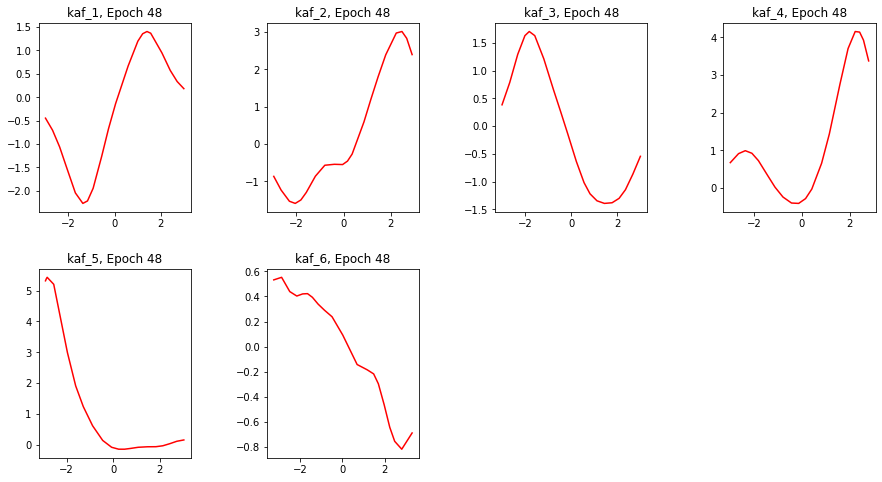

Epoch 48/60
391/391 [==============================] - 89s 227ms/step - loss: 1.4786 - sparse_categorical_accuracy: 0.4655 - val_loss: 1.4240 - val_sparse_categorical_accuracy: 0.5950
[[-2.99571371 -2.68974853 -2.38360548 ... 2.41651583 2.71705508 3.00575972]]
1.34119844
[[-2.95816565 -2.64870501 -2.2949574 ... 2.46755266 2.66683745 2.89420319]]
1.42688525
[[-3.00845265 -2.6739943 -2.32470822 ... 2.34936023 2.66999149 2.99660349]]
1.60908949
[[-2.98674345 -2.64049363 -2.35932398 ... 2.4191587 2.5810535 2.79473066]]
1.30142927
[[-2.90938616 -2.87622595 -2.83965898 ... 2.43431783 2.73316073 3.03852868]]
1.51008677
[[-3.23182416 -2.86180258 -2.47702217 ... 2.47467 2.81452942 3.30440116]]
2.66747546


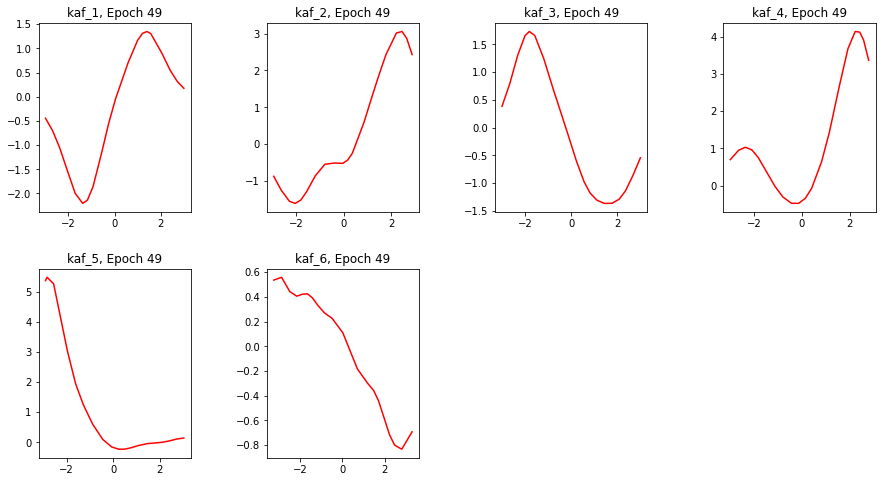

Epoch 49/60
391/391 [==============================] - 89s 227ms/step - loss: 1.4519 - sparse_categorical_accuracy: 0.4731 - val_loss: 1.3481 - val_sparse_categorical_accuracy: 0.6408
[[-2.99569249 -2.68995094 -2.38465214 ... 2.41511321 2.71724987 3.00575972]]
1.33678913
[[-2.95837426 -2.64876699 -2.29309177 ... 2.47130394 2.66858196 2.8936193]]
1.426283
[[-3.00845504 -2.6738 -2.32609248 ... 2.34924674 2.67014837 2.99666357]]
1.61089599
[[-2.98612952 -2.64037228 -2.36048031 ... 2.41860366 2.58012414 2.79358888]]
1.29616272
[[-2.90457702 -2.87139058 -2.83570218 ... 2.43549109 2.73414707 3.04087567]]
1.50335896
[[-3.23174548 -2.86024928 -2.47556734 ... 2.47741032 2.82491469 3.30978298]]
2.66928554


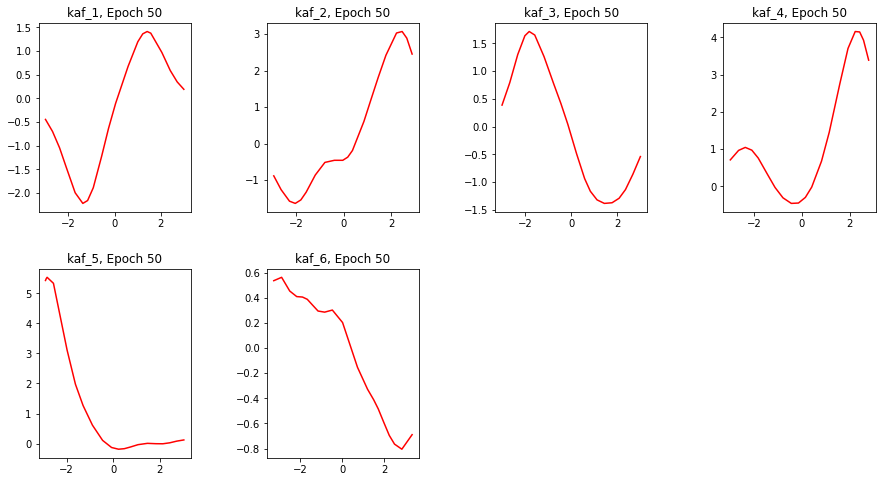

Epoch 50/60
391/391 [==============================] - 89s 227ms/step - loss: 1.4272 - sparse_categorical_accuracy: 0.4812 - val_loss: 1.3231 - val_sparse_categorical_accuracy: 0.6316
[[-2.9958353 -2.69032574 -2.38619447 ... 2.41525364 2.71766615 3.00575972]]
1.34078717
[[-2.95888615 -2.6502285 -2.29636049 ... 2.4703548 2.66798472 2.89281344]]
1.42428362
[[-3.00844717 -2.67300677 -2.3240695 ... 2.35163212 2.67077661 2.99678397]]
1.60714936
[[-2.98635507 -2.64203811 -2.36303258 ... 2.41488695 2.57648182 2.79029632]]
1.29376936
[[-2.90115356 -2.86897945 -2.83485532 ... 2.43495774 2.73499799 3.04480338]]
1.49161303
[[-3.23251843 -2.86143351 -2.47647953 ... 2.46514225 2.8261466 3.32131791]]
2.6700592


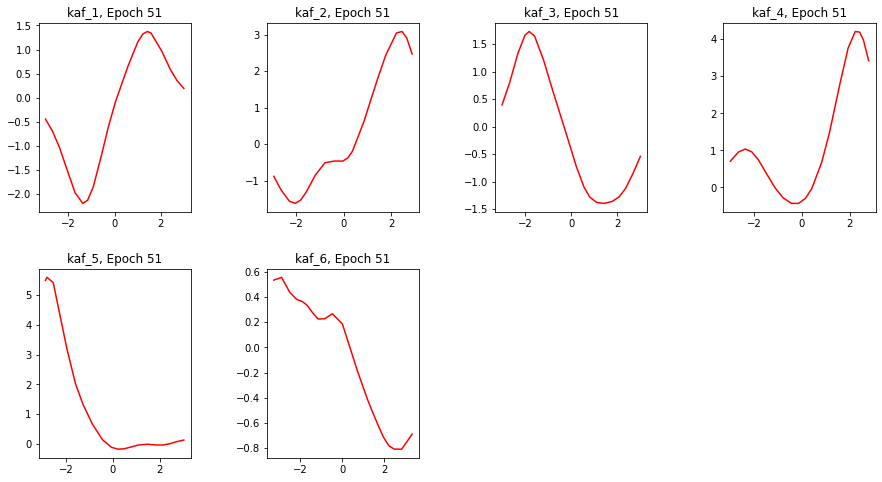

Epoch 51/60
391/391 [==============================] - 89s 228ms/step - loss: 1.4014 - sparse_categorical_accuracy: 0.4896 - val_loss: 1.3396 - val_sparse_categorical_accuracy: 0.6166
[[-2.99582505 -2.6904645 -2.38683891 ... 2.41583133 2.71819544 3.00575972]]
1.33573091
[[-2.95930839 -2.65081501 -2.29650116 ... 2.46855307 2.66537189 2.89012337]]
1.41635382
[[-3.00844502 -2.67320943 -2.32571 ... 2.34934664 2.66997886 2.99663472]]
1.61006677
[[-2.98578691 -2.63848376 -2.35895872 ... 2.41999555 2.58077765 2.79331493]]
1.29706728
[[-2.89509892 -2.8629148 -2.82971382 ... 2.43473 2.73517299 3.04919815]]
1.47884011
[[-3.23244286 -2.86116 -2.47627449 ... 2.46628928 2.83016896 3.32182121]]
2.67193389


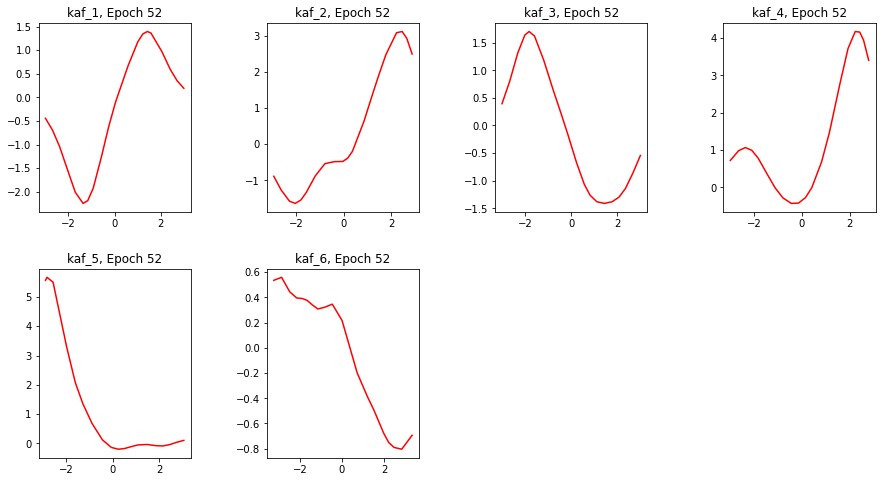

Epoch 52/60
391/391 [==============================] - 89s 227ms/step - loss: 1.3723 - sparse_categorical_accuracy: 0.4983 - val_loss: 1.2743 - val_sparse_categorical_accuracy: 0.6501
[[-2.99582314 -2.6907208 -2.38764524 ... 2.41645885 2.71867 3.00575972]]
1.33486927
[[-2.95952201 -2.65150142 -2.29827118 ... 2.47010112 2.66519046 2.88859272]]
1.41793406
[[-3.00844812 -2.67304564 -2.32540846 ... 2.34902978 2.66977978 2.99658132]]
1.61017168
[[-2.98563576 -2.63752747 -2.35852218 ... 2.42235541 2.58276176 2.79419899]]
1.29883087
[[-2.89053583 -2.85763335 -2.82440519 ... 2.43561411 2.73488975 3.04615402]]
1.46847284
[[-3.23268032 -2.86151195 -2.47640443 ... 2.46880627 2.83421683 3.32766962]]
2.67333913


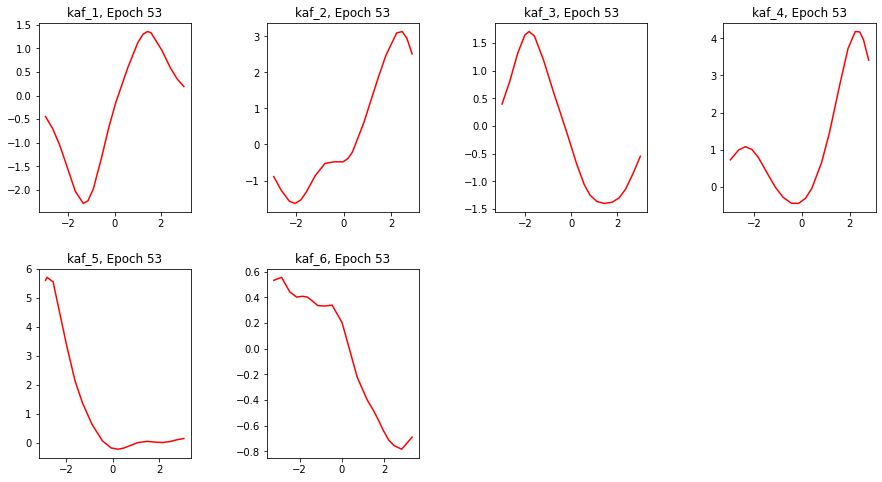

Epoch 53/60
391/391 [==============================] - 89s 227ms/step - loss: 1.3408 - sparse_categorical_accuracy: 0.5094 - val_loss: 1.2082 - val_sparse_categorical_accuracy: 0.6680
[[-2.99577951 -2.69078469 -2.38808918 ... 2.41537571 2.71889544 3.00575972]]
1.34941375
[[-2.95916414 -2.65089464 -2.29643893 ... 2.47004032 2.6639483 2.88669467]]
1.41508615
[[-3.00845551 -2.67271233 -2.32443428 ... 2.34929872 2.66982412 2.99658108]]
1.61155903
[[-2.98518753 -2.63678694 -2.35926461 ... 2.42481709 2.58432269 2.79451108]]
1.30095756
[[-2.89067984 -2.85869169 -2.82632494 ... 2.43519974 2.73498631 3.04515266]]
1.45861769
[[-3.23268771 -2.86145258 -2.47636032 ... 2.46714425 2.83733535 3.33220816]]
2.6732049


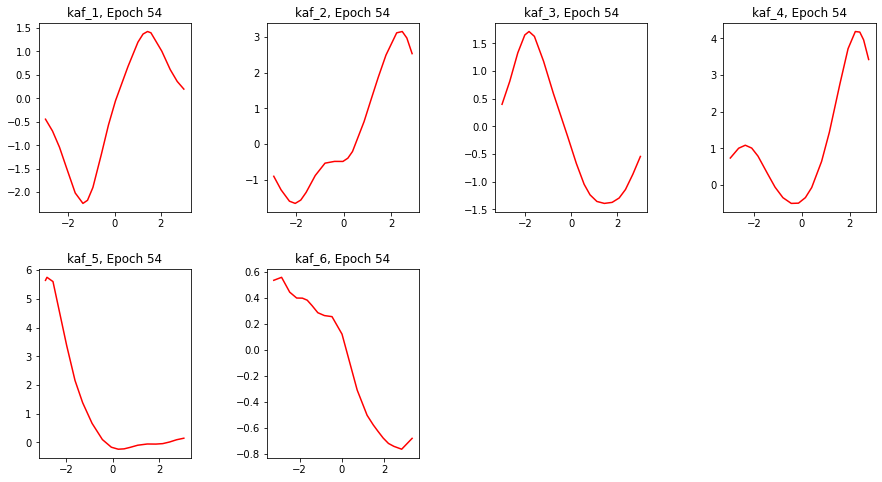

Epoch 54/60
391/391 [==============================] - 89s 227ms/step - loss: 1.3070 - sparse_categorical_accuracy: 0.5182 - val_loss: 1.1997 - val_sparse_categorical_accuracy: 0.6515
[[-2.99564528 -2.69073725 -2.38862419 ... 2.41536236 2.71926832 3.00575972]]
1.343225
[[-2.95954347 -2.65146303 -2.29726768 ... 2.4679234 2.65982676 2.88282728]]
1.41265202
[[-3.0084548 -2.67212892 -2.32173872 ... 2.34840155 2.66964197 2.9965446]]
1.60359788
[[-2.98513961 -2.63716 -2.36030769 ... 2.42253351 2.58218718 2.79308438]]
1.30193722
[[-2.88429022 -2.85166621 -2.81970286 ... 2.43639421 2.73447227 3.04220581]]
1.4530015
[[-3.23267746 -2.86131883 -2.47583795 ... 2.46516275 2.83679986 3.3335166]]
2.67104721


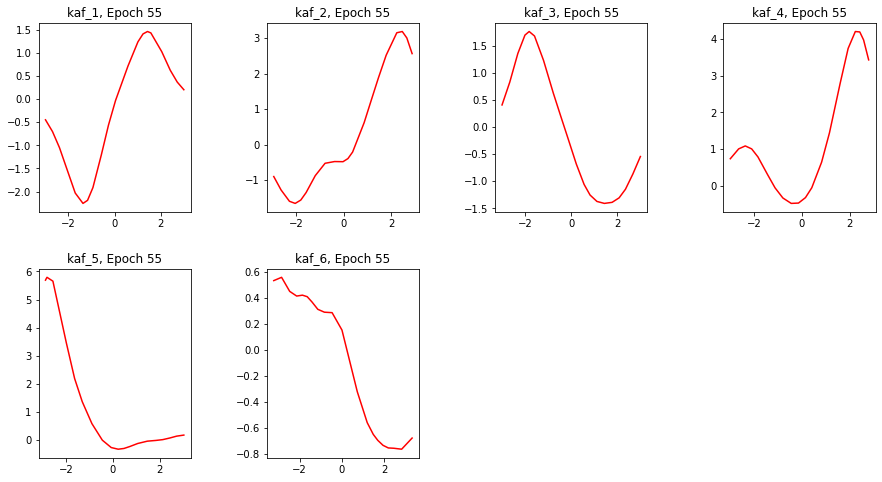

Epoch 55/60
391/391 [==============================] - 89s 227ms/step - loss: 1.2648 - sparse_categorical_accuracy: 0.5307 - val_loss: 1.1036 - val_sparse_categorical_accuracy: 0.6996
[[-2.99559951 -2.69077182 -2.38888192 ... 2.41610074 2.71964574 3.00575972]]
1.34217453
[[-2.95974135 -2.65206909 -2.29948735 ... 2.46671271 2.65736508 2.88048315]]
1.41155326
[[-3.00845647 -2.67193913 -2.32227921 ... 2.34882569 2.66989017 2.99661469]]
1.60499382
[[-2.98554397 -2.6378119 -2.36019 ... 2.42863631 2.58726811 2.79583859]]
1.29909062
[[-2.88241792 -2.84950948 -2.81756067 ... 2.43674445 2.73442554 3.04049253]]
1.44201589
[[-3.2326355 -2.86117196 -2.47568774 ... 2.46618772 2.83739233 3.33060265]]
2.66902184


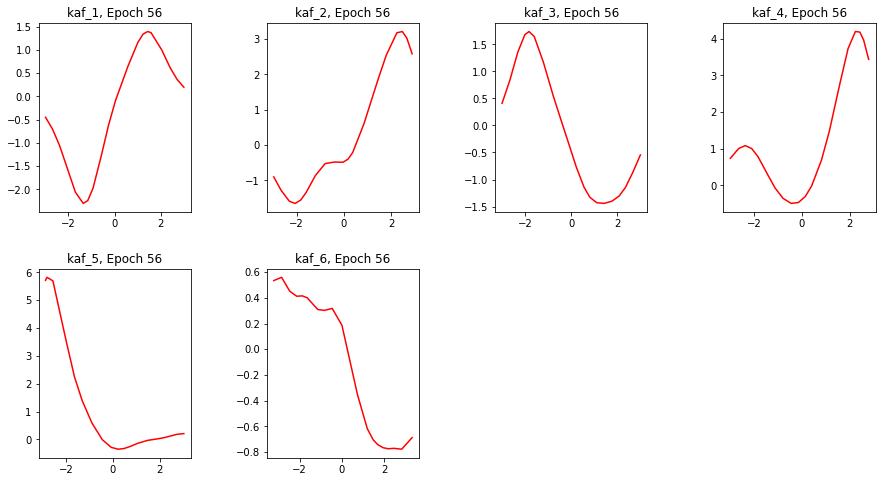

Epoch 56/60
391/391 [==============================] - 89s 227ms/step - loss: 1.2219 - sparse_categorical_accuracy: 0.5425 - val_loss: 1.0645 - val_sparse_categorical_accuracy: 0.7251
[[-2.99565434 -2.69100189 -2.38948298 ... 2.41667438 2.71993208 3.00575972]]
1.34303725
[[-2.95989776 -2.65269923 -2.30113578 ... 2.46375799 2.65397644 2.87796378]]
1.40192914
[[-3.00846624 -2.6722362 -2.3226862 ... 2.3493402 2.67005706 2.99664497]]
1.60837388
[[-2.9857049 -2.63759351 -2.35936642 ... 2.43050218 2.58900285 2.79702783]]
1.3003509
[[-2.88000178 -2.84687662 -2.81505585 ... 2.43684769 2.73451757 3.03927779]]
1.43224716
[[-3.23259473 -2.86108589 -2.47564626 ... 2.46362782 2.83692241 3.33192015]]
2.66821074


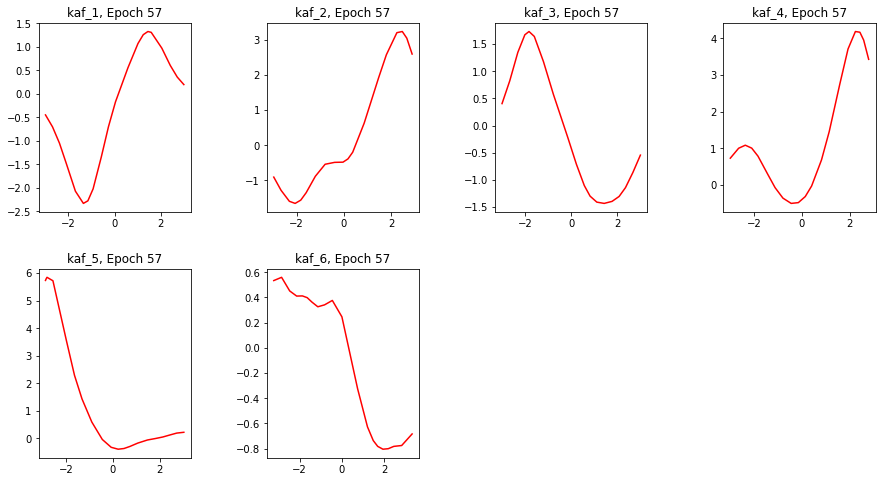

Epoch 57/60
391/391 [==============================] - 89s 227ms/step - loss: 1.1719 - sparse_categorical_accuracy: 0.5590 - val_loss: 1.0250 - val_sparse_categorical_accuracy: 0.7202
[[-2.99570417 -2.69117093 -2.39012337 ... 2.41683793 2.72015858 3.00575972]]
1.35031986
[[-2.95988083 -2.65275645 -2.30096626 ... 2.46152139 2.65231633 2.87704039]]
1.39875197
[[-3.00846887 -2.67208624 -2.32261539 ... 2.34880257 2.66982841 2.99658465]]
1.61003971
[[-2.98580956 -2.63769746 -2.35946345 ... 2.43269777 2.59165263 2.79921103]]
1.3020215
[[-2.8760488 -2.84279394 -2.81143498 ... 2.43725014 2.73508978 3.04184198]]
1.42666149
[[-3.23261452 -2.86108398 -2.47560477 ... 2.4634428 2.83637452 3.33110118]]
2.66732097


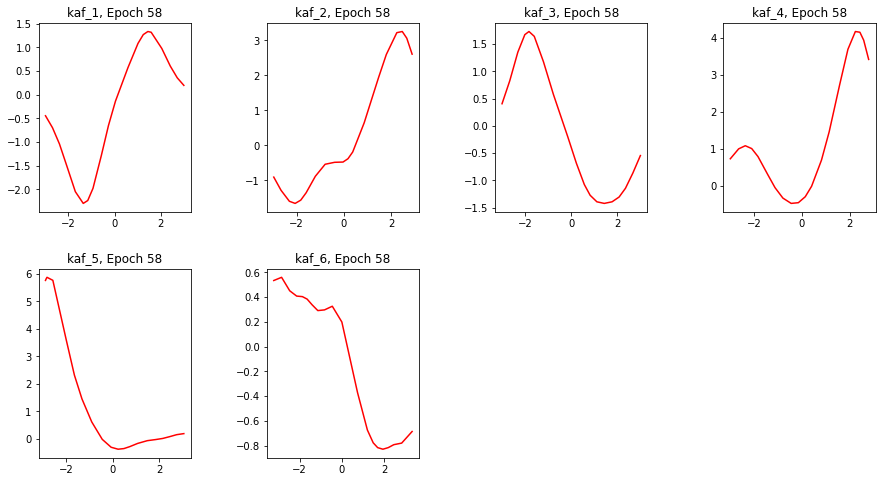

Epoch 58/60
391/391 [==============================] - 89s 227ms/step - loss: 1.1143 - sparse_categorical_accuracy: 0.5773 - val_loss: 0.9704 - val_sparse_categorical_accuracy: 0.7440
[[-2.99573112 -2.69128 -2.39038491 ... 2.41681433 2.72024846 3.00575972]]
1.35060906
[[-2.96001649 -2.65307903 -2.30149913 ... 2.46256638 2.65250659 2.87665772]]
1.39899409
[[-3.00847459 -2.67227459 -2.32314229 ... 2.34832025 2.66978359 2.99658608]]
1.60724628
[[-2.98577023 -2.63705206 -2.35847259 ... 2.43524599 2.59458947 2.80160022]]
1.30386889
[[-2.87612629 -2.84282422 -2.81139755 ... 2.43741703 2.73515582 3.04168344]]
1.4242357
[[-3.23261142 -2.86108065 -2.47562933 ... 2.46274018 2.83609867 3.33105183]]
2.66618609


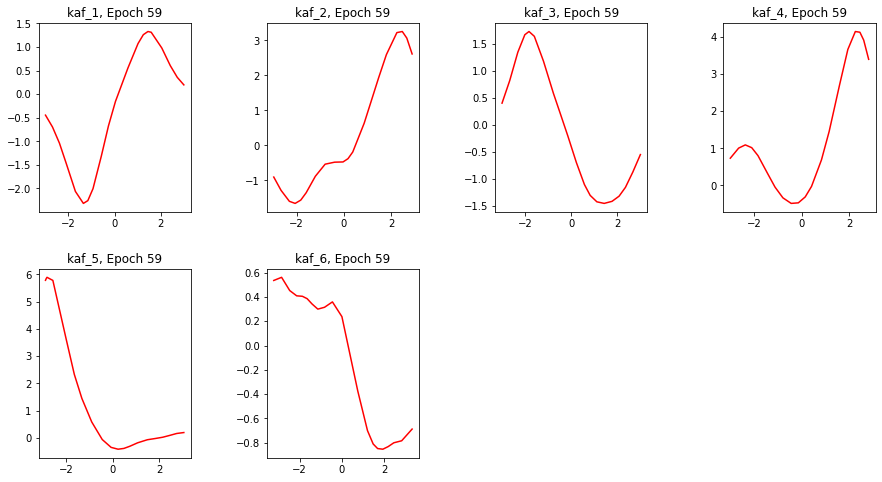

Epoch 59/60
391/391 [==============================] - 89s 227ms/step - loss: 1.0509 - sparse_categorical_accuracy: 0.6000 - val_loss: 0.9329 - val_sparse_categorical_accuracy: 0.7546
[[-2.99573064 -2.69132781 -2.39049077 ... 2.41661501 2.72028112 3.00575972]]
1.35384178
[[-2.96008277 -2.65330124 -2.3020997 ... 2.46232796 2.65234828 2.87651706]]
1.39770138
[[-3.00847197 -2.67200518 -2.32223344 ... 2.34823322 2.6697762 2.99659157]]
1.60636926
[[-2.98596787 -2.63724494 -2.35804152 ... 2.43522787 2.59459734 2.80151367]]
1.30347824
[[-2.87396598 -2.84047985 -2.80921435 ... 2.43743443 2.73497272 3.0402317]]
1.42042029
[[-3.23261523 -2.86109304 -2.47564816 ... 2.46257806 2.83616638 3.33110428]]
2.66439366


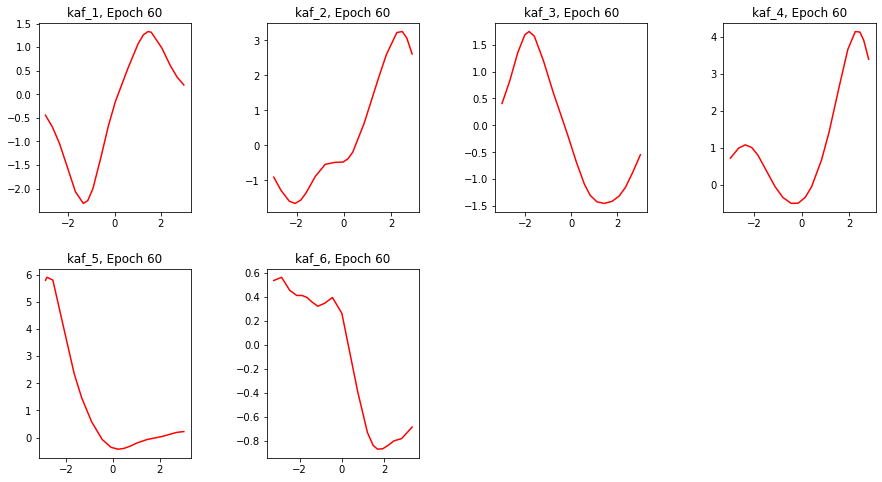

Epoch 60/60
391/391 [==============================] - 89s 228ms/step - loss: 0.9846 - sparse_categorical_accuracy: 0.6271 - val_loss: 0.8808 - val_sparse_categorical_accuracy: 0.7754


In [ ]:
epochs = 60
step_size = np.ceil((len(x_train) / 128) * (epochs/2))

oclr = tfa.optimizers.TriangularCyclicalLearningRate(initial_learning_rate = 0.01, maximal_learning_rate = 2, step_size = step_size)

rob_freekaf_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = oclr),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )
history_freekaf = rob_freekaf_vgg.fit(x = train, epochs = epochs, batch_size = 128, validation_data = test, callbacks=[activationsf.plot_kafs_epoch_wise(6)])

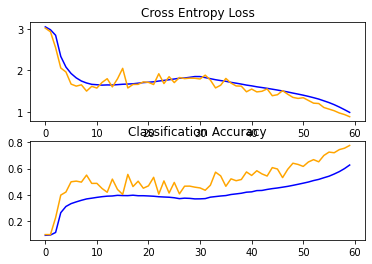

In [ ]:
summarize_diagnostics(history_freekaf)

In [ ]:
rob_freekaf_vgg.save('./rob_freekaf_vgg')
!zip -r rob_freekaf_vgg.zip ./rob_freekaf_vgg
from google.colab import files
files.download('./rob_freekaf_vgg.zip')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ./rob_freekaf_vgg/assets
  adding: rob_freekaf_vgg/ (stored 0%)
  adding: rob_freekaf_vgg/variables/ (stored 0%)
  adding: rob_freekaf_vgg/variables/variables.index (deflated 70%)
  adding: rob_freekaf_vgg/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: rob_freekaf_vgg/assets/ (stored 0%)
  adding: rob_freekaf_vgg/saved_model.pb (deflated 90%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### k-WTA Case


In [ ]:
from activationsf import Kwta
def vgg_kwta_block(x, filters): 

  x = Conv2D(filters, kernel_size=(3, 3),  padding='same', kernel_regularizer = regularizer, kernel_initializer='he_uniform')(x)
  x = BatchNormalization()(x)
  x = Kwta(ratio = 0.30,conv=True) (x)

  x = Conv2D(filters, kernel_size=(3, 3),  padding='same', kernel_regularizer = regularizer, kernel_initializer='he_uniform')(x)
  x = BatchNormalization()(x)
  x = Kwta(ratio = 0.30,conv=True) (x)
  
  return x

In [ ]:
def rob_vgg_kwta():

  input = Input(shape=(32,32,3)) # padded cifar10 images size

  # BLock1
  x = vgg_kwta_block(input, 32)
  x = layers.MaxPooling2D(pool_size=(2,2)) (x)
  x = layers.Dropout(0.2, seed=42) (x)
  
  # Block2
  x = vgg_kwta_block(x, 64)
  x = layers.MaxPooling2D(pool_size=(2,2)) (x)
  x = layers.Dropout(0.25, seed=42) (x)

  # Block3
  x = vgg_kwta_block(x, 128)
  x = layers.MaxPooling2D(pool_size=(2,2)) (x)
  x = layers.Dropout(0.3, seed=42) (x)

  x = tf.keras.layers.Flatten() (x)
  x = layers.Dense(128, activation=None, kernel_regularizer=regularizers.l2(0.0012)) (x)
  x = Kwta(ratio=0.30) (x)
  x = layers.Dropout(0.4, seed=42) (x)
  x = layers.Dense(10, activation='softmax', kernel_regularizer=regularizers.l2(0.0012)) (x)

  model = fbfadvtrain.FastBetterFreeTrainedModel(inputs=input, outputs=x, name='resnet') # Adv. Training 
  #model = Model(inputs=input, outputs=x, name='vgg') # Standard Training

  return model

In [ ]:
# Note: to run this cell you first need to disable mixed-precision policy
BATCH = 128
STEPS_PER_EPOCH = np.ceil(len(x_train) / BATCH)

rob_kwta_vgg = rob_vgg_kwta()
rob_kwta_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

lr_finder = LRFinder(rob_kwta_vgg)
lr_finder.find(train, start_lr=1e-4, end_lr=2, epochs=7,
               steps_per_epoch=STEPS_PER_EPOCH)

Epoch 1/7
391/391 [==============================] - 22s 56ms/step - loss: 5.3356 - sparse_categorical_accuracy: 0.0015
Epoch 2/7
391/391 [==============================] - 22s 56ms/step - loss: 3.2744 - sparse_categorical_accuracy: 0.1003
Epoch 3/7
391/391 [==============================] - 22s 55ms/step - loss: 3.2301 - sparse_categorical_accuracy: 0.1073
Epoch 4/7
391/391 [==============================] - 22s 55ms/step - loss: 3.0815 - sparse_categorical_accuracy: 0.1436
Epoch 5/7
391/391 [==============================] - 22s 56ms/step - loss: 2.8238 - sparse_categorical_accuracy: 0.1926
Epoch 6/7
391/391 [==============================] - 22s 55ms/step - loss: 2.6332 - sparse_categorical_accuracy: 0.2172
Epoch 7/7
391/391 [==============================] - 22s 55ms/step - loss: 2.4289 - sparse_categorical_accuracy: 0.2173


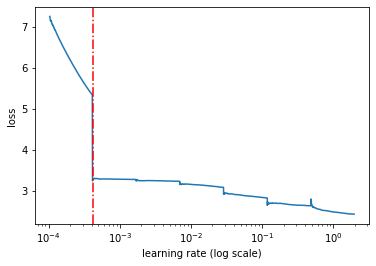

In [ ]:
axs = plot_loss()
axs.axvline(x=lr_finder.get_best_lr(sma=20), c='r', linestyle='-.')

In [ ]:
epochs = 60
step_size = np.ceil((len(x_train) / 128) * (epochs/2))

oclr = tfa.optimizers.TriangularCyclicalLearningRate(initial_learning_rate = 0.0001, maximal_learning_rate = 0.8, step_size = step_size)

rob_kwta_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = oclr),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )
history_kwta = rob_kwta_vgg.fit(x = train, epochs = epochs, batch_size = 128, validation_data = test)

Epoch 1/60
391/391 [==============================] - 23s 60ms/step - loss: 3.8164 - sparse_categorical_accuracy: 0.1063 - val_loss: 3.0740 - val_sparse_categorical_accuracy: 0.1504
Epoch 2/60
391/391 [==============================] - 23s 59ms/step - loss: 2.8970 - sparse_categorical_accuracy: 0.1695 - val_loss: 2.7225 - val_sparse_categorical_accuracy: 0.2347
Epoch 3/60
391/391 [==============================] - 23s 58ms/step - loss: 2.7474 - sparse_categorical_accuracy: 0.2084 - val_loss: 2.6239 - val_sparse_categorical_accuracy: 0.2717
Epoch 4/60
391/391 [==============================] - 23s 59ms/step - loss: 2.6227 - sparse_categorical_accuracy: 0.2270 - val_loss: 2.4296 - val_sparse_categorical_accuracy: 0.3107
Epoch 5/60
391/391 [==============================] - 23s 59ms/step - loss: 2.5053 - sparse_categorical_accuracy: 0.2430 - val_loss: 2.2763 - val_sparse_categorical_accuracy: 0.3326
Epoch 6/60
391/391 [==============================] - 23s 59ms/step - loss: 2.4024 - spars

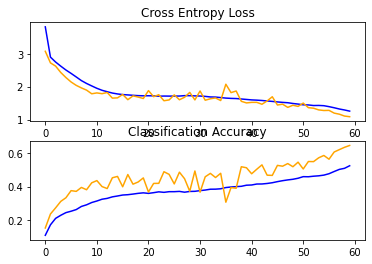

In [ ]:
summarize_diagnostics(history_kwta)

In [ ]:
# Incremental Learning
rob_kwta_vgg.compile(
              optimizer = tf.keras.optimizers.SGD(learning_rate = 0.0005),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics='sparse_categorical_accuracy'
              )

In [ ]:
history_kwta= rob_kwta_vgg.fit(train, epochs = 30, validation_data=(x_test, y_test), callbacks=[activationsf.incremental_learning_withDecreasing_ratio(num_layers=6)])


 Fine tuning: current ratio 0.29 

Epoch 1/30
391/391 [==============================] - 24s 61ms/step - loss: 1.3306 - sparse_categorical_accuracy: 0.4724 - val_loss: 580.2393 - val_sparse_categorical_accuracy: 0.1015
Epoch 2/30
391/391 [==============================] - 23s 59ms/step - loss: 1.2498 - sparse_categorical_accuracy: 0.5308 - val_loss: 578.6555 - val_sparse_categorical_accuracy: 0.1015

 Fine tuning: current ratio 0.28 

Epoch 3/30
391/391 [==============================] - 23s 59ms/step - loss: 1.2489 - sparse_categorical_accuracy: 0.5330 - val_loss: 576.3234 - val_sparse_categorical_accuracy: 0.1015
Epoch 4/30
391/391 [==============================] - 23s 59ms/step - loss: 1.2507 - sparse_categorical_accuracy: 0.5366 - val_loss: 574.6541 - val_sparse_categorical_accuracy: 0.1018

 Fine tuning: current ratio 0.27 

Epoch 5/30
391/391 [==============================] - 23s 59ms/step - loss: 1.2479 - sparse_categorical_accuracy: 0.5390 - val_loss: 573.3177 - val_sparse_c

In [ ]:
rob_kwta_vgg.evaluate(test, batch_size=128)

79/79 [==============================] - 2s 21ms/step - loss: 1.1660 - sparse_categorical_accuracy: 0.6229


[1.1660397052764893, 0.6229000091552734]

In [ ]:
rob_kwta_vgg.save('./rob_kwta_vgg')
!zip -r rob_kwta_vgg.zip ./rob_kwta_vgg
from google.colab import files
files.download('./rob_kwta_vgg.zip')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ./rob_kwta_vgg/assets
  adding: rob_kwta_vgg/ (stored 0%)
  adding: rob_kwta_vgg/variables/ (stored 0%)
  adding: rob_kwta_vgg/variables/variables.index (deflated 68%)
  adding: rob_kwta_vgg/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: rob_kwta_vgg/assets/ (stored 0%)
  adding: rob_kwta_vgg/saved_model.pb (deflated 90%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>